In [22]:
import pandas as pd
import os
import plotly.graph_objects as go




Shapes of data for each scenario

Scenario: A shape (14638, 30)
Scenario: B shape (23505, 30)
Scenario: C shape (32540, 30)
Scenario: D shape (32540, 30)


# Is Tag Extension involved in the performance of scenarios?

In [4]:
from src.utils.tag_containers import *
from src.utils.db import Database
from collections import Counter
from tqdm import tqdm
db = Database()

In [22]:
questions_ra_tags = []
questions_ext_tags = []
q_tags_ra_container = QuestionRATagsContainer()
q_tags_ext_container = QuestionExtendedTagsContainer()
for q in db.all_questions():
    questions_ra_tags += q_tags_ra_container.tag_names_for(q)
    questions_ext_tags += q_tags_ext_container.tag_names_for(q)

### Questions: 
#### Most common tags in questions *NO* extension

In [23]:
questions_ra_tags = Counter(questions_ratags)
questions_ra_tags.most_common(10)

[('ROS', 2776),
 ('kinetic', 2623),
 ('gazebo', 1977),
 ('rviz', 1946),
 ('indigo', 1429),
 ('Kinect', 1421),
 ('turtlebot', 1181),
 ('tf', 1126),
 ('catkin', 1079),
 ('moveit', 1044)]

#### Most common tags in questions *WITH* extension

In [24]:
questions_ext_tags = Counter(questions_ext_tags)
questions_ext_tags.most_common(10)

[('file', 11841),
 ('error', 11828),
 ('get', 11173),
 ('thanks', 10505),
 ('package', 10120),
 ('trying', 9055),
 ('robot', 8616),
 ('following', 8360),
 ('help', 8287),
 ('node', 8041)]

### Users:

In [25]:
users_ra_tags = []
users_ext_tags = []
u_tags_ra_container = UserRATagsContainer()
u_tags_ext_container = UserExtendedTagsContainer()
for q in db.all_questions():
    users_ra_tags += u_tags_ra_container.tag_names_for(q)
    users_ext_tags += u_tags_ext_container.tag_names_for(q)

#### Most common tags in users *NO* extension

In [26]:
users_ra_tags = Counter(users_ra_tags)
users_ra_tags.most_common(10)

[('kinetic', 302),
 ('ROS', 270),
 ('gazebo', 143),
 ('rviz', 139),
 ('indigo', 136),
 ('hydro', 131),
 ('catkin', 100),
 ('moveit', 93),
 ('turtlebot', 89),
 ('navigation', 89)]

#### Most common tags in users WITH extension

In [27]:
users_ext_tags = Counter(users_ext_tags)
users_ext_tags.most_common(10)

[('error', 760),
 ('file', 712),
 ('get', 682),
 ('package', 631),
 ('trying', 619),
 ('thanks', 604),
 ('help', 599),
 ('following', 574),
 ('find', 548),
 ('run', 540)]

In [57]:
# Freq Barchart
import plotly.express as px

def freq_tags_barchart(data,scenario,max_tags,good_or_poor_str):
    df = pd.DataFrame(data[scenario].most_common(max_tags), columns=['tag','freq'])
    fig = px.bar(df, x='tag', y='freq', title='Top {} {} Performance Question Tags (Scenario {})'.format(max_tags,good_or_poor_str,scenario))
    return fig

# Freq Wordcloud
import matplotlib.pyplot as plt
from wordcloud import WordCloud

def wordcloud_for_tags(tags_dict):
    wordcloud = WordCloud(width=800, height=400,max_font_size=50, max_words=250, background_color="white").generate_from_frequencies(tags_dict)
    plt.figure(figsize=(20,10), dpi=90)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.tight_layout(pad=0)
    return plt

## Which tags appear often in questions with GOOD performance?

In [3]:
good_performance_questions = {}
column = 'top 10'
threshold = 0.75

good_tags = {s : [] for s in scenarios.keys()}
for scenario_id, scenario in tqdm(scenarios.items()):
    # all questions with good performance
    good_performance_query = f"`{column}`>={threshold}"
    good_performance_questions[scenario_id] = list(data_all[scenario_id].query(good_performance_query).index)
    
    # all tags in questions with good performance
    for q_id in good_performance_questions[scenario_id]:
        good_tags[scenario_id].extend(scenario.question_tag_container().tag_names_for(q_id))
    
good_tags_cnt = {s : Counter(good_tags[s]) for s in scenarios.keys()}


100%|██████████| 4/4 [05:43<00:00, 62.59s/it]


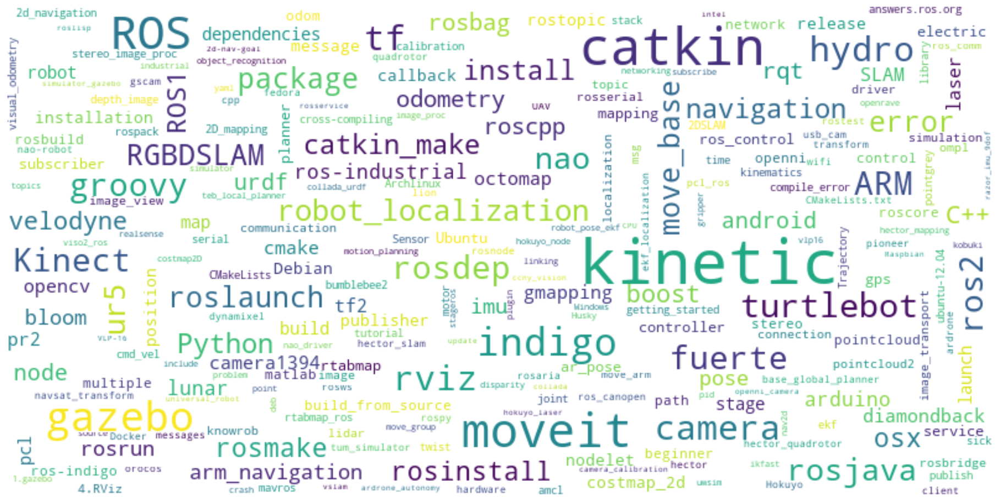

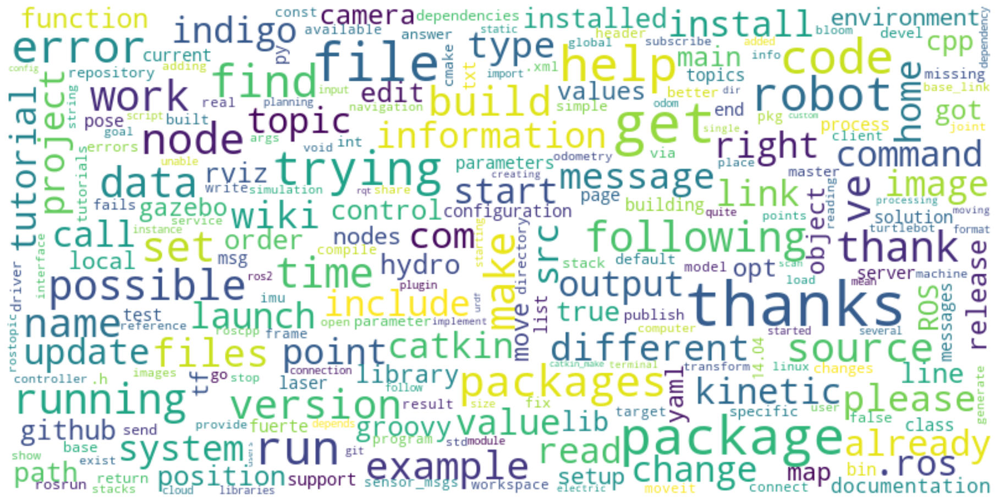

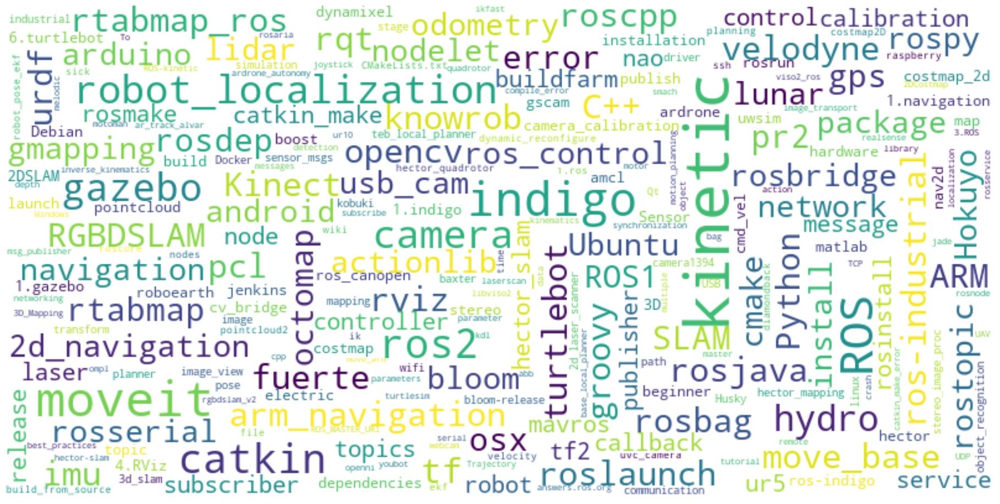

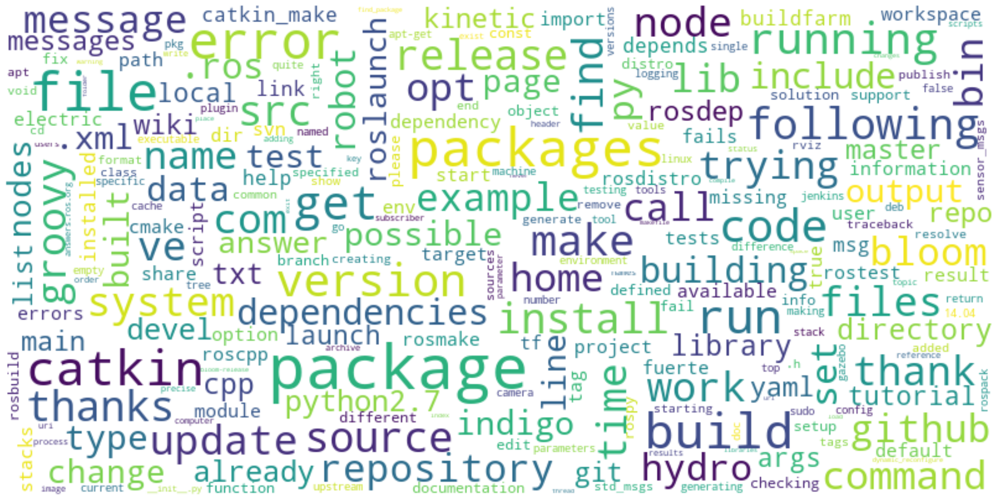

In [155]:
# Printout Wordclouds - Good questions

for scenario, tags in good_tags_cnt.items():
    wordcloud_for_tags(tags).savefig('tags_good_peformance_'+scenario+'.png', facecolor='k', bbox_inches='tight')
#wordcloud_for_tags(good_tags_cnt['C']).show()
#plt.savefig('{}.png'.format(filename), facecolor='k', bbox_inches='tight')

In [52]:
freq_tags_barchart(good_tags_cnt,'A',100,'Good')

In [53]:
freq_tags_barchart(good_tags_cnt,'B',100,'Good')

In [54]:
freq_tags_barchart(good_tags_cnt,'C',100,'Good')

In [55]:
freq_tags_barchart(good_tags_cnt,'D',100,'Good')

## Which tags appear often in questions with BAD performance?

In [4]:
bad_performance_questions = {}
column = 'top 60'
threshold = 0.20

bad_tags = {s : [] for s in scenarios.keys()}
for scenario_id, scenario in tqdm(scenarios.items()):
    # all questions with bad performance
    bad_performance_query = f"`{column}`<={threshold}"
    bad_performance_questions[scenario_id] = list(data_all[scenario_id].query(bad_performance_query).index)
    
    # all tags in questions with good performance
    for q_id in bad_performance_questions[scenario_id]:
        bad_tags[scenario_id].extend(scenario.question_tag_container().tag_names_for(q_id))


bad_tags_cnt = {s : Counter(bad_tags[s]) for s in scenarios.keys()}      

  0%|          | 0/4 [00:00<?, ?it/s]

113386
['NXT', 'hydro', 'moveit']
108176
['roscpp']
221329
['turtlebot', 'gazeboRviz']
12068
['Kinect', 'rosbag', 'topic']
260796
['roslaunch']
35684
[]
12628
['parameter', 'param_server', 'yaml-cpp']
11375
['costmap']
11794
['rospy', 'Python']
63193
['tf', 'rosbag', 'transform', 'lookupTransform']
11639
['rospack']
32875
['rosdep', 'fuerte', 'missing']
31491
[]
10397
['nvidia', 'bumblebee', 'laptop', 'optimus']
45251
['tf', 'tf_tutorial']
31779
['ROS', 'messages', 'ros-electric', 'msg']
158001
['rosinstall', 'Ubuntu.ubuntu1404.rosinstall']
9915
['Kinect', 'multi_machine']
204382
['turtlebot', 'frontier_exploration', 'unbouded_exploration']
36743
['map', '2d', 'octomap']
125856
['rviz', 'groovy', 'openni_launch']
9845
['navigation', 'move_base']
54857
[]
61872
[]
90586
[]
160611
['Kinect', 'openni', 'ROS']
45554
[]
228823
['rviz', 'ROS', 'ros_indigo', 'using_markers', 'beginner_tutorials']
44821
[]
67488
['groovy', 'catkin', 'roslaunch']
119286
['ROS']
152276
['catkin', 'roscpp']
21129

['turtlebot']
31704
['simulation', 'turtlebot_navigation', 'turtlebot_calibration']
44038
[]
82931
['rosrun', 'static_transform_publisher']
60346
['nodes']
222964
['rosserial', 'arduino', 'memory', 'magnetometer']
54519
[]
261851
['gazebo']
41279
['rosserial_arduino']
65967
['ROS_MASTER_URI', 'ROS_HOSTNAME']
104451
['beginner', 'beginner_tutorials']
250897
['urdf-xacro-jade-deprecated-namespace']
237183
['ROS', 'catkin', 'compilation']
199027
['odometry', 'arduino']
271039
['1.ros.ubuntu-14.04.03.ros']
78086
['object_recognition', 'object_recognition_capture']
32986
['openni', 'openni_camera']
202771
['robot_navigation', 'teleoperation', 'teleop_twist_keyboard']
58651
['base_local_planner']
11620
['usb_cam']
73258
[]
82421
[]
58410
[]
294056
['indigo']
71857
['tf']
69574
['differential_drive']
216204
['urdf', 'world']
27581
[]
51227
['beginner']
271539
['robot_localization']
60599
[]
193197
['rosspawn', 'runtime', 'roslauch']
12028
['navigation', 'amcl']
59631
[]
274110
['rviz', 'tf', 

['robot_localization']
224979
['laser_scan_matcher']
223912
['robot_localization']
69433
['ROS', 'hydro', 'Ubuntu12.04']
213173
['SLAM']
235199
['ROS', 'kinetic', 'Kame']
253881
['travis-ci', 'unittesting']
45770
['turtlesim', 'turtle_tf', 'turtlesim_node', 'tf_tutorial']
83246
[]
113321
[]
10048
['node']
249759
['schunk_canopen_driver']
67533
[]
101976
[]
173873
['Kinect', 'calibration', 'asus_xtion_pro_live']
65202
[]
93856
[]
230247
['cmake_check_build_system']
202488
['interactive_markers']
243040
['ros-indigo-ros-controllers', 'error-installation']
206988
['camera_calibration']
188446
['msg']
201193
['topics']
45425
[]
10522
[]
250338
['beginner']
229336
['Arduino#ROS#Raspberry']
62295
[]
37220
['gazebo', 'fuerte', 'care-o-bot']
52115
[]
44818
['gazebo', 'fuerte']
214328
['rosrun']
12406
['error']
121151
[]
74419
[]
191647
['indigo', 'xv_11_laser_driver']
149501
['ROS', 'hydro', 'Ubuntu', '12.04']
11570
['multiplemachines', 'time']
44705
[]
220109
['rosdep']
265001
['ros-kinetic-r

 25%|██▌       | 1/4 [00:02<00:06,  2.09s/it]

258854
['differential_drive']
279493
['full-install#ros#4.ubuntu-16.04ction']
222242
['rviz', 'nao', 'model']
61288
[]
213060
['interactive_markers']
63461
[]
29602
['base_local_planner']
186793
['urdf', 'SDF', 'gzsdf']
198294
['camera_calibration']
139036
['pose.pose.orientation']
120626
[]
81081
['rosbuild', 'undefined_reference']
87221
['callback']
73228
[]
187016
['trusty', 'ubuntuarm', 'raring', 'repositories']
65227
[]
212186
['imu_filter_madgwick', 'accelerometer', 'acceleration', 'drift', 'phidgets_ros']
51625
[]
255152
['point_cloud', 'iai_kinect2', 'ros_hydro', 'hydro#ros#turtlebot#rviz#kinect']
9738
['rviz', 'tf', 'navigation', 'amcl']
65404
[]
42982
[]
55050
[]
285670
['kinetic']
58978
['household_objects_database']
224744
['catkin']
194661
['catkin_package', 'rosdep-install']
220288
['rosjava']
245891
['Sensor']
252667
['build']
261733
['tf', 'tf2', 'robot_localization']
54621
[]
208127
['hydro', 'indigo']
259852
['raspicam_node', 'raspberry_pi3', 'kinect-raspberry']
11338

193017
['imu', 'odometry', 'transform', 'node', 'orientation', 'data', 'help', 'motion', 'robot', 'acceleration', 'tracking', 'xsens', 'velocity', 'linear', 'angular', 'accuracy', 'improve']
11639
['rospack', 'update', 'roscreate-pkg', 'environment', 'warning', 'current', 'directory', 'variable', 'please']
100871
['error', 'groovy', 'subscriber', 'boost', 'pr2', 'code', 'moveit', 'include', 'subscribe', 'callback', 'msg', 'compile', 'string', 'cpp', 'class', 'nodehandle', 'const', 'template', 'matching', 'method', 'function', 'node_handle', 'shared_ptr', 'move_group', '.h', 'call', 'member', 'state', 'type', 'opt', 'src', 'home', 'following', 'moveit_msgs', 'handle', 'overloaded', 'velocities', 'signature', 'unresolved', 'char', 'void', 'int', 'got', 'moveit_ros', 'positions', 'pr2_controllers_msgs', 'r_arm_controller']
32875
['package', 'rosmake', 'rosdep', 'rosinstall', 'install', 'fuerte', 'rosbag', 'roslaunch', 'roscore', 'dependencies', 'rosparam', 'rosmaster', 'roswtf', 'rosws', 

66956
['imu', 'pcl', 'code', 'obstacle', 'laser', 'distance', 'help', 'point', 'platform', 'find', 'object', 'scans', 'detection', 'order', 'encoders', 'range', 'extract', 'implement', 'line', 'minimum', 'methods', 'straight', 'implementation', 'random', 'detect', 'several', 'wall', 'lines', 'thanks', 'high']
54857
[]
61872
[]
168156
['error', 'gazebo', 'tutorials', 'urdf', 'indigo', 'install', 'rospack', 'message', 'code', 'apt-get', 'service', 'data', 'process', 'logs', 'crash', 'xml', 'robot', 'script', 'hector', 'find', 'spawn_model', 'model', 'forward', 'rosrun', 'karma', 'loading', 'file', 'pid', 'sudo', 'spawn', 'spawning', 'gazebo_ros', 'baxter', 'empty', 'info', 'lib', '14.04', 'starting', 'empty_world', 'call', '.world', 'ros-indigo', 'waiting', '2.2', '1.9', 'exit', 'opt', 'home', 'via', 'spawn_urdf_model', 'transport', 'worlds', 'gazebosim', 'receive', 'unable', 'links', 'cmd', 'gzserver', 've', 'calling', 'enough', 'sender', 'started']
74899
['turtlebot', 'error', 'package

50763
['gps', 'topic', 'distance', 'data', 'help', 'msg', 'convert', 'position', 'gps_common', 'example', 'coordinates', 'lat-long', 'fix', 'converting', 'latitude', 'longitude', 'thanks', 'negative', 'formatting', 'south', 'long']
56660
['gazebo', 'simulator', 'groovy', 'roslaunch', 'simulator_gazebo', 'gazebo_worlds', 'rosdistro', 'build', 'source', 'rosout', 'logging', 'service', 'ubuntu-12.04', 'nodes', 'process', 'interrupt', 'multi-robot', '.launch', 'stacks', 'parameters', 'version', '12.04', 'update', 'msg', 'rosversion', 'convert', 'hang', 'server', 'deprecated', 'setting', 'use_sim_time', 'value', 'set', 'file', 'pid', 'tool', 'run', 'empty', 'core', 'files', 'info', 'gzsdf', 'master', 'ctrl-c', 'localhost', 'run_id', '1.2', 'starting', 'empty_world', '.world', 'waiting', '3.0', 'license', 'warning', 'auto', 'stuck', 'directory', 'opt', 'home', 'worlds', 'gazebosim', 'parser', 'converting', 'please', 'hangs', 'checking', 'public', 'started', 'set_physics_properties']
50346
['

10651
['gmapping', 'error', 'slam_gmapping', 'rosbag', 'map', 'wiki', 'laserscan', 'tutorial', 'bag', 'time', '.ros', 'file', 'fatal', 'range', 'info', 'troubleshooting', 'play', 'building', 'dual', 'following', 'opening', 'get', 'bit', 'thanks', 'named']
69019
['rviz', 'map', 'topic', 'point', 'msg', 'output', 'position', 'rivz', 'mouse', 'click', 'get', 'area']
208382
['rospy', 'roscpp', 'make', 'cpp', 'program', 'learn']
9704
['imu', 'imu_drivers', 'driver', 'microstrain', 'protocol', 'gx3', 'supported', 'microstrain_3dmg_imu']
41766
['error', 'gazebo', 'simulator', 'simulation', 'urdf', 'fuerte', 'xacro', 'message', 'launch', 'process', 'robot', 'version', '12.04', 'structure', 'rosrun', 'drop', 'deprecated', 'parallel', 'SDF', 'command', 'hand', 'tool', 'robots', 'bug', '64-bit', 'broken', 'print', 'files', 'feedback', 'support', 'gzsdf', '.xml', 'running', 'call', 'users', 'line', 'willowgarage', 'fixed', 'user', 'put', 'provide', 'fix', 'old', 'get', 'separate', 'work', 'descrip

10172
['rviz', 'navigation', 'urdf', 'robot', 'display', 'tools', 'model', 'custom', 'sensors', 'set', 'sonar', 'heading', 'direction', 'show', 'several', 'sonars', 'sharp']
10845
['actionlib', 'action', 'goal', 'server', 'command', 'interface', 'actionserver', 'call', 'line', 'easy']
203119
['rviz', 'error', 'hardware', 'urdf', 'indigo', 'install', 'fuerte', 'roslaunch', 'collada', 'visualization', 'limits', 'kinematics', 'openrave', 'joint', 'moveit', 'ikfast', 'git', 'ik', 'kdl', 'bullet', 'configuration', 'robot', '.launch', 'tutorial', 'demo', 'find', 'version', 'crashing', 'chain', 'nao', 'make', 'dynamics', 'cpp', 'initialize', 'collada_urdf', 'urdf_to_collada', 'mimic', 'rosrun', 'repository', 'nao_robot', 'name', 'plugin', 'application', 'command', 'value', 'share', 'file', 'project', 'angle', 'group', 'translation', 'conversion', 'matrix', 'run', 'info', 'interface', 'constraints', 'running', '14.04', '.h', 'instructions', 'ode', 'installing', 'distro', 'due', 'nao_descriptio

132946
['hydro', 'map', 'exception', 'packages', 'global', 'data', 'button', '12.04', 'rqt', 'topics', 'output', 'rosrun', 'qt_gui', 'import', 'name', 'loading', 'plugin', 'command', 'graph', 'file', 'rosgraph', 'test', 'window', 'run', 'empty', 'python2.7', 'files', 'lib', 'self', 'rqt_graph', 'call', 'nameerror', 'line', 'ascii', 'opt', 'return', 'ignore', 'pydot', 'traceback', 'true', 'qt_dotgraph', 'possible', 'thanks', 'dot_parser', 'defined', 'py']
115396
['turtlebot', 'tf', 'navigation', 'gazebo', 'image', 'urdf', 'nodelet', 'xacro', 'camera', 'scan', 'laser', 'node', 'launch', 'include', 'odom', 'depth', 'world', 'roomba', 'kobuki', 'base_footprint', 'tf_prefix', 'tf_tree', 'robot', '.launch', 'manager', 'stacks', 'robot_description', 'multi', 'find', 'spawn_model', 'model', 'remap', 'string', 'output', 'start', 'name', 'velocity', 'connect', 'command', 'use_sim_time', 'value', 'asus_xtion_pro', 'file', 'group', 'ns', 'robots', 'gazebo_ros', 'empty', 'fake', '.xml', 'param', 'l

['rospy', 'Python', 'subscriber', 'publisher', 'array', 'examples']
12175
['error', 'package', 'ros_electric', 'dependencies', 'wiki', 'source', 'include', 'svn', 'compilation', 'ros-electric', 'tabletop_object_perception', 'binary', '.ros', 'file', 'files', 'errors', '.h', 'installing', 'shape', 'directory', 'get', 'sources', 'trying', 'available', 'unresolved', 'motion_planning_common', 'tabletop_object_detector', 'geometric_shapes_msgs', 'entire']
250727
['system', 'error', 'package', 'kinetic', 'install', 'catkin', 'cmake', 'boost', 'wiki', 'release', 'build', 'workspace', 'point', 'configuration', 'filesystem', 'names', 'find', 'version', 'raspberry', 'processing', 'pi', '.ros', 'file', 'project', 'libraries', 'env.sh', 'software', 'compiler', 'edit', 'geometric_shapes', 'eigen3', 'read', 'building', 'rosberrypi', 'installing', 'find_package', 'makefiles', 'config', 'directory', 'opt', 'src', 'creating', 'home', 'following', 'cmakelist.txt', 'txt', 'fix', 'env', 'large', 'envirome

65808
[]
262574
['error', 'tutorials', 'turtlesim', 'beginner', 'roscore', 'wiki', 'rosnode', 'tutorial', 'display', 'rosrun', 'connect', 'bash', '.ros', 'command', 'connection', 'turtlesim_node', 'core', 'running', 'dumped', 'following', 'aborted', 'get', 'installed', 'thanks', 'qxcb', 'qxcbconnection']
252763
['subscriber', 'boost', 'topic', 'rate', 'std_msgs', 'subscribe', 'data', 'callback', 'msg', 'spin', 'listener', 'class', 'nodehandle', 'missing', 'example', 'const', 'loop', 'sleep', 'function', 'variables', 'init', 'return', 'main', 'double', 'thank', 'char', 'better', 'loop_rate', 'void', 'float32multiarray', 'int', 'public', 'cout']
252515
['tf', 'error', 'package', 'indigo', 'Python', 'build', 'xv_11_laser_driver', 'code', 'laser', 'node', 'launch', 'include', 'point', 'path', 'xml', '.launch', 'stacks', 'find', 'version', 'update', 'make', 'output', 'port', 'pi', 'name', 'value', 'share', 'file', 'brickpi', 'run', '.xml', 'param', 'running', 'errors', 'github', 'screen', '

202787
['rospy', 'answers.ros.org', 'Python', 'subscriber', 'documentation', 'messages', 'sensor_msgs', 'packages', 'pcl_ros', 'code', 'scan', 'topic', 'pointcloud2', 'laserscan', 'node', 'lidar', 'data', 'math', 'point', 'cloud', 'pcl_conversions', 'msg', 'format', 'class', 'laser_geometry', 'binary', 'import', 'numpy', 'points', 'print', 'extract', 'self', 'base_scan', 'coordinates', 'transformation', 'subscribed', 'random', 'trying', 'scan_topic', 'thank', 've', 'got']
39962
['tf', 'error', 'fuerte', 'roslaunch', 'roscore', 'serial', 'rosdistro', 'rosout', 'logging', 'rostopic', 'ros_comm', 'joystick', 'launch', 'service', 'nodes', 'help', 'process', 'base_controller', 'interrupt', 'robot', 'pioneer', 'p2os', '.launch', 'teleop', 'parameters', 'joy', 'pose', 'version', 'rosversion', 'port', 'rosrun', 'diagnostics', 'cmd_vel', 'yaw', 'server', 'setting', 'pr2_teleop', 'command', 'connection', 'file', 'pid', 'p2os_driver', 'sonar', 'p3at', 'move', 'p2os_teleop', 'run', 'motor', 'core'

211985
['gmapping', 'tf', 'error', 'odometry', 'rosparam', 'scan', 'laser', 'transform', 'node', 'launch', 'world', 'data', 'process', '.launch', 'initial', 'frame', 'string', 'output', 'bag', 'time', 'name', 'use_sim_time', 'value', 'strange', 'file', 'pid', 'link', 'base_link', 'info', 'fake', 'matching', 'param', 'static', 'extrapolation', 'starting', 'screen', 'png', 'base', 'type', 'bool', 'pkg', 'false', 'fixed_frame', 'get', 'com', 'lookup', 'better', 'fov', 'warn', 'base_frame', 'laser_scan_matcher', 'started']
68143
['Kinect', 'gmapping', 'error', 'openni_camera', 'answers.ros.org', 'slam_gmapping', 'image', 'fuerte', 'pcl', 'nodelet', 'pointcloud', 'camera', 'image_view', 'image_proc', 'code', 'driver', 'laserscan', 'node', 'launch', 'service', 'depth', 'process', 'stereo_image_proc', 'cloud', 'disparity', 'stacks', 'exist', 'passthrough', 'crop_decimate', 'class', 'point_cloud', 'threads', 'plugin', 'depth_image_proc', 'advertise', 'points', 'debayer', 'file', 'root', 'pid',

276472
['navigation', 'error', 'move_base', 'map', 'topic_tools', 'rosparam', 'costmap_2d', 'global_costmap', 'dwa_local_planner', 'planner', 'local_costmap', 'global_planner', 'obstacle_layer', 'global', 'obstacle', 'laser', '2d', 'node', 'launch', 'path', 'robot', 'parameters', 'find', 'teb_local_planner', 'output', 'static_map', 'yaml', 'cmd_vel', 'resolution', 'start', 'name', 'velocity', 'command', 'value', 'file', 'plugins', '2.0', 'ns', 'move', 'run', 'base_link', 'sim_time', 'info', 'master', 'sbpl_lattice_planner', 'param', 'load', 'picture', 'local', 'screen', 'height', 'type', 'auto', 'respawn', 'stuck', 'pkg', 'nav_stack', 'rolling_window', 'following', 'plan', 'false', 'put', 'avoid', 'args', 'fails', 'static_layer', 'default', 'true', 'publish_frequency', 'changing', 'ros_navigation', 'relay', 'warn', 'inflation_layer', 'width', 'thanks', 'raytrace_range', 'already', 'got', 'global_frame', 'facing', 'enabled', 'base_local_planner', 'recovery_behaviors', 'update_frequency'

10744
['rviz', 'error', 'ogre', 'exception', 'build', 'code', 'segmentation', 'display', 'cpp', 'rosrun', 'loading', 'buffer', 'files', 'info', 'fault', 'display_config', 'general', 'line', 'config', 'src', 'home', 'ideas', 'caught', 'thanks', 'gl', 'visualization_common']
12427
['gmapping', 'rviz', 'navigation', 'slam_gmapping', 'odometry', 'map', 'stack', 'mapping', 'Hokuyo', 'data', 'robot', 'update', 'time', 'p3dx', 'parallel', 'move', 'range', 'example', 'place', 'urg', 'line', 'hard', 'fix', 'straight', 'walk', 'right', 'long', 'finding']
273384
['beginner', 'point', 'robot', 'initial', 'make', 'cmd_vel', 'space', 'velocity', 'twist', 'position', 'set', 'kinematic', 'move', 'example', 'linear', 'angular', 'go']
53394
['message', 'topic', 'publisher', 'node', 'frequency', 'callback', 'publish', 'find', 'topics', 'command', 'online', 'writing', 'write', 'subscribed', 'trying', 'different', 've', 'thanks']
47954
['error', 'tutorials', 'turtlesim', 'beginner', 'export', 'rosnode', 'r

102276
[]
206261
['turtlebot', 'networking', 'web', 'design', 'find', 'start', 'html', 'robots', 'computer', 'robotics', 'php', 'suggestion', 'trying', 'degree', 'nc', 'learn_turtlebot_index']
187313
['tf', 'system', 'error', 'package', 'hydro', 'catkin', 'roscpp', 'move_base', 'boost', 'exception', 'export', 'catkin_make', 'costmap_2d', 'code', 'planner', 'pluginlib', 'launch', 'include', 'ompl', 'path', 'nav_core', 'xml', 'geometry_msgs', 'names', 'RRT', 'library', 'version', 'thread', 'make', 'string', 'cpp', 'catkin_package', 'class', 'angles', 'nav_msgs', 'name', 'plugin', 'set', 'file', 'project', 'libraries', 'fatal', 'consistent', 'eigen_conversions', 'lib', 'built', 'algorithm', '.xml', 'run_depend', 'build_depend', 'running', 'load', 'undefined', 'errors', 'registered', 'symbol', 'implement', 'find_package', 'license', 'warning', 'prefix', 'type', 'macro', 'src', 'home', 'grid', 'catkin_ws', 'following', 'follow', 'devel', 'number', 'get', 'depends', 'implementation', '.so', 

12632
['tf', 'openni_kinect', 'system', 'error', 'install', 'installation', 'wiki', 'build', 'electric', 'help', 'stacks', 'nao', 'make', 'compile', 'cpp', 'oneiric', 'object', 'start', 'depth_image_proc', '.ros', 'depth_image', 'const', 'dir', '11.10', 'function', 'nodelets', 'states', 'building', 'member', 'installing', 'current', 'directory', 'src', 'home', 'specific', 'get', 'register', 'desktop', 'work', 'installed', 'scope', 'void', 'started']
33041
['turtlesim', 'simulation', 'fuerte', 'messages', 'rostopic', 'topic', 'node', 'tutorial', 'pose', 'turtle', 'output', 'rosrun', 'name', 'command', 'value', 'set', '2.0', 'echo', 'location', 'origin', 'spawning', 'angular_velocity', 'window', 'turtlesim_node', 'empty', 'info', 'gtk', 'starting', 'linear', 'turtle_teleop_key', 'theta', 'coordinates', 'angular', 'line', 'current', 'hard', 'following', 'arrow', 'unfortunately', 'unable', 'change', 'end', 'linear_velocity', 'theme', 'detect', 'right', 'keys', 'turtle1']
10027
['ROS', 'wil

165396
['error', 'package', 'image', 'hydro', 'install', 'catkin', 'roscpp', 'camera', 'serial', 'build', 'record', 'segmentation', 'arduino', 'node', 'vision', 'include', 'data', 'crash', 'button', 'parameters', 'embedded', 'version', '12.04', 'processing', 'convert', 'terminal', 'cpp', 'linux', 'catkin_package', 'tracking', 'connect', 'normal', 'libusb', 'position', 'colors', 'file', 'overview', 'x86_64', 'project', 'libraries', 'link', 'qt5', 'qt4', 'empty', 'common', 'software', 'lib', 'runtime', 'fault', 'relative', '.xml', 'run_depend', 'build_depend', 'link_directories', 'linked', 'building', 'host', 'find_package', 'src', 'x64', 'folder', 'size', 'click', 'device', 'blob', 'blobtracking', 'blobs', 'follow', 'dev', 'Pixy', 'qt_build', 'unable', 'ui', 'get', 'change', '.so', 'parts', 'trying', 'different', 'interact', 'detected', 'add_library', 'folders', 'right', 'fast', 'course', 'destination', 'targets', 'qtgui', 'gnu', 'target_link_libraries', 'comments', 'include_directories

10435
['turtlebot', 'power', 'error', 'install', 'ARM', 'BeagleBoard', 'index', 'release', 'source', 'packages', 'laptop', 'find', 'processing', 'binary', 'download', '.ros', 'file', 'list', 'files', 'software', 'armel', 'installing', 'implement', 'old', 'main', 'unable', 'sources', 'trying', 'fetch', 'installed', 'malformed', 'high']
55082
[]
52773
['error', 'package', 'rosbag', 'record', 'node', 'launch', 'subscribe', 'path', 'parameters', 'find', 'topics', 'linking', 'name', 'command', 'launch_file', 'file', 'relative', 'find_package', 'type', 'pkg', 'args', 'get', 'work', 'trying', 'statement', 'absolute', 'named', 'specify']
188584
['tf', 'hydro', 'odometry', 'framework', 'camera', 'packages', 'laptop', 'xtion', 'topic', 'rgb', 'frequency', 'platform', 'pose', 'embedded', '12.04', 'processing', 'command', 'openni2', 'asus', 'tree', 'fovis_ros', 'test', 'slow', 'echo', 'computer', 'running', 'line', 'libfovis', 'image_rect_color', 'get', 'low', 'trying', 'i7', 'mav', 'possible', 'h

206828
['error', 'package', 'indigo', 'install', 'catkin', 'installation', 'cmake', 'help', 'configuration', 'names', 'find', 'set', 'share', 'file', 'libpointmatcher', 'files', 'find_package', 'prefix', 'config', 'directory', 'opt', 'following', 'branch', 'separate', 'ethzasl_icp_mapping', 'trying', 'installed']
64401
['install', 'source', 'ros-groovy', 'project', 'beaglebone', 'installing', '13.04', 'article', 'work', 'installed']
209181
['imu', 'ROS', 'drivers', 'gps', 'driver', 'parameters', 'find', 'topics', 'rosrun', 'command', 'arguments', 'sensors', 'github', 'device', 'fix', 'information', 'com', 'nav', 'thanks', 'published']
61377
['navigation', 'error', 'cmake', 'move_base', 'exception', 'rosbuild', 'stack', 'release', 'build', 'messages', '2d_navigation', 'code', 'services', 'dwa_local_planner', 'planner', 'node', 'include', 'help', 'path', 'nav_core', '.launch', 'exist', 'library', 'debug', 'version', 'thread', 'string', 'output', 'cpp', 'class', 'yaml', 'ros_root', 'name'

206099
['package', 'ROS', 'configuration', 'control', 'ardrone', '2.0', 'autonomy', 'bebop_autonomy', 'parrot', 'Bebop', 'ardone_autonomy', 'specific', 'change', 'work', 'thank']
32441
['tf', 'camera', 'build', 'RGBDSLAM', 'transform', 'launch', 'single', 'openni_node', 'octomap', 'octomap_server', '.launch', 'kinects', 'model', 'time', 'server', 'run', 'files', 'loop', 'running', 'static', 'due', 'cameras', 'trying', 'different', 'restart', 'area', 'simultaneously', 'send', 'answer', 'kinect_frames', 'kinect_frames.launch']
246448
['gazebo', 'tutorials', 'simulation', 'urdf', 'geometry', 'messages', 'rostopic', 'code', 'topic', 'people', 'joint', 'laser', 'obstacles', 'world', 'help', 'planning', 'point', 'collision', 'path', 'model', 'axis', 'basic', 'format', 'array', 'simple', 'name', 'plugin', 'gazebo_msgs', 'value', 'sensors', 'bumper', 'test', 'project', 'link', 'echo', 'bumpers', 'origin', 'empty', 'robotics', 'effort', 'contact', 'inertial', 'inertia', 'reference', 'states', '

56275
['boost', 'wiki', 'topic', 'node', 'point', 'publish', 'multi', 'thread', '.ros', 'advertise', 'publishing', 'move', 'example', 'multithreading', 'threading', 'call', 'suggestions', 'main', 'worker', 'separate', 'handle', 'safe', 'clear', 'results']
239491
['package', 'answers.ros.org', 'kinetic', 'install', 'wiki', 'index', 'source', 'dependency', 'packages', 'apt-get', 'xenial', 'update', 'apt', 'linux', 'fail', 'estimation', 'download', 'network', '.ros', 'tree', 'set', 'file', 'sudo', 'translation', '16.04', 'list', 'files', 'locate', 'instructions', 'building', 'installing', 'state', 'person', 'i386', 'imported', 'following', 'key', 'old', 'main', 'reading', 'information', 'repositories', 'unable', 'get', 'sources', 'com', 'authentication', 'security', 'different', 'fetch', 'duplicate', 'archive', 'builder', 'keyserver', 'right', 'configured', 'keys', 'clear', 'pool', 'err', 'got', 'answer', 'public', 'updates', 'ros-kinetic-desktop-full']
214893
['package', 'serial', 'depen

278621
['rviz', 'system', 'error', 'kinetic', 'data', 'help', 'find', '4.RViz', '16.04', 'status', 'read', 'show', 'invalid', 'length', 'thanks']
54924
[]
174114
['turtlebot', 'tf', 'turtlebot_bringup', 'error', 'move_base', 'map', 'amcl', 'map_server', 'scan', 'costmap', 'global_costmap', 'local_costmap', 'transform', 'node', 'launch', 'single', 'include', 'odom', 'parameter', 'namespace', 'base_footprint', 'tf_prefix', '.launch', 'parameters', 'find', 'version', 'topics', 'yaml', 'server', 'name', 'value', 'order', 'minimal', 'file', 'group', 'ns', 'robots', 'run', '.xml', 'param', 'running', 'call', 'arg', 'waiting', 'prefix', 'type', 'frame_id', 'turtlebot_navigation', 'pkg', 'following', 'false', 'args', 'forever', '3dsensor', 'get', 'change', 'trying', 'scan_topic', 'default', 'mobile_base', 'amcl_demo', 'available', 'warn', 'published', 'changes', 'odom_frame', 'includes', 'relevant', 'base_frame', 'depth_registration', 'seconds']
241386
['navigation', 'error', 'indigo', 'catkin

10006
['Kinect', 'rviz', 'openni', 'openni_camera', 'image', 'camera', 'rxgraph', 'webcam', 'driver', 'node', 'launch', 'depth', 'rgb', 'nodes', 'process', 'kill', 'configuration', '.launch', 'kinects', 'display', 'topics', 'karma', 'images', 'connect', 'application', 'primesense', 'set', 'files', 'read', 'image_raw', 'cameras', 'following', 'show', 'open', 'get', 'work', 'bit', 'connecting', 'trying', 'upload', 'different', 'several', 'close', 'restart', 'big', 'connected', 'enough', 'screenshot', 'displayed', 'trouble', 'viewing']
54437
[]
216005
['error', 'rosdep', 'hydro', 'indigo', 'Ubuntu', 'fuerte', 'groovy', 'osx', 'index', 'homebrew', 'rosdistro', 'source', 'packages', 'service', 'data', 'help', 'process', 'precise', 'version', '12.04', 'update', 'apt', 'yaml', 'name', 'loading', 'armhf', 'sudo', 'beaglebone', 'run', 'armv7', 'list', 'policy', 'lib', 'master', 'status', 'cache', 'running', 'errors', 'os', 'BeagleBoneBlack', 'rosdep-update', 'github', 'raw', 'installing', 'dist

231804
['rviz', 'error', 'gazebo', 'package', 'indigo', 'roslaunch', 'setup.bash', 'catkin_make', 'rosdistro', 'source', 'rosout', 'logging', 'limits', 'node', 'launch', 'service', 'world', 'nodes', 'process', 'controller', 'interrupt', 'xml', 'tf_prefix', '.launch', 'parameters', 'pose', 'robot_description', 'version', 'rosversion', 'spawn_model', 'terminal', 'ground_truth', 'rosrun', 'yaw', 'server', 'twist', 'normal', 'command', 'use_sim_time', 'file', '2.0', 'hector_quadrotor', 'pid', 'gazebo_ros', 'run', 'motor', 'base_link', 'force', 'core', 'torque', 'locate', 'ctrl-c', 'localhost', 'running', 'gzclient', 'linear', '3.0', 'angular', 'state', 'type', 'directory', 'frame_id', 'home', 'catkin_ws', 'devel', 'opening', 'message_to_tf', 'cd', 'true', 'publish_frequency', 'gzserver', 'checking', 'spawner', 'robot_state_publisher', 'controller_manager', 'started', 'hector_quadrotor_demo', '5.0', 'controller_spawner']
42818
['error', 'package', 'turtlesim', 'rosdep', 'install', 'fuerte',

9396
['rosbag', 'rostopic', 'record', 'topic', 'data', 'topics', 'bag', 'rosbag_filter', 'name', 'file', 'example', 'rename']
63370
[]
212319
['rviz', 'error', 'beginner', 'image', 'indigo', 'ogre', 'mesh', 'nvidia', 'pcd', 'stereo', 'wiki', 'source', 'segfault', 'segmentation', 'opengl', 'skeleton', 'filesystem', 'library', 'version', 'pic', 'linux', 'rosrun', 'loading', 'plugin', '.ros', 'jpg', 'jpeg', 'set', 'group', 'jetson_tk1', 'jetson', 'run', 'info', 'common', 'lib', 'codec', 'troubleshooting', 'fault', 'copy', 'environment', 'light', 'free', 'dds', 'tk1', 'running', 'registered', 'resource', 'raw', 'installing', 'program', 'general', 'png', 'type', 'material', 'creating', 'methods', 'cut', 'article', 'open', 'variable', 'pgm', 'archive', 'installed', 'rendering', 'pbm', 'panel', '1.8.1', 'bitmap', 'bmp', 'tegra', 'supported', 'gl', 'gif', 'ppm', 'subsystem']
10163
['install', 'opencv', 'diamondback', 'framework', 'webcam', 'packages', 'web', 'code', 'vision', 'stacks', 'librar

29790
['robot', 'platform', 'output', 'linux', 'class', 'communication', 'machine', 'protocol', 'list', 'robotics', 'support', 'software', 'jaguar', 'dr_robot', 'indoor', 'outdoor', 'raw', 'creating', 'hard', 'wheel', 'number', 'platforms', 'already', 'trouble', 'manufacturer', 'bindings']
72022
['turtlebot', 'error', 'openni', 'openni_camera', 'image', 'groovy', 'roslaunch', 'camera', 'wiki', 'ros.org', 'xtion', 'openni.launch', 'service', 'depth', 'nodes', 'process', '.launch', 'openni_launch', 'ros-groovy', 'cpp', 'unstable', 'binary', 'module', 'samples', 'primesense', 'asus', 'tree', 'points', 'set', 'pid', 'fatal', 'computer', 'run', 'pcl_visualization', 'interface', 'Asus_Xtion', 'running', 'github', '1.2', 'depth_registered', 'call', 'enumerating', 'src', 'device', 'following', 'get', 'com', 'attached', 'instance', 'installed', 've', 'int', 'terminate', 'camera_nodelet_manager', 'started']
253480
['indigo', 'kinetic', 'setup.bash', 'message', 'help', 'terminal', 'time', 'bash',

105881
['Kinect', 'image', 'hydro', 'mirror', 'wiki', 'roswiki', 'tags', 'performance', 'frame', 'kinects', '12.04', 'tools', '.ros', 'html', 'edit', 'os', 'april', 'combine', 'program', 'apriltag', 'direction', 'universal', 'roshydro', 'trying']
41985
['error', 'gazebo', 'fuerte', 'roslaunch', 'simulator_gazebo', 'gazebo_worlds', 'rospack', 'message', 'code', 'segmentation', 'topic', 'node', 'launch', 'world', 'help', 'process', 'namespace', '.launch', 'stacks', 'find', '12.04', 'file', 'pid', 'empty', 'core', 'lib', 'fault', 'gzclient', 'empty_world', 'line', 'exit', 'opt', 'home', 'scripts', 'dumped', 'following', 'bin', 'transport', 'unable', 'get', '.so', 'namespaces', 'installed', 'thank', 'cmd', 'got']
208287
['turtlebot', 'error', 'gazebo', 'package', 'exception', 'launch', 'world', 'parameter', 'help', 'xml', 'version', 'forward', 'name', 'command', 'order', 'set', 'file', 'empty', 'tag', 'environment', 'launching', 'configure', 'trusty', 'arg', '2.2', 'env', 'variable', 'get'

60614
['subscriber', 'messages', 'message', 'publisher', 'tutorial', 'publish', 'color', 'msg', 'custom_message', 'make', 'string', 'array', 'karma', 'custom', 'file', 'arrays', 'vector', 'link', 'example', 'program', 'put', 've', 'length', 'enough', 'strings', 'previous']
11537
['calibration', 'image', 'Python', 'rosbag', 'camera', 'script', 'sequence', 'update', 'testing', 'format', 'rosrun', 'bag', 'hack', 'images', 'file', 'camera_calibration', 'read', 'png', 'creating', 'size', 'input', 'right', 'possible', 'py', 'go']
145801
['error', 'package', 'hydro', 'catkin', 'roscpp', 'build', 'workspace', 'node', 'launch', 'include', '.launch', 'find', 'version', 'cpp', 'catkin_package', 'rosrun', 'name', 'value', 'set', 'file', 'project', 'gazebo_ros', 'run', 'lib', 'edit', 'locate', 'built', 'ros-hydro', 'added', '.xml', 'executable', 'empty_world', 'building', '.world', 'arg', 'local', 'find_package', 'type', 'config', 'pkg', 'src', 'following', 'worlds', 'txt', 'get', 'depends', '.so',

250897
['error', 'gazebo', 'urdf', 'pr2', 'rospack', 'xacro', 'wiki', 'build', 'message', 'ros.org', 'web', 'include', 'help', 'tags', 'xml', 'namespace', 'script', 'find', 'processing', 'terminal', 'rosrun', 'deprecated', 'command', 'share', 'file', 'robots', 'run', 'files', 'interface', 'pr2_description', '14.04', 'arg', 'jade', 'macro', 'solution', 'opt', 'user', 'property', 'following', 'fix', 'old', 'receive', 'trying', 'different', 'input', '.xacro', 'receiving', 'py', 'incorrect', 'trouble', 'urdf-xacro-jade-deprecated-namespace', 'xmlns']
29903
['tutorials', 'message', 'terminal', 'bash', 'header', 'window', 'delay', 'list', 'ubuntu_11.04', 'starting', 'argument', 'folder', 'bin', 'suggestions', 'opening', 'get', 'installed', 'long']
256397
['error', 'move_base', 'kobuki', 'point', 'simple', 'ns', 'run', 'program', 'state', 'comm', 'specific', 'turlebot', 'go', 'received']
203379
['error', 'package', 'tutorials', 'indigo', 'install', 'installation', 'dependencies', 'visualizati

82421
[]
249475
['error', 'hydro', 'roslaunch', 'drivers', 'code', 'lidar', 'laser_drivers', 'help', 'process', '.launch', 'LMS5xx', 'tree', 'pid', 'lib', 'timeout', 'github', 'exit', 'home', 'catkin_ws', 'devel', 'select', 'get', 'com', 'cmd', 'please']
143916
['image', 'subscriber', 'opencv', 'exception', 'opencv2', 'sensor_msgs', 'image_transport', 'code', 'rate', 'publisher', 'cv_bridge', 'include', 'subscribe', 'ros.h', 'publish', 'msg', 'spin', 'cpp', 'nodehandle', 'images', 'advertise', 'link', 'const', 'compressed', 'sleep', 'added', 'image_encodings', 'cv', 'encoding', '.h', 'view', 'highgui', 'home', 'folder', 'pub', 'init', 'return', 'main', 'imread', 'abi', 'char', 'pictures', 'loop_rate', 'void', 'tocvcopy', 'hpp', 'bgr8', 'imshow', 'ros_image', 'cv_image', 'int', 'ros_error', 'runs', 'attachments', 'imgproc.hpp']
58410
[]
160521
['gmapping', 'tf', 'imu', 'map', 'walls', 'pr2', 'camera', 'camera_info', 'scan', 'topic', 'odom', 'rgb', 'path', 'robot', 'bag', 'simple', 'thes

59631
[]
192954
['package', 'community', 'camera', 'gscam', 'topic', 'node', 'single', 'rgb', 'process', 'video', 'find', 'stream', 'read', 'general', 'image_raw', 'multiple-cameras', 'cameras', 'information', 'thank', 'possible', 'practice', 'already', 'learn']
191976
['package', 'fuerte', 'packages', 'nodes', 'name', 'remove', 'uninstall', 'run']
274110
['rviz', 'tf', 'image', 'opencv', 'camera', 'code', 'publisher', 'subscribe', 'help', 'listener', 'position', 'ball', 'cv', 'show', 'open', 'codes', 'please', 'already']
10282
['error', 'package', 'rosmake', 'rosdep', 'install', 'ticket', 'trac', 'quadrotor', 'build', 'packages', 'include', 'sites', 'help', 'cturtle', 'namespace', 'robot', 'stacks', 'ccny-ros-pkg', 'make', 'output', 'cpp', 'token', 'fail', 'object', 'google', 'linking', 'name', 'threads', 'failure', 'command', 'file', 'missing', 'tool', 'robotics', 'status', 'built', 'reference', 'dir', 'function', 'executable', 'undefined', '.h', 'ld', 'building', 'waiting', 'height'

58129
['rviz', 'tf', 'system', 'error', 'gazebo', 'slam_gmapping', 'urdf', 'fuerte', 'move_base', 'map', 'roswtf', 'robot_pose_ekf', 'messages', 'message', 'rosnode', 'scan', 'costmap', 'local_costmap', 'obstacle', 'laser', 'driver', 'transform', 'node', 'odom', 'cost', 'nodes', 'process', 'point', 'motion', 'base_footprint', 'robot', 'pose', 'frame', 'find', 'version', 'monitor', '12.04', 'update', 'set_model_state', 'terminal', 'cancel', 'goal', 'clock', 'setting', 'communication', 'sensors', 'voxel_grid', 'online', 'memory', 'computer', 'empty', 'list', 'feedback', 'warnings', 'cache', 'contact', 'fault', 'base_scan', 'card', 'function', 'revision', '2dnav', 'extrapolation', '1.2', 'background', 'warning', 'sound', 'set_link_state', 'move_base_node', 'footprint', 'graphic', 'following', 'slam_mapping', 'rolling', 'information', 'number', 'receive', 'unable', 'get', 'result', 'input', 'move_base_simple', 'lookup', 'thank', 'hangs', 'warn', 'connected', 'got', 'plus', 'robot_state_pub

44232
[]
243762
['error', 'ROS', 'kinetic', 'subscriber', 'C++', 'build', 'topic', 'rate', 'publisher', 'float', 'std_msgs', 'include', 'subscribe', 'data', 'callback', 'namespace', 'robot', 'geometry_msgs', 'ros.h', 'publish', 'update', 'makefile', 'make', 'spin', 'cpp', 'cmd_vel', 'twist', 'nodehandle', 'advertise', 'position', 'file', 'conversion', 'const', 'sleep', 'dir', 'function', '.h', 'linear', 'call', 'moving', 'implement', 'argument', 'current', 'type', 'target', 'opt', 'src', 'home', 'catkin_ws', 'init', 'return', 'main', 'types', 'float32', 'trying', 'std', 'listen', 'sphero', 'operator', 'char', 'loop_rate', 'receiving', 'void', 'int', 'allocator', 'struct', 'known', 'iteration', 'recipe']
9550
['Kinect', 'package', 'openni', 'calibration', 'image', 'camera', 'driver', 'service', 'rgb', 'set_camera_info', 'tutorial', 'parameters', 'rosrun', 'camera_calibration', 'waiting', 'intrinsic', 'size', 'published', 'cameracalibrator', 'py', 'obtain', 'results']
65843
['system', 's

52966
[]
67623
[]
34458
['error', 'actionlib', 'code', 'help', 'callback', 'terminal', 'goal', 'server', 'client', 'set', 'bug', 'const', 'status', 'actionserver', 'following', 'fix', 'aborted', 'implementation', 'result', 'warn', 'void', 'thanks']
55615
[]
11045
['visualization', 'nodes', 'linux_networking', 'robot', 'vpn', 'find', 'linux', 'simple', 'network', 'communication', 'set', 'future', 'machine', 'run', 'machines', 'instructions', 'workstation', 'get', 'simultaneously', 'packets', 'level', 'never', 'high']
30784
['tf', 'system', 'rospy', 'messages', 'message', 'electric', 'code', 'transform', 'nodes', 'process', 'tutorial', 'stacks', 'frame', 'listener', 'time', 'turtle_tf', 'module', 'file', 'pid', 'buffer', 'files', 'info', '11.04', 'extrapolation', 'call', 'line', 'warning', 'exit', 'opt', 'home', 'user', 'following', 'follow', 'trying', 'traceback', 'lookup', 'resolve', 'turtle1', 'got', 'py', 'turtle_tf_listener', 'geometry_tutorials']
229825
['system', 'error', 'package

58674
['subscriber', 'message', 'rostopic', 'code', 'topic', 'rate', 'publisher', 'std_msgs', 'node', 'depth', 'subscribe', 'data', 'performance', 'publish', 'make', 'string', 'output', 'advertise', 'vector', 'echo', 'const', 'sleep', 'publishers', 'modem', 'program', 'stringstream', 'due', 'count', 'split', 'usleep', 'low', 'std', 'str', 'loop_rate', 'void', 'thanks', 'int', 'sending', 'received', 'results']
43017
[]
12422
['turtlesim', 'beginner', 'tutorial', 'turtle', 'topics', 'rosrun', 'set', 'move', 'drive', 'run', '11.10', '1.2', 'understanding', 'turtle_teleop_key', 'implement', 'arrow', 've', 'keys', 'thanks', 'started']
38985
['rviz', 'navigation', 'map', 'stage', 'amcl', 'localization', 'build', 'global', 'laser', '2d', 'node', 'world', 'robot', 'button', 'pioneer', 'exist', 'pose', 'initial', 'filter', 'initialize', 'yaml', 'position', 'set', 'p3at', 'run', 'running', 'estimate', 'real', 'mouse', 'click', 'put', 'reading', 'suggestion', 'thanks', 'answer', 'finding']
10852


11916
['error', 'package', 'opencv', 'include', 'find', 'makefile', 'make', 'compile', 'cpp', 'compiling', 'file', 'link', 'pkg-config', 'lib', 'cflags', 'status', 'errors', 'ld', 'exit', 'following', 'bin', 'fix', 'libs', '.so', 'result', 'installed', 'thank', 'returned', 'content']
265723
['actionlib', 'messages', 'topic', 'action', 'action_server', 'find', 'goal', 'array', 'simple', 'server', 'client', 'track', 'list', 'feedback', 'status', 'actionclient', 'method', 'get', 'unique', 'send', 'simple_action_client', 'simple_action_server']
200677
['gmapping', 'rviz', 'error', 'slam_gmapping', 'rosmake', 'indigo', 'roslaunch', 'pcl', 'rosdistro', 'rosout', 'packages', 'node', 'launch', 'service', 'include', 'nodes', 'help', 'process', 'svn', 'path', 'robotino', '.launch', 'stacks', 'parameters', 'find', 'rosversion', 'name', 'download', 'setting', 'value', 'share', 'file', 'missing', 'pid', 'link', 'run', 'core', 'master', '11.10', 'param', 'localhost', 'errors', 'run_id', 'starting', 

162366
['error', 'package', 'rosmake', 'hydro', 'roslaunch', 'laser', 'node', 'launch', 'laser_drivers', 'path', '.launch', 'sick5xx', 'LMS5xx', 'make', 'command', 'tree', 'sick', 'link', 'run', 'locate', 'github', 'moving', 'type', 'folder', 'devel', 'get', 'work', 'result', 'trying', 'sicktoolbox2', 'connected', 'thanks', 'sicktoolbox_wrapper2']
46448
[]
278408
['gps', 'robot', 'rosversion', 'make', 'time', 'realsense', 'write', 'beginners']
233814
['indigo', 'install', 'mapping', 'lidar', 'tutorial', 'hector_slam', 'raspberry', 'make', 'instruction', 'bag', 'pi', 'hector-slam', 'file', 'stuck', 'generate', 'hectorslam', 'thank', 'degree', 'lite']
188894
['turtlebot', 'rviz', 'tf', 'navigation', 'error', 'roslaunch', 'map', 'amcl', 'stack', 'global', 'transform', 'launch', 'help', 'base_footprint', 'robot', '.launch', 'yaml', 'time', 'karma', 'images', 'setting', 'autonomous', 'running', 'background', 'view', 'waiting', 'warning', 'turtlebot_navigation', 'home', 'hard', 'get', 'amcl_

10541
['ARM', 'single', 'help', 'point', 'script', 'port', 'time', 'control', 'file', 'computer', 'files', 'software', 'interface', 'built', 'php', 'function', 'write', 'functions', 'real', 'kit', 'scripts', 'user', 'direction', 'robotic', 'information', 'get', 'work', 'interactive', 'personal', 'right', 'possible', 'individual', 'writer', 'plus']
214470
['error', 'package', 'hydro', 'cmake', 'export', 'catkin_make', 'messages', 'packages', 'code', 'help', 'grasp', 'path', '12.04', 'msg', 'terminal', 'genmsg', 'euslisp', 'class', 'object', 'module', 'manifest', 'remove', 'set', 'share', 'file', 'header', '64-bit', 'gcc', 'python2.7', 'files', 'software', 'lib', 'locate', 'options', 'dir', 'call', 'lisp', 'local', 'cluster', '3.0', 'license', 'line', 'type', '2.2', 'opt', 'pyc', 'home', 'gencpp', 'bin', 'generate', 'key', 'variable', 'information', 'grasps', 'ui', 'analytics', 'io', 'traceback', 'em', 'default', 'installed', 'anaconda', 'please', 'mar', 'attribute', 'red', 'thanks', 'ce

225346
['Kinect', 'rviz', 'gazebo', 'tutorials', 'urdf', 'stage', 'packages', 'mapping', 'laser', 'data', 'help', 'basic', 'simulated', 'setting', 'set', 'online', 'sick', 'range', 'edit', 'replace', 'modify', 'jackal', 'reading', 'get', 'trying', 'connected', 'thanks', 'already']
240700
['rviz', 'openni', 'image', 'indigo', 'pointcloud', 'camera', 'messages', 'message', 'scan', 'topic', 'laser', 'laserscan', 'depth', 'subscribe', 'data', '.launch', 'convert', 'topics', 'rosrun', 'file', 'virtual', 'machine', 'conversion', 'odroid', 'subscribing', 'trusty', 'pointclouds', 'visualize', 'image_raw', 'get', 'Fixed-frame-rviz', 'converting', '5.ROS', 'published', 'pointcloud_to_laserscan', 'depthimage_to_laserscan', 'kinect_ros_openni_kinect']
33811
['ROS', 'pr2', 'robot', 'time', 'google', 'html', 'programming', 'effort', 'php', 'put', 'main', 'learning', 'several', 'opensource', 'mean']
260482
['move_base', 'map', 'code', 'parameter', 'planning', 'goal', 'time', 'move', 'processes', 'alg

65227
[]
255700
['gazebo', 'simulation', 'ROS', 'pr2', 'moveit', 'planning', 'manipulation', 'motion', 'controllers', 'ur5', 'manipulator', 'simulated', 'simple', 'gripper', 'finger', 'suggestions', 'get', 'adding', 'end', 'right', 'manipulators', 'effector', 'level', 'high', 'results']
10259
['Kinect', 'tutorials', 'openni', 'subscriber', 'pointcloud', 'camera', 'sensor_msgs', 'pcl_ros', 'code', 'rate', 'pointcloud2', 'publisher', 'driver', 'node', 'include', 'depth', 'rgb', 'subscribe', 'data', 'help', 'point', 'cloud', 'namespace', 'ros.h', 'class', 'point_cloud', 'nodehandle', 'order', 'points', 'const', 'sleep', '.h', 'understanding', 'init', 'main', 'get', 'helpful', 'char', 'right', 'better', 'void', 'int', 'public', 'started']
106181
['turtlebot', 'turtlebot_bringup', 'actionlib', 'roslaunch', 'move_base', 'electric', 'rostopic', 'code', 'topic', 'orientation', 'robot', 'geometry_msgs', '.launch', 'teleop', 'publish', 'pose', 'turtle', 'goal', 'server', 'velocity', 'twist', 'se

245891
['power', 'parameters', 'resolution', 'Sensor', 'get', 'thank', 'vendor']
138566
['error', 'tutorials', 'image', 'hydro', 'rosbag', 'roslaunch', 'wiki', 'image_view', 'topic', 'node', 'help', 'video', 'extract_images', 'sequence', 'frame', '12.04', 'rosrun', 'bag', 'ffmpeg', 'images', 'clock', '.ros', 'command', 'jpg', 'frames', 'file', 'bagfile', 'fatal', 'run', 'avi', 'info', 'extract', 'launchfile', 'play', 'bag_to_images', 'home', 'follow', 'opening', 'get', 'obtain', 'go']
278149
['rospy', 'updating', 'message', 'code', 'node', 'data', 'point', 'callback', 'robot', 'button', 'script', 'publish', 'joy', 'update', 'make', 'velocity', 'command', 'value', 'republish', 'run', 'force', 'edit', 'loop', 'while', 'buttons', 'function', 'read', 'writing', 'variables', 'line', 'put', 'variable', 'straight', 'values', 'get', 'walk', 'different', 'right', 'thanks', 'int', 'updates']
217585
['install', 'fuerte', 'installation', 'rosws', 'apt-get', 'update', 'fuerte_workspace', 'command',

288173
['gmapping', 'rviz', 'tf', 'navigation', 'simulation', 'image', 'ROS', 'urdf', 'move_base', 'pointcloud', 'map', 'amcl', 'message', 'global', 'laser', 'launch', 'odom', 'orientation', 'help', 'controller', 'robot', 'frame', 'multi', 'model', 'topics', 'terminal', '4.RViz', 'goal', 'time', 'recognition', 'tree', 'position', 'set', 'link', 'move', 'drive', 'lunar', 'environment', 'moving', 'write', 'implement', 'text', 'base', 'stuck', '2DCostmap', 'following', 'put', 'multirobot', 'get', 'work', 'description', 'trying', 'models', '2d-nav-goal', 'vel', 'diff', 'thanks', 'fast', 'naviagation', 'finding']
49978
['error', 'package', 'tutorials', 'image', 'install', 'fuerte', 'pcl', 'opencv', 'dependencies', 'visualization', 'documentation', 'source', 'packages', 'pcl_ros', 'code', 'include', 'help', 'manager', 'compilation', 'make', 'cpp', 'linux', 'file', 'uninstall', 'html', 'fatal', 'range', 'software', 'php', '.h', 'sandbox', 'pointclouds', 'directory', 'opt', 'src', 'home', 'bin

284821
['indigo', 'publisher', 'launch', 'parameter', 'tags', 'publish', 'pose', 'string', 'topics', 'cpp', 'array', 'time', 'name', 'value', 'file', 'internet', 'conversion', 'param', 'publishers', 'dynamic', 'type', 'dynamically', 'following', 'different', 'thanks', 'course', 'specify']
63540
['error', 'rosdep', 'install', 'groovy', 'cmake', 'dependencies', 'ogre', 'ticket', 'wiki', 'homebrew', 'rosdistro', 'build', 'code', 'architecture', 'help', 'publish', 'make', 'output', 'linker', 'command', 'x86_64', 'link', 'support', 'failing', 'lib', 'troubleshooting', 'dir', 'running', 'response', 'os', 'mac', 'ld', 'read', 'symbol', 'local', 'recommended', 'exit', 'src', 'paths', 'brew', 'following', 'ignore', 'main', 'information', 'fails', 'desktop', '1.7', 'trying', 'dylib', 'links', 'please', 've', 'thanks', 'resolving', 'clang', 'relevant', 'comments']
282123
['gmapping', 'rviz', 'indigo', 'map', 'camera', 'publish', 'flickering', 'shaking', 'shakingrobot', 'started']
168876
['depth',

261586
['tf', 'image', 'kinetic', 'map', 'camera', 'rosdistro', 'rosout', 'camera_info', 'mapping', 'code', 'xtion', 'scan', 'node', 'launch', 'service', 'odom', 'rgb', 'parameter', 'nodes', 'help', 'process', 'crash', 'parameters', 'hector_mapping', 'hector', 'rosversion', 'remap', 'string', 'output', 'start', 'name', 'value', 'asus', 'tree', 'hector-slam', 'file', 'angle', 'pid', 'base_link', 'core', 'info', 'lib', 'param', 'localhost', 'launching', 'grid_map', 'depth_registered', 'camera_link', 'screen', '3.0', 'image_raw', 'type', 'exit', 'pkg', 'opt', 'home', 'die', 'double', 'show', 'change', 'large', 'trying', 'true', 'cmd', 'range_min', 'map_size', 'started', 'depthimage_to_laserscan', '5.0']
140811
['error', 'script', 'model', 'output', 'rosrun', 'pocketsphinx', 'language', 'file', 'run', 'grammar', 'following', 'installed', 'please', 'specify', 'recognizer.py']
257960
['rviz', 'tf', 'system', 'error', 'tutorials', 'rospy', 'kinetic', 'tf2', 'install', 'catkin', 'roslaunch', '

10251
['tf', 'odometry', 'documentation', 'scan', 'transform', 'node', 'odom', 'world', 'nodes', 'data', 'publish', 'frame', 'estimation', 'position', 'conflict', 'publishing', 'scan_matcher_node', 'base_link', 'support', 'base', 'solution', 'bool', 'wheel', 'get', 'sources', 'default', 'true', 've', 'right', 'involve', 'matcher', 'thanks', 'disable', 'already', 'got', 'hints', 'parent', 'trouble', 'canonical_scan_matcher']
254917
['tutorials', 'beginner', 'rosserial_arduino', 'driver', 'controller', 'script', 'start', 'autonomous', 'project', 'motor', 'feedback', 'read', 'roboteq', 'utility', 'provide', 'car', 'resources', 'thank', 'codes', 'please', 'right', 'roboteq_driver', 'send', 'already', 'learn']
56492
['error', 'rosmake', 'tf2', 'fuerte', 'groovy', 'build', 'eigen', 'code', 'roscd', 'include', 'git', 'help', 'bullet', 'stacks', 'compilation', 'find', '12.04', 'marker', 'make', 'cpp', 'compiling', 'repository', 'file', 'ar_track_alvar', 'machine', 'fatal', 'locate', 'errors', 

85786
[]
206164
['rospy', 'mesh', 'make', 'example', 'functions', 'program', 'moment', 'large', 'different', 'together']
214020
['package', 'turtlesim', 'nodes', 'find', 'rosrun', 'command', 'autocomplete', 'turtlesim_node', 'understanding', 'turtle_teleop_key', 'double', 'get', 'better', 'references']
279914
['error', 'gazebo', 'package', 'simulator', 'install', 'dependencies', 'visualization', 'messages', 'dependency', 'packages', 'apt-get', 'moveit', 'help', 'unmet', 'unstable', 'tree', 'sudo', 'run', 'broken', 'held', 'running', '14.04', 'building', 'ros-indigo', 'state', 'config', 'following', 'distribution', 'fix', 'reading', 'information', 'unable', 'depends', 'fetch', 'reinstall', 'broken_packages', 'installed', 'mean', 've', 'resolve', 'fetch_robot']
12949
['turtlebot', 'error', 'package', 'tutorials', 'ps3joy', 'installation', 'roslaunch', 'diamondback', 'rospack', 'workspace', 'electric', 'joystick', 'code', 'node', 'launch', '.launch', 'tutorial', 'stacks', 'find', 'cpp', '

33911
['install', 'stack', 'wiki', 'workspace', 'topic', 'vision', 'help', 'stacks', 'ccny_vision', '.ros', 'link', 'computer', 'installing', 'directory', 'home', 'folder']
155126
['tf', 'rosbag', 'messages', 'sensor_msgs', 'laserscan', 'path', 'version', 'topics', 'bag', 'compression', 'time', 'start', 'command', 'msgs', '2.0', 'base_scan', 'running', 'errors', 'play', 'duration', 'size', 'show', 'types', 'end', 'trying']
271272
['gmapping', 'rviz', 'package', 'slam_gmapping', 'urdf', 'map', 'xacro', 'scan', 'topic', 'node', 'launch', 'single', 'include', 'odom', 'kobuki', 'data', 'xml', 'namespace', 'tf_prefix', 'robot', '.launch', 'names', 'robot_description', 'find', 'model', 'remap', 'string', 'output', 'goal', 'start', 'name', 'command', 'use_sim_time', 'value', 'file', '2.0', 'group', 'ns', 'move', 'base_link', 'turtlebot3', 'waffle', 'burger', 'files', 'master', 'base_scan', 'free', '.xml', 'param', 'starting', 'arg', 'implement', 'screen', '3.0', 'base', 'type', 'auto', 'bool'

11871
['rviz', 'collada', 'message', 'timestamp', 'help', 'action', 'update', 'color', 'msg', 'marker', 'structure', 'dae', 'time', 'simple', 'loading', 'colladadom', 'override', 'points', 'msgs', 'file', 'header', 'files', 'field', 'runtime', 'modify', 'resource', 'polygon', 'type', 'real', 'rewrite', 'following', 'old', 'change', 'different', 'changing', 'stamp', 'receiving', 'send', 'thanks', 'fast', 'draw', 'never', 'visualization_msgs', 'resource_retriever', 'previous', 'behaviour']
208085
['error', 'package', 'indigo', 'install', 'roslaunch', 'catkin_make', 'launch', 'git', '.launch', 'start', 'name', 'download', 'file', 'nootrix', 'vm', 'current', 'PTAM', 'bit', 'launcher', 'repo', 'already', 'got', 'cameracalibrator']
273478
['turtlesim', 'rotation', 'control', 'angle', 'thank', '2.teleop_twist_keyboard']
94826
['gmapping', 'error', 'rosbag', 'map', 'map_server', 'scan', 'laser', 'data', 'tutorial', 'pose', 'frame', 'update', 'rosrun', 'bag', 'file', 'play', 'ld', 'starting', '

['error', 'hydro', 'groovy', 'serial', 'publisher', 'std_msgs', 'arduino', 'node', 'include', 'data', 'help', 'robot', 'rosseral_arduino', 'ros.h', 'publish', 'version', 'string', 'nodehandle', 'advertise', 'value', 'project', 'link', 'delay', 'sync', 'rosserial_python', 'info', 'software', 'setup', 'loop', '.h', 'baud', 'console', 'str_msg', 'program', 'state', 'device', 'mismatch', 'ttyacm0', 'dev', 'unable', 'connecting', 'station', 'char', 'right', 'possible', 'void', 'receivers', 'int', 'long', 'results']
199028
['documentation', 'joint_state_publisher', 'launch', 'parameter', 'value', 'joints', 'set', 'file', 'param', 'write', 'default', 'thanks', 'named']
266160
['error', 'package', 'indigo', 'install', 'catkin', 'nodelet', 'cmake', 'gazebo_plugins', 'stack', 'catkin_make', 'source', 'message', 'workspace', 'packages', 'web', 'image_transport', 'code', 'apt-get', 'include', 'point', 'exist', 'processing', 'driver_base', 'repository', 'set', 'share', 'project', 'catkin-make', 'di

217753
['tf', 'error', 'camera', 'rostopic', 'camera_info', 'xtion', 'world', 'exist', 'pose', 'frame', 'find', 'marker', 'rosrun', 'markers', 'command', 'asus', 'points', 'ar_track_alvar', 'echo', 'empty', 'list', '.xml', 'kinect2', 'running', 'ar_pose_marker', 'argument', 'real', 'frame_id', 'option', 'following', 'get', 'bundle', 'bundles', 'cube', 'present', 'except', 'identical', 'individual', 'published']
119946
['tf', 'error', 'SLAM', 'map', 'laser', 'transform', 'node', 'launch', 'point', 'exist', 'parameters', 'hector_mapping', 'hector', 'update', 'remap', 'string', 'output', 'start', 'server', 'name', 'use_sim_time', 'value', 'file', 'base_link', 'param', 'urg', 'target_frame', 'arg', 'screen', 'argument', 'prefix', 'type', 'bool', 'pkg', 'home', 'scanner', 'size', 'false', 'fix', 'args', 'double', 'get', 'desktop', 'default', 'true', 'hector_geotiff', 'hecto_rmapping', 'dynamic_map', 'map_size', 'job', 'err', 'got', 'nice', 'odom_frame', 'base_frame', 'map_frame', 'static_tr

287339
['kinetic', 'robot', 'program', 'implement', 'creating', 'thank', 'possible']
98721
['rviz', 'error', 'package', 'urdf', 'ogre', 'exception', 'rospack', 'stack', 'build', 'help', 'robot', 'model', 'cpp', 'librospack', 'command', 'file', 'wrist', 'group', 'link', 'files', 'locate', 'load', 'resource', 'line', '.dae', 'src', 'open', 'unable', 'get', '1.7', 'raven_package', 'please', 'raven']
230013
['services', 'service', 'data', 'srv', 'advertise', 'file', 'response', 'request', 'fields', 'type', 'active', 'several', 'simultaneously', 'bad', 'practice', 'identical', 'named']
44388
['package', 'install', 'fuerte', 'boost', 'dependencies', 'nvidia', 'visualization', 'dependency', 'packages', 'apt-get', 'help', 'platform', 'unmet', 'version', 'ros-fuerte', 'unstable', 'tree', 'x86_64', 'sudo', 'broken', 'held', 'common', 'card', 'building', 'state', 'furte', 'following', 'distribution', 'toolkit', 'reading', 'information', 'unable', 'depends', 'true', 'installed', 'mean', 've', 'res

292499
['kinetic', 'people', 'book', 'help', 'name', 'online', 'programming', 'starting', 'main', 'increase', 'please', 'knowledge', 'course', 'learn']
124126
['error', 'package', 'hydro', 'rospack', 'export', 'stack', 'setup.bash', 'source', 'find', 'bashrc', 'setting', 'file', 'not_found', 'directory', 'opt', 'home', 'catkin_ws', 'following', 'devel', 'get', 'work', 'ros_ws', 'dont']
249214
['error', 'rospy', 'kinetic', 'catkin', 'roscpp', 'build', 'message', 'packages', 'code', 'std_msgs', 'node', 'include', 'world', 'process', 'point', 'callbacks', 'ros.h', 'find', 'version', 'makefile', 'make', 'spin', 'string', 'cpp', 'compiling', 'catkin_package', 'time', 'simple', 'start', 'linking', 'communication', 'shutdown', 'file', 'project', 'libraries', '16.04', 'const', 'list', 'lib', 'master', 'status', 'reference', 'dir', 'ctrl-c', 'function', 'undefined', 'ld', 'console', 'resource', 'program', 'text', 'find_package', 'target', 'stop', 'broadcast', 'exit', 'src', 'following', 'txt', 

12309
['simulator', 'imu', 'rosmake', 'cmake', 'rosbuild', 'build', 'source', 'gps', 'packages', 'include', 'subscribe', 'data', 'point', 'ros.h', 'publish', 'find', 'makefile', 'make', 'cpp', 'compiling', 'servo', 'goal', 'linker', 'external', 'ros_root', 'wrapping', 'file', 'header', 'project', 'const', 'core', 'status', 'edit', 'loop', 'headers', 'reference', 'added', 'undefined', 'errors', 'ld', 'crrcsim', 'functions', 'program', 'line', 'directory', 'exit', 'src', 'plane', 'cmakelist.txt', 'editing', 'init', 'direction', 'main', 'env', 'open', 'fails', 'adding', 'work', 'std', 'thank', 'returned', 'love', 'automake', 'char', 'easy', 'right', 'big', 'features', 'thanks', 'int', 'except', 'allocator', 'got', 'quite', 'enough', 'includes', 'identify']
239665
['bond', 'joystick', 'robot', 'teleop', 'publish', 'joy', 'sequence', 'find', 'update', 'time', 'failure', 'communication', 'joy_node', 'buttons', 'timeout', 'filtering', 'event', 'state', 'stop', 'number', 'detect', 'thank', 'op

67767
['rviz', 'error', 'tutorials', 'urdf', 'groovy', 'roslaunch', 'wiki', 'joint_state_publisher', 'urdf_tutorial', 'xml', 'robot', '.launch', 'tutorial', 'stacks', 'find', 'display', 'model', 'string', 'rosrun', 'start', 'module', 'order', 'file', 'syntax', 'run', 'parse', 'python2.7', 'lib', 'call', 'building', 'line', '13.04', 'opt', 'following', 'parser', 'return', 'follow', 'fix', 'get', 'description', 'trying', 'traceback', 'true', 'links', 'builder', 'page', 'py']
59078
['error', 'package', 'rosmake', 'fuerte', 'cmake', 'exploration', 'node', 'help', 'overlay', 'stacks', 'glibc', 'make', 'run', 'list', 'edit', 'corrupted', 'linked', 'explore', 'opt', 'following', 'bin', 'editing', 'double', 'exploration_stack', 'detected']
152486
['rviz', 'package', 'move_base', 'pointcloud', 'map', 'updating', 'camera', 'scan', 'topic', 'costmap', 'global_costmap', 'local_costmap', 'obstacle', 'laser', 'laserscan', 'odom', 'depth', 'point', 'cloud', 'base_footprint', 'robot', 'parameters', 'u

12480
['rosmake', 'install', 'installation', 'roscore', 'export', 'android', 'rosmaster', 'image_transport', 'code', 'wifi', 'help', 'point', 'tutorial', 'hg', 'thread', 'make', 'time', 'repository', 'network', 'application', 'set', 'missing', 'project', 'run', '11.10', 'errors', 'starting', 'picture', 'apk', 'imported', 'get', 'extend', 'trying', 'phone', 'installed', 'please', 'connected', 'thanks', 'got']
9129
['error', 'package', 'install', 'opencv', 'vision_opencv', 'opencv2', 'source', 'packages', 'code', 'include', 'maverick', 'svn', 'cturtle', 'stacks', 'version', 'compile', 'cpp', 'compiling', 'module', 'deprecated', '.ros', 'header', 'fatal', 'wg-ros-pkg', 'matching', 'function', 'compatibility', 'cv', 'errors', '.h', 'call', 'warning', 'get', 'trying', 'examples', 'installed', 'please', 'hpp', 'thanks', 'visual_feature_detectors']
57739
[]
228943
['rosservice', 'code', 'service', 'data', 'convert', 'string', 'class', 'deprecated', 'srv', 'value', 'file', 'call', 'local', 'ui

121391
[]
29572
['navigation', 'tutorials', 'message', 'topic', 'include', 'subscribe', 'data', 'help', 'point', 'geometry_msgs', 'pose', 'find', 'topics', 'goal', 'position', 'future', 'file', 'header', 'publishing', 'example', 'subscribing', 'type', 'information', 'get', 'helpful', 'thank', 'knowledge', 'thanks', 'learn']
234223
['indigo', 'node', 'topics', 'running', 'ignore', 'select', 'default', 'multimaster_fkie']
229105
['system', 'error', 'package', 'rosmake', 'hydro', 'indigo', 'pcl', 'pointcloud', 'boost', 'manifest.xml', 'opencv2', 'build', 'dependency', 'packages', 'cv_bridge', 'include', '12.04', 'make', 'string', 'output', 'cpp', 'fail', 'object', 'linking', 'threads', 'failure', 'command', 'value', 'share', 'const', 'core', 'status', 'built', 'reference', 'dir', 'save', 'function', 'depend', 'running', 'executable', 'cv', 'undefined', 'shared_ptr', '14.04', 'replace', 'ld', 'building', 'member', 'local', 'waiting', 'warning', 'due', 'directory', 'target', 'exit', 'opt', 

50676
['turtlebot', 'gazebo', 'turtlesim', 'simulation', 'stage', 'node', 'collision', 'tools', 'simulated', 'detection', 'remove', 'order', 'robots', 'built', 'running', 'due', 'behavior', 'roll', 'get', 'detect', 've', 'care', 'better', 'go']
61648
[]
211980
['Kinect', 'pcl', 'nodelet', 'pointcloud', 'rosparam', 'camera', 'pcl_ros', 'code', 'obstacle', 'node', 'launch', 'depth', 'nodes', 'speed', 'manager', 'filter', 'passthrough', 'voxel', 'remap', 'output', 'repository', 'object', 'name', 'detection', 'strange', 'points', 'voxel_grid', 'filters', 'run', 'odroid', 'launchfile', 'algorithm', 'load', 'github', 'filtering', 'screen', 'board', 'behavior', 'type', 'pkg', 'grid', 'false', 'fix', 'args', 'get', 'input', 'launcher', 'box', 'thanks', 'filter_field_name']
245963
['system', 'package', 'beginner', 'install', 'installation', 'dependency', 'apt-get', 'help', 'tree', 'sudo', 'locate', 'showing', 'instructions', 'building', 'installing', 'state', 'following', 'reading', 'informatio

212141
['error', 'package', 'install', 'installation', 'dependencies', 'wiki', 'code', 'hokuyo_node', 'laser', '2d_laser_scanner', 'data', 'help', 'make', 'model', 'rosrun', 'run', 'urg_node', 'ttyusb0', 'scanner', 'device', 'following', 'ttyacm0', 'show', 'dev', 'get', 'trying', 'installed', 'thank', 'please', 'page']
66131
[]
285002
['error', 'tutorials', 'kinetic', 'catkin', 'pcl', 'roscpp', 'subscriber', 'cmake', 'catkin_make', 'sensor_msgs', 'pcl_ros', 'code', 'pointcloud2', 'publisher', 'include', 'subscribe', 'data', 'point', 'cloud', 'ros.h', 'publish', 'pcl_conversions', 'library', 'version', 'spin', 'output', 'cpp', 'compiling', 'initialize', 'linux', 'point_cloud', 'nodehandle', 'advertise', 'x86_64', 'project', 'link', 'example', 'const', 'catkin-cmake', 'lib', 'built', 'link_directories', '.h', 'building', 'find_package', 'directory', 'target', 'src', 'pub', 'following', 'txt', 'init', 'main', 'specific', '.so', 'trying', 'input', 'available', 'char', 'void', 'libpcl-all',

239689
['tf', 'odometry', 'documentation', 'topic', 'quaternion', 'euler', 'transformations', 'yaw', 'pitch', 'angle', 'conversion', 'reference', 'function', 'response', 'robot_localization', 'roll', 'convention', 'definition', 'direction', 'change', 'end', 'result', 'filtered', 'ENU_NED', 'interpretation', 'quaternion_to_euler', 'euler_from_quaternion']
30463
['actionlib', 'services', 'service', 'nodes', 'work', 'actions', 'defined', 'cons']
226084
['Kinect', 'package', 'calibration', 'dependencies', 'wiki', 'depth', 'data', 'matlab', 'parameters', 'find', 'extrinsic', 'yaml', 'file', 'depth_image', 'matrix', 'calibrate', 'edit', '14.04', 'intrinsic', 'clibration', 'suggestions', 'old', 'values', 'get', 'change', 'end', 'rotations', 'monocular', 'toolbox', 'quite', 'distortion_model']
70159
[]
217545
['simulation', 'science', 'help', 'motion', 'control', 'project', 'tool', 'computer', 'robotics', 'environment', 'implement', 'real', 'simulate', 'student', 'quad', 'planing', 'copter', '

38608
['package', 'odometry', 'robot_pose_ekf', 'code', 'publish', 'custom', 'angle', 'replace', 'gyroscope', 'suggestions', 'go']
283895
['indigo', 'android', 'remote', 'topic', 'node', 'subscribe', 'parameter', 'rosbridge', 'nodes', 'parameters', 'publish', 'topics', 'images', 'application', 'apk', 'device', 'number', 'possible', 'send', 'already', 'sending']
215390
['ROS', 'roscore', 'subscriber', 'framework', 'serial', 'message', 'rostopic', 'std_msgs', 'arduino', 'include', 'subscribe', 'data', 'ros.h', 'find', 'terminal', 'rosrun', 'time', 'simple', 'nodehandle', 'communication', 'command', 'publishing', 'run', 'const', 'delay', 'rosserial_python', 'setup', 'loop', 'subscribers', 'ctrl-c', 'function', '.h', 'line', 'ttyusb0', 'type', 'pub', 'following', 'return', 'main', 'forever', 'show', 'dev', 'get', 'latching', 'low', 'detect', 'input', 'statement', 'right', 'red', 'void', 'send', 'serial_node.py', 'quite', 'terminate', 'meaning', 'runs', 'uint16', 'high']
245421
['setup.bash

218447
['system', 'hardware', 'messages', 'message', 'synchronization', 'code', 'topic', 'rate', 'node', 'frequency', 'nodes', 'configuration', 'multi-thread', 'exist', 'make', 'message_filters', 'topics', 'initialize', 'time', 'simple', 'overview', 'delay', 'common', 'loop', 'environment', 'method', 'synchronize', 'type', 'duration', 'quick', 'natural', 'constructor', 'specific', 'forever', 'subscribed', 'change', 'depends', 'implementation', 'trigger', 'wait', 'different', 'thank', 'several', 'timers', 'send', 'already', 'course', 'together', 'enough', 'computation', 'ApproximateTime_Policy']
289611
['package', 'kinetic', 'uvc_camera', 'stereo', 'camera_info', 'logitech', 'mapping', 'topic', 'driver', 'sites', 'data', 'platform', 'make', 'matrix', 'empty', 'image_raw', 'solution', 'cameras', 'rtabmap', 'company', 'published']
206967
['package', 'Python', 'nodes', 'help', 'find', 'newbie', 'import', 'file', 'src', 'folder', 'scripts', 'information', 'thank', 'py']
51617
['robot', 'goa

208410
['gazebo', 'rostopic', 'kinematics', 'node', 'moveit', 'namespace', 'robot', 'tutorial', 'publish', 'repository', 'joint_states', 'example', 'list', 'setup', 'rqt_graph', 'configure', 'github', 'move_group', 'following', 'assistant', 'com', 'trying', 'attached', 'listen', 'photo', 'thanks', 'moveit+joint_states']
12592
['Kinect', 'rviz', 'openni_kinect', 'error', 'openni', 'openni_camera', 'roslaunch', 'camera', 'wiki', 'electric', 'xtion', 'topic', 'depth', '.launch', 'stacks', 'openni_launch', 'frame', 'ros-electric', 'cpp', 'rosrun', 'start', 'asus', 'points', 'set', 'virtual', 'sudo', 'stream', 'failing', 'ports', 'timeout', 'os', 'starting', 'bus', 'event', 'opt', 'src', 'fixed', 'following', 'suggestions', 'dev', 'get', 'change', 'trying', 'instance', 'changing', 'chmod', 'void', 'got', 'terminate']
259488
['error', 'tutorials', 'indigo', 'packages', 'global', 'find', 'rosrun', 'class', 'name', 'srv', 'run', 'python2.7', 'lib', 'line', 'catkin_ws', 'distribution', 'devel',

260260
['error', 'package', 'install', 'catkin', 'cmake', 'boost', 'stack', 'release', 'build', 'message', 'dependency', 'eigen', 'include', 'configuration', 'library', 'compilation', 'find', 'version', 'regex', 'processing', 'compile', 'compiling', 'google', 'set', 'file', 'missing', 'libraries', 'env.sh', 'Cartographer', 'lib', 'integration', 'running', 'eigen3', 'linear', 'instructions', 'call', 'building', 'installing', 'find_package', 'type', 'src', 'home', 'catkin_make_isolated', 'catkin_ws', 'following', 'false', 'txt', 'env', 'ideas', 'installed', 'detected', 'cartographer_ros', 'important', 'gflags', 'trouble', 'finding', 'catkin-cmake-isolated']
110446
[]
43172
[]
40524
[]
57061
['tf', 'calibration', 'image', 'camera', 'electric', 'rostopic', 'image_proc', 'camera_info', 'image_transport', 'topic', 'rate', 'driver', 'node', 'launch', 'rgb', 'data', 'namespace', 'update', 'topics', 'output', 'rosrun', 'binary', 'karma', 'custom', 'name', 'images', 'command', 'file', 'missing',

261004
['gazebo', 'simulation', 'subscriber', 'topic', 'publisher', 'help', 'robot', 'publish', 'topics', 'class', 'control', 'velocity', 'position', 'writing', 'mobile', 'information', 'get', 'got']
202757
['rosserial', 'serial', 'connect', 'connection', 'dev', 'change']
219148
['ROS', 'indigo', 'wiki', 'catkin_make', 'build', 'Eclipse', 'driver', 'help', 'point', 'tutorial', 'names', 'make', 'terminal', 'basic', 'cpp', 'rosrun', '.ros', 'missing', 'test', 'properties', 'project', 'libraries', 'link', 'run', 'debugging', 'place', 'setup', 'reference', 'environment', 'added', 'function', 'variables', 'user', 'follow', 'binaries', 'select', 'work', 'bit', 'executables', 'thanks', 'quite', 'defined']
258626
['power', 'error', 'image', 'pointcloud', 'index', 'source', 'message', 'sensor_msgs', 'code', '2d', 'distance', 'data', 'publish', 'axis', 'convert', 'array', 'objects', 'value', 'depth_image', 'vector', 'publishing', 'matrix', 'pointer', 'extract', 'function', 'encoding', 'height', 

211166
['error', 'package', 'hydro', 'message', 'node', 'parameter', 'exist', 'control', 'set', 'running', 'configure', 'ptu', 'amtec', 'unit', 'old', 'get', 'powercube']
54167
[]
88271
[]
214880
['Kinect', 'navigation', 'package', 'indigo', 'map', 'mapping', 'odom', 'teleop', 'make', 'rgbdslam_freiburg', 'running', 'generate', 'trying', 'installed', 'docs', 'next']
45547
['error', 'pluginlib', 'node', 'tutorial', 'alternative', 'cpp', 'class', 'file', 'plugins', 'lib', 'method', 'function', 'undefined', 'symbol', 'base', 'home', 'following', 'bin', 'put', 'layout', 'work', '.so', 'lookup', 'better', 'organization', 'got', 'possibly', 'handling', 'plug-in']
236103
['tf', 'openni', 'openni_camera', 'image', 'ROS', 'indigo', 'rosbag', 'roslaunch', 'nodelet', 'exception', 'camera', 'rosout', 'camera_info', 'node', 'launch', 'include', 'depth', 'rgb', 'data', 'interrupt', '.launch', 'openni_launch', 'processing', 'topics', 'bag', 'clock', 'share', 'file', 'sim_time', 'ctrl-c', '.xml', 'run

256154
['turtlebot', 'gmapping', 'map', 'help', 'demo', 'parameters', 'make', 'set', 'work', '6.turtlebot', 'already']
43436
['urdf', 'install', 'installation', 'cmake', 'manifest.xml', 'stack', 'data', 'svn', 'precise', '12.04', 'makefile', 'msg', 'trunk', 'cpp', 'skydome', '.xml', 'running', 'uwsim', '.h', 'r2d2', 'dtd', 'cirs.xml', 'pressure', 'ros-pkg', 'src', 'txt', 'main', 'get', 'com', 'sh', 'underwater_simulation']
233222
['global', 'Timer', 'parameters', 'initialize', 'nodehandle', 'subscribers', 'publishers', 'difference', 'following', 'private', 'types', 'thank', 'student', 'timers', 'access', 'clear', 'answer']
297056
['error', 'indigo', 'rosbag', 'trajectory_msgs', 'message', 'sensor_msgs', 'code', 'record', 'publisher', 'node', 'single', 'moveit', 'motion', 'reload', 'matlab', 'geometry_msgs', 'publish', 'pose', 'msg', 'spin', 'string', 'goal', 'bag', 'time', 'start', 'nodehandle', 'advertise', 'points', 'position', 'future', 'file', 'vector', 'group', 'const', 'jointstat

115271
['navigation', 'install', 'groovy', 'topic', 'tutorial', '12.04', 'topological', 'thanks', 'topological_navigation']
12433
['error', 'package', 'roscpp', 'compile_error', 'node', 'nodes', 'tutorial', 'listener', 'file', 'talker', 'files', 'definition', 'main', 'adding', 've', 'possible', 'received']
238128
['rospy', 'ROS', 'Python', 'serial', 'topic', 'rate', 'publisher', 'data', 'publish', 'convert', 'port', 'time', 'print', 'sleep', 'modem', 'read', 'local', 'current', 'type', 'init_node', 'float32', 'true', 'queue_size', 'stores', 'str']
62550
['move_base', 'rosjava', 'map', 'android', 'message', 'topic', 'local_costmap', 'obstacles', 'names', 'topics', 'goal', 'internet', 'list', 'plan', 'types', 'information', 'rosmap', 'move_base_simple', 'better', 'thanks', 'robot_footprint']
48158
['error', 'package', 'message', 'driver', 'node', 'roomba', 'process', 'deb', 'roomba_500_series', 'connect', 'run', 'missed', 'suggestion', 'trying', 'thank', 'connected']
11228
['navigation',

77826
['rviz', 'error', 'package', 'rospack', 'segmentation', 'help', 'rosrun', 'tool', 'run', 'core', 'fault', 'hardy', 'warning', 'dumped', 'following', 'get', 'thanks', 'segmentation_fault', 'media_export']
249481
['subscriber', 'C++', 'messages', 'queue', 'callback', 'value', 'buffer', 'empty', 'subcriber', 'batch', 'size', 'number', 'access', 'next']
34064
['error', 'fuerte', 'subscriber', 'build', 'electric', 'networking', 'rosnode', 'rosout', 'rosgraph_msgs', 'rostopic', 'services', 'publisher', 'std_msgs', 'node', 'nodes', 'data', 'configuration', 'multiplemachines', 'string', 'topics', 'listener', 'simple', 'name', 'network', 'communication', 'set', 'ip', 'virtualbox', 'virtual', 'machine', 'talker', 'info', 'localhost', 'distributed', 'running', 'static', 'machines', 'germany', 'host', 'local', 'vm', 'bi-directional', 'missed', 'chatter', 'get', 've', 'configured', 'connectivity', 'next']
84551
[]
205681
['ROS', 'message', 'topic', 'launch', 'parameter', 'publish', 'find', 'm

59827
['image', 'index', 'sensor_msgs', 'topic', 'node', 'data', 'callback', 'display', 'string', 'array', 'junk', 'binary', 'value', 'header', 'sensor_msgs#Image', 'empty', 'print', 'field', 'encoding', 'read', 'height', 'seq', 'type', 'frame_id', 'types', 'get', 'description', 'trying', 've', 'secs', 'str', 'stamp', 'element', 'access', 'width', 'got', 'published']
10413
['error', 'package', 'pr2', 'record', 'launch', 'parameter', 'tutorial', 'tabletop', 'find', 'version', 'database', 'pr2_tabletop_manipulation_apps', 'remove', 'connection', 'file', 'run', 'current', 'older', 'following', 'fix', 'unable', 'change', 'access', 'pr2_tabletop_manipulation']
33709
['Kinect', 'openni_kinect', 'stack', 'messages', 'electric', 'publisher', 'node', 'service', 'data', 'publish', 'find', 'relative', 'read', 'information', 'get', 'installed', 'thank', 'ubuntu11.10']
201315
['Kinect', 'rviz', 'tutorials', 'indigo', 'roslaunch', 'pointcloud', 'nvidia', 'pcd', 'camera', 'wiki', 'sensor_msgs', 'pcl_

32970
['rviz', 'error', 'gazebo', 'simulator', 'fuerte', 'installation', 'ogre', 'simulator_gazebo', 'rospack', 'serial', 'messages', 'rosout', 'segfault', 'code', 'segmentation', 'topic', 'node', 'service', 'process', 'path', 'namespace', 'multi-robot', 'stacks', 'exist', 'find', 'version', 'glx', 'monitor', 'msg', 'processing', 'output', 'oneiric', 'start', 'loading', 'set', 'file', 'pid', 'stream', 'info', 'lib', 'master', 'fault', 'localhost', 'operation', 'revision', 'errors', 'gzclient', 'general', 'waiting', 'license', 'line', 'request', 'current', 'config', 'exit', 'opt', 'home', 'scripts', 'via', 'bin', 'transport', 'gazebosim', 'number', 'unable', 'get', 'invalid', '.so', '1.7', 'namespaces', 'sigterm', 'cmd', 'possible', 'connected', 'thanks', 'set_physics_properties']
50953
['package', 'groovy', 'catkin', 'opencv', 'opencv2', 'wiki', 'include', 'help', 'library', 'find', 'cpp', 'time', 'deprecated', 'link', 'example', 'lib', 'reference', 'method', '.xml', 'cv', 'undefined',

99801
[]
30519
['gazebo', 'rxgraph', 'node', 'path', 'topics', 'show', 'select', 'information', 'com', 'parts', 'connecting', 'partial', 'box', 'thanks']
113081
['Kinect', 'error', 'package', 'rosmake', 'build', 'packages', 'help', 'roboearth', 'stacks', 'exist', 'find', 'make', 'string', 'output', 'fuerte_workspace', 'class', 'fail', 'srv', 'threads', 'failure', 're_comm', 'client', 'location', 'built', 'dir', 'save', 'response', 'errors', 'starting', 'symbol', 'call', 'waiting', 'request', 'due', 'directory', 'pkg', 'src', 'home', 'resp', 'req', 'following', 'bin', 'main', 'active', 'variable', 'fails', 'get', 'available', 'seconds', 'results']
260722
['error', 'image', 'indigo', 'subscriber', 'C++', 'boost', 'opencv2', 'sensor_msgs', 'image_transport', 'code', 'publisher', 'cv_bridge', 'std_msgs', 'node', 'include', 'subscribe', 'ros.h', 'publish', 'msg', 'spin', 'image_geometry', 'string', 'cpp', 'class', 'nodehandle', 'arguments', 'advertise', 'substitution', 'file', 'header', 'co

106296
[]
261397
['urdf', 'moveit', 'help', 'controller', 'safety', 'robot', 'pose', 'find', 'simulated', 'custom', 'joints', 'file', 'internet', 'virtual', 'project', 'group', 'link', 'move', 'print', 'setup', 'environment', 'added', 'read', 'program', 'screen', 'assistant', 'adding', 'com', 'sw2urdf', 'sh', 'school', 'already', 'next']
33424
['error', 'gazebo', 'package', 'rospy', 'simulator', 'urdf', 'fuerte', 'roslaunch', 'roscpp', 'simulator_gazebo', 'exception', 'rosdistro', 'rosout', 'logging', 'code', 'std_msgs', 'node', 'launch', 'service', 'world', 'nodes', 'process', 'interrupt', 'path', 'multi-robot', '.launch', 'stacks', 'script', 'parameters', 'find', 'version', 'msg', 'rosversion', 'spin', 'model', 'output', 'ros-fuerte', 'start', 'server', 'name', 'plugin', 'roscreate-pkg', 'setting', 'use_sim_time', 'value', 'set', 'share', 'file', 'pid', 'group', 'empty', 'core', 'info', 'common', 'master', 'dir', 'save', 'ctrl-c', 'physics', 'param', 'localhost', 'address', 'run_id',

275410
['navigation', 'map', 'point', 'cloud', 'goal', 'place', 'xbox', 'rtab', 'Rtab-map', 'please', 'navgation', 'navigate', 'kinectxbox360']
54659
[]
137491
['turtlebot', 'gmapping', 'tf', 'navigation', 'package', 'map', 'node', 'launch', 'odom', 'help', 'point', '.launch', 'tutorial', 'script', 'pose', 'ar_kinect', 'order', 'set', 'file', 'autonomous', 'base_link', 'light', 'running', 'load', 'starting', 'write', '2DSLAM', 'quick', 'false', 'fails', '3dsensor', 'get', 'work', 'true', 'amcl_demo.launch', 'area', 'better', 'align', 'navigate', 'depth_registration']
106371
[]
58057
['scan', 'hokuyo_node', 'topic', 'laser', 'node', 'single', 'configuration', 'time', 'scans', 'configure', 'Mode', 'current', 'default', 'specified', 'continuous', 'possible']
277658
['package', 'rospy', 'install', 'catkin', 'roscpp', 'opencv', 'cmake', 'export', 'setup.bash', 'catkin_make', 'build', 'source', 'packages', 'std_msgs', 'data', 'path', 'xml', 'version', 'processing', 'make', 'cpp', 'catkin_pac

30755
['tf', 'roslaunch', 'arm_navigation', 'ompl_planning', 'rosout', 'rostopic', 'topic', 'planning_scene', 'button', '.launch', 'action', 'find', 'update', 'cancel', 'goal', 'clock', 'joint_states', 'run', 'example', 'list', 'feedback', 'status', 'initialpose', 'click', 'warehouse', 'get', 'result', 'changing', 'thanks', 'rosout_agg', 'trajectory_filter_server', 'motion_plan_request']
84271
[]
30425
['error', 'package', 'dependencies', 'export', 'packages', 'include', 'library', 'compilation', 'compile', 'cpp', 'manifest', 'file', 'header', 'shared', 'fatal', 'cflags', 'headers', 'added', 'depend', 'executable', '.h', 'prefix', 'directory', 'adding', 'depends', 'work', 'trying', 'right', 'learn']
214064
['Kinect', 'openni', 'install', 'driver', 'performance', 'version', 'jade', 'possible']
73933
['gmapping', 'error', 'slam_gmapping', 'image', 'odometry', 'map', 'exploration', 'mapping', 'data', 'speed', 'robot', 'initial', 'time', 'parallel', 'position', 'set', 'built', 'errors', 'd

226392
['rospy', 'rosbag', 'roscpp', 'message', 'rostopic', 'topic', 'data', 'find', 'time', 'header', 'stream', 'const', 'generic', 'extract', 'running', 'write', 'implement', 'size', 'via', 'return', 'compare', 'trying', 'std', 'wall', 'shapeshifter', 'char', 'stamp', 'void', 'published', 'received']
50368
['gazebo', 'fuerte', 'wiki', 'electric', 'help', 'tutorial', 'find', 'plugin', 'creating']
263434
['error', 'package', 'kinetic', 'install', 'installation', 'message', 'dependency', 'code', 'apt-get', 'process', 'configuration', 'script', 'version', 'processing', 'linux', 'space', 'plugin', 'failure', 'setting', 'remove', 'tree', 'sudo', '16.04', 'status', 'cache', 'operation', 'configure', 'building', 'resource', 'installing', 'gazebo7', '3.0', 'additional', 'base', 'state', 'config', 'exit', 'bin', 'reading', 'information', 'depends', '.so', '1.0.2', 'installed', 'subprocess', 'returned', 'roskinetic', 'configured', 'noob', 'full-install', 'already', 'previous', 'ros-kinetic-desk

79226
[]
271264
['error', 'boost', 'catkin_make', 'build', 'sensor_msgs', 'include', 'bind', 'callback', 'registercallback', 'message_filters', 'topics', 'output', 'time', 'images', 'value', 'const', 'function', 'synchronize', 'showing', 'shared_ptr', 'listed', 'call', 'arg', 'type', 'trying', 'std', 'boostbind', 'operator', 'void', 'hpp', 'int', 'allocator', 'ApproximateTimeSynchronizer']
262050
['tf', 'code', 'transform', 'design', 'rotation', 'make', 'transformations', 'online', 'translation', 'function', 'write', 'thanks', 'course']
274506
['tf', 'system', 'error', 'image', 'ROS', 'catkin', 'roscpp', 'subscriber', 'opencv', 'C++', 'cmake', 'boost', 'dependencies', 'odometry', 'opencv2', 'build', 'messages', 'message', 'sensor_msgs', 'image_transport', 'scan', 'services', 'segmentation', 'publisher', 'cv_bridge', 'std_msgs', 'laserscan', 'node', 'service', 'include', 'odom', 'subscribe', 'help', 'signals', 'namespace', 'geometry_msgs', 'ros.h', 'parameters', 'pose', 'library', 'vers

207495
['calibration', 'hydro', 'camera', 'wiki', 'xtion', 'help', 'process', 'point', 'video', 'tutorial', '12.04', 'extrinsic', 'openni2', 'asus', 'camera_calibration', 'run', 'calibrate', 'running', 'read', 'ros_hydro', 'intrinsic', 'suggestions', 'direction', 'hyro', 'right', 'thanks', 'giving', 'asus_xtion_pro_live']
50334
['rviz', 'tf', 'code', 'rgb', 'frame', 'display', 'marker', 'axis', 'frames', 'set', 'link', 'edit', 'reference', 'axes', 'background', 'scale', 'config', 'howto', 'increase', 'radius', 'combined', 'length', 'possible', 'thanks', 'customize', 'decrease']
195473
['error', 'package', 'packages', 'hector_slam', 'hector', 'compilation', 'compile', 'hector_navigation', 'github', 'cmakelist.txt', 'hector_gazebo', 'thank', 'resourcenotfound', 'answer', 'hector_exploration_node', 'hector_navigation_node']
56713
[]
289326
['gazebo', 'indigo', 'robot', 'tools', 'make', 'custom', 'guide', 'please', 'possible']
41846
['system', 'error', 'package', 'rosmake', 'install', 'pcl

65714
['navigation', 'error', 'package', 'roslaunch', 'opencv', 'rosservice', 'usb_cam', 'webcam', 'node', 'launch', 'service', 'single', 'include', 'nodes', 'data', 'manipulation', 'pipeline', 'video', 'controller', 'motion', 'base_controller', 'logs', 'x11', 'xml', 'robot', '.launch', 'grab', 'find', 'version', 'display', 'multiplemachines', 'processing', 'rosservices', 'youbot', 'external', 'start', 'binary', 'name', 'application', 'detection', 'command', 'set', 'file', 'libraries', 'machine', 'syntax', 'group', 'move', 'stream', 'computer', 'run', 'initialization', 'perception', 'failing', 'status', 'gtk', 'running', 'load', '2dnav', 'errors', 'address', 'machines', 'call', 'line', 'warning', 'base', 'exit', 'home', 'following', 'transport', 'blob', 'env', 'open', 'robotic', 'receive', 'unable', 'get', 'work', 'trying', 'present', 'default', 'true', 'sh', 'close', 'form', 'non-zero', 'stderr', 'servoing', 'calling', 'thanks', 'sender', 'placement', 'started']
10022
['error', 'rosla

209841
['error', 'calibration', 'indigo', 'install', 'camera', 'release', 'usb_cam', 'camera_info', 'apt-get', 'help', 'url', 'rosrun', 'control', 'download', 'file', 'root', 'sudo', 'beaglebone', 'run', 'files', 'info', 'lib', 'mjpeg', 'libyaml-cpp', 'timeout', 'starting', 'installing', 'fps', 'pkg', 'catkin_make_isolated', 'usb_cam_node', 'via', 'open', 'select', 'dev', 'unable', 'default', 'please', 'head_camera.yaml', 've', 'warn', 'v4l', 'video0', 'utils']
125646
['nodelet', 'node', 'spin', 'class', 'run', 'function', 'load', 'call', 'program', 'init']
50502
['sharing', 'nodes', 'process', 'update', 'cpp', 'server', 'name', 'nodehandle', 'share', 'rosgraph', 'shared', 'dynamic_reconfigure', 'resource', 'request', 'config', 'different', 'configured', 'possible', 'send']
185165
['stack', 'gdb', 'debug', 'stops', 'set', 'assertion', 'program', 'line', 'stop', 'fails', 'work', 'execution', 'ideas', 'thank', 'statement', 'inspect', 'breakpoint', 'possible', 'ROS_ASSERT']
291595
['packa

256842
['industrial', 'software', 'general', 'ros-i']
235572
['urdf', 'joint', 'link', 'shift', 'center', 'preference', 'defined', 'child']
207096
['rviz', 'simulation', 'urdf', 'geometry', 'mesh', 'build', 'joint', 'joint_state_publisher', 'help', 'xml', 'robot', 'parameters', 'version', 'model', 'axis', 'name', 'DH', 'velocity', 'joints', 'file', 'link', 'move', 'origin', 'conversion', 'base_link', 'revolute', 'effort', 'meshes', 'theta', 'prismatic', 'type', '.dae', 'src', 'creating', 'home', 'catkin_ws', 'direction', 'trying', 'upper', 'thank', 'please', 'right', 'rpy', 'limit', 'parent', 'child']
209106
['package', 'catkin', 'cmake', 'code', 'find', 'running', 'swig', 'old', 'bit', 'calling', 'quite', 'bindings']
256611
['package', 'rospy', 'catkin', 'roslaunch', 'roscd', 'structure', 'order', 'moveit_commander', 'root', 'project', '.xml', 'writing', 'call', 'src', 'folder', 'catkin_ws', 'following', 'bin', 'txt', 'python-package', 'py', 'package_name']
238730
['system', 'error', 

295257
['rviz', 'image', 'kinetic', 'roslaunch', 'move_base', 'map', 'map_server', 'camera', 'remote', 'laptop', '2d_navigation', 'laser', '2d', 'transform', 'git', 'odom', 'transforms', 'rtabmap_ros', 'data', 'help', 'point', 'robot', '.launch', 'teleop', 'goal', 'rosrun', 'start', 'set', 'rosaria', 'link', 'move', 'run', 'base_link', 'list', 'fake', 'save', 'free', 'estimate', 'errors', 'github', 'depth_registered', 'image_raw', 'false', 'rtabmap', 'generate', 'open', 'unable', 'get', 'freenect', 'com', 'nav', 'true', 'delete', 'freenect_launch', 'bad', 'repo', 'course', 'depth_registration', 'depthimage_to_laserscan']
271254
['rviz', 'tf', 'odometry', 'code', 'rate', 'publisher', 'float', 'transform', 'odom', 'phidgets_drivers', 'units', 'frequency', 'orientation', 'plot', 'quaternion', 'matlab', 'robot', 'geometry_msgs', 'publish', 'pose', 'frame', 'rotation', 'update', 'getparam', 'make', 'convert', 'string', 'cpp', 'time', 'yaw', 'nav_msgs', 'name', 'velocity', 'nodehandle', 'con

12409
['system', 'opencv', 'dependencies', 'diamondback', 'build', 'sensor_msgs', 'segfault', 'segmentation', 'node', 'nodes', 'gdb', 'library', 'thread', 'make', 'compile', 'output', 'cpp', 'object', 'linking', 'detection', 'share', 'conflict', 'shared', 'run', 'debugging', 'const', 'ball', 'warnings', 'lib', 'fault', 'built', 'algorithm', 'dir', 'function', 'executable', 'sigsegv', 'ld', 'starting', 'building', 'member', 'program', 'local', 'warning', 'directory', '2.2', 'target', 'src', 'home', 'following', 'bin', 'main', 'variable', '.so', 'installed', 'unused', 'void', 'important', 'rest', 'scanning', 'enabled', 'received', 'ball_detection']
244154
['navigation', 'error', 'package', 'ROS', 'rosmake', 'indigo', 'roslaunch', 'source', 'code', 'node', 'launch', '.launch', 'hector', 'version', 'share', 'run', 'locate', '14.04', 'type', 'folder', 'fix', 'get', 'packets', 'hector_exploration_node']
51347
['openni_kinect', 'error', 'answers.ros.org', 'pcl', 'subscriber', 'pointcloud', 'b

243929
['subscriber', 'C++', 'trajectory_msgs', 'code', 'topic', 'publisher', 'float', 'std_msgs', 'moveit', 'include', 'subscribe', 'transforms', 'help', 'math', 'callback', 'controller', 'namespace', 'geometry_msgs', 'ros.h', 'publish', 'pose', 'update', 'spin', 'string', 'topics', 'class', 'nodehandle', 'advertise', 'points', 'position', 'header', 'translation', 'const', 'loop', 'function', 'move_group', '.h', 'traj', 'write', 'mavros', 'program', 'local', 'current', 'seq', 'size', 'rtabmap', 'init', 'return', 'private', 'main', 'std', 'moveit_msgs', 'true', 'iostream', 'char', 'void', 'float32multiarray', 'int', 'public', 'next']
223429
['gazebo', 'indigo', 'install', 'roscore', 'messages', 'rosout', 'rostopic', 'segmentation', 'apt-get', 'kill', 'set_model_state', 'rosrun', 'name', 'clock', 'sudo', 'gazebo_ros', 'run', 'core', 'list', 'robotics', 'info', 'ros-control', 'master', 'fault', 'physics', 'running', 'model_states', '14.04', 'dynamic', 'instructions', 'ros-indigo', 'solut

276686
['gmapping', 'system', 'navigation', 'package', 'map', 'RGBDSLAM', 'segmentation', 'global', '2d', 'obstacles', 'data', 'point', 'cloud', 'robot', 'find', 'processing', 'start', 'thesis', 'objects', 'project', 'setup', '3d_slam', 'implement', 'guide', 'solution', 'separate', 'thank', 'please', 'KinectV2', 'clear', 'global_map', 'simultaneous']
257620
['tutorials', 'message', 'topic', 'publisher', 'std_msgs', 'data', 'publish', 'find', 'msg', 'string', 'simple', 'name', 'advertise', 'online', 'in', 'location', 'field', 'intensity', 'variables', 'local', 'fields', 'duration', 'follow', 'chatter', 'variable', 'values', 'trying', 'thank', 'later', 'access', 'answer', 'dont']
10320
['system', 'odometry', 'limits', 'dwa_local_planner', 'planner', 'global', 'data', 'planning', 'ompl', 'motion', 'safety', 'robot', 'parameters', 'multi', 'class', 'time', 'control', 'velocity', 'set', 'search', 'robots', 'computer', 'run', 'algorithm', 'dynamic', 'linear', 'write', 'coordinates', 'program

239293
['error', 'trajectory_msgs', 'code', 'rate', 'publisher', 'joint', 'node', 'include', 'help', 'point', 'ros.h', 'publish', 'action', 'cpp', 'time', 'simple', 'nodehandle', 'command', 'advertise', 'client', 'points', 'online', 'header', '2.0', 'publishing', 'memory', 'core', 'sleep', 'running', '.h', 'traj', '1.2', 'starting', 'moving', 'duration', 'solution', 'malloc', 'pub', 'dumped', 'following', 'init', 'return', 'main', 'aborted', 'robotic', 'get', 'time_from_start', 'corruption', 'velocities', 'push_back', 'char', 'joint_names', 'stamp', 'thanks', 'resize', 'int', 'positions', 'started', 'finding', 'seconds', 'follow_joint_trajectoryjoint_trajectory']
232661
['single', 'moveit', 'planning_scene', 'point', 'cloud', 'collisions', 'collision', 'robot', 'goal', 'object', 'detection', 'points', 'set', 'function', 'member', 'program', 'detect', 'ideas', 'please', 'thanks', 'level', 'collision_detection']
260151
['navigation', 'error', 'roslaunch', 'rostime', 'map', 'transform', '

11210
['package', 'roslaunch', 'node', 'launch', '.launch', 'pocketsphinx', 'speech', 'recognition', 'ssh', 'set', 'file', 'machine', 'computer', 'window', 'run', 'list', 'info', 'tag', 'function', 'load', 'write', 'suggestions', 'installed', 'hangs', 'middle', 'plus', 'long']
153481
['rviz', 'tutorials', 'ROS', 'catkin', 'roscore', 'wiki', 'help', 'tutorial', 'find', 'make', 'terminal', 'rosrun', 'fail', 'markers', '.ros', 'starting', 'following', 'information', 'codes', 'send', 'shapes', 'ros-package', 'using_markers']
279245
['error', 'kinetic', 'code', 'planner', 'moveit', 'orientation', 'parameter', 'planning', 'pipeline', 'ompl', 'configuration', 'robot', 'geometry_msgs', 'parameters', 'pose', 'action', 'debug', 'thread', 'make', 'cpp', 'goal', 'start', 'samples', 'value', 'tree', 'position', 'set', 'move', 'range', '16.04', 'info', 'move_group', '1.2', 'starting', 'states', 'waiting', 'additional', 'line', 'request', 'current', 'movegroup', 'solution', 'stop', 'bool', 'src', 'ge

40091
['Kinect', 'localization', 'camera', 'robot', 'images', 'project', 'coordinate', 'read', 'mobile', 'coordinates', 'locale', 'offset', 'detect', 'thanks', 'damaged', 'relation']
248273
['package', 'setup.bash', 'source', 'message', 'find', 'compile', 'listener', 'rosrun', 'run', 'executable', 'src', 'home', 'catkin_make_isolated', 'catkin_ws', 'get', 'named']
270354
['turtlebot', 'gmapping', 'rviz', 'tf', 'turtlebot_bringup', 'navigation', 'slam_gmapping', 'image', 'roslaunch', 'roscore', 'map', 'hobby', 'camera', 'mapping', 'scan', 'costmap', '2d', 'laserscan', 'transform', 'odom', 'depth', 'kobuki', '.launch', 'teleop', 'parameters', 'sequence', 'rotation', 'topics', 'rosrun', 'normal', 'realsense', 'flickering', 'minimal', 'project', 'rotate', 'move', 'added', 'running', 'static', 'showing', 'starting', 'camera_link', 'image_raw', 'base', 'overlapped', 'bot', 'following', 'visualisation', 'subsequent', 'depthimage', 'realsense_camera', 'top', 'ideas', 'rectified', 'detected', '

10540
['system', 'roslaunch', 'dependencies', 'dependency', 'global', 'node', 'launch', 'include', 'nodes', 'start', 'set', 'file', 'files', 'common', 'running', 'launcher', 'subsystem']
71395
['tutorials', 'ROS', 'messages', 'topic', 'data', 'planning', 'tutorial', 'publish', 'custom', 'msgs', 'files', 'making', 'already']
263592
['tf', 'system', 'error', 'package', 'imu', 'map', 'visualization', 'build', '2d', 'launch', 'include', 'odom', 'lidar', 'data', 'speed', 'robot', 'filter', 'frame', 'update', 'startup', 'axis', 'voxel', 'utm', 'bag', 'time', 'start', 'file', 'developer', 'angle', 'Cartographer', 'run', 'example', 'base_link', 'constraints', 'built', 'options', 'loop', 'algorithm', 'running', 'reuse', 'write', 'base', 'false', 'fix', 'show', 'tilting', 'values', 'get', 'work', 'closure', 'true', 'thank', 'close', 've', 'already', 'settings', 'lua', 'odom_frame', 'computation', 'map_frame', 'imu_link', 'pointcloud_to_laserscan', 'started', 'cells']
224000
['simulator', 'image'

209393
['install', 'help', 'terminal', 'manual', 'english', 'tool', 'computer', '14.04', 'write', 'follow', 'website', 'thank', 'please', 'forum', 'right', 'kinect2_ros_Ubuntu14.04']
56332
[]
107566
['subscriber', 'sensor_msgs', 'code', 'scan', 'publisher', 'float', 'std_msgs', 'laserscan', 'include', 'subscribe', 'kobuki', 'data', 'help', 'namespace', 'geometry_msgs', 'ros.h', 'publish', 'spin', 'string', 'cmd_vel', 'twist', 'nodehandle', 'advertise', 'header', 'ranges', 'move', 'range', 'run', 'const', '.h', 'linear', 'moving', 'angular', 'seq', 'follower', 'init', 'return', 'main', 'std', 'wall', 'please', 'char', 'void', 'thanks', 'int', 'coding', 'obtain', 'cout']
61048
[]
238755
['rviz', 'openni', 'kinetic', 'roslaunch', 'odometry', 'map', 'wiki', 'build', 'people', 'data', 'point', 'cloud', 'video', 'robot', '.launch', 'frame', 'find', 'rotation', 'make', 'rosrun', 'openni2', 'order', '16.04', 'ubuntu-16.04', 'environment', 'running', 'read', 'xbox', 'real', 'generate', 'get', '

245836
['error', 'image', 'logging', 'image_transport', 'topic', 'exist', 'string', 'bag', 'class', 'plugin', 'images', 'jpeg', 'rqt_bag', 'player', 'compressed', 'load', 'rqt_image_view', 'base', 'type', 'following', 'transport', 'fix', 'types', 'fails', 'unable', 'thanks', 'image_compressed', 'viewing']
211843
['turtlebot', 'rviz', 'imu', 'odometry', '2d', 'odom', 'transforms', 'video', 'robot', 'frame', 'find', 'axis', 'alignment', 'start', 'thesis', 'strange', 'search', 'move', 'feedback', 'master', 'moves', 'visualize', 'fix', 'thank', 'seconds', 'behaviour']
281844
['rospy', 'kinetic', 'Python', 'subscriber', 'node', 'data', 'callback', 'find', 'spin', 'listener', 'twist', 'common', 'call', 'stuck', 'theory', 'init_node', 'stopped', 'true', 'already', 'received']
92846
['rviz', 'ROS', 'moveit', 'ik', 'help', 'planning', 'robot', 'library', 'marker', 'goal', 'simple', 'google', 'start', 'position', 'set', 'test', 'rotate', 'link', 'move', 'range', 'example', 'interactive_markers',

191798
['message', 'roslib', 'code', 'topic', 'std_msgs', 'data', 'button', 'script', 'publish', 'roslibjs', 'javascript', 'name', 'value', 'set', 'browser', 'publishing', 'range', 'field', 'function', 'style', 'uint8', 'stereo_camera', 'type', 'fixed', 'put', 'variable', 'number', 'max', 'min', 'input', 'width', 'assign', 'published', 'displayed', 'trouble', 'dont', 'never', 'slider']
232318
['error', 'package', 'dependencies', 'rospack', 'catkin_make', 'build', 'Eclipse', 'packages', 'nodes', 'help', 'path', 'string', 'terminal', 'librospack', 'command', 'set', 'missing', 'shader', 'project', 'run', 'environment', 'added', 'instructions', 'building', 'line', 'following', 'execution', 'std', 'thanks', 'collision_detection']
219150
['install', 'groovy', 'subscriber', 'dependencies', 'wiki', 'Windows', 'help', 'win_ros', 'winros', 'external', '.ros', 'command', 'link', 'msvc', 'write', 'values', 'get', 'trying', 'installed', 'compatible', 'please', 'winros_init_workspace']
62130
[]
4629

214945
['tf', 'error', 'indigo', 'map', 'costmap', 'transform', 'launch', 'help', 'find', 'tree', 'project', 'base_link', 'running', 'timeout', 'waiting', 'warning', 'available', 'returned', 'mean', 've', 'warn', 'got', 'answer']
236676
['error', 'rospy', 'roslib', 'code', 'move_arm', 'robot', 'spin', 'class', 'time', 'import', 'numpy', 'position', 'move', 'run', 'self', 'timeout', 'bin', 'init', 'init_node', 'main', 'env', 'get', 'true', 'already', 'sys']
211441
['ROS', 'localization', 'camera', 'packages', 'arduino', 'robot', 'localisation', 'points', 'position', 'move', 'track', 'coordinate', 'trying', 'available']
149716
['error', 'gazebo', 'indigo', 'gazebo_plugins', 'build', 'packages', 'include', 'cross', 'msg', 'make', 'driver_base', 'import', 'module', 'file', 'python2.7', 'files', 'lib', 'dir', '.h', 'dynamic', 'call', 'saucy', 'waiting', 'line', 'src', 'home', 'following', 'tracker', 'devel', 'cfg', 'jobs', 'gazebo_ros_pkgs', 'trying', 'traceback', 'ideas', 've', 'reconfigur

57360
['mirror', 'wiki', 'roswiki', 'code', 'script', 'update', 'time', 'machine', 'cron', 'dump', 'moving', 'different', 'smaller', 'docs', 'fast']
197884
['system', 'turtlesim', 'rosjava', 'exception', 'build', 'message', 'rostopic', 'computers', 'code', 'topic', 'publisher', 'std_msgs', 'node', 'world', 'configuration', 'namespace', 'publish', 'thread', 'string', 'topics', 'output', 'class', 'google', 'import', 'name', 'loading', 'network', '.ros', 'command', 'override', 'file', 'test', 'link', 'talker', 'echo', 'computer', 'run', 'example', 'list', 'common', 'setup', 'master', 'locate', 'loop', 'sleep', 'protected', 'null', 'preconditions', 'static', 'address', 'arg', 'host', 'abstractnodemain', 'base', 'solution', 'exit', 'pub', 'following', 'return', 'private', 'chatter', 'args', 'main', 'instantiate', 'unable', 'com', 'work', 'different', 'classes', 'available', 'nodemainexecutor', 'length', 'str', 'uri', 'void', 'automatically', 'jar', 'int', 'err', 'graphname', 'behind', 'publ

61226
['navigation', 'walls', 'localization', 'stack', '2d_navigation', 'scan', '2d', 'path', 'robot', 'parameters', 'goal', 'time', 'simple', 'door', 'body', 'pioneer3at', 'mobile', 'moving', 'right', 'send', 'seconds']
244644
['system', 'indigo', 'bashrc', 'make', 'time', 'conflict', 'machine', 'run', 'environment', '14.04', 'guide', 'python-rospkg', 'work', 'switch', 'installed', 'changes']
11561
['error', 'rosmake', 'rosdep', 'rosinstall', 'install', 'installation', 'osx', 'boost', 'rospack', 'framework', 'rosdistro', 'build', 'source', 'message', 'macports', 'electric', 'ros_comm', 'packages', 'setup.sh', 'snowleopard', 'help', 'overlay', 'configuration', 'path', 'namespace', 'library', 'version', 'shell', 'yaml', 'module', 'gen_rosinstall.py', 'bash', '.ros', 'command', 'file', 'manual', 'ns', 'info', 'lib', 'status', 'self', 'options', 'executable', 'os', 'mac', 'call', 'users', 'local', 'line', 'base', 'exit', 'opt', 'scripts', 'join', 'pkg_resources', 'via', 'bin', 'leopard', 

45651
[]
61765
['rviz', 'release', 'code', 'waypoint', 'moveit', 'humanoid', 'help', 'point', 'video', 'path', 'robot', 'ros-industrial', 'steering', 'make', 'markers', 'setting', 'set', 'tool', 'example', 'circular', 'moving', 'program', 'circle', 'following', 'wheel', 'follow', 'get', 'end', 'interactive', 'specified', 'please', 'sending', 'plus']
219703
['error', 'gazebo', 'package', 'hardware', 'urdf', 'xacro', 'joint', 'moveit', 'controller', 'actuator', 'controllers', 'robot', 'arms', 'transmission', 'find', 'universal_robot', 'initialize', 'control', 'custom', 'name', 'joints', 'ros_control', 'file', 'spawn', 'run', 'interface', 'running', 'ur10', 'prefix', 'type', 'get', 'trying', 'simulate', 'gazebo_ros_control', 'hardware_interface', 'position_controllers']
242089
['package', 'install', 'Ubuntu', 'rosserial', 'arduino', 'apt-get', 'library', 'version', 'command', 'sudo', '16.04', 'locate', 'ros-indigo', 'installing', 'unable', 'resolve', 'downgrade']
86091
[]
58347
['error', 

52131
[]
173932
['error', 'package', 'setup.bash', 'rosws', 'source', 'workspace', 'help', 'path', 'bashrc', 'rosrun', 'command', 'remove', 'set', 'project', 'echo', 'run', 'workspaces', 'line', 'config', 'target', 'catkin_ws', 'devel', 'information', 'get', 'cd', 've', 'revert', 'previous']
55022
[]
255348
['rviz', 'tf', 'error', 'simulation', 'stage', 'messages', 'topic', 'obstacle', 'obstacles', 'help', 'initial', 'model', 'cmd_vel', 'simple', 'velocity', 'position', 'robots', 'debugging', 'method', 'added', 'errors', 'dynamic', 'additional', 'information', 'adding', 'attribute', 'making', 'dynamic_obstacle', 'got']
281277
['rviz', 'error', 'kinetic', 'roslaunch', 'rostopic', 'code', 'topic', 'joint', 'moveit', 'planning', 'robot', '.launch', 'tutorial', 'script', 'version', 'output', 'joint_states', 'moveit_commander', 'vector', 'group', 'echo', 'stream', 'sawyer', 'files', 'linked', 'read', 'difference', 'state', 'movegroup', 'plan', 'values', 'arm_planning', 'suggestion', 'end', 

122541
[]
242599
['hydro', 'indigo', 'kinetic', 'install', 'installation', 'wiki', 'xv_11_laser_driver', 'laser', 'driver', 'names', 'version', 'make', 'Neato', '.ros', 'neato_xv-11', '16.04', 'software', 'self', 'driving', 'scanner', 'older', 'following', 'car', 'work', 'versions', 'page', 'tab']
60606
['Kinect', 'openni', 'calibration', 'image', 'camera', 'code', 'transform', 'depth', 'data', 'skeleton', 'pose', 'update', 'processing', 'string', 'generation', 'google', 'start', 'tracking', 'import', 'detection', 'joints', 'project', 'window', 'calibrate', 'track', 'lost', 'field', 'setup', 'save', 'background', 'event', 'view', 'xbox', 'users', 'person', 'quick', 'stop', 'size', 'methods', 'user', 'boolean', 'instantiate', 'information', 'calibrated', 'cheap', 'depthimage', 'simpleopenni', 'true', 'smooth', 'depthmap', 'detected', 'enable', 'school', 'tracked', 'void', 'int', 'already', 'draw', 'front', 'movements']
55201
[]
211164
['gazebo', 'imu', 'simulation', 'urdf', 'indigo', 'g

235279
['rviz', 'map', 'code', 'rate', 'point', 'geometry_msgs', 'publish', 'action', 'color', 'marker', 'time', 'object', 'markers', 'setting', 'points', 'set', 'markerarray', 'header', 'obj', 'ns', 'list', 'sleep', 'text', 'scale', 'type', 'duration', 'frame_id', 'fix', 'adding', 'cube', 'push_back', 'lifetime', 'stamp', 'loop_rate', 'int', 'cube_list', 'displayed', 'never', 'visualization_msgs']
242016
['Kinect', 'openni', 'calibration', 'indigo', 'roslaunch', 'community', 'camera', 'wiki', 'usb_cam', 'camera_info', 'rgb', 'help', '.launch', 'tutorial', 'parameters', 'openni_launch', 'yaml', 'connect', 'setting', '.ros', 'file', 'project', 'robots', 'warnings', '14.04', 'current', 'home', 'following', 'distribution', 'get', 'end', 'trying', 'default', 'warn', 'thanks', 'whats']
228190
['rviz', 'moveit', 'world', 'robot', 'button', 'geometry_msgs', 'pose', 'make', 'forward', 'position', 'group', 'move', 'status', 'coordinates', 'current', 'following', 'plan', 'finger', 'end', 'work',

38783
['error', 'tutorials', 'rospy', 'fuerte', 'exception', 'rosparam', 'rosservice', 'packages', 'services', 'service', 'parameter', 'point', 'tutorial', 'parameters', 'color', 'thread', 'object', 'set', 'file', 'socket', 'run', 'python2.7', 'lib', 'self', 'method', 'background', 'call', 'console', 'understanding', 'line', 'unhandled', 'opt', 'following', 'descriptor', 'impl', 'accept', 'change', 'traceback', 've', 'calling', 'clear', 'bad', 'refresh', 'got', 'py', 'started']
235748
['gmapping', 'tf', 'package', 'slam_gmapping', 'hydro', 'install', 'roslaunch', 'roscore', 'map', 'rospack', 'code', 'transform', 'data', 'process', 'robot', '.launch', 'hector_mapping', 'frames', 'file', 'pid', 'move', 'base_link', 'lib', 'github', 'rplidar', 'waiting', 'warning', 'exit', 'opt', 'home', 'com', 'hector_geotiff', 'available', 'cmd']
39965
['turtlebot', 'gmapping', 'gazebo', 'move_base', 'rosparam', 'global_costmap', 'planner', 'local_costmap', 'global', 'distance', 'node', 'launch', 'inclu

251921
['turtlebot', 'indigo', 'kinetic', 'install', 'tutorial', 'turtle', '16.04', 'os', 'installing', 'bot', 'roskinect']
175610
['package', 'openni', 'hydro', 'pointcloud', 'dependencies', 'packages', 'unmet', 'precise', 'parallel', 'graph', 'virtual', 'libboost', 'desktop-full', 'ps-engine', 'errors', 'installing', 'following', 'dev', 'depends', 'installed', 'mpi']
193146
['error', 'package', 'hydro', 'catkin', 'cmake', 'stack', 'configuration', 'names', 'find', 'youbot', 'set', 'share', 'file', 'setup', 'errors', 'call', 'find_package', 'directory', 'opt', 'following', 'txt', 'receive', 'configuring', 'trying', 'youbot_driver_ros_interface', 'pr2_msgs-config.cmake']
63679
[]
32866
['error', 'package', 'rosmake', 'install', 'cmake', 'rospack', 'export', 'build', 'source', 'electric', 'packages', 'code', 'openrave', 'include', 'openrave_planning', 'help', 'svn', 'bullet', 'path', 'button', 'stacks', 'jsk-ros-pkg', 'find', 'version', 'ros-electric', 'make', 'trunk', 'string', 'rpath'

245448
['code', 'arduino', 'control', 'project', 'github', 'building', 'current', 'com', 'work']
57813
[]
280125
['calibration', 'stereo', 'camera_info', 'topic', 'driver', 'stereo_image_proc', 'pipeline', 'library', 'make', 'images', 'rotate', 'translation', 'edit', 'algorithm', 'cameras', 'direction', 'change', 'calibrated', 'large', 'handle', 'possible', 'flag', 'thanks', 'changes', 'level', 'vertical', 'rotated']
228858
['openni', 'indigo', 'install', 'source', 'apt-get', 'configuration', 'tutorial', 'openni_launch', 'ork', 'make', 'database', 'recognition', 'object', 'objects', 'ecto', 'keyerror', 'sudo', 'setup', 'built', 'ubuntu14.04', 'ros-indigo', 'coordinates', 'guide', 'quick', 'opt', 'follow', '32bit', 'show', 'object_recognition_kitchen', 'result', 'trying', 'specified', 'thank', 'please', 've', 'trouble', 'object_recognition_core', 'object_recognition_capture', 'experiment']
27979
['rosparam', 'wiki', 'ros.org', 'rostopic', 'sicklms', 'sicktoolbox_wrapper', 'scan', 'laser

188913
['Kinect', 'rviz', 'openni', 'map', 'global', 'point', 'cloud', 'openni_launch', 'frame', 'drop', 'run', 'options', 'camera_link', 'fixed', 'show', 'open', 'unable', 'get', 'connected', 'thanks']
221009
['package', 'openni', 'install', 'drivers', 'framework', 'stack', 'camera', 'packages', 'xtion', 'apt-get', 'launch', 'point', 'disparity', 'openni_launch', 'debug', 'csm', 'compile', 'compiling', 'start', 'scan_tools', 'images', 'openni2', 'primesense', 'asus', 'grep', 'missing', 'test', 'openni2_camera', 'files', 'headers', 'ubuntu14.04', 'registered', 'ros-indigo', 'libopenni', '2.2', 'rgbd_launch', 'natural', 'libopenni2-dev', 'dev', 'freenect', 'result', 'trying', 'libopenni2', 'freenect_camera', 'installed', 'rectified', 'devices', 'interaction', 'modules', 'already', 'frameworks', 'utils', 'canonical_scan_matcher', 'clouds']
240467
['rviz', 'system', 'package', 'rospy', 'image', 'indigo', 'catkin', 'roscpp', 'opencv', 'dependencies', 'uvc_camera', 'export', 'opencv2', 'web

205751
['turtlebot', 'documentation', 'filter', 'find', 'nav', 'work', 'helpful', 'links', 'please']
102751
['answers.ros.org', 'bugs', 'code', 'comment', 'name', 'bug', 'edit', 'reporting', 'github', 'argument', 'fixed', 'tracker', 'show', 'links', 'answer', 'closed', 'formatting', 'comments']
264918
['catkin', 'message', 'packages', 'code', 'data', 'string', 'generation', 'jenkins', 'plugin', 'set', 'plugins', 'test', 'tool', 'setup', 'status', 'cache', 'dir', 'added', 'running', 'due', 'coverage', 'catkin_make_isolated', 'statistics', 'following', 'txt', 'generate', 'trying', 'enable', 'better', 'gcovr', 'package_name']
34269
['fuerte', 'opencv', 'messages', 'webcam', 'node', 'linker', 'images', 'lib', 'reference', 'undefined', 'ld', 'opt', '.so', 'thanks']
227788
['system', 'error', 'rosdep', 'indigo', 'rospack', 'packages', 'rospkg', 'include', 'help', 'xml', 'find', 'version', 'update', 'msg', 'linux', 'import', 'module', 'name', 'rosstack', 'file', 'rosdep2', 'x86_64', 'sudo', '

9149
['Kinect', 'tf', 'topic', 'driver', 'transform', 'launch', 'names', 'frame', 'kinects', 'remap', 'topics', 'cpp', 'frames', 'file', 'run', 'remapping', 'base', 'frame_id', 'broadcast', 'suggestions', 'possible', 'published', 'defined', 'openni_rgb_optical_frame']
260207
['indigo', 'serial', 'message', 'rostopic', 'sensor_msgs', 'code', 'scan', 'publisher', 'float', 'std_msgs', 'laserscan', 'arduino', 'include', 'ros.h', 'publish', 'monitor', 'raspberry', 'array', 'time', 'start', 'pi', 'nodehandle', 'advertise', 'order', 'header', 'ranges', 'echo', 'sonar', 'range', 'run', 'empty', 'delay', 'setup', 'loop', '.h', 'seq', 'type', 'frame_id', 'pub', 'ranger', 'wire', 'values', 'get', 'float32', 'scan_time', 'ultrasonic', 'range_min', 'secs', 'stamp', 'void', 'ultrasound', 'long', 'Arduino#ROS#Raspberry']
271286
['system', 'indigo', 'rqt', 'rosrun', 'bad_alloc', 'rqt_gui', 'core', 'dumped', 'aborted', 'std', 'instance', 'terminate']
9363
['rviz', 'subscriber', 'laptop', 'code', 'laser

227425
['gmapping', 'tf', 'system', 'package', 'odometry', 'wiki', 'driver', 'odom', 'transforms', 'frame', 'scans', '.ros', 'value', 'base_link', 'mobile', 'base', 'broadcast', 'fixed', 'attached', 'robot_state_publisher', 'static_transform_publisher']
227206
['message', 'publish', 'time', 'example', 'stop', 'specific', 'send', 'thanks', 'seconds']
37896
['error', 'package', 'ROS', 'fuerte', 'build', 'rosconsole', 'include', 'Windows', 'help', 'demo', 'compile', 'linker', 'external', 'application', 'msvc2010', 'run', 'lib', 'environment', 'msvc', 'executable', 'symbol', 'console', 'real', 'bool', 'creating', 'folder', 'definition', 'variable', 'unresolved', 'declaration', 'extern']
92276
['error', 'groovy', 'roslaunch', 'sound_play', 'launch', '.launch', 'stacks', 'msg', 'import', 'module', 'ImportError', 'file', 'audio_common', 'call', 'text', 'line', 'opt', 'scripts', 'following', 'traceback', 'say.py', 'named', 'py']
45152
['turtlebot', 'package', 'rosmake', 'rosdep', 'installation

295904
['turtlebot', 'indigo', 'messages', 'message', 'distance', 'frequency', 'kobuki', 'speed', 'publish', 'order', 'sensors', 'base', 'state', 'narrow', 'higher', 'increase', 'low', 'detect', 'floor', 'input', 'detected', 'tiles', 'thanks', 'spaces', 'long', 'updates']
12617
['package', 'rosdep', 'build', 'electric', 'code', 'path', 'script', 'library', 'find', 'external', 'yaml', 'download', 'bash', 'command', 'echo', '11.04', 'directory', 'absolute', 'possible', 'thanks']
237671
['turtlebot', 'tf', 'turtlebot_bringup', 'navigation', 'error', 'indigo', 'move_base', 'map', 'amcl', 'stack', 'messages', 'rosconsole', 'costmap_2d', 'costmap', 'transform', 'launch', 'git', 'odom', 'frequency', 'data', 'help', 'logger', 'configuration', 'namespace', 'base_footprint', 'robot', '.launch', 'performance', 'parameters', 'publish', 'pose', 'debug', 'frame', 'testing', 'time', 'repository', 'custom', 'minimal', 'file', 'publishing', 'run', 'core', 'files', 'warnings', 'intel', 'running', 'load'

227296
['error', 'package', 'indigo', 'catkin', 'installation', 'cmake', 'stack', 'catkin_make', 'build', 'git', 'help', 'configuration', 'names', 'find', 'set', 'share', 'file', 'mavlink', 'run', 'files', 'errors', '14.04', 'github', 'control_toolbox', 'call', 'mavros', 'find_package', 'prefix', 'config', 'directory', 'opt', 'home', 'folder', 'catkin_ws', 'following', 'txt', 'configuring', 'separate', 'com', 'installed', 'Invoking', 'thanks', 'Invoking_cmake_failed']
192409
['error', 'package', 'answers.ros.org', 'hydro', 'indigo', 'fuerte', 'serial', 'sicklms', 'sicktoolbox_wrapper', 'scan', 'segmentation', 'rate', 'laser', 'driver', 'node', 'units', 'data', 'publish', 'version', 'monitor', '12.04', 'output', 'initialize', 'rosrun', 'time', 'resolution', 'start', 'value', 'strange', 'set', 'online', 'sick', 'angle', 'stream', 'buffer', 'sync', 'core', 'info', 'field', 'setup', 'edit', 'fault', 'measurement', 'timeout', 'read', 'baud', 'view', 'synchronized', 'sicktoolbox', 'ttyusb0',

51145
[]
264304
['rosnode', 'laptop', 'node', 'launch', 'nodes', 'help', 'teleoperation', 'robot', 'library', 'pi', 'communication', 'connection', 'detector', 'project', 'computer', 'run', 'master', 'launching', 'motors', 'mobile', 'main', 'specific', 'thank', 'raspberry-pi', 'possible']
220077
['error', 'indigo', 'install', 'tutorial', 'Flexbe', 'update', 'import', 'module', 'asus', 'set', 'file', 'link', 'run', 'example', 'edit', 'running', 'states', 'instructions', 'text', 'behavior', 'directory', 'src', 'home', 'catkin_ws', 'following', 'follow', 'unable', 'get', 'bit', 'result', 'trying', 'gis', 'installed', 'i7', 'configured', 'named', 'behaviour']
280017
['error', 'hydro', 'groovy', 'rosserial', 'serial', 'code', 'rate', 'arduino', 'node', 'world', 'rosseral_arduino', 'ros.h', 'version', 'setting', 'communication', 'link', 'buffer', 'sync', 'rosserial_python', 'info', 'software', 'restarting', 'baud', 'program', 'rosserial-arduino', 'stop', 'size', 'device', 'following', 'mismat

53115
['error', 'package', 'rosmake', 'install', 'fuerte', 'robot_model', 'rosws', 'build', 'process', 'mercurial', 'hg', 'fuerte_install', 'version', '12.04', 'makefile', '64bit', 'output', 'roseus', 'fail', 'karma', 'kforge', '.ros', 'share', 'robotmodel', 'core', 'ssl', 'additional', 'opt', 'home', 'mkdir', 'option', 'follow', 'active', 'clone', 'mk', 'collada_urdf_jsk_patch', 'seconds']
12519
['roslaunch', 'wiki', 'node', 'depth', 'parameter', 'help', 'xml', 'openni_launch', 'server', '.ros', 'set', 'file', 'dynamic', 'dynamic_reconfigure', 'read', 'modify', 'general', 'user', 'specific', 'variable', 'get', 'default', 'enable', 'reconfigure', 'page', 'dont']
262349
['tf', 'tutorials', 'timestamp', 'code', 'topic', 'rate', 'transform', 'node', 'include', 'transforms', 'help', 'ros.h', 'publish', 'frame', 'chain', 'update', 'output', 'recording', 'goal', 'rosrun', 'time', 'simple', 'hack', 'nodehandle', 'frames', 'publishing', 'move', 'debugging', 'delay', 'lookupTransform', 'loop', 

231042
['package', 'pointcloud', 'node', 'octomap_server', 'point', 'users', 'ros_indigo', 'raytrace', 'suggestions', 'end', 'result', 'trying', 'thank', 'occupancy_grid_utils']
35922
[]
277163
['package', 'beginner', 'kinetic', 'catkin', 'include', 'world', 'path', 'button', 'ros.h', 'cpp', 'simple', 'control', 'nodehandle', 'plugins', 'test', 'qt5', '.xml', 'program', 'src', 'catkin_ws', 'txt', 'init', 'return', 'main', 'show', 'robotic', 'changing', 'thank', 'exec', 'char', 'int', 'settings']
96096
[]
60764
[]
213357
['image', 'webcam', 'web', 'node', 'video', 'speed', 'bandwidth', 'quality', 'server', 'network', 'link', 'stream', 'web_video_server', 'usb_cam_node', 'cam', 'private', 'get', 'change', 'average']
260944
['error', 'documentation', 'source', 'rate', 'world', 'callback', 'Timer', 'find', 'class', 'time', 'value', 'example', 'const', 'function', 'symbol', 'variables', 'timing', 'member', 'argument', 'current', 'duration', 'account', 'specific', 'variable', 'information', 

197101
['rviz', 'camera', 'sensor_msgs', 'code', 'topic', 'joint', 'laser', 'joint_state_publisher', 'moveit', 'help', 'callback', 'motion', 'robot', '.launch', 'demo', 'publish', 'arms', 'msg', 'newbie', 'time', 'manipulator', 'tilt', 'name', 'value', 'position', 'joint_states', 'file', 'project', 'move', 'jointstate', 'function', 'mobile', 'moving', 'moves', 'solution', 'size', 'plan', 'wheels', 'get', 'pan', 'please', 'push_back', 'pushbutton', '1dof', 'void', 'send', 'clear', 'int', 'moveit+rviz+joint_states']
258423
['gmapping', 'navigation', 'tutorials', 'amcl', 'book', 'nodes', 'robot', 'hector_slam', 'make', 'developer', 'autonomous', 'robotics', 'options', 'probabilistic', 'understanding', 'line', 'explore', 'suggestions', 'algorithms', 'reading', 'work', 'available', 'codes', 'contribute', 'learn']
228039
['turtlebot', 'turtlebot_bringup', 'error', 'simulation', 'urdf', 'indigo', 'exception', 'xacro', 'wiki', 'packages', 'code', 'launch', 'parameter', 'help', 'xml', 'robot', 

11641
['turtlebot', 'map', 'path-planning', 'free', 'Maps', 'editing', 'avoid', 'different', 'carpets']
233557
['urdf', 'xacro', 'xml', 'exist', 'find', 'files', 'creating', 'sw', 'alternatives']
223153
['topic', 'node', 'names', 'output', 'rqt_graph', 'shape', 'learning', 'rectangular', 'shapes', 'boxes', 'started']
271805
['package', 'rosserial', 'wiki', 'computers', 'time', 'communication', 'application', 'latency', 'project', 'run', '16.04', 'building', 'lan', 'suggestions', 'cable', 'thank', 'connected', 'learn', 'started']
52234
[]
27818
['imu', 'image', 'camera', 'wiki', 'synchronization', 'lag', 'find', 'time', 'tilt', '.ros', 'camera_driver', 'camera_calibration', 'link', 'timing', 'led', 'attached', 'detect', 'pan', 'red', 'clear', 'microstrain_3dmgx2_imu']
232207
['simulator', 'pr2', 'gps', 'mapping', 'arms', 'start', 'plugin', 'search', 'run', 'baxter', 'policy', 'copy', 'installing', 'implementation', 'ideas', 'dof', 'thanks', 'together', 'guided_policy_search']
226691
['t

213713
['openni', 'indigo', 'nodelet', 'pointcloud', 'community', 'camera', 'laserscan', 'node', 'launch', 'include', 'depth', 'nodes', 'data', 'cloud', 'manipulation', '.launch', 'manager', 'exist', 'openni_launch', 'find', 'remap', 'output', 'point_cloud', 'google', 'name', 'value', 'points', 'file', 'drive', 'run', 'param', 'load', 'errors', 'os', '14.04', 'openni_manager', 'understanding', 'xbox', 'screen', 'type', 'respawn', 'pkg', 'distribution', 'args', 'open', 'get', 'com', 'true', 'thank', 'answer', 'runs', 'pointcloud_to_laserscan', 'openni_depth_frame']
239713
['error', 'indigo', 'install', 'roslaunch', 'code', 'rate', 'arduino', 'node', 'git', 'ros_arduino_bridge', 'nodes', 'help', 'process', 'controller', 'base_footprint', 'robot', '.launch', 'parameters', 'string', 'output', 'port', 'yaml', 'pi', 'module', 'ping', 'connect', 'value', 'sensors', 'file', 'test', 'pid', 'run', 'base_link', 'info', 'edit', 'self', 'timeout', 'configure', 'motors', 'baud', 'call', 'line', 'arg

278246
['turtlesim', 'groovy', 'logging', 'code', 'nodes', 'pose', 'turtle', 'monitor', 'topics', 'control', 'velocity', 'example', 'subscribers', 'dir', 'registered', 'generate', 'get', 'trigger', 've', 'rosmop', 'teleop_key', 'started']
174597
['rviz', 'groovy', 'roslaunch', 'launch', 'moveit', 'path', 'robot', '.launch', 'tutorial', 'stacks', 'demo', 'ur5', 'share', 'run', 'opt', 'following', 'work', 'connecting', 'resourcenotfound', 'trouble']
42148
[]
258527
['tf', 'tf2', 'Python', 'geometry', 'message', 'transform', 'node', 'help', 'frame', 'find', 'version', 'convert', 'velocity', 'link', 'conversion', 'vector3', 'function', 'datatype', 'writing', 'functions', 'avoid', 'trying', 'ps', 'btVector', 'transformVector3']
156671
['tutorials', 'robot', 'start', 'control', 'online', 'program', 'guide', 'naeto_robot', 'vacuum']
56987
['error', 'gazebo', 'package', 'simulator', 'image', 'install', 'installation', 'pcl', 'nodelet', 'geometry', 'visualization', 'xacro', 'packages', 'driver'

216188
['error', 'move_base', 'costmap_2d', 'segmentation', 'action', 'thread', 'server', 'threads', 'fault', 'function', 'days', 'modify', 'waiting', 'due', 'plan', 'mutex', 'get', 'bit', 'trying', 'thank', 'please', 'runs', 'segmentation_fault', 'whats']
11674
['error', 'message', 'sensor_msgs', 'code', 'float', 'laserscan', 'failure', 'vectors', 'vector', 'ranges', 'copy', 'errors', 'call', 'following', 'constructor', 'fails', 'std', 'thank', 'allocator', 'behind']
231879
['gazebo', 'tutorials', 'map', 'build', '3D_Map', 'record', 'laser', '2d', 'launch', 'robot', 'pose', 'find', 'model', 'bag', 'estimation', 'sensors', 'file', 'test', 'run', 'files', 'software', '3d_slam', 'algorithm', 'configure', 'difference', 'building', 'algorithms', 'information', 'suggestion', 'please', 'editor', 'student', 'chinese', 'important', 'thanks', 'draw', 'plz', 'z-axis']
201373
['error', 'rosmake', 'indigo', 'roslaunch', 'stage', 'stageros', 'wiki', 'rosdistro', 'stage_ros', 'rosout', 'logging', 'c

243504
['gazebo', 'urdf', 'documentation', 'limits', 'joint', 'speed', 'robot', 'velocity', 'value', 'joints', 'set', 'move', 'effort', 'read', 'moving', 'controlled', 'sliding', 'wheels', 'trying', 'simulate', 'upper', 'gazebo_ros_control', 'limit', 'thanks', 'enough', 'velocity_controllers']
110031
['openni', 'image', 'hydro', 'install', 'camera', 'serial', 'image_view', 'topic', 'apt-get', 'depth', 'help', '.launch', 'tutorial', 'publish', 'openni_launch', 'ork', '12.04', 'output', 'rosrun', 'time', 'recognition', 'object', 'setting', 'command', 'stops', 'capture', 'sudo', 'registration', 'computer', 'window', 'run', 'pip', 'sync', 'edit', 'ros-hydro', 'save', 'running', 'showing', 'bus', 'registered', 'xbox', 'nui', 'stop', 'device', 'following', 'key', 'number', 'orb', 'object_recognition_kitchen', 'max', 'trying', 'installed', 'red', 'diff', 'connected', 'thanks', 'imshow', 'published', 'supported', 'object_recognition_capture']
251970
['message', 'controller', 'action', 'forward

273032
['navigation', 'odometry', 'map', 'documentation', 'gps', 'transform', 'world', 'data', 'reconstruction', 'pose', 'precise', 'make', 'model', 'convert', 'transformations', 'simple', 'module', 'images', 'order', 'place', 'extract', 'indoor', 'coordinates', 'transformation', 'methods', 'denied', 'provide', 'prior', 'world_coordinates', 'form', 'mav', 've', 'poses', 'scene', 'important', 'job', 'quite', 'enough', 'odom_frame', '3D_pose_estimation', 'introduction']
10405
['error', 'tutorials', 'install', 'diamondback', 'vslam', 'vslam_system', 'sensor_msgs', 'camera_info', 'code', 'topic', 'apt-get', 'tutorial', 'version', 'bag', 'start', 'md5sum', 'connection', 'client', 'file', 'sudo', 'run', 'datatype', 'wide_stereo', 'via', 'get', 'change', 'installed', 've', 'dropping', 'right']
203953
['turtlebot', 'navigation', 'package', 'amcl', 'stack', 'robot_pose_ekf', 'people', 'leg_detector', 'pose', 'estimation', 'detection', 'missing', 'detector', 'run', 'duplication', 'running', 'leg

67020
[]
275447
['image', 'roscpp', 'subscriber', 'limits', 'topic', 'queue', 'nodes', 'data', 'video', 'publish', 'frame', 'processing', 'application', 'frames', 'memory', 'blocking', 'built', 'overhead', 'nodelets', 'ImageTransport', 'dropped', 'option', 'zero-copy', 'block', 'several', 'dropping', 'possible', 'fast', 'flow', 'mechanism']
233914
['error', 'imu', 'indigo', 'fuerte', 'roslaunch', 'exception', 'wiki', 'rosdistro', 'node', 'process', 'kill', '.launch', 'parameters', 'autostart', 'find', 'rosversion', 'port', '.ros', 'grep', 'processes', 'run', 'troubleshooting', 'timeout', '14.04', 'starting', 'solution', 'user', 'open', 'dev', 'work', 'trying', 'true', '3DM-GX3-25', 'imu_driver', 'access', 'gx3', 'connected', 'frameid', 'microstrain_3dmgx2_imu']
245078
['navigation', 'package', 'imu', 'map', 'amcl', 'localization', 'wiki', 'gps', 'code', 'laser', 'transform', 'node', 'odom', 'world', 'data', 'point', 'robot', 'frame', 'make', 'output', 'forward', 'time', 'noise', 'movem

60018
['fuerte', 'source', 'include', 'library', 'compilation', 'version', 'make', 'cpp', 'compiling', 'testing', 'gtest', 'google', 'comment', 'linking', 'hand', 'test', 'flags', 'run', 'const', 'failing', 'lib', 'edit', 'reference', 'undefined', 'macro', 'src', 'folder', 'mismatch', 'txt', 'get', 'tests', 'trying', 'ideas', 'installed', 'char', 'thanks', 'int', 'specify']
10138
['system', 'error', 'package', 'install', 'diamondback', 'natty', 'dependency', 'packages', 'help', 'version', 'time', 'force', '11.04', 'errors', 'installing', 'waiting', 'following', 'distribution', 'suggestions', 'ros-comm', 'dev', 'depends', 'reinstall', 'installed', 'public', 'long']
239630
['navigation', 'answers.ros.org', 'move_base', 'odometry', 'map', 'rosparam', 'global_costmap', 'local_costmap', 'obstacle', 'node', 'launch', 'odom', 'help', 'robot', '.launch', 'tutorial', 'output', 'static_map', 'yaml', 'resolution', 'start', 'name', 'setting', 'command', 'file', '2.0', 'ns', 'publishing', 'drive', 

81021
['gazebo', 'simulation', 'groovy', 'robot', 'model', 'plugin', 'download', 'free']
55663
['tutorials', 'rosserial', 'rosserial_arduino', 'wiki', 'arduino', 'include', 'world', 'help', 'robotino', 'tutorial', 'library', 'find', '12.04', 'cpp', 'import', '.ros', 'header', 'libraries', 'files', 'compiler', 'copying', 'installing', 'folder', 'ros_lib', 'following', 'unable', 'trying', 'examples', 'menu']
223969
['system', 'indigo', 'roslaunch', 'launch', 'script', 'file', 'missing', 'files', 'running', 'cob_driver', 'branch', 'cob_camera_sensors']
57970
['fuerte', 'planner', 'node', 'planning', 'stacks', 'thread', 'model', 'terminal', 'fuerte_workspace', 'testing', 'start', 'tracking', 'parallel', 'tree', 'search', 'range', 'run', 'info', 'loop', 'environment', '11.10', 'starting', 'sandbox', 'reinforcement_learning', 'state', 'real', 'pkg', 'texplore', 'size', 'option', 'main', 'learning', 'values', 'different', 'models', 'several', 'history', 'regression', 'thanks', 'rl-texplore-ro

208960
['openni', 'image', 'roslaunch', 'camera', 'wiki', 'pointgrey', 'usb_cam', 'sensor_msgs', 'pointcloud2', 'driver', 'node', 'launch', 'depth', 'rgb', 'data', 'help', 'point', 'disparity', '.launch', 'openni2_launch', 'find', 'make', 'convert', 'shell', 'images', 'command', 'openni2', 'file', 'ar_track_alvar', 'run', 'files', 'common', 'ar', 'nodelets', 'load', 'registered', 'raw', 'usb_cam_node', 'device', 'following', 'open', 'get', 'work', 'trying', 'openni-launch', 'detected', 'negative', 'got', 'answer', 'pointgrey_camera_driver', 'clouds']
238645
['error', 'package', 'kinetic', 'install', 'source', 'packages', 'Raspbian', 'raspberry', 'repository', 'pi', 'images', 'slow', 'building', 'option', 'provide', 've', 'Raspbian-jessie', 'plans']
206673
['error', 'subscriber', 'boost', 'message', 'include', 'bind', 'callback', 'geometry_msgs', 'registercallback', 'message_filters', 'compile', 'topics', 'time', 'filters', 'initialization', 'const', 'sync', 'reference', 'shared_ptr', '

293516
['error', 'tutorials', 'beginner', 'kinetic', 'catkin', 'setup.bash', 'wiki', 'catkin_make', 'source', 'workspace', 'help', 'point', 'tutorial', 'script', 'linux', 'bash', '.ros', 'share', 'file', 'virtualbox', 'echo', 'run', '16.04', 'setup', 'environment', 'running', 'configure', 'beginner_tutorial', 'beginners', 'vm', 'directory', 'opt', 'src', 'home', 'mkdir', 'catkin_ws', 'following', 'devel', 'get', 'cd', 'work', 'trying', 'thank', 'ins']
245008
['navigation', 'pointcloud', 'odometry', 'amcl', 'camera', 'documentation', 'pointcloud2', '2d', 'laserscan', 'single', 'robot', 'output', 'forward', 'backwards', 'points', 'pointclouds', 'merge', 'cameras', 'number', 'get', 'trying', 'different', 'input', 'thank', 'already', 'enough', 'pointcloud_to_laserscan', 'laser_scan_matcher', 'clouds']
10884
['rviz', 'nodelet', 'pointcloud', 'pointcloud2', 'laserscan', 'node', 'data', 'convert', 'output', 'scans', 'input', 'published', 'pointcloud_to_laserscan']
289806
['tf', 'error', 'tuto

267672
['joint', 'controller', 'robot', 'action', 'action_server', 'topics', 'server', 'client', 'subscribing']
185339
['turtlebot', 'gmapping', 'navigation', 'hydro', 'amcl', 'node', 'launch', 'include', 'parameter', 'point', 'speed', 'robot', 'teleop', '12.04', 'goal', 'yaml', 'samples', 'autonomous', 'move', 'files', 'turtlebots', 'values', 'changing', 'thanks', 'deliver']
151376
['rviz', 'error', 'urdf', 'pr2', 'visualization', 'kinematics', 'publisher', 'joint', 'transform', 'node', 'launch', 'moveit', 'groups', 'planning', 'point', 'callback', 'pipeline', 'configuration', 'robot', 'tutorial', 'demo', 'pose', 'action', 'chain', 'model', 'servo', 'goal', 'listener', 'server', 'name', 'capture', 'set', 'file', 'group', 'link', 'move', 'run', 'base_link', 'empty', 'print', 'files', 'info', 'common', 'interface', 'srdf', 'setup', 'constraints', 'integration', 'background', 'understanding', 'functions', 'member', 'request', 'current', 'base', 'state', 'movegroup', 'moveit+move_group', 

41745
[]
139656
['package', 'hydro', 'install', 'apt-get', 'smach', 'ros-hydro', 'viewer', 'distribution', 'desktop', 'installed', 'smach-viewer', 'please', 'thanks', 'already', 'las']
54353
['system', 'export', 'data', 'real-time', 'topics', 'joints', 'qnx', 'runs']
114831
[]
211719
['queue', 'point', 'robot', 'action', 'simple', 'order', 'client', 'position', 'move', 'current', 'actionlib-multiple-goals', 'movebase', 'thanks', 'positions', 'go']
227427
['gmapping', 'rviz', 'error', 'map', 'transform', 'tutorial', 'display', 'bag', 'view', 'following', 'key', 've', 'thanks', 'draw']
186443
['rosserial', 'serial', 'node', 'cpp', 'port', 'rosrun', 'simple', 'libusb', 'root', 'sudo', 'write', 'program', 'pkg', 'via', 'open', 'listen']
10153
['Kinect', 'rviz', 'system', 'package', 'map', 'kinect_demos', 'find', 'display', 'class', 'plugin', 'file', 'get', 'work', 'trying', 've', 'thanks', 'mapping_rviz_plugin']
263166
['smach', 'action', 'find', 'time', 'machines', 'state', 'change', 'swi

240274
['system', 'navigation', 'package', 'simulation', 'build', 'obstacles', 'data', 'tools', 'teb_local_planner', 'test', 'permission', 'eband', 'method', 'local', 'plan', 'suggestion', 'airport', 'research', 'eband_local_planner']
226969
['ROS', 'roscore', 'laptop', 'arduino', 'single', 'point', 'raspberry', 'make', 'pi', 'failure', 'project', 'machine', 'run', 'master', 'machines', 'avoid', 'station']
38848
['turtlebot', 'error', 'exception', 'laptop', 'Battery', 'help', 'value', 'asus', 'run', 'dashboard', 'state', 'unable', 'get', 'please', 'warn']
91606
['rviz', 'tf', 'system', 'gazebo', 'xacro', 'scan', 'publisher', 'laser', 'transform', 'odom', 'frequency', 'data', 'controller', 'frame', 'display', 'model', 'plugin', 'setting', 'value', 'flickering', 'position', 'publishing', 'base_link', 'setup', 'static', 'difference', 'visualize', 'transformation', 'scanner', 'property', 'planar', 'work', '.so', 'specified', 'automatically', 'changes', 'makes', 'specify', 'enough']
238740


59651
['system', 'scan', 'laser', 'point', 'zero', 'show', 'LMS400']
247721
['roslaunch', 'node', 'launch', 'nodes', 'process', 'kill', 'linux', 'file', 'launching', 'writing', 'present', 'true', 'sigterm', 'caught', 'handler']
216080
['gmapping', 'tf', 'error', 'slam_gmapping', 'map', 'wiki', 'messages', 'scan', 'laser', 'transform', 'odom', 'transforms', 'help', 'pioneer', 'rosrun', 'tree', 'online', 'rosaria', 'missing', 'publishing', 'run', 'base_link', 'view_frames', 'read', 'view', '3dx', 'warning', 'current', 'target', 'dropped', 'direction', 'get', 'adding', 'trying', 'lms111', 've', 'potential', 'thanks', 'published', 'static_transform_publisher', 'static_tranform_publisher']
296209
['kinetic', 'roslaunch', 'logging', 'launch', 'nodes', 'logs', 'naming', 'time', 'name', 'set', 'project', 'run', 'date', 'program', 'text', 'src', 'home', 'folder', 'user', 'catkin_ws', 'via', 'following', 'desktop', 'specify', 'experiment']
219802
['rviz', 'package', 'rosbag', 'messages', 'rosout

221625
['package', 'build', 'messages', 'find', 'msg', 'start', 'missing', 'project', 'ARNI', 'cloning', 'masterapi', 'repo', 'evaluate']
46664
['rviz', 'openni_kinect', 'openni', 'openni_camera', 'drivers', 'image_view', 'people', 'driver', 'depth', 'rgb', 'data', 'kill', 'robot', 'openni_launch', 'start', 'samples', 'remove', 'project', 'run', 'example', 'kinnect', 'starting', 'instructions', 'view', 'current', 'reconnect', 'solution', 'following', 'show', 'get', 'closing', 'installed', 'close', 'forum', 'thanks', 'viewing']
190711
['error', 'indigo', 'roslaunch', 'rosdistro', 'messages', 'rosout', 'code', 'catkin_workspace', 'publisher', 'service', 'frequency', 'nodes', 'process', 'interrupt', '.launch', 'parameters', 'filter', 'frame', 'grab', 'monitor', 'rosversion', 'processing', 'output', 'server', 'setting', 'file', 'machine', 'pid', 'fatal', 'processes', 'core', 'info', 'lib', 'ctrl-c', 'localhost', 'launching', '14.04', 'hydra', 'razer', 'sandbox', '3.0', 'razer_hydra', 'dire

77216
[]
224434
['tf', 'package', 'catkin', 'roscpp', 'opencv', 'C++', 'cmake', 'CMakeLists', 'build', 'workspace', 'sensor_msgs', 'packages', 'image_transport', 'code', 'cv_bridge', 'include', 'QtCreator', 'help', 'path', 'version', 'structure', 'cpp', 'catkin_package', 'external', 'hack', 'set', 'file', 'header', 'project', 'list', 'files', 'c++11', 'headers', 'projects', 'creator', '.h', 'building', 'find_package', 'auto', 'src', 'txt', 'unfortunately', 'completion', 'get', 'sources', 'std', 'top', 'thank', 'adapt', 'foreach', 'append', 'access', 'bad', 'coding', 'child', 'target_link_libraries', 'include_directories', 'cmake_minimum_required']
285296
['kinetic', 'world', 'point', 'robot', 'parameters', 'make', 'axis', 'time', 'simulated', 'reverse', 'position', 'kinematic', 'real', 'simulate', 'positions', 'next']
31103
['package', 'electric', 'tabletop_object_perception', 'tag', 'installing', 'general', 'branch', 'work', 'thanks']
192410
['gmapping', 'rviz', 'tf', 'package', 'odom

52081
['tutorials', 'turtlesim', 'rosmake', 'ros_tutorials', 'install', 'fuerte', 'installation', 'help', 'find', 'rosrun', 'test', 'location', 'run', 'github', 'starting', 'ros-base', 'com', 'trying', 'later']
12156
['segmentation', 'help', 'gdb', 'names', 'debug', 'find', 'compiling', 'linux', 'time', 'order', 'set', 'file', 'core', 'fault', 'running', 'backtraces', 'functions', 'line', 'txt', 'receive', 'get', 'answer', 'next', 'bt']
96861
[]
284440
['turtlebot', 'gmapping', 'system', 'error', 'indigo', 'camera', 'driver', 'kobuki', 'turtlebot2', 'manager', 'lost', 'running', 'load', 'program', 'type', 'following', 'get', 'default', 'camera_nodelet_manager']
187084
['ROS', 'hydro', 'documentation', 'build', 'workspace', 'Create', 'catkin_workspace', 'process', 'tutorial', 'sequence', 'find', 'command', 'reading', 'different', 'catkin_init_workspace']
12991
['simulator', 'hardware', 'urdf', 'rosserial', 'code', 'arduino', 'ik', 'planning', 'configuration', 'path', 'robot', 'tutorial'

40525
['map', 'packages', '2d_navigation', '2d', 'planning', 'point', 'motion', 'path', 'control', 'plan', 'robotic', 'available', 'irobot', 'destination']
32225
['error', 'include', 'matlab', 'tutorial', 'make', 'output', 'linux', 'ardrone', 'future', 'share', 'file', 'x86_64', 'matrix', 'gcc', 'initialization', 'pointer', 'software', 'interface', 'lib', 'compiler', 'function', '10.10', '.h', 'engine', 'local', 'warning', 'type', 'home', 'following', 'bit', 'trying', 'helpful', 'please', 'incompatible', 'gnu', 'extern']
63766
['navigation', 'error', 'package', 'rosmake', 'install', 'fuerte', 'installation', 'pcl', 'cmake', 'stack', 'build', 'messages', 'message', 'costmap_2d', '2d_navigation', 'code', 'costmap', 'roscd', 'include', 'nodes', 'stacks', 'compilation', 'find', 'tools', 'make', 'compile', 'basic', 'cpp', 'compiling', 'time', 'roscreate-pkg', 'set', 'graph', 'file', 'missing', 'header', 'fatal', 'run', 'list', 'edit', 'running', '.h', 'building', 'beginners', 'base', 'momen

122401
['package', 'urdf', 'move_base', 'geometry', 'point', 'robot', 'model', 'pi', 'sensors', 'set', 'file', 'rotate', 'differential', 'drive', 'footprint', 'robot_radius', 'center']
89276
['error', 'hydro', 'pcl', 'pointcloud', 'boost', 'sensor_msgs', 'code', 'segmentation', 'pointcloud2', 'include', 'gdb', 'spin', 'convert', 'cpp', 'cuda', 'start', 'set', 'project', 'search', 'pcl-1.7', 'const', 'core', 'kdtree', 'lib', 'fault', 'libroscpp', 'function', '.h', 'variables', 'tls', 'call', 'opt', 'src', 'home', 'catkin_ws', 'dumped', 'unfortunately', 'main', 'get', '.so', 'spinner', '1.7', 'std', 'true', 'params', 'operator', 'receiving', 'void', 'hpp', 'allocator', 'mistake', 'dont', 'segmentation_fault']
207339
['package', 'hydro', 'setup.bash', 'source', 'help', 'instruction', 'roscreate-pkg', 'added', 'sandbox', 'roscreate', 'opt', 'please']
198372
['image', 'rxbag', 'export', 'data', 'plot', 'button', 'find', 'bag', 'images', 'file', 'range', 'rqt_bag', 'extract', 'save', 'csv', 

257773
['error', 'kinetic', 'pcl', 'pointcloud', 'sensor_msgs', 'cloud', 'compilation', 'points', 'track', 'member', 'change', 'std', 'void', 'thanks', 'allocator', 'struct', 'named', 'cout']
274569
['system', 'install', 'camera', 'segfault', 'segmentation', 'distance', 'node', 'launch', 'nodes', 'cloud', 'pose', 'rotation', 'display', 'thread', 'startup', 'linux', 'rgbdslamv2', 'g2o', 'thirdparty', 'graph', 'optimization', 'file', 'x86_64', 'run', 'const', 'info', 'lib', 'fault', 'loop', 'added', 'running', 'sigsegv', 'starting', 'arg', 'headless', 'seq', 'duration', 'bool', 'src', 'home', 'transformation', 'size', 'trace', 'catkin_ws', 'via', 'optimize', 'double', 'change', 'adding', 'clone', '.so', 'execution', 'result', 'cams', 'unix', 'xterm', 'warn', 'average', 'comparison', 'int', 'gnu', 'gbd', 'received', 'results', 'skip', 'bt']
229960
['package', 'install', 'fuerte', 'installation', 'dependencies', 'rosbuild', 'stack', 'wiki', 'catkin_make', 'build', 'packages', 'code', 'apt-

246481
['rviz', 'error', 'package', 'urdf', 'roslaunch', 'urdf_tutorial', 'launch', 'help', '.launch', 'find', 'display', 'model', 'time', 'name', 'file', 'physics', 'call', 'folder', 'put', 'provide', 'show', 'already', 'ch']
65199
['message', 'topic', 'publisher', 'node', 'nodes', 'publish', 'forward', 'object', 'application', 'example', 'function', 'via', 'following', 'transfer', 'worker', 'thank', 'several', 'pool', 'forwarding']
243758
['error', 'package', 'rosmake', 'install', 'catkin', 'cmake', 'messages', 'code', 'node', 'apt-get', 'help', 'tutorial', 'joy', 'find', 'version', 'apt', 'make', 'compile', 'project', 'sudo', 'run', 'edit', 'joy_node', 'copy', 'ros-indigo', 'jade', 'directory', 'via', 'following', 'unfortunately', 'receive', 'get', 'change', 'clone', 'work', 'trying', 'installed', 'right', 'possible', 'already', 'answer', 'rest']
82106
['rviz', 'gazebo', 'package', 'messages', 'transform', 'no_transform', 'robot', 'frame', 'model', 'test', 'broken', 'ar', 'screensho

170811
['askbot', 'changelog', 'spam', 'current', 'avoid', 'work', 'enable', 'supports', 'wave', 'akismet']
238923
['error', 'package', 'tutorials', 'turtlesim', 'indigo', 'install', 'installation', 'build', 'packages', 'apt-get', 'tutorial', 'version', 'tools', 'raspberry', 'topics', 'start', 'pi', 'sudo', 'uninstall', 'run', 'print', 'support', 'locate', 'ros-indigo', 'due', 'following', 'ros-comm', 'unable', 'get', 'desktop', 're-install', 'installed', 'successful', 'thanks', 'RaspberryPi3_tutorials']
51055
['gmapping', 'tf', 'fuerte', 'rxbag', 'messages', 'topic', 'apt-get', 'data', 'plot', 'bag', 'translation', 'rqt_bag', 'base_scan', 'png', 'line', 'willowgarage', 'straight', 'com', 'result', 'screenshot', 'incorrect', 'updates']
79231
['tf', 'package', 'urdf', 'rate', 'publisher', 'launch', 'humanoid', 'frequency', 'data', 'help', 'robot', 'publish', 'value', 'frames', 'strange', 'joints', 'set', 'file', 'socket', 'reference', 'read', 'moving', 'state', 'fixed', 'description', '

115736
['navigation', 'actionlib', 'stack', 'planner', 'global', 'obstacles', 'pose', 'alternative', 'goal', 'method', 'moving', 'moves', 'due', 'target', 'reachability', 'thanks', 'enough']
12211
['error', 'package', 'rospy', 'roscpp', 'cmake', 'dependencies', 'bsd', 'rosbuild', 'manifest.xml', 'wiki', 'build', 'electric', 'ros.org', 'ros_comm', 'include', 'roslisp', 'process', 'url', 'path', 'tutorial', 'stacks', 'ros.h', 'compilation', 'version', 'msg', 'make', 'output', 'cpp', 'generation', 'time', 'ros_root', 'simple', 'object', 'set', 'file', 'header', 'test', 'project', 'libraries', 'fatal', 'core', 'files', 'failing', 'lib', 'status', 'built', 'review', 'dir', 'depend', 'configure', '.h', 'dynamic', 'dynamic_reconfigure', 'building', 'program', 'rosbuild_init', 'license', 'auto', 'config', 'directory', 'opt', 'home', 'following', 'bin', 'cmakelist.txt', 'init', 'return', 'main', 'env', 'cfg', 'configuring', 'end', 'bit', 'description', 'default', 'gencfg', 'thank', 'executables

144301
['openni_camera', 'image', 'hydro', 'camera', 'rostopic', 'driver', 'depth', 'rgb', 'openni_launch', 'version', 'time', 'images', 'echo', 'view', 'suggestions', 'thank']
262818
['error', 'gazebo', 'package', 'indigo', 'install', 'catkin', 'installation', 'cmake', 'gazebo_plugins', 'rospack', 'stack', 'build', 'source', 'packages', 'code', 'apt-get', 'git', 'book', 'configuration', 'tutorial', 'names', 'find', 'version', 'instruction', 'name', 'download', 'gazebo_msgs', 'grep', 'set', 'share', 'file', 'missing', 'sudo', 'link', 'gazebo_ros', 'list', 'programming', 'files', 'robotics', 'ros-control', 'built', 'environment', 'github', 'call', 'ros-indigo', 'gazebo7', 'find_package', 'warning', 'prefix', 'config', 'directory', 'opt', 'src', 'home', 'catkin_ws', 'following', 'txt', 'specific', 'change', 'separate', 'clone', 'result', 'installed', 'gazebo_ros_control', 'mean', 'right', 'except', 'already', 'component', 'page', 'mastering', 'catkkin_make', 'gazebo7-ros-pkgs', 'gazebo-r

190270
['packages', 'nested']
36271
[]
42803
['system', 'image', 'ROS', 'geometry', 'packages', '2d', 'point', 'robot', 'find', 'newbie', 'convert', 'ardrone', 'internet', 'project', 'ball', 'robotics', 'locate', 'reference', 'relative', 'coordinates', 'implement', 'theory', 'follow', 've', 'student', 'red', 'thanks']
9497
['subscriber', 'messages', 'message', 'topic', 'publisher', 'distance', 'node', 'publish', 'make', 'basic', 'array', 'angles', 'angle', 'publishing', 'buffer', 'subscribing', 'understanding', 'size', 'rover', 'subscribed', 'wait', 'please', 'published', 'previous', 'next']
239214
['map', 'rosparam', 'node', 'launch', 'path', 'yaml', 'name', 'command', 'substitution', 'value', 'set', 'file', 'list', 'tag', 'param', 'load', 'arg', 'ros-indigo', 'moment', 'env', 'result', 'true', 'absolute', 'possible', 'pwd', 'yaml-load']
9854
['gmapping', 'error', 'move_base', 'map', 'stage', 'amcl', 'costmap', 'planner', 'navfn', 'global', 'service', 'orientation', 'planning', 'point

208564
['error', 'package', 'hydro', 'catkin', 'cmake', 'catkin_make', 'build', 'packages', 'configuration', 'find', '12.04', 'care-o-bot', 'recognition', 'share', 'file', 'missing', 'files', 'running', 'errors', 'building', 'find_package', 'opt', 'src', 'folder', 'catkin_ws', 'devel', 'get', 'face', 'thank', 'several', 'folders', 'cob_people_detection', 'cob_people_perception', 'cob_perception_msgs']
228424
['roscpp', 'rostopic', 'code', 'topic', 'rate', 'node', 'exist', 'topics', 'method', 'console', 'program', 'subscribed', 'get', 'hz', 'thanks', 'constant']
98001
['error', 'package', 'Ubuntu', 'groovy', 'roscpp', 'ARM', 'dependencies', 'build', 'source', 'packages', 'patch', 'apt-get', 'find', 'ros-groovy', 'serialization', 'binary', 'remove', 'armv7l', 'replace', 'bus', 'base', 'thank', 'forum', 'roscpp_serialization']
30785
['system', 'package', 'rosmake', 'rosdep', 'install', 'rosjava', 'ticket', 'trac', 'build', 'source', 'message', 'code', 'std_msgs', 'exist', 'actionlib_msgs'

37611
['turtlebot', 'Kinect', 'beginner', 'image_view', 'code', 'depth', 'rgb', 'data', 'frame', 'images', 'jpg', 'save', 'modify', 'png', 'mouse', 'generate', 'right', 'generating', 'already']
211453
['error', 'package', 'ROS', 'indigo', 'install', 'catkin', 'cmake', 'wiki', 'workspace', 'code', 'point', 'tutorial', 'makefile', 'processing', 'make', 'cpp', 'compiling', 'time', 'object', 'pi', '.ros', 'env.sh', 'built', 'dir', 'building', 'rosberrypi', 'installing', 'warning', 'target', 'rule', 'opt', 'src', 'home', 'env', 'trying', 'qt_gui_cpp', 'parent', 'bindings', 'cmake_check_build_system', 'rp2installingerror']
209712
['rviz', 'error', 'rospy', 'hydro', 'Python', 'trajectory_msgs', 'code', 'moveit', 'orientation', 'grasp', 'motion', 'base_footprint', 'robot', 'geometry_msgs', 'pose', 'pick_and_place', 'msg', 'fail', 'simple', 'import', 'position', 'moveit_commander', 'header', 'group', 'move', 'place', 'print', 'sleep', 'request', 'frame_id', 'plan', 'init_node', 'aborted', 'move

31484
['Trajectory', 'make', 'cpp', 'modify', 'functions', 'stick', 'stop', 'making', 'sampling', 'trajectory_planner']
106436
['tf', 'fuerte', 'rosbag', 'subscriber', 'sensor_msgs', 'laserscan', 'node', 'launch', 'subscribe', 'data', 'callback', 'message_filters', 'class', 'time', 'clock', 'strange', 'sick', 'processes', 'range', 'stamped', 'sync', 'policy', 'cache', 'options', 'loop', 'synchronize', 'TimeSynchronizer', 'play', 'message_filter', 'writing', 'call', 'waiting', 'sync_policies', 'reset', 'lms', 'end', 'unique', 'wait', 'detect', 'restart', 'smart', 'possible', 'void', 'lasers', 'published', 'public', 'never', 'behaviour']
243245
['rviz', 'error', 'simulation', 'move_base', 'map', 'amcl', 'message', 'costmap_2d', 'exploration', '2d_navigation', 'scan', 'topic', 'rate', 'global_costmap', 'dwa_local_planner', 'local_costmap', 'obstacle_layer', 'global', 'obstacle', 'laser', 'obstacles', 'laserscan', 'distance', 'odom', 'cost', 'parameter', 'kobuki', 'planning', 'configuratio

226930
['rosbag', 'roslaunch', 'roscore', 'camera', 'wifi', 'record', 'node', 'nodes', 'data', 'point', '.launch', 'dataset', 'recording', 'network', 'ssh', 'connection', 'set', 'ip', 'lost', 'interface', 'odroid', 'environment', 'static', 'mobile', 'moving', 'screen', 'reconnect', 'moment', 'device', 'camera_node', 'via', 'following', 'return', 'open', 'variable', 'outdoors', 'ros_ip', 'dongle', 'close', 'area', 'automatically', 'datasets', 'runs']
41344
['fuerte', 'pcl', 'electric', 'segfault', 'point', 'cloud', 'tabletop', 'version', 'basic', 'objects', 'bug', 'upgrade', 'fault', 'pointclouds', 'cluster', 'dev', 'get', 'trying', 'thanks', 'identify']
273106
['error', 'package', 'image', 'ROS', 'indigo', 'install', 'catkin', 'installation', 'opencv', 'cmake', 'release', 'include', 'path', 'raspberry', 'image_geometry', 'space', 'pi', 'linking', 'command', 'sudo', 'link', 'uninstall', 'location', 'files', 'building', 'installing', 'local', 'jessie', 'target', 'opt', 'src', 'catkin_mak

236474
['image', 'stereo', 'wiki', 'rostopic', 'camera_info', 'point', 'stereo_image_proc', 'cloud', 'tutorial', 'processing', 'time', 'connect', '.ros', 'list', 'image_raw', 'stuck', 'cameras', 'following', 'follow', 'show', 'trying', 'right', 'rosindigo', 'obtain', 'stereo_image_proc_tutorials', 'proc']
225301
['turtlebot', 'rviz', 'error', 'package', 'ROS', 'roslaunch', 'rospack', 'keyboard_teleop', 'turtlebot_teleop', 'node', 'launch', '.launch', 'sim', 'find', 'remap', 'output', 'terminal', 'rosrun', 'cmd_vel', 'name', 'value', 'file', 'run', 'example', 'locate', 'param', 'screen', 'type', 'pkg', 'fix', 'double', 'by', 'fake_turtlebot', 'thanks', 'rbx1_bringup']
192525
['system', 'stack', 'serial', 'messages', 'message', 'gps', 'nmea_navsat_driver', 'nmea', 'data', 'configuration', 'publish', 'monitor', 'startup', 'topics', 'rosrun', 'velocity', 'warnings', 'errors', 'via', 'following', 'unit', 'suggestions', 'fix', 'dev', 'information', 'get', 'invalid', 'work', 'trying', 'combin

246092
['navigation', 'error', 'package', 'indigo', 'move_base', 'rosmaster', 'catkin_make', 'packages', 'code', 'topic', 'node', 'help', 'process', 'robot', '.launch', 'find', 'msg', 'make', 'terminal', 'cpp', 'cmd_vel', 'connect', 'connection', 'file', 'socket', 'pid', 'move', 'run', 'print', 'python2.7', 'files', 'info', 'lib', 'master', 'self', 'timeout', 'xmlrpclib', 'github', 'call', 'ros-indigo', 'host', 'line', 'request', 'base', 'exit', 'opt', 'refused', 'home', 'catkin_ws', 'return', 'suggestions', 'args', 'work', 'result', 'traceback', 'reinstall', 'cmd', 'handler', 'send', 'thanks', 'publisherupdate', 'err', 'got', 'py', 'threadpool']
39171
['error', 'gazebo', 'simulator', 'answers.ros.org', 'simulation', 'fuerte', 'roslaunch', 'ogre', 'simulator_gazebo', 'exception', 'gazebo_worlds', 'visualization', 'rospack', 'rosdistro', 'build', 'electric', 'rosout', 'logging', 'code', 'node', 'launch', 'service', 'parameter', 'nodes', 'process', 'configuration', 'interrupt', 'crash', 

183237
['Kinect', 'image', 'synchronization', 'record', 'depth', 'point', 'cloud', 'kinects', 'time', 'synchronize', 'multi-kinect', 'approximate']
267191
['error', 'documentation', 'messages', 'message', 'rostest', 'logging', 'rosconsole', 'node', 'help', 'output', 'testing', 'gtest', 'test', 'run', 'tag', 'showing', 'errors', 'console', 'functions', 'program', 'text', 'put', 'suggestions', 'show', 'tests', 'std', 'attribute', 'thanks', 'ros_error', 'mechanism', 'cout', 'long']
249043
['rviz', 'error', 'message', 'code', 'topic', 'pointcloud2', 'Qt', 'world', 'help', 'point', 'tutorial', 'publish', 'find', 'color', 'display', 'initialize', 'bag', 'librviz', 'time', 'project', 'window', 'qt4', 'decay', 'null', 'configure', 'subscribing', 'linked', 'style', 'screen', 'type', 'grid', 'size', 'follow', 'work', 'true', 'flat', 'replay', 'right', 'draw', 'playing']
48582
['error', 'package', 'cmake', 'dependencies', 'manifest.xml', 'build', 'source', 'packages', 'code', 'find', 'make', 'com

154991
['simulator', 'boost', 'messages', 'message', 'segfault', 'code', 'topic', 'subscribe', 'gdb', 'Husky', 'msg', 'compile', 'array', 'velocity', 'joint_states', 'shared', 'arrays', 'vector', 'empty', 'fault', 'null', 'sigsegv', 'stop', 'reading', 'invalid', 'random', 'detect', 've', 'length', 'thanks', 'checking']
209574
['tf', 'rospy', 'catkin', 'roslaunch', 'pcl', 'roscpp', 'dependencies', 'serial', 'build', 'messages', 'message', 'packages', 'pcl_ros', 'services', 'std_msgs', 'node', 'include', 'configuration', 'robot', 'geometry_msgs', 'debug', 'find', 'version', 'msg', 'topics', 'cpp', 'servo', 'genmsg', 'catkin_package', 'laser_geometry', 'ppl_detection', 'tracking', 'set', 'test', 'project', 'libraries', 'human', 'list', 'files', 'headers', 'added', 'executable', '.h', 'listed', 'find_package', 'message_runtime', 'src', 'generate_messages', 'message_generation', 'cmakelist.txt', 'test_node', 'generate', 'add_dependencies', 'tracker', 'specific', 'end', 'depends', 'add_messa

282585
['gazebo', 'package', 'bugs', 'rospack', 'documentation', 'segmentation', 'help', 'kill', 'configuration', 'gdb', 'library', 'debug', 'find', 'version', 'thread', 'output', 'linux', 'rosrun', 'start', 'librospack', 'name', 'command', 'online', 'manual', 'x86_64', 'search', 'vector', 'html', 'bug', 'gazebo_ros', 'run', 'lunar', 'debugging', 'const', 'core', 'software', 'lib', 'fault', 'reporting', 'libroslib', 'gpl', 'free', 'copying', 'permitted', 'sigsegv', 'instructions', 'installing', 'host', 'license', 'type', 'bool', 'opt', 'via', 'dumped', 'following', 'symbols', 'show', 'reading', 'number', 'change', 'invalid', '.so', 'std', 'resources', 'operator', 'please', 'gzserver', 'warranty', 'returned', 'char', 'ros-gazebo', 'configured', 'later', 'int', 'allocator', 'gnu', '17.04', '17.10', 'tinyxml2', 'enabled', 'received', 'bt']
55860
[]
10136
['system', 'error', 'package', 'openni', 'install', 'opencv', 'cmake', 'source', 'ni', 'apt-get', 'include', 'svn', 'compiling', 'object

76108
[]
233722
['move_base', 'planner', 'planning', 'configuration', 'initial', 'rotation', 'move', 'place', 'end', 'result', 'happy', 'never', 'base_local_planner', 'base_global_planner']
149226
['rospy', 'hydro', 'message', 'code', 'topic', 'rate', 'publisher', 'node', 'speed', 'publish', 'class', 'cmd_vel', 'twist', 'value', 'publishing', 'run', 'self', 'sleep', 'linear', 'program', 'rostopic_-pub', 'stop', 'pub', 'following', 'false', 'global_variable', 'init_node', 'variable', 'unable', 'thank', 'counter', 'resolve', 'except', 'iterator', 'iteration']
116611
[]
165636
['error', 'gazebo', 'simulator', 'source', 'launch', 'kill', 'multi-robot', 'version', 'msg', 'linux', 'rosrun', 'name', 'loading', 'plugin', 'connect', 'gazebo_ros', 'robotics', 'info', 'master', 'address', 'waiting', 'license', '1.9', 'src', 'home', 'scripts', 'catkin_ws', 'return', 'open', 'number', 'get', 'invalid', 'gazebo_ros_pkgs', 'operator', 'gazebo1.9.5', 'connected', 'seconds']
51749
['gazebo', 'quadrotor

39209
['tf', 'wiki', 'openni_tracker', 'rosrun', '.ros', 'viewer', 'user', 'tracker', 'published']
92911
['rviz', 'system', 'mirror', 'remote', 'topics', 'network', 'latency', 'setup', 'master', 'running', 'local', 'due', 'transport', 'fix', 'handle', 'possible', 'send', 'unreliable', 'high']
113896
['rviz', 'pr2', 'moveit', 'point', 'cloud', 'manipulation', 'robot_self_filter', 'filter', 'yaml', 'object', 'order', 'points', 'sensors', 'hand', 'self', 'filtering', 'read', 'depth_registered', 'config', 'creating', 'get', 'result', 'better', 'max_range', 'filtered', 'thanks', '5.0']
96151
[]
236157
['indigo', 'code', 'float', 'service', 'include', 'parameter', 'tutorial', 'ros.h', 'parameters', 'spin', 'output', 'terminal', 'array', 'server', 'srv', 'nodehandle', 'value', 'client', 'file', '2.0', 'vector', 'info', 'running', 'response', '.h', 'call', '3.0', 'request', 'bool', 'addtwoints', 'req', 'following', 'sum', 'init', 'return', 'float64', 'main', 'double', 'extend', 'trying', 'std'

74008
['error', 'tutorials', 'install', 'roscore', 'exception', 'catkin_make', 'code', 'driver', 'node', 'include', 'help', 'point', 'path', 'library', 'find', 'raspberry', 'make', 'basic', 'linux', 'pi', 'RaspberryPi', 'normal', 'file', 'header', 'project', 'libraries', 'files', 'lost', 'reference', 'executable', 'undefined', '.h', 'writing', 'instructions', 'target', 'src', 'home', 'catkin_ws', 'following', 'cmakelist.txt', 'suggestions', 'i2c', 'main', 'get', 'adding', 'com', 'work', 'trying', 'installed', 'available', 'making', 'thanks', 'course', 'include_directories']
51248
['roomba', 'robot', 'version', 'newbie', 'time', 'connect', 'command', 'computer', 'interface', 'wireless', 'netbook', 'older', 'hard', 'zero', 'rs232', 'old', 'wire', 'open', 'reading', 'learning', 'desktop', 'different', 'present', 'soft', 'thanks', 'interfacing', 'connector']
233854
['error', 'ROS', 'geometry', 'mesh', 'camera', 'topic', 'publisher', 'node', 'launch', 'world', 'data', 'collision', 'xml', 'r

42734
['navigation', 'imu', 'answers.ros.org', 'odometry', 'robot_pose_ekf', 'covariance', 'source', 'code', 'video', 'filter', 'bfl', 'make', 'model', 'goal', 'filters', 'kalman', 'inertial', 'values', 'work', 'description', 'already', 'answer', 'comments']
209343
['tutorials', 'wiki', 'bloom', 'release', 'version', 'update', 'make', 'time', 'repository', '.ros', 'commit', 'change', 'upstream']
85346
['system', 'tutorials', 'hydro', 'install', 'groovy', 'catkin', 'build', 'help', 'find', 'version', 'nao', 'make', 'instructions', 'installing', 'work', 've', 'thanks']
231295
['gazebo', 'package', 'simulator', 'indigo', 'install', 'dependencies', 'pr2', 'message', 'dependency', 'packages', 'apt-get', 'help', 'pr2_simulator', 'unmet', 'unstable', 'tree', 'plugins', 'sudo', 'broken', 'held', 'building', 'ros-indigo', 'state', 'gazebo2', 'following', 'distribution', 'reading', 'information', 'unable', 'get', 'depends', 'broken_packages', 'installed', 'mean', 'resolve', 'gazebo_pr2_simulatio

249980
['error', 'package', 'install', 'catkin', 'installation', 'cmake', 'wiki', 'release', 'build', 'source', 'workspace', 'pluginlib', 'help', 'process', 'configuration', 'fedora', 'makefile', 'processing', 'make', 'module', 'command', 'share', 'file', 'env.sh', 'python_qt_binding', 'python2.7', 'status', 'built', 'dir', 'running', 'instructions', 'call', 'building', 'line', 'config', 'directory', 'target', 'exit', 'src', 'home', 'catkin_make_isolated', 'lib64', 'following', 'bin', 'stdout', 'env', 'generator', 'cd', 'sip', 'trying', 'traceback', 'true', 'qmake', 'subprocess', 'please', 'non-zero', 'returned', 'Catkin.workspace', 'qt_gui_cpp', 'Building_catkin', 'py', 'bindings', 'recipe', 'cmake_check_build_system', 'next']
239277
['imu', 'global', 'world', 'data', 'robot', 'pose', 'debug', 'frame', 'update', 'axis', 'velocity', 'movement', 'sensors', 'set', 'setup', 'relative', 'estimate', 'local', 'heading', 'vehicle', 'information', 'work', 'trying', 'helpful', 'links', 'absolut

52256
[]
260404
['publisher', 'configuration', 'time', 'start', 'master', 'change', 'changing']
243443
['error', 'imu', 'ROS', 'indigo', 'roslaunch', 'rosdistro', 'rosout', 'logging', 'gps', 'code', 'node', 'launch', 'service', 'nodes', 'process', 'interrupt', '.launch', 'tutorial', 'parameters', 'monitor', 'rosversion', 'processing', 'string', 'output', 'port', 'server', 'name', 'value', 'set', 'file', 'machine', 'pid', 'fatal', 'processes', 'core', 'info', 'lib', 'method', 'ctrl-c', 'param', 'localhost', 'github', 'baud', 'write', 'text', 'screen', 'ttyusb0', 'type', 'directory', 'frame_id', 'exit', 'pkg', 'home', 'device', 'catkin_ws', 'via', 'devel', 'dev', 'get', 'com', 'polling', 'vectornav', 'cmd', 'serial_port', 'content', 'access', 'ins', 'connected', 'checking', 'int', 'got', 'started']
251957
['rviz', 'robot_pose_ekf', 'gps', 'topic', 'odom', 'data', 'plot', 'plotting', 'published']
189224
['turtlebot', 'gmapping', 'rviz', 'map', 'build', 'teleop', 'convert', 'load', 'pictur

237034
['tf', 'messages', 'code', 'topic', 'transform', 'node', 'remap', 'name', 'joint_states', 'hand', 'type', 'pkg', 've', 'go', 'robot_state_publisher']
274762
['rviz', 'navigation', 'kinetic', 'fuerte', 'amcl', 'stack', 'laser', 'single', 'multi-robot', 'robot', 'multi', 'newbie', 'terminal', '4.RViz', 'time', 'network', 'sick', 'robots', 'sync', 'programming', 'master', 'running', 'visualize', '3d_visualization', 'open', 'tim', 'work', 'multi-master', 'instance', 'ros_ip', 'long']
60801
[]
233018
['error', 'exist', 'raspberry', 'rosrun', 'pi', 'command', 'file', 'run', 'running', 'directory', 'get', 'py']
65173
[]
75958
[]
218247
['gmapping', 'tf', 'gazebo', 'simulator', 'slam_gmapping', 'indigo', 'roscpp', 'map', 'rosparam', 'messages', 'message', 'rosout', 'mapping', 'scan', 'topic', 'node', 'launch', 'include', 'odom', 'queue', 'parameters', 'debug', 'frame', 'find', 'remap', 'topics', 'output', 'cpp', 'rosrun', 'youbot', 'time', 'start', 'name', 'clock', 'use_sim_time', 'valu

251988
['tutorial', 'markers', 'set', 'move', 'range', 'example', 'moving', 'following', 'specific', 'interactive', 'limit', 'closed', 'interactive+markers+problem']
234006
['imu', 'ROS', 'rate', 'rotation', 'output', 'object', 'position', 'move', 'gyroscope', 'angular', 'get', 'change', 'bit', 'measure', 'right', 'got', 'interpretation']
280192
['error', 'kinetic', 'catkin', 'catkin_make', 'build', 'robotis', 'apt-get', 'git', 'update', 'makefile', 'msg', 'make', 'cpp', 'bash', 'command', 'set', 'sudo', 'upgrade', 'run', 'const', 'turtlebot3', 'robotics', 'master', 'torque', 'environment', 'catkin-make', 'dir', 'instructions', 'member', 'raw', 'target', 'src', 'following', 'get', 'com', 'trying', 'std', 'true', 'sh', 'chmod', 'void', 'docs', 'allocator', 'struct', 'named', 'recipe', 'ros-kinetic-ros-tutorials']
206712
['wiki', 'laser', 'tutorial', 'laser_pipeline', 'bag', 'server', '.ros', 'file', 'link', 'permission', 'willowgarage', 'outdated', 'follow', 'com', 'trying', 'access', '

28781
['package', 'data', 'math', 'output', 'value', 'order', 'position', 'cartesian', 'edit', 'coordinate', 'variables', 'understanding', 'current', 'convention', 'refer', 'values', 'calculation', 'representation', 'please', 'returned', 'pose2d', 'thanks', 'makes', 'x2', 'laser_scan_matcher', 'comments', 'previous', 'author']
228560
['tf', 'error', 'imu', 'tf2', 'map', 'laser', 'transform', 'node', 'odom', 'data', 'help', 'base_footprint', 'hector_slam', 'remap', 'terminal', 'cpp', 'value', 'tree', 'project', 'run', 'base_link', 'interface', 'errors', 'picture', 'mavros', 'pixhawk', 'ros-indigo', 'line', 'src', 'following', 'zero', 'generate', 'information', 'trying', 'upload', 'child_frame_id', 'please', 'tf_nan_input', 'thanks', 'unknown_publisher', 'hector_slam_launch', 'hector_imu_attitude_to_tf', 'hector_mapping+hector_slam']
64446
['error', 'fuerte', 'subscriber', 'C++', 'code', 'node', 'subscribe', 'nodes', 'callback', 'callbacks', 'msg', 'compile', 'string', 'class', 'nodehand

284681
['error', 'kinetic', 'message', 'scan', 'laser', 'node', 'single', 'data', 'grab', 'utm', 'rosrun', 'network', 'echo', 'urg_node', 'streaming', 'info', 'urg', 'count', 'frame_id', 'solution', 'device', 'get', 'warn', 'limit', 'connected', 'Hokuyo_LIDAR']
154551
['error', 'image', 'fuerte', 'rosbag', 'export', 'camera', 'messages', 'image_view', 'sensor_msgs', 'camera_info', 'image_transport', 'topic', 'std_msgs', 'node', 'launch', 'depth', 'rgb', 'subscribe', 'parameter', 'extract_images', 'geometry_msgs', 'tutorial', 'version', 'color', 'remap', 'topics', 'output', 'bag', 'compression', 'projector', 'start', 'md5sum', 'name', 'images', 'command', 'connection', 'client', 'set', 'msgs', 'file', 'bagfile', 'internet', '2.0', 'conversion', 'wrench', 'run', 'info', 'extract', 'compressed', 'datatype', 'play', 'subscribing', 'from', 'raw', 'screen', 'line', 'image_raw', 'base', 'type', 'respawn', 'duration', 'pkg', 'home', 'size', 'following', 'transport', 'false', 'fix', 'args', 'sp

161376
['subscriber', 'message', 'sensor_msgs', 'code', 'segmentation', 'topic', 'rate', 'publisher', 'std_msgs', 'laserscan', 'include', 'subscribe', 'data', 'help', 'math', 'callback', 'object_detection', 'ros.h', 'publish', 'string', 'topics', 'nodehandle', 'advertise', 'ranges', 'const', 'print', 'fault', 'sleep', '.h', 'init', 'main', 'get', 'float32', 'trying', 'iostream', 'char', 'possible', 'loop_rate', 'void', 'send', 'thanks', 'lasers', 'min_angle', 'int', 'published', 'segmentation_fault']
52606
['camera', 'driver', 'help', 'frames', 'ueye', 'number', 'thanks', 'already', 'seconds']
206719
['error', 'package', 'tutorials', 'indigo', 'nodelet', 'C++', 'boost', 'catkin_make', 'help', 'xml', 'library', 'find', 'rqt', 'make', 'rosrun', 'name', 'plugin', 'file', 'virtual', 'rqt_rviz', 'core', 'interface', 'method', 'load', 'rqt_image_view', 'type', 'creating', 'following', 'lock_error', 'description', 'trying', 'instance', 'terminate']
62874
['system', 'error', 'install', 'build'

59781
[]
193444
['rviz', 'error', 'package', 'install', 'moveit', 'controller', 'controllers', 'robot', 'manager', 'parameters', 'find', 'make', 'goal', 'yaml', 'name', 'plugin', 'joints', 'arm_controller', 'file', '2.0', 'run', 'info', 'constraints', 'ros-hydro', 'added', 'type', 'gains', 'get', 'trying', 'default', 'true', 'installed', 'already', 'tune', 'mechanism', 'follow_joint_trajectory', 'robot_mechanism_controllers', 'moveit_controller_manager', 'joint_trajectory_action_controller', 'r_arm_controller', 'followjointtrajectory']
203165
['map', '3D_Mapping', 'robot', 'position', 'kidnapped_robot', '3d_slam', 'methods', 'recover']
49916
['gazebo', 'simulator', 'tutorial', 'object', 'movement', 'objects', 'link', 'spawn', 'move', 'example', 'force', 'direction', 'please', 'learn', 'ros-fuerte-simulator-gazebo']
204231
['error', 'rospy', 'code', 'services', 'service', 'processing', 'class', 'server', 'srv', 'arguments', 'client', 'file', 'english', 'self', 'method', 'response', 'req

201894
['pr2_controllers', 'gazebo', 'tutorials', 'actionlib', 'hydro', 'pr2', 'wiki', 'rostopic', 'code', 'publisher', 'include', 'tutorial', 'ros.h', 'publish', 'action', '12.04', 'update', 'terminal', 'goal', 'class', 'nodehandle', '.ros', 'command', 'advertise', 'client', 'position', 'set', 'gripper', 'publishing', 'initialization', 'info', 'running', '.h', 'pr2_gripper', 'pub', 'following', 'init', 'return', 'private', 'old', 'main', 'open', 'fails', 'opening', 'closing', 'close', 'char', 'void', 'int', 'already', 'closed', 'sending', 'public', 'simple_action_client', 'pr2_gripper_action', 'pr2_gripper_sensor_action', 'pr2_controllers_msgs']
237852
['rviz', 'tf', 'tutorials', 'pcl', 'wiki', 'topic', 'pointcloud2', 'data', 'tutorial', 'exist', 'frame', 'output', 'rosrun', 'images', '.ros', 'example', 'pcl_tutorials', 'my_pcl_tutorial', 'fixed', 'select', 'fixed_frame', 'get', 'input', 'thank', 'pcl_tutorial']
274392
['gazebo', 'find', 'model', 'file', 'computer', 'files', 'save', '

211192
['Kinect', 'navigation', 'scan', 'laser', 'obstacles', 'video', 'robot', 'find', 'move', 'avoid_obstacle', 'avoid', 'information', 'youtube', 'com', '2d_image', 'important', 'thanks']
67455
[]
56033
['error', 'rosmake', 'fuerte', 'message', 'timestamp', 'global', 'std_msgs', 'include', 'data', 'help', 'sequence', 'library', 'frame', '12.04', 'msg', 'string', 'cpp', 'generation', 'class', 'time', 'token', 'simple', 'import', 'custom', 'value', 'strange', 'client', 'set', 'header', 'stamped', 'const', 'place', 'files', 'template', 'coordinate', 'rosbuild_genmsg', 'static', '.h', 'date', 'line', 'behavior', 'seq', 'auto', 'frame_id', 'definition', 'following', 'higher', 'return', 'generate', 'character', 'types', 'msg_gen', 'fails', 'integer', 'metadata', 've', 'char', 'secs', 'stamp', 'behaviors', 'struct', 'level', 'giving', 'handling', 'seconds', 'next']
234942
['indigo', 'install', 'roslaunch', 'camera', 'catkin_make', 'rostopic', 'process', '.launch', 'topics', 'time', 'echo',

189041
['rviz', 'tf', 'pcl', 'subscriber', 'pointcloud', 'map', 'messages', 'message', 'rostopic', 'sensor_msgs', 'code', 'rate', 'pointcloud2', 'publisher', 'node', 'subscribe', 'orientation', 'data', 'point', 'cloud', 'quaternion', 'cross', 'geometry_msgs', 'publish', 'surface', 'pose', 'frame', 'display', 'msg', 'spin', 'initialize', 'array', 'time', 'nodehandle', 'normal', 'setting', 'advertise', 'tree', 'points', 'position', 'header', 'echo', 'const', 'perception', 'edit', 'loop', 'sleep', 'vector3', 'running', 'estimate', 'frame_id', 'size', 'fixed', 'following', 'init', 'main', 'normalize', 'number', 'values', 'adding', 'com', 'block', 'work', 'result', 'input', 'posearray', 'push_back', 'poses', 'char', 'stamp', 'loop_rate', 'receiving', 'void', 'clear', 'int', 'got', 'sending', 'runs', 'received']
252379
['error', 'exception', 'Hokuyo', 'hokuyo_node', 'find', 'port', 'start', 'grep', 'processes', 'device', 'cam', 'fix', 'ttyacm0', 'open', 'dev', 'opening', 'thank', 'already']


59049
['gazebo', 'rospy', 'groovy', 'rosservice', 'code', 'service', 'srv', 'gazebo_msgs', 'list', 'physics', 'running', 'call']
280871
['image', 'ROS', 'kinetic', 'roslaunch', 'opencv', 'camera', 'rosnode', 'code', 'node', 'launch', 'data', 'process', 'kill', 'path', 'script', 'library', 'xenial', 'output', 'rosrun', 'ros_root', 'object', 'name', 'command', 'share', 'file', '2.0', 'pid', 'run', 'bare', '16.04', 'print', 'common', 'odroid', 'function', 'localhost', 'running', 'cv', 'os', 'dump', 'difference', 'lisp', 'screen', 'line', 'type', 'respawn', 'pkg', 'opt', 'src', 'home', 'false', 'return', 'devel', 'specific', 'open', 'dev', 'information', 'fails', 'get', 'different', 'cv2', 'videocapture', 'ros_ws', 'py', 'started', 'snippet']
33136
['turtlebot', 'error', 'roscore', 'message', 'laptop', 'node', 'tutorial', 'bashrc', 'rosrun', 'time', 'ssh', 'command', 'set', 'machine', 'run', 'master', 'edit', 'running', 'difference', 'host', 'screen', 'dashboard', 'warning', 'unable', 'get

250108
['planner', 'tutorial', 'steering', 'teb_local_planner', 'ackerman', 'velocity', 'angle', 'robots', 'angular_velocity', 'conversion', 'track', 'function', 'teb_local_planner_tutorials', 'linear', 'local', 'angular', 'line', 'mass', 'vehicle', 'following', 'return', 'car-like', 'bit', 'std', 'teb', 'radius', 'steering_angle', 'center']
296665
['turtlebot', 'turtlebot_bringup', 'navigation', 'kinetic', 'roslaunch', 'mapping', 'rtabmap_ros', '.launch', 'tutorial', 'start', 'command', 'realsense', 'minimal', 'machine', '64-bit', 'example', '16.04', 'generic', 'turtlebot3', '3d_slam', 'os', 'replace', 'implement', 'base', 'following', 'trying', 'changing', 'bringup.turtlebots']
63006
[]
85381
[]
241711
['ROS', 'point', 'video', 'robot', 'raspberry', 'make', 'simple', 'tilt', 'pi', 'sensors', 'sound', 'controlled', 'home', 'cam', 'pan', 'compatible', 'possible', 'head', 'microphones', 'connected', 'learn', 'visualizer']
11748
['system', 'package', 'rospy', 'rosmake', 'urdf', 'rosdep',

232187
['rosserial', 'topic', 'float', 'arduino', 'single', 'data', 'tutorial', 'publish', 'string', 'topics', 'class', 'link', 'publishing', 'text', 'types', 'different', 'int']
211798
['urdf', 'moveit', 'motion', 'robot', 'control', 'machine', 'drive', 'motor', 'setup', 'loop', 'linear_movement', 'projects', 'rail', 'linear', 'beginners', 'guide', 'stepper', 'open', 'block', 'belt', 'carriage', 'next']
262656
['roslaunch', 'rosparam', 'wiki', 'node', 'launch', 'namespace', 'parameters', 'name', 'override', 'value', 'minimal', 'roscpp_tutorials', 'talker', 'bug', 'example', 'tag', 'param', 'load', 'dump', 'states', 'local', 'type', 'pkg', 'page']
59436
['error', 'package', 'groovy', 'amcl', 'wiki', 'make', 'compiling', '.ros', 'file', 'machine', 'fatal', '.h', 'instructions', 'directory', 'following', 'x86', 'suggestion', 'trying', 'helpful', 'multi_robot_collision_avoidance']
258561
['error', 'rospy', 'image', 'indigo', 'Python', 'message', 'float', 'service', 'data', 'structure', 'a

230275
['rviz', 'indigo', 'nvidia', 'message', 'segfault', 'segmentation', 'topic', 'gdb', 'embedded', 'display', 'thread', 'rqt', 'nav_msgs', 'rqt_rviz', 'run', 'rqt_gui', 'lib', 'fault', '11.10', 'running', 'sigsegv', 'ros-indigo', 'program', 'opt', 'gridcells', '.so', 'versions', 'received']
103416
['package', 'scan', 'laser_assembler', 'laser', 'node', 'help', 'rospackage', 'point', 'cloud', 'tutorial', 'creating', 'composite', 'trying', 'please', 'lines', 'dont', 'laser_scan_assembler']
239590
['tf', 'global', 'transform', 'tf_tree', 'structure', 'tree', 'shared', 'support', 'setup', 'rest']
215093
['error', 'gazebo', 'package', 'image', 'SLAM', 'rosbag', 'installation', 'roslaunch', 'pointcloud', 'odometry', 'stereo', 'localization', 'rosparam', 'camera', 'camera_info', 'topic', 'rate', 'node', 'launch', 'subscribe', 'stereo_image_proc', 'xml', 'viso2', '.launch', 'exist', 'demo', 'parameters', 'reconstruction', 'frame', 'find', 'viso2_ros', 'remap', 'topics', 'output', 'bag', 'g

49571
['subscriber', 'rostopic', 'topic', 'data', 'geometry_msgs', 'message_filters', 'topics', 'testing', 'normal', 'position', 'ApproximateTime', 'echo', 'print', 'corrupted', 'subscribing', 'synchronized', 'sync_policies', 'values', 'ideas', 'corrupt', 'received']
51648
[]
225800
['gmapping', 'package', 'move_base', 'map', 'walls', 'quadrotor', 'costmap', 'costmap2D', 'people', '2d', 'obstacles', 'world', 'time', 'simple', 'order', 'file', 'flying', 'height', 'count', 'paths', '2DCostmap', 'plan', 'generate', 'specific', '2D-map', 'straight', 'ideas', 'please', 'fly', 'making', 'gazebo-worlds', 'thanks', 'generating', 'giving']
159321
['package', 'cmake', 'catkin_make', 'node', 'service', 'make', 'cpp', 'catkin-cmake', 'turtle_sim', 'built', 'src', 'scripts', 'via', 'thanks', 'next']
296884
['error', 'package', 'ROS', 'kinetic', 'rosserial', 'rosserial_arduino', 'setup.bash', 'catkin_make', 'serial', 'messages', 'source', 'message', 'workspace', 'code', 'publisher', 'arduino', 'node

 50%|█████     | 2/4 [34:35<20:46, 623.46s/it]

113386
['NXT', 'hydro', 'moveit']
240550
['driver']
108176
['roscpp']
221329
['turtlebot', 'gazeboRviz']
12068
['Kinect', 'rosbag', 'topic']
260796
['roslaunch']
12440
['ros_electric', 'install']
38842
['install', 'fuerte', 'pcl', 'dependency']
63511
['messages', 'topic', 'newbie']
35684
[]
11375
['costmap']
11794
['rospy', 'Python']
63193
['tf', 'rosbag', 'transform', 'lookupTransform']
11639
['rospack']
32875
['rosdep', 'fuerte', 'missing']
31491
[]
45251
['tf', 'tf_tutorial']
239650
['catkin', 'setup.bash', 'source', 'workspace', 'roscd']
125856
['rviz', 'groovy', 'openni_launch']
9845
['navigation', 'move_base']
54857
[]
61872
[]
168156
['gazebo', 'urdf', 'crash', 'robot', 'model', 'spawn']
90586
[]
160611
['Kinect', 'openni', 'ROS']
45554
[]
228823
['rviz', 'ROS', 'ros_indigo', 'using_markers', 'beginner_tutorials']
44821
[]
67488
['groovy', 'catkin', 'roslaunch']
119286
['ROS']
211291
['ROS', 'indigo', 'indigo_install']
89656
['rosmake']
52457
['rosnode']
50346
['Kinect', 'openni

56403
[]
44582
[]
66992
[]
175148
['gazebo', 'hydro']
98196
[]
218596
['rosserial_arduino']
11916
['opencv']
40020
[]
10028
['Python', 'osx', 'yaml']
68482
[]
49635
['ROS']
193018
['imu']
56831
[]
50184
[]
120616
[]
46448
[]
62287
[]
82926
[]
217984
['gazebo', 'hector_quadrotor']
61207
[]
32756
['rosserial', 'rosserial_arduino', 'arduino']
240639
['kinetic', 'Eclipse', 'indexer']
10541
['ARM']
63763
['opencv', 'cv_bridge']
60563
['rostopic']
54046
[]
96641
[]
194306
['rviz', 'webcam', 'interface']
222945
['rviz']
280994
['indigo', 'parameters', 'dynamic_reconfigure']
126766
['rviz']
41695
['rviz', 'gazebo']
111541
[]
31967
['camera_calibration']
62990
[]
57355
[]
222849
['imu']
117016
['map_server']
33811
['ROS']
75013
[]
190333
['data']
53950
[]
11100
['ROS']
57690
[]
200603
['navigation', 'map', 'static_map']
52279
[]
81041
[]
61076
[]
41908
[]
46238
[]
222582
['wiki']
204235
['Kinect', 'octomap']
242383
['rqt_plot']
98136
[]
216027
['ROS']
74302
[]
9631
['roslaunch', 'node']
296116


297016
['rviz', 'ROS', 'kinetic', 'jackal']
39079
[]
10577
['rviz']
251261
['ROS', 'Docker']
285553
['kinetic', 'catkin', 'catkin_make', 'Eclipse']
41010
[]
202231
['ROS']
271381
['pointcloud']
102911
[]
251833
['moveit']
247838
['rosserial']
38017
[]
175189
['image_transport']
108281
[]
62369
[]
12592
['Kinect', 'asus']
259488
['error']
103911
[]
49803
[]
34924
['rosserial']
65903
[]
75982
[]
235536
['ROS', 'opencv2']
293610
['kinetic']
110446
[]
43172
[]
40524
[]
64582
[]
259989
['gazebo', 'Ubuntu']
103116
['ROS', 'hydro', 'fuerte', 'groovy']
56448
[]
143606
['rviz']
119251
[]
120526
[]
55624
[]
10797
['roscpp', 'subscriber', 'C++', 'publisher']
54167
[]
88271
[]
196552
['turtlebot', 'hydro']
59161
[]
170876
['rosbag']
221639
['tf', 'moveit']
104321
['turtlebot', 'rviz', 'navigation', 'amcl']
87461
[]
34252
['opencv']
99221
['rviz']
239062
['turtlebot', 'gmapping', 'gazebo', 'ROS']
237162
['gazebo', 'ROS', 'install']
279005
['octomap']
11228
['navigation']
52009
[]
54501
['groovy']
2

['gmapping', 'navigation']
205288
['amcl']
63962
[]
10050
['tf', 'transform', 'rotation']
65234
[]
283994
['indigo']
268246
['roscore']
50374
[]
97956
[]
94636
[]
63997
[]
51245
[]
56551
['rosbag']
49254
[]
36271
[]
55537
[]
66113
[]
50132
[]
40804
[]
47798
[]
41229
[]
96596
[]
51717
[]
251292
['catkin']
105501
['turtlebot', 'navigation']
294846
['kinetic']
239644
['Eclipse']
226930
['rosbag']
38857
[]
60427
[]
40331
[]
234170
['gmapping']
226045
['rviz']
219181
['ROS', 'source', 'code']
69655
[]
100551
[]
39184
['network']
60972
[]
39410
[]
45702
[]
106511
[]
62578
['rviz', 'base_footprint']
240226
['opencv']
65247
[]
233978
['simulation']
246092
['navigation', 'indigo', 'move_base']
235846
['gazebo']
62625
[]
49419
[]
223475
['rosrun']
223579
['rviz']
116326
[]
267815
['roslaunch']
45835
['gazebo', 'urdf', 'model']
55010
['C++']
271060
['ROS']
38220
[]
239728
['kinetic', 'usb_cam']
48175
[]
40999
['openni_camera', 'openni_launch']
223093
['Kinect', 'indigo', '3dslam']
88256
['nao']
5

 75%|███████▌  | 3/4 [34:38<07:17, 437.33s/it]

71284
['rospy', 'Python', 'roscpp', 'C++']
54725
[]
231727
['Kinect', 'openni', '2.indigo']
84411
[]
295963
['tf', 'indigo', 'base_link', 'robot_state_publisher']
207325
['turtlebot', 'rviz', 'gazebo']
50596
['ROS', 'server', 'client']
51648
[]
54447
[]
113386
['NXT', 'urdf', 'hydro', 'people', 'moveit', 'find', 'support', 'examples']
240550
['people', 'driver', 'arduino', 'ethercat', 'servo', 'pi', 'drive', 'run', 'motor', 'com', 'solo', 'elmo', 'products']
31800
['error', 'dependencies', 'rosjava', 'exception', 'rosws', 'build', 'message', 'electric', 'tools', 'failure', 'setting', 'link', 'ant', '11.10', 'building', 'installing', '2.2', 'maven', 'missed', 'fix', 'unfortunately', 'fails', 'execution', 'compilejava', 've', 'thanks', 'got', 'resolving']
108176
['roscpp', 'services', 'topics', 'server', 'list', 'known']
221329
['turtlebot', 'rviz', 'turtlebot_bringup', 'error', 'gazebo', 'image', 'indigo', 'roslaunch', 'move_base', 'map', 'amcl', 'map_server', 'scan', 'planner', 'global

195962
['rviz', 'tf', 'error', 'image', 'roscore', 'world', 'data', 'video', 'configuration', 'exist', 'frame', 'display', 'instruction', 'rosrun', 'bag', 'precision', 'markers', 'svo', 'grid', 'fixed', 'open', 'opening', 'fixed_frame', 'change', 'work', 'thanks']
32875
['package', 'rosmake', 'rosdep', 'rosinstall', 'install', 'fuerte', 'rosbag', 'roslaunch', 'roscore', 'dependencies', 'rosparam', 'rosmaster', 'roswtf', 'rosws', 'electric', 'rostest', 'rosnode', 'rosmsg', 'rostopic', 'rosservice', 'packages', 'setup.sh', 'rossrv', 'octomap', 'point', 'logs', 'path', 'stacks', 'rosversion', 'output', 'rosrun', 'ros_root', 'rosclean', 'rosstack', 'roscreate-pkg', 'command', 'grep', 'share', 'missing', 'rosgraph', 'echo', 'python2.7', 'common', 'lib', 'environment', 'roslocate', '11.10', 'localhost', 'variables', 'lisp', 'local', 'opt', 'home', 'rosed', 'bin', 'rosawesome', 'env', 'rosls', 'cfg', 'variable', 'get', 'end', 'work', 'trying', 'ideas', 'switch', 'installed', 'available', 'sta

36743
['map', 'localization', 'electric', '2d', 'octomap', 'tutorial', 'find', 'order', '11.10', 'function', 'pkg', 'get', 've', 'thanks', 'already', 'got']
240459
['package', 'kinetic', 'install', 'dependency', 'dynamixel', 'dynamixel_motor', 'dynamixel_controller', 'apt-get', 'raspberry', 'pi', 'command', 'tree', 'sudo', 'motor', 'dynamixel_motors', 'locate', 'response', 'motors', 'building', 'state', 'jessie', 'reading', 'information', 'unable', 'trying', 'installed', 'thank', 'dynamixel_motor#', 'giving']
125856
['rviz', 'error', 'hydro', 'groovy', 'pointcloud', 'camera', 'segmentation', 'topic', 'pointcloud2', 'launch', 'point', 'gdb', 'crash', 'openni_launch', 'update', 'librviz', 'points', 'bug', 'core', 'lib', 'fault', 'sigsegv', 'depth_registered', 'program', 'opt', 'dumped', 'adding', 'work', '.so', 'reinstall', 'installed', 'int', 'received']
9845
['rviz', 'navigation', 'error', 'slam_gmapping', 'move_base', 'map', 'stack', 'wiki', 'topic', 'costmap', 'global', 'node', 'help

152276
['catkin', 'roscpp', 'packages', 'find', 'set', 'support', 'compiler', 'c++11', 'functions', 'auto', 'option', 'std', 'default', 'enable', 'lambda']
9377
['Kinect', 'openni_camera', 'image', 'camera', 'image_view', 'rgb', 'tutorial', 'debug', 'rosrun', 'simple', 'stream', 'save', 'view', 'snapshot', 'trying', 'right']
183242
['hydro', 'RGBDSLAM', 'display', 'running', 'picture', 'thanks']
46764
['error', 'urdf', 'export', 'message', 'button', 'sw_urdf_exporter', 'strange', 'machine', 'configure', 'behavior', 'exporter', 'click', 'stopped', 'assembly', 'com', 'links', 'preview', 'form', 'plug-in', 'next']
211291
['error', 'gazebo', 'package', 'simulation', 'ROS', 'indigo', 'install', 'installation', 'dependencies', 'dependency', 'packages', 'apt-get', 'help', 'unmet', 'unstable', 'remove', 'tree', 'sudo', 'gazebo5', 'broken', 'indigo_install', 'held', 'desktop-full', 'building', 'ros-indigo', 'jade', 'state', 'gazebo2', 'following', 'distribution', 'reading', 'information', 'rece

41198
['error', 'package', 'fuerte', 'rosws', 'workspace', 'help', 'fuerte_install', 'fuerte_workspace', 'command', 'set', 'setup', 'sandbox', 'target', 'opt', 'mkdir', 'init', 'get', 'installed']
66738
[]
33977
['error', 'package', 'tutorials', 'rosmake', 'rosserial_arduino', 'build', 'message', 'packages', 'code', 'arduino', 'world', 'tutorial', 'ros.h', 'compilation', 'find', 'update', 'compile', 'output', 'cpp', 'fail', 'threads', 'failure', 'command', 'file', 'libraries', 'fatal', 'example', 'files', 'built', 'copying', 'node_handle', '.h', 'waiting', 'due', 'directory', 'home', 'folder', 'ros_lib', 'helloworld', 'fails', 'get', 've', 'folders', 'seconds', 'results']
12363
['navigation', 'package', 'stack', 'planner', 'path', 'platform', 'holonomic', 'repository', 'omni', 'move', 'differential', 'drive', 'running', 'get', 'execution', 'tum', 'directional', 'already', 'base_local_planner']
217341
['error', 'catkin', 'roslaunch', 'wiki', 'rosdistro', 'workspace', 'rosout', 'logging'

47209
['image', 'uvc_camera', 'camera', 'usb_cam', 'webcam', 'logitech', 'uvc_cam', 'rate', 'driver', 'node', 'launch', 'frame', 'string', 'output', 'quality', 'name', 'value', 'set', 'file', 'ns', 'framerate', 'pixel_format', 'param', 'guvcview', 'fps', 'screen', 'height', 'type', 'pkg', 'usb_cam_node', 'device', 'camera_node', 'dev', 'get', 'uvc', 'installed', 'width', 'int', 'yuyv', 'enough']
115546
['package', 'openni', 'hydro', 'install', 'fuerte', 'installation', 'pcl', 'dependencies', 'wiki', 'packages', 'apt-get', 'ubuntu-12.04', 'unmet', 'precise', 'deb', 'version', '12.04', 'update', 'apt', 'instruction', 'ros-fuerte', 'threads', '.ros', 'remove', 'machine', 'sudo', 'upgrade', 'list', 'feedback', 'ros-hydro', 'added', 'response', 'ps-engine', 'installing', 'solution', 'x64', 'following', 'distribution', 'binaries', 'main', 'reading', 'dev', 'get', 'depends', 'sources', 'desktop', 'trying', 'versions', 'different', 'ideas', 'installed', 'several', 'viz', 'ros-latest.list']
106

243232
['error', 'package', 'kinetic', 'install', 'catkin', 'installation', 'cmake', 'stack', 'wiki', 'catkin_make', 'release', 'build', 'source', 'hokuyo_node', 'lidar', 'help', 'configuration', 'names', 'find', 'driver_base', 'deprecated', 'name', 'set', 'share', 'file', 'urg_node', 'files', 'edit', 'environment', 'errors', 'github', 'call', 'urg', 'jade', 'local', 'find_package', 'warning', 'prefix', 'config', 'directory', 'opt', 'src', 'home', 'catkin_ws', 'following', 'txt', 'follow', 'change', 'configuring', 'separate', 'result', 'URG-04LX-UG01', 'urg_c', 'installed', 'thanks', 'component']
225817
['error', 'package', 'answers.ros.org', 'install', 'catkin', 'installation', 'cmake', 'wiki', 'release', 'include', 'help', 'process', 'compilation', 'makefile', 'processing', 'make', 'output', 'terminal', 'cpp', 'object', '.ros', 'command', 'set', 'file', 'fatal', 'env.sh', 'assimp', 'status', 'dir', 'geometric_shapes', 'running', 'showing', '14.04', '.h', 'instructions', 'building', '

47920
['install', 'pcl', 'help', 'please', 'thanks']
237613
['kinetic', 'catkin', 'python3', 'instruction', 'qt5', 'ROS-kinetic', 'python2.7', 'support', 'configure', 'read', 'thanks']
35283
['package', 'roslaunch', 'launch', 'include', 'robot', 'find', 'name', 'substitution', 'file', 'run', 'files', 'method', 'writing', 'arg', 'argument', 'following', 'args', 'variable', 'default', 'nested', 'thanks']
275970
['error', 'git', 'port', 'connect', 'connection', 'fatal', 'github', 'refused', 'unable', 'com', 'clone', 'rbx1', 'access', 'ros_by_example', 'pirobot']
107076
[]
224993
['package', 'driver', 'arduino', 'robot', 'raspberry', 'pi', 'control', 'develop']
54951
['Kinect', 'openni', 'ROS', 'fuerte', 'groovy', 'pointcloud', 'camera', 'index', 'serial', 'laptop', 'launch', 'depth', 'point', 'cloud', 'video', 'openni_launch', 'version', '12.04', 'ros-electric', 'ros-groovy', 'output', 'ros-fuerte', 'audio', 'root', 'registration', 'computer', 'info', '11.04', 'bus', 'xbox', 'depth_frame_

52045
['turtlebot', 'Kinect', 'turtlebot_bringup', 'gazebo', 'openni', 'openni_camera', 'simulation', 'image', 'roslaunch', 'gazebo_plugins', 'pr2', 'camera', 'documentation', 'wiki', 'ros.org', 'image_proc', 'camera_info', 'launch', 'include', 'depth', 'rgb', 'data', 'disparity', 'robot', '.launch', 'openni_launch', 'topics', 'depth_image_proc', 'points', 'test', 'run', 'theora', 'compressed', 'nodelets', 'launching', 'listed', 'depth_registered', 'raw', 'image_raw', 'moment', 'real', 'device', 'false', 'information', '3dsensor', 'get', 'work', 'ideas', 'true', 'parameter_updates', 'image_rect', 'thanks', 'published', 'plans', 'gazebo_ros_openni_kinect', 'depth_registration', 'parameter_descriptions']
42347
['Kinect', 'rviz', 'error', 'openni', 'calibration', 'openni_camera', 'image', 'fuerte', 'roslaunch', 'exception', 'drivers', 'camera', 'messages', 'image_view', 'disparity_view', 'topic', 'driver', 'node', 'launch', 'service', 'depth', 'rgb', 'help', 'point', 'cloud', 'disparity',

228531
['imu', 'roslaunch', 'odometry', 'message', 'gps', 'transform', 'node', 'data', 'tutorial', 'publish', 'update', 'make', 'output', 'google', 'navsat_transform', 'value', 'file', 'bagfile', 'drive', 'integration', 'fault', 'github', 'robot_localization', 'heading', 'ekf', 'put', 'values', 'com', 'instance', 'navsatfix', 'absolute', 'navsat_transform_node', 'navsat']
11698
['system', 'package', 'Ubuntu', 'opencv', 'vision_opencv', 'ticket', 'updating', 'source', 'electric', 'natty', 'packages', 'opencv2.3', 'apt-get', 'vision', 'video', 'management', 'platform', 'library', 'version', 'update', 'apt', 'ros-electric', 'rosdeb', 'trunk', 'linux', 'repository', 'future', 'packaging', 'conflict', 'plugins', 'party', 'libraries', 'uninstall', '10.04', 'tool', 'bug', 'upgrade', 'software', '11.04', 'edit', 'desktop-full', 'libopencv2.3', 'program', 'behavior', 'fixed', 'editing', 'depends', 'libs', 'default', 'possible', 'wide', 'supported', 'upstream', 'go', 'never', 'comments', 'update

61538
['package', 'scan', 'laser', 'driver', 'laserscan', 'LMS100', 'filter', 'LMS1xx', 'angle', 'libLMS1xx', 'limit', 'less']
9658
['install', 'diamondback', 'build', 'source', 'roscd', 'apt-get', 'help', 'cturtle', 'find', 'version', 'uninstallation', 'shell', 'ros_root', 'binary', 'remove', 'file', 'machine', 'sudo', '10.04', '64-bit', 'upgrade', 'locate', 'running', 'installing', 'directory', 'opt', 'information', 'get', 'cd', 'delete', 'installed', 'available', 'references', 'thanks', 'zshrc', 'go']
232068
['error', 'indigo', 'message', 'publisher', 'node', 'include', 'publish', 'file', 'fatal', 'assertion', '.h', 'call', 'line', 'opt', 'following', 'false', 'invalid', 'doubt', 'publisher.h', 'got']
244896
['turtlebot', 'navigation', 'rospy', 'subscriber', 'move_base', 'odometry', 'updating', 'code', 'rate', 'publisher', 'node', 'odom', 'data', 'callback', 'callbacks', 'teleop', 'publish', 'debug', 'update', 'msg', 'class', 'cmd_vel', 'velocity', 'twist', 'command', 'debugging', '

106766
['gazebo', 'urdf', 'hydro', 'geometry', 'joint', 'collision', 'xml', 'robot', 'version', 'color', 'model', 'axis', 'problem', 'name', 'velocity', 'SDF', 'value', 'joints', 'file', 'link', 'spawn', 'origin', 'conversion', 'revolute', 'print', 'gzsdf', 'effort', 'edit', 'inertial', 'inertia', 'linear', 'angular', 'base', '13.04', 'type', 'mass', 'material', 'src', 'size', 'robot_arm', 'fixed', 'catkin_ws', '1.4', 'result', 'trying', 'converting', 'urdf_to_sdf', 'default', 'upper', 'links', 'radius', 've', 'length', 'box', 'right', 'rpy', 'limit', 'already', 'includes', 'parent', 'child']
12683
['gmapping', 'navigation', 'move_base', 'map', 'stack', 'navfn', 'path', 'robot', 'BaseGlobalPlanner', 'goal', 'gridmap', 'set', 'static', 'local_planner', 'allow_unknown', 'rolling', 'unable', 'true', 'thank', 'cell', 'already', 'answer', 'navigate']
194381
['message', 'laser', 'driver', 'terminal', 'interface', 'program', 'available', 'lightware', 'altimeter', 'sf10a', 'hz']
229563
['error

63413
[]
10187
['hardware', 'drivers', 'messages', 'nodes', 'data', 'daq', 'adc', 'dac', 'controllers', 'stacks', 'library', 'processing', 'basic', 'linux', 'control', 'latency', 'set', 'machine', 'run', 'motor', 'feedback', 'interface', 'options', 'running', 'acquisition', 'hard', 'epos', 'user', 'work', 'possible', 'important', 'loops', 'elmo', 'high']
206258
['gmapping', 'tf', 'error', 'package', 'slam_gmapping', 'indigo', 'delta', 'rosparam', 'laser', 'node', 'launch', 'include', 'odom', 'robot', '.launch', 'publish', 'find', 'update', 'output', 'name', 'tree', 'file', 'base_link', 'tag', 'coordinate', '14.04', 'camera_link', 'screen', '3.0', 'type', 'pkg', 'transformation', 'particles', 'following', 'planar', 'args', 'information', 'different', 'right', 'published', 'sendtransform', 'odom_frame', 'base_frame', 'pointcloud_to_laserscan', 'static_transform_publisher', 'started', 'xmin', 'xmax', 'ymin', 'ymax', 'maxrange', 'maxurange']
114386
['system', 'error', 'package', 'ROS', 'hy

9134
['gazebo', 'simulation', 'quadrotor', 'UAV', 'people', 'simulated', 'example', 'simulate', 'possible', 'already', 'interfacing']
157296
['tf', 'error', 'package', 'hydro', 'move_base', 'map', 'walls', 'amcl', 'map_server', 'rosparam', 'wiki', '2d_navigation', 'costmap', 'global_costmap', 'dwa_local_planner', 'local_costmap', 'navfn', 'global', 'obstacle', 'obstacles', 'transform', 'node', 'launch', 'odom', 'transforms', 'cost', 'frequency', 'data', 'planning', 'willow', 'configuration', 'robot', 'parameters', 'publish', 'frame', 'find', '12.04', 'update', 'voxel', 'output', 'initialize', 'static_map', 'navigation_stage', 'yaml', 'time', 'resolution', 'name', '.ros', 'command', 'value', 'frames', 'set', 'future', 'file', '2.0', 'ns', 'range', 'window', 'example', 'base_link', 'list', 'files', 'lost', 'edit', '.xml', 'param', 'load', 'configure', 'extrapolation', 'local', 'screen', '3.0', 'height', 'type', 'respawn', 'move_base_node', 'pkg', 'footprint', 'grid', 'size', 'rolling_win

10280
['system', 'package', 'calibration', 'camera', 'source', 'laser', 'parameters', 'find', 'extrinsic', 'range', 'list', 'roslocate', 'return', 'old', 'result', 'finder', 'available', 'thanks']
38271
['Kinect', 'tutorials', 'source', 'packages', 'robot', 'find', 'mrpt-ros-pkg', 'mrpt_slam', 'mono_vslam', 'visual_slam', 'implement', 'mrpt', 'open', 'sources', 'trying', 'successful', 'thanks']
41073
['turtlebot', 'gazebo', 'roslaunch', 'multiple', 'multiplemachines', 'control', 'spawn', 'robots', 'turtlebots', 'thanks']
190536
['error', 'package', 'indigo', 'catkin', 'dependencies', 'setup.bash', 'catkin_make', 'build', 'source', 'workspace', 'packages', 'overlay', 'path', 'find', 'chain', 'share', 'missing', 'place', 'support', 'depend', 'workspaces', 'solution', 'opt', 'fixed', 'permanent', 'following', 'devel', 'fails', 'overlays', 'get', 'cd', 'work', 'result', 'trying', 'chaining', 'thanks', 'got']
10652
['error', 'CMakeLists', 'segmentation', 'help', 'gdb', 'library', 'cpp', 'te

10530
['error', 'package', 'opencv', 'opencv2', 'include', 'file', 'files', 'depend', 'highgui', 'line', 'directory', 'following', 'get', 'adding', 'hpp', 'imgproc.hpp']
264866
['error', 'package', 'catkin', 'roslaunch', 'workspace', 'rosnode', 'node', 'launch', 'path', 'find', 'output', 'rosrun', 'bag', 'control', 'name', 'value', 'file', 'run', 'player', 'lib', 'environment', 'oserror', 'param', 'executable', 'screen', 'type', 'directory', 'pkg', 'src', 'home', 'following', 'false', 'txt', 'devel', 'mapper', 'get', 'work', 'ideas', 'str', 'lines', 'runs', 'catkin_find']
66797
[]
206389
['rviz', 'map', 'scan', 'laser', 'transform', 'help', 'base_footprint', 'tutorial', 'hector_slam', 'hector', 'terminal', 'hector-slam', 'frames', 'bagfile', 'run', 'info', 'waiting', 'warning', 'show', 'work', 'available', 'please', 'warn', 'thanks', 'base_frame', 'seconds']
233257
['gmapping', 'error', 'package', 'map', 'rospack', 'map_server', 'build', 'help', 'rosrun', 'save', 'map_saver']
11095
['p

194940
['Kinect', 'openni', 'indigo', 'xtion', 'openni_tracker', 'nite', 'skeleton', 'openni2_launch', 'openni_launch', 'library', 'version', 'tracking', 'openni2_tracker', 'asus', 'link', 'Asus_Xtion', 'edit', '14.04', 'implement', 'text', '2.2', 'old', 'information', 'get', 'bit', 'trying', 've', 'thanks']
48256
[]
256435
['rviz', 'roscore', 'messages', 'rostopic', 'computers', 'topic', 'nodes', 'data', 'linux_networking', 'robot', 'monitor', 'multiplemachines', 'topics', 'forward', 'connect', 'network', 'connection', 'set', 'echo', 'computer', 'run', 'ethernet', 'list', 'wireless', 'running', 'call', '1.9', 'r2', 'via', 'networks', 'get', 'different', 'connected', 'published']
58626
[]
251168
['package', 'indigo', 'install', 'apt-get', 'moveit', 'planning', 'remove', 'sudo', 'run', 'locate', 'ros-indigo', 'pkg', 'unable', 'includes', 'moveit_kinematics']
190465
['tf', 'package', 'rospy', 'documentation', 'wiki', 'code', 'transform', 'geometry_msgs', 'pose', 'msg', 'convert', 'link',

226503
['turtlebot', 'error', 'simulator', 'roslaunch', 'stage', 'map_server', 'export', 'code', 'launch', 'world', 'path', '.launch', 'tutorial', 'exist', 'parameters', 'yaml', 'command', 'file', 'fatal', 'run', 'files', 'environment', 'variables', '.world', 'line', 'behavior', 'directory', 'via', 'following', 'open', 'change', 'erros', 'turtlebot_stage', 'world_file', 'important', 'thanks', 'facing', 'roslaunch_add_file_check']
42472
['openni', 'image', 'camera', 'rostopic', 'sensor_msgs', 'distance', 'depth', 'data', 'disparity', 'value', 'echo', 'raw', 'fomula', 'get', 'right', 'relation']
53960
[]
54360
['Kinect', 'fuerte', 'rate', 'cost', 'openni_launch', 'frame', 'time', 'running', 'fps', 'thank', 'possible', 'high']
293154
['kinetic', 'rosbag', 'timestamp', 'packages', 'manipulation', 'exist', 'tools', 'bag', 'start', 'list', 'edit', 'operation', 'writing', 'put', 'suggestions', 'repositories', 'work', 'please', 'send', 'already', 'answer', 'nice', 'started']
28083
['error', 'r

193876
['error', 'image', 'indigo', 'camera', 'message', 'camera1394', 'image_view', 'video', 'crashing', 'display', 'rosrun', 'simple', 'start', 'command', 'stream', '14.04', 'freeze', 'ros-indigo', 'image_raw', 'stop', 'trying', 'close', 'restart', 'seconds']
43091
['navigation', 'gazebo', 'tutorials', 'urdf', 'move_base', 'scan', 'laser', 'robot', 'model', 'basic', 'added', 'modify', 'car-like', 'links', 've', 'teleoperate', 'thanks', 'got', 'next']
39026
['package', 'image', 'export', 'camera', 'messages', 'rostopic', 'image_view', 'gscam', 'webcam', 'topic', 'node', 'rgb', 'help', 'video', 'configuration', 'tutorial', 'version', 'processing', 'topics', 'output', 'rosrun', 'set', 'ip', 'blinking', 'gstreamer', 'brown', 'echo', 'location', 'stream', 'window', 'run', 'framerate', 'list', 'listed', 'starting', 'blank', 'picture', 'raw', 'image_raw', 'cameras', 'imagestream', 'via', 'happy', 'access', 'gscam_config', 'published', 'videostream', 'lights']
104966
['tf', 'odometry', 'map'

78541
['system', 'error', 'package', 'openni', 'openni_camera', 'hydro', 'install', 'groovy', 'pcl', 'dependencies', 'camera', 'dependency', 'packages', 'apt-get', 'launch', 'openni_tracker', 'nite', 'help', 'unmet', 'update', 'regex', 'unstable', 'openni2', 'remove', 'primesense', 'tree', 'sudo', 'broken', 'held', 'edit', 'ros-hydro', 'compatibility', 'r2d2', 'building', 'libopenni', 'installing', 'state', 'following', 'distribution', 'tracker', 'reading', 'dev', 'information', 'unable', 'get', 'depends', 'installed', 'mean', 'resolve']
36430
['rviz', 'gazebo', 'nvidia', 'drivers', 'laptop', 'controller', 'realtime', 'version', 'vga', 'display', 'gpu', 'linux', 'time', 'ati', 'bridge', 'slow', '10.04', 'robots', 'buffer', 'run', 'core', 'edit', 'graphics', 'intel', 'card', 'running', 'showing', 'gt650m', 'fps', 'real', 'fix', 'get', 'low', 'different', 'simulate', 'installed', 'i7', 'vendor', 'motherboard', 'fast', 'supported', 'front', 'runs', 'long', 'dead']
201125
['error', 'packag

225012
['rviz', 'error', 'image', 'indigo', 'stereo', 'camera', 'image_view', 'image_transport', 'camera_info_manager', 'opengl', 'help', 'stereo_image_proc', 'disparity', 'display', 'GLib', 'terminal', 'images', 'stereo_view', 'run', 'support', 'assertion', 'null', 'gobject', '14.04', 'blank', 'view', 'distro', 'warning', 'type', 'following', 'init', 'image_rect_color', 'fix', 'show', 'get', 'invalid', 'trying', 'instance', 'available', 'please', 'right', 'non', 'GLib_GObject', 'cast']
79861
[]
196976
['rviz', 'navigation', 'move_base', 'map', 'amcl', 'map_server', 'rosparam', 'stack', 'scan', 'topic', 'global_costmap', 'local_costmap', 'obstacle_layer', 'global', 'obstacles', 'laserscan', 'node', 'launch', 'include', 'data', 'path', '.launch', 'tutorial', 'find', 'topics', 'output', 'yaml', 'clearing', 'start', 'server', 'nav_msgs', 'name', 'command', 'amcl_diff', 'sensors', 'file', 'ns', 'publishing', 'sonar', 'run', 'master', 'inflation', 'static', 'load', 'camera_link', 'local', '

229083
['system', 'error', 'package', 'ROS', 'install', 'Ubuntu', 'installation', 'dependencies', 'message', 'dependency', 'packages', 'apt-get', 'help', 'unmet', 'unstable', 'tree', 'sudo', 'broken', 'held', 'perception', 'common', 'desktop-full', '14.04', 'building', 'trusty', 'ros-jade', 'jade', 'installing', 'guide', 'state', 'following', 'distribution', 'reading', 'dev', 'website', 'information', 'unable', 'get', 'depends', 'work', 'broken_packages', 'lubuntu-14.04.2', 'installed', 'thank', 'mean', 'resolve', 'xserver', 'unmet_dependencies']
56275
['boost', 'wiki', 'topic', 'node', 'point', 'publish', 'multi', 'thread', '.ros', 'advertise', 'publishing', 'move', 'example', 'multithreading', 'threading', 'call', 'suggestions', 'main', 'worker', 'separate', 'handle', 'safe', 'clear', 'results']
239491
['package', 'answers.ros.org', 'kinetic', 'install', 'wiki', 'index', 'source', 'dependency', 'packages', 'apt-get', 'xenial', 'update', 'apt', 'linux', 'fail', 'estimation', 'download

50585
['error', 'rosmake', 'fuerte', 'message', 'electric', 'eigen', 'RGBDSLAM', 'find', 'cpp', 'rgbdslam_freiburg', 'g2o', 'vector', 'computer', 'matrix', 'run', 'const', 'reference', 'dir', 'function', 'undefined', 'text', 'bool', 'opt', 'src', 'paths', 'follow', 'double', 'get', 'trying', 'different', 'std', 'wall', 'char', 'undefined_reference', 'references', 'directories', 'int', 'allocator', 'pair', 'results']
223196
['error', 'gazebo', 'tutorials', 'simulation', 'urdf', 'code', 'people', 'launch', 'service', 'include', 'parameter', 'help', 'process', 'tags', 'xml', 'namespace', 'robot', 'robot_description', 'transmission', 'find', 'spawn_model', 'model', 'servo', 'space', 'control', 'server', 'name', 'loading', 'plugin', 'SDF', 'order', 'tree', 'graph', 'ros_control', 'file', 'spawn', 'info', 'support', 'setup', 'tag', 'status', 'loop', 'physics', 'param', 'dynamic', 'starting', 'waiting', 'home', 'spawnmodel', 'bottom', 'receive', 'get', 'adding', 'work', '.so', 'simulate', 'av

230327
['Kinect', 'tf', 'error', 'tutorials', 'openni', 'turtlesim', 'wiki', 'code', 'rate', 'joint', 'transform', 'node', 'service', 'openni_tracker', 'skeleton', 'pose', 'compilation', 'listener', 'time', 'pi', 'srv', 'nodehandle', '.ros', 'spawn', 'example', 'const', 'edit', 'sleep', 'matching', 'function', 'call', 'understanding', 'coordinates', 'guide', 'duration', 'tf_listener', 'ros_indigo', 'init', 'return', 'provide', 'tracker', 'main', 'information', 'get', 'trying', 'char', 'possible', 'head', 'thanks', 'int', 'turtle1', 'ros_error']
54437
[]
216005
['error', 'rosdep', 'hydro', 'indigo', 'Ubuntu', 'fuerte', 'groovy', 'osx', 'index', 'homebrew', 'rosdistro', 'source', 'packages', 'service', 'data', 'help', 'process', 'precise', 'version', '12.04', 'update', 'apt', 'yaml', 'name', 'loading', 'armhf', 'sudo', 'beaglebone', 'run', 'armv7', 'list', 'policy', 'lib', 'master', 'status', 'cache', 'running', 'errors', 'os', 'BeagleBoneBlack', 'rosdep-update', 'github', 'raw', 'instal

11363
['Kinect', 'rviz', 'tf', 'package', 'openni', 'openni_camera', 'nodelet', 'map', 'vslam', 'camera', 'laser', 'node', 'launch', 'include', 'depth', 'openni_node', 'help', 'cloud', '.launch', 'manager', 'hector_slam', 'hector_mapping', 'frame', 'find', 'remap', 'output', 'name', 'value', 'points', 'file', 'run', 'fake', 'param', 'static', 'load', 'errors', 'openni_manager', 'vcg', 'screen', 'type', 'respawn', 'pkg', 'rviz_cfg', 'generate', 'suggestions', 'args', 'get', 'work', 'true', 'hector_geotiff', 'close', 'thanks', 'got', 'parent', 'pointcloud_to_laserscan', 'static_transform_publisher', 'openni_depth_frame', 'openni_rgb_optical_frame', 'hector_slam_launch']
195712
['error', 'indigo', 'install', 'Ubuntu', 'installation', 'dependencies', 'packages', 'unmet', 'unstable', 'broken', 'held', 'perception', 'desktop-full', '14.04', 'ros-indigo', 'following', 'distribution', 'receive', 'unable', 'depends', 'desktop', 'installed', 'mean']
56263
[]
122576
['package', 'simulator', 'answ

['Kinect', 'openni_kinect', 'package', 'calibration', 'openni_camera', 'wiki', 'code', 'launch', 'include', 'openni_node', 'parameter', 'configuration', '.launch', 'parameters', 'find', 'version', 'compile', 'yaml', 'deprecated', 'libfreenect', '.ros', 'file', 'link', 'calibrate', 'files', 'read', 'intrinsic', 'current', 'following', 'missed', 'refer', 'information', 'different', 'several', 'possible', 'thanks', 'kinect_calibration']
41347
['install', 'build', 'point', 'robot', 'win_ros', 'download', 'computer', 'navigate', 'learn']
45279
['pr2_mechanism', 'gazebo', 'tutorials', 'simulator', 'fuerte', 'pr2', 'rosparam', 'wiki', 'code', 'joint', 'help', 'controller', 'configuration', 'path', 'controllers', 'tutorial', 'manager', 'realtime', 'library', 'version', '12.04', 'update', 'output', 'terminal', 'cpp', 'rosrun', 'class', 'start', 'deprecated', 'name', 'loading', 'plugin', '.ros', 'command', 'set', 'file', 'run', 'list', 'warnings', 'lib', 'edit', '.xml', 'running', 'load', 'start

42368
['navigation', 'error', 'gazebo', 'package', 'simulator', 'install', 'dependencies', 'diamondback', 'geometry', 'pr2', 'natty', 'packages', 'erratic_robot', 'erratic', 'laser', 'apt-get', 'help', 'planning', 'point', 'cloud', 'pipeline', 'motion', 'robot', 'unmet', 'update', 'model', 'unstable', 'msgs', 'sudo', 'broken', 'held', 'perception', 'common', 'locate', 'errors', '1.2', 'following', 'distribution', 'ros-comm', 'information', 'unable', 'depends', '1.4', 'trying', 'installed', 'mean', 'resolve', 'thanks', 'got', 'slam-gmapping', 'long']
37513
['gmapping', 'system', 'openni', 'openni_camera', 'image', 'roslaunch', 'amcl', 'camera', 'electric', 'rxgraph', 'image_view', 'laptop', 'computers', 'rgbd6dslam', 'RGBDSLAM', 'RGBD-6D-SLAM', 'launch', 'nodes', 'data', 'motion', 'multiplemachines', 'processing', 'topics', 'rosrun', 'start', 'comment', 'ping', 'ssh', 'minimal', 'file', 'multiple_robots', 'computer', 'run', 'info', '11.10', 'distributed', 'running', 'errors', 'machines'

12756
['roslaunch', 'documentation', 'node', 'name', 'run', 'arg', 'type', 'pkg', 'following', 'work']
72238
['navigation', 'gazebo', 'package', 'tutorials', 'map', 'stack', 'quadrotor', 'UAV', 'packages', 'RGBDSLAM', '2d', 'moveit', 'world', 'planning', 'octomap_server', 'collision', 'goal', 'time', 'simulated', 'object', 'set', 'hector_quadrotor', 'kinematic', 'support', 'flying', 'environment', 'moving', 'argument', 'state', 'geometric', 'plan', 'avoid', 'work', 'trying', 'simulate', 'thank', 'possible', 'already', 'component', 'constraint']
40081
['tf', 'system', 'error', 'rosdep', 'install', 'fuerte', 'nodelet', 'Debian', 'boost', 'dependencies', 'export', 'roslib', 'bond', 'rosconsole', 'eigen', 'packages', 'pluginlib', 'simmechanics_to_urdf', 'rospkg', 'include', 'stacks', 'script', 'version', 'raspberry', 'tf_conversions', 'collada_urdf', 'pi', 'name', 'bash', 'override', 'filters', 'set', 'file', 'raspian', 'assimp', 'empty', 'log4cxx', 'eigen_conversions', 'srdf', 'running', 

41985
['error', 'gazebo', 'fuerte', 'roslaunch', 'simulator_gazebo', 'gazebo_worlds', 'rospack', 'message', 'code', 'segmentation', 'topic', 'node', 'launch', 'world', 'help', 'process', 'namespace', '.launch', 'stacks', 'find', '12.04', 'file', 'pid', 'empty', 'core', 'lib', 'fault', 'gzclient', 'empty_world', 'line', 'exit', 'opt', 'home', 'scripts', 'dumped', 'following', 'bin', 'transport', 'unable', 'get', '.so', 'namespaces', 'installed', 'thank', 'cmd', 'got']
11271
['roslaunch', 'amcl', 'launch', 'service', 'robot', 'startup', 'time', 'file', 'call', 'possible', 'global_localization']
12489
['tf', 'package', 'odometry', 'message', 'laser', 'laserscan', 'odom', 'geometry_msgs', 'publish', 'laser_scan', 'frame', 'make', 'nav_msgs', 'velocity', 'twist', 'future', 'base_link', 'estimate', 'information', 'obtaining', 'possible', 'pose2d', 'obtain', 'base_local_planner', 'laser_scan_matcher']
204024
['system', 'error', 'package', 'hydro', 'install', 'Ubuntu', 'catkin', 'installation'

9156
['package', 'sound_play', 'festival', 'cmu', 'sphinx', 'robot', 'find', 'make', 'speech', 'command', 'tool', 'voice', 'unable', 'examples']
41652
['package', 'tutorials', 'beginner', 'rospack', 'stack', 'message', 'roscd', 'help', 'fuerte_install', 'find', 'command', 'trying', 'plz', 'beginner_tutorials']
57240
['error', 'calibration', 'image', 'groovy', 'opencv', 'exception', 'opencv2', 'camera', 'messages', 'packages', 'data', 'frame', 'msg', 'ros-groovy', 'thread', 'cpp', 'rosrun', 'start', 'command', 'file', 'camera_calibration', 'move', 'run', 'python2.7', 'lib', 'self', 'assertion', 'function', 'cv', 'threading', 'call', 'moving', 'board', 'line', 'opt', 'src', 'size', 'utility', 'fix', 'drawable', 'trying', 'traceback', 'ideas', 'true', 'cv2', 'modules', 'cameracalibrator', 'middle', 'py']
243920
['error', 'package', 'ROS', 'kinetic', 'install', 'dependencies', 'dependency', 'packages', 'apt-get', 'help', 'unmet', 'unstable', 'command', 'tree', 'sudo', '16.04', 'broken', 'h

96816
['topic', 'driver', 'node', 'configuration', 'names', 'transmission', 'compilation', 'msg', 'cpp', 'time', 'underwater', 'msgs', 'file', 'link', 'serialize', 'de-serialize', 'method', 'traffic', 'undefined', 'modem', 'date', 'write', 'due', 'type', 'config', 'introspection', 'plan', 'types', 'information', 'several', 'acoustic', 'receiving', 'thanks', 'published', 'changes', 'possibly']
92496
['error', 'hydro', 'groovy', 'roscore', 'wiki', 'launch', 'win_ros', 'rosversion', 'external', '.ros', 'command', 'file', 'msvc', 'batch', 'errors', 'recognized', 'get', 'trying', 'versions', 'installed', 've', 'calling']
105446
['error', 'catkin', 'subscriber', 'boost', 'build', 'source', 'workspace', 'Eclipse', 'publisher', 'std_msgs', 'subscribe', 'path', 'semantic', 'find', 'compile', 'string', 'cpp', 'listener', 'arguments', 'advertise', 'project', 'talker', 'location', 'const', 'function', 'shared_ptr', 'errors', 'resource', 'line', 'type', 'directory', 'bool', 'src', 'chatter', 'inval

145276
['gazebo', 'fuerte', 'roslaunch', 'roscore', 'subscriber', 'message', 'code', 'topic', 'publisher', 'global', 'std_msgs', 'node', 'data', 'matlab', 'publish', 'msg', 'string', 'pause', 'connect', 'rosmatlab', 'gazebo_msgs', 'set', 'example', 'interface', 'field', 'master', 'running', 'model_states', 'type', 'receive', 'work', 've', 'send', 'named', 'rosip']
166196
['package', 'calibration', 'image', 'stereo', 'camera', 'rgb', 'parameters', 'version', 'rotation', 'rectification', 'output', 'rosrun', 'frames', 'camera_calibration', 'translation', 'matrix', 'self', 'narrow_stereo', 'height', 'stereo_camera', 'image_raw', 'size', 'cameras', 'projection', 'information', 'get', 'right', 'distortion', 'width', 'got', 'cameracalibrator', 'py', 'stereo_calibration', '5.0']
96586
['package', 'tutorials', 'beginner', 'catkin', 'roscore', 'dependencies', 'packages', 'meta', 'topic', 'node', 'include', 'QtCreator', 'IDE', 'nodes', 'help', 'debug', 'make', 'compile', 'terminal', 'start', 'pro

71857
['tf', 'transform', 'world', 'help', 'quaternion', 'msg', 'time', 'const', 'vector3', 'function', 'static', 'call', 'work', 'void', 'int', 'sendtransform', 'transformbroadcaster']
260316
['ros.org', 'segmentation', 'rqt', 'rqt_plot', 'remove', 'core', 'files', 'fault', 'rqt_graph', 'ros-indigo', 'config', 'dumped', 'work', 'reinstall']
45838
['error', 'rosmake', 'install', 'installation', 'wiki', 'index', 'messages', 'message', 'roscd', 'matlab', 'serialization', 'make', 'compiling', 'ipc_bridge_ros', 'bridge', 'link', 'status', 'reference', 'php', 'undefined', 'IPC', 'ld', 'read', 'installing', 'text', 'guide', 'exit', 'folder', 'trying', 'returned', 'folders', 'char', 'void']
73048
['error', 'package', 'catkin', 'dependencies', 'build', 'messages', 'message', 'workspace', 'packages', 'code', 'include', 'find', 'compile', 'time', 'twice', 'msgs', 'file', 'depend', 'generate_messages', 'txt', 'fix', 'devel', 'depends', 'delete', 'folders', 'big', 'results']
27581
[]
230140
['rviz

63888
['package', 'ROS', 'install', 'help', 'terminal', 'run', 'software', 'installing', 'please', 'noob']
60560
['image', 'groovy', 'uvc_camera', 'camera', 'image_view', 'node', 'parameters', 'rosrun', 'application', 'capture', 'set', 'stream', 'print', 'guvcview', 'behavior', 'image_raw', 'stuck', 'device', 'camera_node', 'zero', 'suggestions', 'dev', 'values', 'white', 'opening', 'get', 'change', 'max', 'default', 'changing', 'faulty', 'int', 'revert']
223995
['rviz', 'error', 'nvidia', 'help', 'jetson', 'run', 'bus', 'board', 'following', 'trying']
125866
['package', 'command', 'catkin_create_pkg', 'got']
56309
['error', 'package', 'install', 'groovy', 'roscore', 'dependencies', 'rosjava', 'build', 'source', 'code', 'include', 'help', 'path', 'tutorial', 'gradlew', 'gradle', 'script', 'find', 'compile', 'initialize', 'listener', 'class', 'external', 'time', 'import', 'normal', '.ros', 'set', 'talker', 'echo', 'run', 'example', 'pubsub', 'edit', 'blank', 'building', 'resource', 'lin

36635
['error', 'gazebo', 'tutorials', 'simulation', 'rosmake', 'urdf', 'install', 'fuerte', 'simulator_gazebo', 'wiki', 'ros.org', 'apt-get', 'help', 'robot', 'tutorial', 'compilation', '12.04', 'update', 'model', 'cpp', 'ros-fuerte', 'simple', 'control', 'plugin', 'movement', 'file', 'sudo', 'gazebo_plugin', 'fatal', 'move', 'desktop-full', '.h', 'instructions', 'type', 'directory', 'src', 'creating', 'home', 'follow', 'get', 'better', 'thanks', 'already']
61320
[]
12034
['error', 'setup.sh', 'bash', 'file', 'installing', 'directory', 'thanks']
35183
[]
9827
['image', 'rosbag', 'roslaunch', 'export', 'camera', 'wiki', 'messages', 'rosout', 'logging', 'image_view', 'sensor_msgs', 'node', 'launch', 'service', 'nodes', 'process', 'extract_images', 'interrupt', 'path', '.launch', 'tutorial', 'names', 'frame', 'find', 'version', 'remap', 'topics', 'output', 'bag', 'compression', 'start', 'server', 'name', 'images', 'setting', '.ros', 'jpg', 'frames', 'msgs', 'file', 'bagfile', '2.0', 'pid

65843
['system', 'services', 'topic', 'rate', 'node', 'service', 'data', 'process', 'publish', 'topics', 'loop', 'method', 'running', 'call', 'fixed', 'implementation', 'migrate', 've', 'handler', 'better', 'loops', 'alternatives', 'received', 'results']
10174
['pr2', 'rosservice', 'web', 'code', 'planner', 'bounding', 'grasping_pipeline', 'grasping', 'grasp', 'collision', 'robot', 'tabletop', 'find', 'update', 'marker', 'make', 'output', 'database', 'goal', 'object', 'household', 'name', '.ros', 'detection', 'objects', 'value', 'order', 'file', 'place', 'info', 'edit', 'call', 'moving', 'text', 'mit', 'suggestions', 'recognized', 'number', 'grasps', 'get', 'table', 'result', 'different', 'doc', 'right', 'red', 'calling', 'send', 'front', 'sending', 'public', 'boxes', 'finding']
219332
['rospy', 'subscriber', 'sensor_msgs', 'multiple', 'node', 'subscribe', 'nodes', 'data', 'help', 'process', 'callback', 'msg', 'spin', 'topics', 'listener', 'time', 'import', 'name', 'range', 'run', 'sub

['package', 'subscriber', 'usb_cam', 'code', 'topic', 'rate', 'float', 'std_msgs', 'node', 'include', 'ar_pose', 'subscribe', 'world', 'orientation', 'data', 'ros.h', 'pose', 'msg', 'make', 'string', 'time', 'nodehandle', 'position', 'const', 'extract', 'sleep', 'running', 'ar_pose_marker', 'subscribing', '.h', 'sub', 'ar_tools', 'armarkers', 'following', 'init', 'return', 'main', 'information', 'number', 'get', 'trying', 'char', 'loop_rate', 'void', 'int']
205221
['ROS', 'ar_pose', 'help', 'tags', 'performance', 'pose', 'raspberry', 'output', 'estimation', 'pi', 'ssh', 'share', 'run', 'tag', 'odroid', 'ar', 'ar_tag', 'ODROID-U3', 'raspberry_pi_2', 'save', 'implement', 'board', 'title', 'smooth', 'boards', 'access', 'thanks', 'enough', 'nice', 'deliver']
235304
['system', 'imu', 'SLAM', 'map', 'scan', 'obstacle', 'laser', 'data', 'help', 'robot', 'hector', 'surface', 'update', 'unstable', 'time', 'simple', 'yaw', 'setting', 'pitch', 'angle', 'slow', 'move', 'range', 'run', 'edit', 'env

228970
['tf', 'error', 'map', 'wiki', 'laser', 'transform', 'node', 'launch', 'data', 'help', '.launch', 'tutorial', 'names', 'hector_slam', 'hector', 'frame', 'output', 'linux', 'name', 'value', 'tree', 'frames', 'file', 'link', 'base_link', 'edit', 'param', 'running', 'launching', 'rplidar', 'instructions', 'jade', 'implement', 'waiting', 'line', 'warning', 'debugging_tf', 'type', 'pkg', 'args', 'get', 'trying', 'true', 'changing', 'available', 'warn', 'thanks', 'odom_frame', 'base_frame', 'map_frame', 'static_transform_publisher', 'viewing', 'received', 'seconds']
56287
['rviz', 'fuerte', 'rosbag', 'camera', 'record', 'node', 'single', 'programmatically', '12.04', 'make', 'class', 'librviz', 'tracking', 'plugin', 'set', 'run', 'edit', 'play', 'writing', 'view', 'shot', 'current', 'creating', 'user', 'via', 'get', 'rosbags', 'instance', 'scene', 'possible', 'thanks', 'never', 'playing']
62566
[]
75253
['package', 'ROS', 'documentation', 'source', 'node', 'find', 'topics', 'rosrun', '

56403
[]
56380
['speed', 'robot', 'make', 'encoder', 'motor', 'built', 'type', 'stepper', 'direction', 'measure']
181679
['error', 'beginner', 'image', 'roslaunch', 'camera', 'message', 'pointgrey', 'image_view', 'sensor_msgs', 'code', 'topic', 'driver', '.launch', 'script', 'publish', 'version', 'libviso2', 'viso2_ros', 'display', 'linux', 'format', 'rosrun', 'md5sum', 'images', 'connection', 'client', 'stereo_odometry', 'flea3', 'edit', 'running', 'datatype', 'starting', 'cameras', 'via', 'following', 'receive', 'installed', 'thank', '_view', 'dropping', 'known', 'stereo_calibration', 'pointgrey_camera_driver']
206791
['gmapping', 'rviz', 'tf', 'slam_gmapping', 'map', 'build', 'laser', 'node', 'orientation', 'update', 'transformations', 'start', 'name', 'frames', 'base_link', 'coordinate', 'starting', 'camera_link', 'warning', 'argument', 'type', 'pkg', 'following', 'planar', 'args', 'values', 'change', 'Z-coordinate', 'published', 'static_transform_publisher']
44582
[]
173396
['pcl'

40020
[]
9496
['system', 'installation', 'roslaunch', 'roscore', 'diamondback', 'rosdistro', 'rosout', 'logging', 'ros_comm', 'nodes', 'process', 'svn', 'interrupt', 'parameters', 'embedded', 'version', 'rosversion', 'servo', 'setting', 'file', 'pid', 'info', 'master', 'ctrl-c', 'errors', '10.10', 'run_id', 'starting', 'auto', 'directory', 'exit', 'fix', '1.4', 'checking', 'started']
197629
['rosjava', 'bluetooth', 'android', 'wifi', 'node', 'nodes', 'monitor', 'connect', 'pointers', 'robots', 'run', 'building', 'main', 'station', 'thanks', 'next']
58312
['turtlebot', 'turtlebot_bringup', 'error', 'fuerte', 'groovy', 'roslaunch', 'message', 'kobuki', 'robot', '.launch', 'monitor', '12.04', 'rqt', 'karma', 'jpg', 'strange', 'sensors', 'minimal', 'set', 'link', 'window', 'reporting', 'running', 'ports', 'workstation', 'dashboard', 'base', 'device', 'following', 'unfortunately', 'information', 'get', 'com', 'work', 'input', 'devices', 'configured', 'calling', 'got']
10028
['error', 'rosin

217984
['gazebo', 'quadrotor', 'help', 'hector', 'make', 'spin', 'model', 'array', 'velocity', 'network', 'hector_quadrotor', 'move', 'motor', 'writing', 'angular', 'neural', 'values', 'unable', 'get', 'work', 'simulate', 'four', 'paper']
61207
[]
51239
['tf', 'package', 'actionlib', 'stack', 'messages', 'code', 'rate', 'joint', 'std_msgs', 'transform', 'node', 'include', 'transforms', 'openni_tracker', 'math', 'skeleton', 'ros.h', 'frame', 'spin', 'string', 'output', 'listener', 'time', 'TransformListener', 'angles', 'object', 'pi', 'nodehandle', 'frames', 'client', 'joints', 'vectors', 'angle', 'vector', 'const', 'human', 'print', 'loop', 'sleep', 'method', 'relative', '.h', 'read', 'difference', 'person', 'init', 'return', 'tracker', 'main', 'double', 'representing', 'information', 'number', 'get', 'work', 'result', 'trying', 'std', 'store', 've', 'tracked', 'char', 'right', 'better', 'limbs', 'receiving', 'void', 'thanks', 'printf', 'int', 'already', 'got', 'positions', 'strings', 

54010
['error', 'package', 'install', 'groovy', 'catkin', 'build', 'dependency', 'packages', 'include', 'compiling', 'catkin_package', 'client', 'file', 'missing', 'header', 'project', 'run', 'header_files', 'files', 'added', '.xml', '.h', 'directory', 'txt', 'get', 'default', 'include_dirs', 'defined']
280994
['indigo', 'code', 'topic', 'node', 'parameter', 'callback', 'parameters', 'publish', 'update', 'convert', 'string', 'recording', 'bag', 'time', 'object', 'file', 'const', 'field', 'self', 'copy', 'copying', 'param', 'dynamic', 'dynamic_reconfigure', 'avoid', 'cfg', 'change', 'str', 'void', 'struct', 'changes', 'level']
296646
['gazebo', 'book', 'tutorial', 'connect', 'online', 'lunar', '16.04', 'running', 'read', 'get', 've', 'course', 'learn', 'started', 'results']
65381
['package', 'boost', 'exception', 'updating', 'wiki', 'serial', 'rate', 'data', 'output', 'port', 'forward', 'start', 'comment', 'nodehandle', 'communication', '.ros', 'value', 'capture', 'buffer', 'protocol', 

57690
[]
52279
[]
220196
['error', 'tutorials', 'catkin', 'cmake', 'CMakeLists', 'catkin_make', 'build', 'message', 'include', 'help', 'tutorial', 'find', 'make', 'module', 'command', 'set', 'file', 'list', 'files', 'interface', 'load', 'errors', 'os', 'building', 'pixhawk', 'implement', 'additional', 'line', 'firmware', 'config', 'home', 'catkin_ws', 'following', 'txt', 'catin_make', 'dev', 'change', 'PX4', 'configuring', 'end', 'switch', 'cmd', 'please', 'foreach', 'append', 'lines', 'modules', 'got', 'rest', 'includes', 'cmake_check_build_system']
47097
['pcl', 'pointcloud', 'boost', 'visualization', 'message', 'segmentation', 'topic', 'rate', 'node', 'data', 'bind', 'update', 'thread', 'spin', 'initialize', 'class', 'start', 'objects', 'pclvisualizer', 'window', 'pcl_visualization', 'sleep', 'operation', 'shared_ptr', 'view', 'member', 'visualize', 'viewer', 'via', 'reset', 'stopped', 'constructor', 'main', 'variable', 'receive', 'std', 'close', 'void', 'cout', 'visualizer']
88936


133911
['system', 'error', 'package', 'rospy', 'hydro', 'install', 'catkin', 'roscpp', 'opencv', 'dependencies', 'catkin_make', 'message', 'rosmsg', 'roslib', 'sensor_msgs', 'packages', 'code', 'cv_bridge', 'std_msgs', 'node', 'include', 'smach', 'path', 'version', 'msg', 'catkin_package', 'import', 'module', 'ImportError', 'custom', 'command', 'file', 'test', 'project', 'libraries', 'print', 'files', 'built', 'days', 'call', 'find_package', 'line', 'src', 'home', 'generate_messages', 'message_generation', 'catkin_ws', 'cmakelist.txt', 'suggestions', 'init_node', 'depends', 'parts', 'traceback', 'ideas', 'add_message_files', 'reach', 'named', 'destination', 'focus', 'include_dirs', 'defined', 'py', 'include_directories', 'cmake_minimum_required', 'package_name']
250303
['system', 'error', 'package', 'urdf', 'indigo', 'install', 'catkin', 'cmake', 'boost', 'robot_model', 'stack', 'release', 'build', 'source', 'message', 'process', 'platform', 'library', 'version', 'thread', 'raspberry',

52819
['rviz', 'gazebo', 'tutorials', 'fuerte', 'wiki', 'rostopic', 'joystick', 'topic', 'node', 'launch', 'ubuntu-12.04', 'nodes', 'data', 'signals', 'tutorial', 'publish', 'joy', '.ros', 'set', 'permissions', 'test', 'virtualbox', 'virtual', 'machine', 'sudo', 'link', 'echo', 'run', 'joy_node', 'param', 'running', 'response', 'xbox', 'text', 'virtualmachine', 'stick', 'device', 'dev', 'receive', 'values', 'get', 'work', 'trying', 'input', 'thank', 'several', 've', 'processor', 'together', 'never', 'received']
32202
['hardware', 'drivers', 'driver', 'node', 'process', 'basic', 'Visual', 'linux', 'time', 'protocol', 'support', 'integration', '.NET', 'running', 'write', 'program', 'option', 'get', 'end', 'better', 'calling', 'proprietary']
39818
[]
291095
['rviz', 'tf', 'navigation', 'package', 'kinetic', 'roslaunch', 'map', 'wiki', 'messages', 'code', 'scan', 'topic', 'laser', 'laserscan', 'launch', 'lidar', '.launch', 'frame', 'ROS1', 'display', 'goal', 'rosrun', '.ros', 'command', 'o

164646
['rviz', 'ROS', 'map', 'topic', 'planner', '2d', 'sbpl', 'robot', '12.04', 'goal', 'robots', 'place', 'running', 'coordinates', 'type', 'change', 'nav', 'compare', 'Lattice', 'changing', 'already', 'go', 'dont']
67446
[]
213540
['camera', 'topic', 'node', 'subscribe', 'make', 'set', 'rqt_graph', 'elevation_mapping', 'automatically', 'thanks', 'checking', 'hector_elevation_mapping']
230652
['gmapping', 'rviz', 'tf', 'imu', 'map', 'scan', 'topic', 'laser', 'odom', 'lidar', 'nodes', 'data', 'point', 'teleoperation', 'robot', 'frame', 'publishing', 'move', 'run', 'moves', 'visualizing', 'circle', 'white', 'trying', 'ideas', 'lines', 'thanks', 'lite']
58112
[]
32245
['gazebo', 'urdf', 'gazebo_worlds', 'xacro', 'rosparam', 'code', 'scan', 'erratic', 'topic', 'publisher', 'laser', 'node', 'launch', 'odom', 'subscribe', 'help', 'xml', 'base_footprint', 'multi-robot', 'tf_prefix', 'robot', '.launch', 'publish', 'robot_description', 'filter', 'find', 'spawn_model', 'model', 'remap', 'outp

163096
['error', 'rosmake', 'fuerte', 'packages', 'depth', 'output', 'file', 'python2.7', 'lib', 'self', 'running', 'maximum', 'engine', 'line', 'opt', 'following', 'py']
294614
['turtlesim', 'tf2', 'code', 'node', 'launch', 'demo', 'teleop', 'sim', 'turtle', 'string', 'output', 'name', 'value', 'file', 'melodic', 'turtlesim_node', 'param', 'running', 'writing', 'turtle_teleop_key', 'screen', 'type', 'respawn', 'pkg', 'broadcaster', 'false', 'different', 'start_demo.launch', 'turtle1', 'named', 'page', 'py']
50657
[]
38430
['tutorials', 'fuerte', 'stack', 'wiki', 'graspit_simulator', 'help', 'grasping', 'graspit', 'tutorial', 'find', 'start', 'link', 'thank', 'please']
66935
[]
10725
['error', 'imu', 'roslaunch', 'diamondback', 'rosparam', 'wiki', 'message', 'remote', 'rosout', 'rosconsole', 'code', 'node', 'launch', 'service', 'nodes', 'path', 'stacks', 'parameters', 'find', 'thread', 'bashrc', 'make', 'output', 'improvement', 'server', 'name', 'setting', 'ssh', '.ros', 'command', 'co

212578
['Kinect', 'tutorials', 'beginner', 'help', 'find', '14.04', 'xbox', 'jade', 'please', 'thanks']
117486
[]
245325
['package', 'kinetic', 'install', 'installation', 'wiki', 'index', 'release', 'packages', 'laptop', 'apt-get', 'data', 'configuration', 'update', 'apt', 'linux', 'repository', 'mint', 'binary', 'download', '.ros', 'file', 'manual', 'ip', 'translation', 'ROS-kinetic', '16.04', 'files', 'running', 'errors', 'installing', 'easy_install', 'base', 'i386', 'methods', 'user', 'following', 'old', 'main', 'reading', 'trying', 'fetch', 'kernel', 'calling', 'err']
229487
['package', 'indigo', 'install', 'erratic', 'robot', 'ubuntu14.04', 'thanks', '1.indigo2.node3.package']
271379
['error', 'package', 'ROS', 'indigo', 'install', 'installation', 'wiki', 'release', 'source', 'segmentation', 'architecture', 'help', 'point', 'robot', 'version', 'makefile', 'raspberry', 'make', 'illegal', 'pi', 'name', '.ros', 'root', 'armhf', 'sudo', 'group', 'location', 'print', 'software', 'fault

10077
['navigation', 'package', 'dependencies', 'camera', 'source', 'dependency', 'stacks', 'time', 'test', 'graph_mapping', 'information', 'trying', 'thank', 'available', 'known', 'obtain', 'topological_navigation']
38984
['gazebo', 'simulation', 'map', 'stack', 'exploration', 'rate', 'transform', 'help', 'find', 'update', 'time', 'warnings', 'loop', 'timeout', 'current', 'explore', 'following', 'missed', 'get', 'trying', 'examples', 'stamp', 'warn', 'tolerance', 'dont', 'seconds']
9299
['rviz', 'mesh', 'node', 'data', 'help', 'display', 'model', 'loading', 'file', 'obj', 'texture', 'cv', 'visualize', 'trying', 'thank']
62845
['gmapping', 'slam_gmapping', 'cmake', 'rosbuild', 'release', 'build', 'code', 'node', 'nodes', 'debug', 'update', 'makefile', 'make', 'compile', 'time', 'command', 'order', 'set', 'optimization', 'hidden', 'valgrind', 'perception', 'common', 'options', 'github', 'line', 'type', 'solution', 'coverage', 'following', 'catkinized', 'put', 'binaries', 'symbols', 'com

194139
['turtlebot', 'system', 'error', 'tutorials', 'turtlebot_gazebo', 'rosdep', 'indigo', 'install', 'installation', 'dependencies', 'setup.bash', 'wiki', 'wstool', 'source', 'packages', 'kobuki', 'point', 'turtlebot2', 'tutorial', 'stacks', 'problem', '.ros', 'command', 'indigo_install', 'locate', '14.04', 'github', 'trusty', 'workspaces', 'raw', 'installing', 'src', 'paths', 'mkdir', 'definition', 'following', 'init', 'devel', 'fails', 'get', 'cd', 'com', 'stdr', 'turtlebot_stdr', 'keys', 'thanks', 'turtlebot_dashboard']
72964
[]
51878
[]
101886
['roscpp', 'ticket', 'code', 'node', 'configuration', 'yaml', 'server', 'porting', 'tree', 'param', 'dump', 'reuse', 'writing', 'XmlRpc', 'parsing', 'get', 'params', 'making', 'identical']
62313
['system', 'error', 'package', 'install', 'groovy', 'catkin', 'installation', 'cmake', 'catkin_make', 'build', 'source', 'workspace', 'packages', 'code', 'moveit', 'include', 'point', 'find', '12.04', 'cpp', 'file', 'project', 'computer', 'runtime'

74800
[]
96836
[]
218705
['indigo', 'roslaunch', 'wiki', 'messages', 'source', 'message', 'remote', 'rostopic', 'topic', 'launch', 'rosbridge', 'logs', '.launch', 'tutorial', 'debug', 'version', 'rosbridge_server', 'rosbridge_suite', 'format', 'server', 'normal', '.ros', 'publishing', 'echo', 'force', 'files', 'environment', 'os', '14.04', 'device', 'via', 'suggestions', 'receive', 'get', 'ps', 'content', 'thanks', 'hints', 'published', 'started', 'received']
263090
['subscriber', 'opencv', 'camera', 'code', 'topic', 'rate', 'publisher', 'single', 'include', 'subscribe', 'help', 'math', 'namespace', 'geometry_msgs', 'ros.h', 'publish', 'pose', 'msg', 'cpp', 'nodehandle', 'advertise', 'points', 'position', 'visp_auto_tracker', 'const', 'coordinate', 'sleep', 'cv', '.h', 'highgui', 'CameraSubscriber', 'count', 'init', 'main', 'double', 'object_position', 'visp', 'std', 'partial', 'ps', 'please', 'char', 'CameraPublisher', 'loop_rate', 'void', 'thanks', 'int', 'positions', 'cout', 'posewi

10821
['scan', 'laser', 'laserscan', 'robot', 'filter', 'points', 'laser_filters', 'scanner', 'green']
188262
['error', 'hydro', 'indigo', 'dependencies', 'image_view', 'GLib', 'testing', 'missing', 'broken', 'assertion', 'null', 'gobject', '14.04', 'warning', '13.04', 'type', 'following', 'invalid', 'instance', 'non', 'cast']
133231
['error', 'package', 'hydro', 'install', 'pcl', 'pointcloud', 'build', 'eigen', 'float', 'include', 'help', 'make', 'string', 'cpp', 'class', 'object', 'arguments', 'voxel_grid', 'filters', 'virtual', 'vector', 'const', 'template', 'built', 'dir', 'matching', 'function', 'showing', '.h', 'call', 'building', 'member', 'target', 'bool', 'opt', 'src', 'fails', '1.7', 'trying', 'std', 'please', 'void', 'int']
64294
['package', 'image', 'pcl', 'stereo', 'camera', 'electric', 'parameter', 'data', 'point', 'stereo_image_proc', 'cloud', 'disparity', 'tutorial', 'parameters', 'surface', 'find', 'version', 'make', 'output', 'bag', 'download', 'setting', 'file', 'mis

202706
['system', 'beginner', 'indigo', 'world', 'events', 'robot', 'platform', 'initial', 'sequence', 'time', 'project', 'support', 'algorithm', 'projects', '14.04', 'general', 'qt-ros', 'creating', 'studio', 'user', 'get', 'work', 'trying', 'input', 'school', 'please', 'develop', 'average', 'concept', 'clear', 'together', 'started', 'finding']
289986
['navigation', 'gazebo', 'simulator', 'simulation', 'kinetic', 'stereo', 'vision', 'lidar', 'robot', 'platform', 'lunar', 'environment', 'mobile', 'v-rep', 'real', 'vrep', 'rover', 'main', 'specific', 'max', 'dust', 'platforms', 'paper', 'possible', 'comparison', 'focus', 'handling']
280490
['gmapping', 'rviz', 'tf', 'package', 'hardware', 'ROS', 'SLAM', 'kinetic', 'roslaunch', 'map', 'rosdistro', 'messages', 'rosout', 'mapping', 'scan', 'inverted', 'topic', 'laser', 'node', 'launch', 'service', 'odom', 'nodes', 'process', 'point', '.launch', 'tutorial', 'names', 'parameters', 'hector_slam', 'hector_mapping', 'frame', 'version', 'update'

226460
['system', 'error', 'package', 'indigo', 'install', 'catkin', 'installation', 'pcl', 'cmake', 'boost', 'visualization', 'catkin_make', 'build', 'source', 'message', 'workspace', 'packages', 'filesystem', 'path', 'library', 'compilation', 'find', 'version', 'thread', 'serialization', 'processing', 'make', 'compile', 'trunk', 'output', 'terminal', 'basic', 'cpp', 'gtest', 'problem', 'simple', 'space', 'module', 'linking', 'libusb', 'command', 'openni2', 'order', 'topological', 'file', 'missing', 'conflict', 'internet', 'libraries', 'link', 'pcl-1.7', 'hidden', 'pcl-trunk', 'pcl-1.8', 'empy', 'files', 'setup', 'lib', 'built', 'algorithm', 'running', '14.04', 'call', 'local', 'png', 'warning', 'base', 'generators', 'target', 'rule', 'pkg', 'opt', 'src', 'home', 'gencpp', 'following', 'bin', 'devel', 'layout', 'information', 'overlays', 'sources', '.so', 'io', '1.7', 'trying', 'libopenni2', 'installed', 'available', 'codes', 'knowledge', 'genpy', 'ensenso', 'nosetests', 'features', '

41829
['turtlebot', 'Kinect', 'rviz', 'power', 'turtlebot_bringup', 'system', 'package', 'openni', 'openni_camera', 'install', 'fuerte', 'roslaunch', 'dependencies', 'visualization', 'camera', 'messages', 'electric', 'rosout', 'rostopic', 'laptop', 'topic', 'driver', 'openni_node', 'robot', '.launch', 'tutorial', 'openni_launch', '12.04', 'topics', 'output', 'port', 'ros-fuerte', 'threads', 'download', 'upgrading', 'set', 'ip', 'root', '10.04', 'echo', 'upgrade', 'run', 'bringup', 'list', 'warnings', 'setup', 'master', 'edit', 'light', 'breaker', 'running', 'read', 'workstation', 'dashboard', 'due', 'state', 'netbook', 'via', 'unfortunately', 'show', 'information', 'unable', 'get', 'versions', 'green', 'different', 'fetch', 'input', 'installed', 'several', 'flashing', 'platforms', 'right', 'uri', 'hints', 'charge', 'changes', 'runs', 'huge']
62596
['error', 'roslaunch', 'source', 'code', 'launch', 'grasp', 'graspit', 'household_objects_database', '.launch', 'exist', 'autostart', 'threa

58901
['package', 'image', 'rosmake', 'pcl', 'opencv', 'cmake', 'rosbuild', 'build', 'packages', 'nodes', 'help', 'compilation', 'find', 'processing', 'compile', 'output', 'cpp', 'fuerte_workspace', 'compiling', 'rosrun', 'command', 'run', 'built', 'added', 'executable', 'errors', 'directory', 'src', 'home', 'folder', 'following', 'bin', 'cmakelist.txt', 'get', 'successful', 'lines', 'thanks', 'got', 'named', 'never', 'rosbuild_add_executable', 'results']
294733
['system', 'error', 'package', 'tutorials', 'rospy', 'kinetic', 'catkin', 'roscpp', 'cmake', 'boost', 'dependencies', 'community', 'documentation', 'build', 'messages', 'message', 'dependency', 'ros.org', 'packages', 'code', 'services', 'global', 'std_msgs', 'launch', 'service', 'rossrv', 'geometry_msgs', '.launch', 'script', 'actionlib_msgs', 'action', 'find', 'version', 'msg', 'compile', 'catkin_package', 'import', 'module', 'ImportError', 'srv', 'order', 'numpy', 'set', 'share', 'file', 'project', 'libraries', 'html', 'empty

64759
['error', 'beginner', 'odometry', 'robot_pose_ekf', 'covariance', 'messages', 'include', 'odom', 'viso2_ros', 'vo', 'order', 'rosaria', 'libraries', 'matrix', 'read', 'implement', 'zero', 'values', 'work', 'trying', 'fuse']
194368
['gmapping', 'slam_gmapping', 'roslaunch', 'web', 'node', 'launch', 'nodes', 'find', 'output', 'name', 'arguments', 'value', 'file', 'support', 'interface', 'param', 'arg', 'screen', 'argument', 'type', 'pkg', 'min', 'calculation', 'default', 'true', 'several', 'possible', 'xmin', 'xmax', 'ymin', 'ymax']
53586
['help', 'robot', 'turtle', 'screen', 'real']
95011
[]
60821
['error', 'groovy', 'ompl_planning', 'rosparam', 'exploration', 'kinematics', 'planner', 'node', 'launch', 'moveit', 'data', 'sbpl', 'benchmark', 'ompl', 'configuration', 'parameters', 'find', 'output', 'terminal', 'yaml', 'start', 'server', 'name', 'command', 'file', 'files', 'info', 'interface', 'edit', 'param', 'load', 'configure', 'screen', 'type', 'respawn', 'config', 'pkg', 'follow

190482
['error', 'ROS', 'hydro', 'indigo', 'Ubuntu', 'opencv', 'camera', 'video', 'library', '12.04', 'ueye', 'run', 'interface', 'running', '14.04', 'machines', 'instructions', 'board', 'line', 'following', 'open', 'dev', 'get', 'Aruco', 'com', 'trying', 'resolve']
243532
['turtlebot', 'gazebo', 'simulator', 'odometry', 'odom', 'point', '1.navigation', 'robot', 'pose', 'topics', 'amcl_pose', 'position', 'running', 'difference', 'real', 'values', '6.turtlebot', 'close', 'making', '3.amcl', 'thanks', 'go']
94431
[]
208343
['gazebo', 'simulator', 'simulation', 'Python', 'build', 'services', 'joint', 'service', 'single', 'walking', 'help', 'robot', 'pose', 'sequence', 'find', 'rotation', 'make', 'model', 'topics', 'servo', 'time', 'position', 'joints', 'set', 'test', 'spawn', 'processes', 'gazebo_ros', 'revolute', 'list', 'programming', 'built', 'algorithm', 'body', 'motors', 'states', 'call', 'moving', 'state', 'get_model_state', 'controlled', 'solution', 'following', 'reset', 'generate'

60814
[]
61843
[]
87861
['navigation', 'error', 'package', 'simulation', 'hydro', 'install', 'fuerte', 'catkin', 'cmake', 'stage', 'stack', 'wiki', 'build', 'source', 'message', 'workspace', 'stage_ros', 'packages', 'git', 'help', 'find', 'time', 'module', 'share', 'missing', 'setup', 'edit', 'desktop-full', 'errors', 'github', 'listed', 'call', 'installing', 'find_package', 'ubuntu-13.04', '13.04', 'dependecy', 'following', 'txt', 'receive', 'configuring', 'com', 'description', 'switch', 'installed', 'several', 'automatically', 'modules', 'checking']
40251
['rviz', 'navigation', 'CPU', 'move_base', 'odometry', 'map', 'stack', 'workspace', 'joystick', 'exploration', 'scan', 'topic', 'global_costmap', 'local_costmap', 'obstacle', 'laser', 'obstacles', 'laserscan', 'odom', 'process', 'configuration', 'robot', 'tutorial', 'teleop', 'hector_mapping', 'hector', 'voxel', 'output', 'static_map', 'clearing', 'resolution', 'detection', 'automatic', 'sensors', 'move', 'computer', 'base_link', 'c

128976
['navigation', 'package', 'fuerte', 'groovy', 'stack', 'wiki', '2d_navigation', 'launch', 'find', 'youbot', '.ros', 'example', 'github', 'ros-pkg', 'article', 'gslam', 'com', 'default', 'slam.']
234659
['error', 'openni', 'roslaunch', 'roscore', 'drivers', 'camera', 'patch', 'node', 'depth', 'rgb', 'nodes', 'process', '.launch', 'make', 'output', 'rgbdslamv2', 'rgbdslam_v2', 'images', 'primesense', 'detector', 'test', 'pid', 'run', 'info', 'running', 'ports', 'github', '1.2', 'maximum', 'depth_registered', 'building', 'program', 'screen', 'waiting', 'line', 'device', 'following', 'keypoints', 'key', 'half', 'recognized', 'keypoint', 'number', 'get', 'orb', 'com', 'trying', 'lsusb', 'devices', 'right', 'KinectV2', 'lines', '1.6.6', 'sensorkinect', 'connected', 'kinect_v2', 'identical', 'started', 'cells', 'no-devices-connected']
104851
[]
264920
['error', 'calibration', 'image', 'indigo', 'camera', 'messages', 'rosout', 'rostopic', 'image_view', 'node', 'nodes', 'find', 'version'

70513
['error', 'gazebo', 'Ubuntu', 'fuerte', 'roslaunch', 'simulator_gazebo', 'gazebo_worlds', 'rosdistro', 'messages', 'rosout', 'logging', 'code', 'launch', 'service', 'world', 'nodes', 'help', 'process', 'interrupt', '.launch', 'parameters', 'monitor', 'rosversion', 'processing', 'server', 'use_sim_time', 'file', 'machine', 'pid', 'processes', 'empty', 'core', 'ctrl-c', 'localhost', 'launching', 'gzclient', 'empty_world', '.world', 'directory', 'exit', 'home', 'scripts', 'bin', 'worlds', 'cmd', 'gzserver', 'checking', 'started']
223599
['error', 'quadrotor', 'messages', 'message', 'code', 'segmentation', 'topic', 'rate', 'publisher', 'float', 'distance', 'subscribe', 'point', 'callback', 'controller', 'geometry_msgs', 'publish', 'pose', 'update', 'msg', 'make', 'basic', 'forward', 'time', 'cmd_vel', 'simulated', 'control', 'velocity', 'twist', 'movement', 'nodehandle', 'command', 'advertise', 'shutdown', 'position', 'hector_quadrotor', 'publishing', 'subscription', 'const', 'edit',

9643
['Kinect', 'image', 'pcl', 'camera', 'pcl_ros', 'depth', 'process', 'point', 'grasping', 'grasp', 'robot', 'tutorial', 'initial', 'library', 'find', 'project', 'example', 'pointclouds', 'cloth', 'information', 'different', 'pixels', 'links', 'area', 'deviation', 'research', 'high']
9218
['documentation', 'messages', 'code', '2d', 'node', 'executive_smach', 'smach', 'data', 'callback', 'events', 'callbacks', 'script', 'exist', 'realtime', 'library', 'frame', 'find', 'display', 'make', 'external', 'tracking', 'control', 'server', 'custom', 'images', 'machine', 'run', 'setup', 'graphics', 'loop', 'environment', 'method', 'states', 'event', 'registered', 'call', 'functions', 'program', 'panda', 'style', 'screen', 'recommended', 'state', 'option', 'natural', 'put', 'main', 'get', 'different', 'examples', 'mainloop', 've', 'handler', 'possible', 'draw', 'supported', 'charge', 'level', 'frameworks', 'flow', 'never', 'high']
260824
['package', 'export', 'rostopic', 'code', 'node', 'data',

66319
['pcl', 'pcd', 'octomap', 'octomap_server', 'point', 'cloud', 'convert', 'octomap_mapping', 'file', 'method', 'difference', 'registered', 'octree', 'representation', 'go']
232631
['image', 'indigo', 'install', 'installation', 'apt-get', 'raspberry', 'pi', 'command', 'tree', 'mavlink', 'sudo', 'link', 'master', 'github', 'instructions', 'write', 'mavros', 'ros-indigo', 'line', 'show', 'com', 'trying', 've', 'mavros_extra', 'next']
36040
['C++', 'move_base', 'local_costmap', 'node', 'single', 'help', 'configuration', 'design', 'parameters', 'update', 'topics', 'object', 'server', 'set', 'software', 'response', 'dynamic', 'dynamic_reconfigure', 'call', 'member', 'current', 'creating', 'following', 'values', 'get', 'default', 'send', 'sending']
55233
[]
246824
['rviz', 'error', 'urdf', 'kinetic', 'joint', 'joint_state_publisher', 'arduino', 'node', 'launch', 'help', 'robot_description', 'find', 'model', 'servo', 'control', 'name', 'communication', 'command', 'value', 'position', 'fil

289987
['error', 'rospy', 'kinetic', 'roslaunch', 'visualization', 'rosdistro', 'logging', 'joystick', 'code', 'joint', 'launch', 'moveit', 'nodes', 'process', 'interrupt', 'robot', '.launch', 'parameters', 'joy', 'msg', 'rosversion', 'model', 'module', 'control', 'server', 'loading', 'file', 'root', 'virtual', 'pid', 'fatal', 'info', 'srdf', 'joy_node', 'self', 'ctrl-c', 'localhost', 'launching', 'call', 'console', 'xbox', 'line', 'directory', 'exit', 'src', 'home', 'scripts', 'fixed', 'catkin_ws', 'following', 'open', 'dev', 'trying', 'traceback', 'specified', 'input', 'cmd', 'lenovo', 'joystick_control', 'thanks', 'moveit_joy', 'checking', 'moveit_ros', 'mistake', 'py', 'started']
11600
['Kinect', 'openni_kinect', 'openni', 'image', 'camera', 'rostopic', 'float', 'distance', 'depth', 'data', 'order', 'project', 'echo', 'launching', 'information', 'number', 'get', 'trying', 'switch', 'detected', 've', 'right', 'amount', 'thanks', 'got', 'quite', 'obtain', 'huge']
235063
['pcd', 'pcl_

67743
['error', 'package', 'tutorials', 'image', 'camera', 'wiki', 'xtion', 'launch', 'git', 'rgb', 'orientation', 'configuration', '.launch', 'tutorial', 'openni_launch', 'version', 'care-o-bot', 'render', '.ros', 'asus', 'file', 'bridge', 'window', 'Asus_Xtion', 'self', 'cv', 'instructions', 'line', 'type', 'src', 'home', 'following', 'rgb8', 'website', 'get', 'com', 'camera_pose', 'wordpress', 'trying', 'cv2', 'thanks', 'resize', 'already', 'py', 'camera_pose_calibration', 'extrinsic_calibration']
101976
[]
265551
['error', 'package', 'kinetic', 'install', 'opencv', 'boost', 'vision_opencv', 'catkin_make', 'build', 'sensor_msgs', 'code', 'include', 'git', 'math', 'serialization', 'image_geometry', 'terminal', 'cpp', 'format', 'class', 'time', 'substitution', 'order', 'file', 'conversion', 'run', 'const', 'perception', 'robotics', 'ar', 'template', 'cache', 'built', 'function', 'shared_ptr', 'github', '.h', 'blank', 'member', 'parrot', 'ardrone_driver', 'argument', 'directory', 'targ

175615
['tf', 'error', 'turtlesim', 'Python', 'exception', 'world', 'exist', 'terminal', 'rosrun', 'failure', 'frames', 'missing', 'link', 'base_link', 'list', 'tf_echo', 'writing', 'target_frame', 'argument', 'current', 'broadcaster', 'following', 'turtle1', 'go']
52115
[]
244843
['error', 'package', 'indigo', 'install', 'catkin', 'installation', 'cmake', 'stack', 'catkin_make', 'workspace', 'include', 'configuration', 'names', 'find', 'name', 'set', 'share', 'file', 'project', 'files', 'environment', 'call', 'find_package', 'warning', 'prefix', 'config', 'directory', 'opt', 'following', 'txt', 'put', 'change', 'separate', 'DJI', 'installed', 'several', 'fcu', 'develop', 'component', 'onboard']
294784
['gmapping', 'rviz', 'navigation', 'kinetic', 'move_base', 'map', 'amcl', 'stack', '2d', 'nodes', 'motion', 'path', 'teleoperation', 'robot', 'terminal', 'start', 'control', 'command', 'rotate', 'move', 'setup', 'running', 'moving', 'behavior', 'plan', '2.Arduino', 'end', 'ideas', 'recov

149106
['navigation', 'gps', 'robot', '3D_navigation', 'control', 'order', 'autonomous', 'differential', 'outdoor', 'implement', 'pkg', 'device', 'wheel', 'ins']
40586
[]
225548
['package', 'rosinstall', 'install', 'packages', 'broken', 'held', 'desktop-full', 'ros-indigo', 'unable', 'displayed', 'next']
289581
['rviz', 'error', 'package', 'image', 'urdf', 'kinetic', 'ARM', 'limits', 'kinematics', 'joint', 'moveit', 'include', 'ikfast', 'ik', '5dof', 'orientation', 'planning', 'kdl', 'ompl', 'motion', 'robot', 'geometry_msgs', 'script', 'pose', 'msg', 'marker', 'make', 'cpp', 'goal', 'inverse', 'time', 'fail', 'object', 'start', 'custom', 'plugin', 'movement', 'tree', '6dof', 'position', 'joints', 'set', 'file', 'move', 'revolute', 'info', 'failing', 'reference', 'free', 'move_group', 'turn', '1.2', 'states', 'stick', 'line', 'warning', 'config', 'target', 'src', 'following', 'geometric', 'plan', 'generate', 'aborted', 'fails', 'values', 'unable', 'invalid', 'work', 'random', 'executio

50486
[]
71344
[]
107596
[]
207303
['error', 'gazebo', 'launch', 'include', 'world', 'help', 'xml', 'find', 'version', 'model', 'fail', 'gravity', 'server', 'name', 'file', 'shader', 'empty', 'lib', 'physics', 'launching', 'ode', '.world', 'type', 'directory', 'worlds', 'open', 'unable', 'get', '1.4', 'trying', 'default', 'gzserver', 'content', 'uri', 'sun', 'generating', 'max_step_size', 'go']
50227
[]
218450
['turtlebot', 'error', 'roslaunch', 'remote', 'joystick', 'logitech', 'turtlebot_teleop', 'help', '.launch', 'teleop', 'terminal', 'connect', 'command', 'file', 'permissions', 'added', 'param', 'response', 'errors', 'netbook', 'fix', 'open', 'dev', 'trying', 'input', 'changing', 'connected']
226323
['system', 'imu', 'geometry', 'message', 'joystick', 'gps', 'code', 'kinematics', 'driver', 'distance', 'single', 'nodes', 'data', 'help', 'configuration', 'cross', 'path', 'script', 'pose', 'initial', 'transmission', 'update', 'steering', 'ackermann', 'ackermann_vehicle', 'goal', 'por

58257
['image', 'android', 'node', 'run', 'receive', 'android_tutorial_image_transport']
261894
['system', 'setup.bash', 'source', 'workspace', 'find', 'bashrc', 'file', 'Cartographer', 'catkin_ws', 'devel']
55328
[]
68365
[]
202319
['error', 'package', 'tutorials', 'hydro', 'install', 'installation', 'roslaunch', 'wiki', 'remote', 'packages', 'node', 'launch', 'path', 'robot', '.launch', 'tutorial', 'action', 'find', 'version', '12.04', 'nao', 'linux', 'nao_driver', 'name', '.ros', 'command', 'order', 'file', 'pynaoqi', 'lib', 'locate', 'ros-hydro', 'method', 'launching', 'linked', 'naoqi_driver', 'type', 'home', 'show', 'get', 'work', 'nao_bringup', 'installed', 'thank', 'close', 'forum', 'redirect', 'answer']
207491
['rviz', 'tf', 'system', 'error', 'package', 'odometry', 'map', 'rosparam', 'mapping', 'scan', 'inverted', 'people', 'laser', 'driver', 'node', 'launch', 'help', 'point', 'base_footprint', '.launch', 'names', 'parameters', 'hector_mapping', 'hector', 'frame', 'update', '

109966
[]
290767
['package', 'ros2', 'configuration', 'path', 'make', 'forward', 'yaml', 'name', 'share', 'file', 'files', 'copy', 'environment', 'relative', 'load', 'read', 'writing', 'suggestions', 'get', 'different', 'absolute', 'right', 'destination']
290599
['error', 'kinetic', 'roslaunch', 'roscore', 'code', 'process', 'script', 'version', 'ROS1', 'startup', 'start', 'server', 'connect', 'boot', 'file', 'root', 'pid', 'init.d', 'run', '16.04', 'lib', 'edit', 'method', 'local', 'exit', 'home', 'catkin_ws', 'follow', 'devel', 'work', 'thank', 'sh', 'cmd', 'automatically', 'systemd', 'answer', 'started']
275507
['turtlebot', 'rviz', 'navigation', 'error', 'urdf', 'map', 'message', '2d', 'transform', 'help', 'base_footprint', '4.RViz', 'run', 'base_link', 'burger', 'software', 'base_scan', 'errors', 'following', 'get', '6.turtlebot', '2d-nav-goal', 'imu_link']
210238
['image', 'ROS', 'indigo', 'stereo', 'camera', 'node', 'point', 'disparity', 'parameters', 'make', 'edit', 'png', 'per

207242
['error', 'ROS', 'cmake', 'rosbuild', 'release', 'CMakeLists.txt', 'build', 'messages', 'workspace', 'code', 'services', 'rate', 'float', 'node', 'include', 'Qt', 'process', 'path', 'library', 'debug', 'version', 'thread', 'make', '64bit', 'string', 'cpp', 'external', 'time', 'ros_root', 'set', 'optimization', 'file', 'test', 'project', 'libraries', 'organized', 'gcc', 'run', 'example', 'const', 'core', 'common', 'lib', 'status', 'built', 'options', 'reference', 'sleep', 'rosbuild_genmsg', 'creator', 'undefined', 'errors', 'ld', 'building', 'rosbuild_init', 'base', 'type', 'directory', 'kit', 'exit', 'src', 'creating', 'home', 'coverage', 'catkin_ws', 'bin', 'cmakelist.txt', 'init', 'follow', 'binaries', 'symbols', 'double', 'env', 'desktop', '.so', 'different', 'std', 'default', 'executables', 'returned', 'add_library', 'char', 'references', 'lines', 'int', 'defined', 'target_link_libraries', 'rosbuild_add_executable', 'rosbuild_add_boost_directories', 'cmake_minimum_required']

239925
['turtlebot', 'gmapping', 'navigation', 'error', 'map', 'amcl', 'wiki', 'scan', 'Hokuyo', 'costmap', 'dwa_local_planner', 'people', 'obstacle', 'laser', 'obstacles', 'walking', 'kobuki', 'help', 'robot', 'parameters', 'update', 'goal', '.ros', 'static', 'github', 'dynamic', 'indoor', 'instructions', 'base', 'person', 'following', 'blob', 'avoid', 'com', 'available', 'links', 'area', 'please', 'connected', 'dynamic_obstacle', 'reach', 'front']
54122
['error', 'package', 'rospy', 'roscpp', 'dependency', 'ros.org', 'std_msgs', 'help', 'tutorial', 'basic', 'roscreate-pkg', 'command', 'following', 'got', 'beginner_tutorials']
96921
['image', 'opencv', 'code', 'services', 'node', 'single', 'nodes', 'data', 'help', 'process', 'design', 'parameters', 'make', 'class', 'time', 'recognition', 'object', 'communication', 'latency', 'set', 'libraries', 'example', 'efficiency', 'interface', 'loop', 'minimum', 'complexity', 'instantiate', 'get', 'work', 'large', 'trying', 'bestpractice', 'diffe

11064
['roslaunch', 'code', 'process', 'signals', 'name', 'bash', 'pid', 'example', 'list', 'fault', 'exit', 'user', 'values', 'exit_code', 'codes', 've', 'possible', 'send', 'negative']
64625
['gazebo', 'pr2', 'launch', 'moveit', 'include', 'help', 'tutorial', 'marker', 'start', 'setup', 'quick', 'get', 'interactive', 'thanks', 'moveit_planning_execution.launch']
247389
['error', 'tutorials', 'ROS', 'kinetic', 'install', 'wiki', 'message', 'packages', 'help', 'tutorial', 'library', 'version', 'xenial', 'topics', 'rosrun', 'import', 'module', 'ImportError', '.ros', 'graph', 'file', 'plugins', 'x86_64', 'run', 'python2.7', 'lib', 'rqt_graph', 'running', 'instructions', 'call', 'understanding', 'line', 'opt', 'home', 'following', '.so', 'pydot', 'traceback', 'anaconda', 'available', 'kernel', 'qt_gui_cpp', 'got', 'named', 'py', 'bindings']
9220
['error', 'code', 'pr2_arm_navigation', 'cturtle', 'stacks', 'action', 'msg', 'string', 'start', 'errors', 'behavior', 'state', 'opt', 'get', 're

42061
['error', 'image', 'fuerte', 'opencv', 'boost', 'updating', 'opencv2', 'image_transport', 'code', 'cv_bridge', 'include', 'planning', 'video', 'path', 'matlab', 'ros.h', 'alternative', 'find', 'update', 'compile', 'convert', 'basic', 'cpp', 'compiling', 'object', 'images', 'arguments', 'file', 'missing', 'vector', 'publishing', 'conversion', 'const', 'core', 'extract', 'assertion', 'matching', 'function', 'running', 'cv', 'shared_ptr', 'subscribing', '.h', 'call', 'argument', 'cvGetSize', 'type', 'opt', 'size', 'dumped', 'following', 'fix', 'split', 'aborted', 'get', 'work', 'trying', 'green', 'std', 'ideas', 'four', 'cvsplit', 'operator', 'void', 'lines', 'tocvcopy', 'hpp', 'bgr8', 'int', 'known', 'circles']
77471
[]
247442
['ros-industrial', 'industrial', 'difference', 'user', 'description', 'versions', 'different', 'thank', 'please']
233845
['install', 'map', 'drivers', 'laser', 'driver', 'urg', 'URG-04LX', 'scanner', 'ranger', 'thanks', 'laser-drivers', 'dont']
9668
['rviz', 

152676
['error', 'nodelet', 'rosjava', 'exception', 'rosout', 'Eclipse', 'rosgraph_msgs', 'rostopic', 'code', 'topic', 'publisher', 'std_msgs', 'node', 'world', 'nodes', 'namespace', 'publish', 'thread', 'string', 'shell', 'class', 'simple', 'google', 'import', 'server', '.ros', 'override', 'connection', 'client', 'set', 'talker', 'run', 'list', 'info', 'common', 'setup', 'loop', 'sleep', 'protected', 'method', 'null', 'function', 'localhost', 'preconditions', 'static', 'load', 'response', 'registered', 'write', 'request', 'abstractnodemain', 'base', 'init', 'return', 'private', 'chatter', 'args', 'main', 'com', 'trying', 'executor', 'nodemainexecutor', 'handler', 'str', 'uri', 'void', 'automatically', 'thanks', 'int', 'graphname', 'webserver', 'moments', 'public', 'rosjava_tutorial_pubsub', 'threadpool']
208468
['calibration', 'subscriber', 'camera', 'node', 'service', 'lidar', 'data', 'matlab', 'script', 'extrinsic', 'time', 'capture', 'search', 'calibrate', 'save', 'toolbox', 'camer

61668
['subscriber', 'topic', 'subscribe', 'data', 'robot', 'publish', 'topics', 'velocity', 'priority', 'publishing', 'subscribers', 'subscribing', 'implement', 'different', 'thanks', 'changes', 'conditions']
40805
['package', 'image', 'rosparam', 'service', 'frame', 'format', 'jpg', 'set', 'example', 'save', 'directory', 'subscribed', 'get']
67034
[]
28429
['rosmake', 'export', 'wiki', 'message', 'electric', 'gscam', 'roscd', 'rgb', 'help', 'video', 'version', 'rosrun', 'pause', 'failure', 'gstreamer', 'camera_driver', 'permission', '11.10', 'running', 'raw', 'device', 'bin', 'dev', 'cd', 'installed', 'available', 'devices', 'gscam_config', 'thanks']
265767
['package', 'tutorials', 'roscpp', 'nodelet', 'image_proc', 'pluginlib', 'node', 'launch', 'include', 'stereo_image_proc', 'cpp', 'cuda', 'start', 'file', 'run', 'generic', 'built', 'method', '.h', 'call', 'tegra', 'clear', 'thanks']
140631
['gazebo', 'tutorials', 'simulation', 'Python', 'documentation', 'controllers', 'cpp', 'try

50272
['pcl', 'pointcloud', 'messages', 'message', 'sensor_msgs', 'code', 'services', 'pointcloud2', 'service', 'point', 'callback', 'arguments', 'order', 'missing', 'running', 'pointclouds', 'implement', 'type', 'specific', 'types', 'register', 'tests', 'work', 'trying', 'handle', 'thank', 'conversions', 'standalone', 'specify', 'playing', 'clouds']
215716
['tf', 'error', 'package', 'tutorials', 'rospy', 'indigo', 'catkin', 'roscpp', 'CMakeLists.txt', 'eigen', 'code', 'std_msgs', 'include', 'namespace', 'geometry_msgs', 'tutorial', 'library', 'compile', 'cpp', 'package.xml', 'catkin_package', 'token', 'nav_msgs', 'name', 'file', 'libraries', 'matrix', 'const', 'info', 'options', '.xml', 'run_depend', 'build_depend', '14.04', '.h', 'eigen3', 'member', 'find_package', 'type', 'real', 'bool', 'src', 'home', 'catkin_ws', 'following', 'txt', 'add_dependencies', 'unfortunately', 'get', 'end', 'depends', 'work', 'trying', 'installed', 'cmake_modules', 'codes', 'scope', 'nested', 'lines', 'no

69004
['ROS', 'urdf', 'hydro', 'laser', '2d', 'depth', 'robot', 'filter', '12.04', 'model', 'Sensor', 'points', 'filters', 'file', 'self', 'os', 'scanner', 'footprint', 'suggestions', '32bit', 'work', 'parts', 'changing', 'thanks']
265393
['error', 'indigo', 'install', 'code', 'planner', 'apt-get', 'launch', 'moveit', 'parameter', 'help', 'planning', 'configuration', 'path', '.launch', 'ros-industrial', 'cpp', 'initialize', 'yaml', 'name', 'plugin', 'command', 'value', 'set', 'file', 'sudo', 'group', 'core', '.xml', 'github', 'move_group', 'runtime_error', 'ros-indigo', 'movegroup', 'paths', 'following', 'unable', 'com', 'trying', 'std', 'default', 'instance', 'installed', 've', 'lines', 'stomp', 'thanks', 'except', 'terminate', 'planning_interface']
296686
['indigo', 'odometry', 'lidar', 'help', 'motion', 'estimation', 'yaw', 'scans', 'pitch', 'estimate', 'difference', 'jade', 'roll', 'ego', 'mean', 'loam', '3d-lidar']
45237
['openni_kinect', 'error', 'openni_camera', 'install', 'fuer

64547
['topic', 'subscribe', 'geometry_msgs', 'publish', 'msg', 'vector', 'const', 'type', 'std', 'void', 'clear']
28577
['gazebo', 'package', 'urdf', 'geometry', 'mesh', 'simulator_gazebo', 'gazebo_worlds', 'stl', 'help', 'robot', 'parameters', 'make', 'structure', 'name', 'objects', 'value', 'file', 'link', 'modeling', 'location', 'origin', 'base_link', 'files', 'inertial', 'inertia', 'reference', '.stl', 'mass', 'material', 'work', 'thank', 'several', 'please', 'rpy', 'individual', 'together', 'finding']
220817
['rosjava', 'android', 'messages', 'code', 'topic', 'publisher', 'std_msgs', 'data', 'help', 'crash', 'button', 'android_core', 'publish', 'string', 'class', 'time', 'speech', 'override', 'tag', 'protected', 'null', 'added', 'github', 'view', 'text', 'abstractnodemain', 'size', 'Rosactivity', 'locale', 'return', 'private', 'recognized', 'show', 'get', 'com', 'uk', 'switch', 'thank', 'str', 'intent', 'void', 'int', 'supported', 'graphname', 'public', 'activity']
44732
['tf', '

198930
['error', 'rospy', 'hydro', 'indigo', 'install', 'roslaunch', 'wiki', 'rosdistro', 'rosout', 'computers', 'rate', 'publisher', 'apt-get', 'launch', 'service', 'frequency', 'parameter', 'nodes', 'process', 'configuration', 'interrupt', '.launch', 'parameters', 'library', 'debug', 'rosversion', 'model', 'string', 'output', 'linux', 'pocketsphinx', 'mint', 'server', 'audio', 'name', '.ros', 'command', 'value', 'file', 'missing', 'overview', '2.0', 'pid', 'sudo', 'range', 'run', 'pip', 'core', 'info', 'common', 'kdtree', 'lib', 'self', 'ctrl-c', 'localhost', 'publishers', '14.04', 'starting', 'parsing', 'beam', 'console', 'ros-indigo', 'line', 'argument', 'current', 'config', 'directory', 'opt', 'size', 'pub', 'definition', 'option', 'mismatch', 'prior', 'information', 'different', 'ideas', 'default', 'specified', 'queue_size', 'please', 'mean', 've', '8.5', 'acoustic', 'checking', 'started', 'recognizer.py']
280018
['error', 'package', 'calibration', 'image', 'kinetic', 'roslaunch'

234371
['rviz', 'error', 'package', 'indigo', 'boost', 'mesh', 'catkin_make', 'build', 'code', 'world', 'orientation', 'collision', 'namespace', 'publish', 'ur5', 'cpp', 'token', 'object', 'name', 'position', 'project', 'vector', 'move', 'conversion', 'built', 'meshes', 'operation', 'read', 'building', 'member', 'program', '.stl', 'type', 'target', 'src', 'creating', 'home', 'catkin_ws', 'constructor', 'get', 'trying', 'std', 'moveit_msgs', 'push_back', 'add_mesh', 'shapes', 'resize', 'shape_msgs', 'previous', 'planning_scene_interface']
174507
['ROS', 'install', 'installation', 'dependencies', 'community', 'people', 'nodes', 'cloud', 'configuration', 'management', 'publish', 'bag', 'karma', 'missing', 'project', 'party', 'tool', 'run', 'files', 'integration', 'github', 'building', 'specific', 'com', 'tests', 'parts', 'chef', 'examples', 'models', 'links', 'personal', 'easy', 'right', 'configured', 'standalone', 'thanks', 'makes', 'enough', 'boxes', 'clouds']
53005
[]
44604
['package',

234077
['system', 'error', 'package', 'rosmake', 'indigo', 'install', 'boost', 'dependencies', 'rosbuild', 'source', 'web', 'include', 'help', 'controller', 'matlab', 'robot', 'library', 'cpp', 'compiling', 'class', 'control', 'project', 'core', 'files', 'setup', 'headers', 'function', 'running', 'errors', '14.04', '.h', 'linked', 'rosfalcon', 'libnifalcon', 'member', 'local', 'src', 'older', 'old', 'jackal', 'top', 'handle', 'installed', 'novintfalcon', 'falcon', 'thanks', 'named', 'includes', 'results']
48127
['error', 'ROS', 'subscriber', 'diamondback', 'publisher', 'help', 'matlab', 'stacks', 'object', 'twist', 'connect', 'ipc_bridge_ros', 'file', 'shared', 'pid', 'run', 'software', 'IPC', 'line', 'directory', 'opt', 'bin', 'ipc-bridge', 'open', 'get', 'invalid', '.so', 'examples', 'installed', 'thanks', 'mex']
151526
['rviz', 'actionlib', 'move_base', 'map', 'amcl', 'stack', 'wiki', 'code', 'costmap', 'global_costmap', 'planner', 'local_costmap', 'global', '2d', 'node', 'service',

29172
['gazebo', 'simulator_gazebo', 'message', 'UAV', 'code', 'topic', 'publisher', 'node', 'geometry_msgs', 'output', 'goal', 'simple', 'control', 'plugin', 'twist', 'position', 'pid', 'common', 'coordinate', 'write', 'current', 'target', 'values', 'get', 'possible', 'thanks']
64568
[]
226001
['Kinect', 'hydro', 'indigo', 'fuerte', 'map', 'RGBDSLAM', 'robot', 'library', 'alternative', 'rgbdslam_freiburg', 'rgbdslamv2', 'rgbdslam_v2', 'project', 'locate', 'environment', 'generate', 'instance', 've', 'alternatives']
40386
['package', 'stack', 'packages', 'model', 'space', 'environment', 'running', 'reinforcement_learning', 'state', 'texplore', 'cut', 'workaround', 'large', 'unique', 'continuous', 'area', 'knowledge', 'possible', 'thanks', 'known', 'trouble']
227508
['system', 'indigo', 'installation', 'setup.bash', 'source', 'bashrc', 'terminal', 'bash', 'set', 'file', 'echo', 'environment', 'write', 'directory', 'opt', 'home', 'catkin_ws', 'following', 'devel', 'installed']
83801
['er

90196
[]
165471
['rviz', 'ROS', 'map', 'stage', 'change', 'different']
48039
[]
64937
['tf', 'error', 'package', 'rospy', 'answers.ros.org', 'rosmake', 'urdf', 'fuerte', 'rosbag', 'roscpp', 'move_base', 'ogre', 'trajectory_msgs', 'map', 'pr2', 'rosbuild', 'roswtf', 'rostest', 'logging', 'rosgraph_msgs', 'rosservice', 'roslib', 'bond', 'rosconsole', 'sensor_msgs', 'packages', 'pluginlib', 'std_msgs', 'ubuntu-12.04', 'help', 'bullet', 'geometry_msgs', 'tutorial', 'makefile', 'urdf_interface', 'make', 'message_filters', 'compiling', 'common_rosdeps', 'angles', 'karma', 'flann', 'nav_msgs', 'colladadom', 'gazebo_msgs', 'file', 'run', 'collada_parser', 'opende', 'dynamic_reconfigure', 'starting', 'std_srvs', 'bondcpp', 'directory', 'home', 'follow', 'protobuf', 'args', 'urdf_parser', 'receive', 'get', 'trying', 'attached', 'roslang', 'links', 'ros_nobuild', 'diagnostic_msgs', 'thanks', 'enough', 'diagnostic_updater', 'smclib', 'pr2_build_map_gazebo_demo', 'high']
31261
['turtlebot', 'error'

243609
['system', 'error', 'indigo', 'boost', 'rosout', 'code', 'driver', 'service', 'nodes', 'process', 'file', 'pid', 'core', 'info', 'autonomy', 'lib', 'intel', 'localhost', 'running', '14.04', 'board', 'directory', 'create2', 'exit', 'home', 'following', 'devel', 'open', 'get', 'trying', 'instance', 'cmd', 'ca_driver', 'boostexception', 'autonomylab', 'terminate', 'robot_state_publisher', 'started']
173104
['turtlebot', 'gmapping', 'rviz', 'error', 'map', 'global', 'laser', 'lidar', 'data', 'exist', 'frame', 'display', 'window', 'status', 'lidar_tracking', 'workstation', 'get']
44195
['Kinect', 'pcl', 'subscriber', 'pointcloud', 'boost', 'visualization', 'camera', 'message', 'sensor_msgs', 'pcl_ros', 'pointcloud2', 'global', 'include', 'rgb', 'subscribe', 'cloud', 'namespace', 'ros.h', 'spin', 'class', 'point_cloud', 'bad_alloc', 'nodehandle', 'points', 'voxel_grid', 'filters', 'pclvisualizer', 'pcl_visualizer', 'test', 'properties', 'memory', 'run', 'core', 'pointer', 'sleep', 'sh

45700
['install', 'stack', 'electric', 'roboearth', 'project', 'difference']
279411
['navigation', 'error', 'package', 'tutorials', 'move_base', 'pointcloud', 'map', 'amcl', 'map_server', 'rosparam', 'camera', 'source', 'scan', 'topic', 'global_costmap', 'local_costmap', 'laser', 'node', 'launch', 'include', 'odom', 'depth', 'help', '1.navigation', '.launch', 'find', 'output', 'static_map', 'rgbdslamv2', 'yaml', 'clearing', 'google', 'resolution', 'start', 'control', 'server', 'name', 'connect', 'command', 'realsense', 'r200', 'amcl_diff', 'points', 'share', 'file', '2.0', 'ns', 'run', 'base_link', 'files', 'master', 'load', 'depth_registered', 'screen', '3.0', 'height', 'type', 'auto', 'respawn', 'config', 'pkg', 'footprint', 'rolling_window', 'false', 'args', 'information', 'get', 'change', 'car', 'work', 'my_map.pgm', 'trying', 'examples', 'true', 'robot_radius', 'publish_frequency', 'thank', 'data_type', 'marking', 'max_vel_theta', 'max_vel_x', 'width', 'raytrace_range', 'known', '

113131
[]
55232
['launch', 'make', 'rosrun', 'file', 'spawn', 'rosserial_python', 'line', 'put', 'ttyacm0', 'dev', 'possible', 'lines', 'serial_node.py']
257939
['tf', 'error', 'indigo', 'roslaunch', 'exception', 'message', 'logging', 'camera_info', 'node', 'launch', 'rgb', 'book', 'interrupt', 'xml', '.launch', 'marker', 'output', 'name', 'file', 'ar_track_alvar', 'syntax', 'robots', 'run', 'base_link', 'programming', 'tag', 'ctrl-c', '1.ros', 'arg', 'screen', 'line', 'image_raw', 'type', 'respawn', 'directory', 'pkg', 'home', 'bot', 'false', 'fix', 'args', 'invalid', 'traceback', 'default', 'output_frame', 'smart', 'checking', '4.launchfile', '2.stockroom', '3.stockroom-bot', '5.indigo', 'static_transform_publisher', 'individualmarkersnokinect']
54169
[]
292922
['rviz', 'tf', 'kinetic', 'map', 'mapping', 'launch', 'video', 'robot', '.launch', 'hector_slam', 'hector_mapping', 'hector', 'rotation', 'tree', 'file', 'test', 'link', 'edit', 'rplidar', 'picture', 'stop', 'drawing', 'direct

289736
['tf', 'imu', 'image', 'SLAM', 'kinetic', 'pointcloud', 'map', 'localization', 'source', 'mapping', 'pointcloud2', 'node', 'launch', 'lidar', 'data', 'octomap', 'octomap_server', 'point', 'cloud', 'hector', 'frame', 'find', 'rotation', 'make', 'voxel', 'remap', 'string', '3D', 'transformations', 'resolution', 'name', 'value', 'tree', 'set', 'file', 'missing', 'project', 'range', 'place', 'track', 'param', 'running', 'maximum', 'moving', 'guide', 'type', 'frame_id', 'pkg', 'creating', 'transformation', 'fixed', 'speedup', 'get', 'trying', 'attached', 'rotations', 'please', 'max_range', 'voxels', 'sensor_model', '5.0']
211543
['tf', 'error', 'move_base', 'android', 'wiki', 'source', 'include', 'tutorial', 'ros.h', 'msg', 'make', 'compile', 'string', 'cpp', 'cmd_vel', 'binary', 'module', 'nodehandle', '.ros', 'file', 'ip', 'run', 'const', 'master', 'reference', 'sleep', 'undefined', '.h', 'duration', 'distribution', 'init', 'args', 'std', 'ndk', 'char', 'loop_rate', 'movebase', 'vo

236544
['documentation', 'laser', 'laserscan', 'node', 'parameter', 'robot', '.launch', 'hector_mapping', 'hector', 'hector-slam', 'set', 'file', 'moving', 'skew', 'false', 'provide', 'information', 'description', 'present', 'true', 'helpful', 'input', 'care', 'right']
216318
['turtlebot', 'simulator', 'ROS', 'roslaunch', 'exception', 'stage', 'wiki', 'logging', 'help', 'interrupt', 'xml', '.launch', 'output', 'terminal', 'name', 'setting', '.ros', 'set', 'file', 'tag', 'environment', 'ctrl-c', 'running', 'instructions', 'arg', 'line', 'directory', 'home', 'notebook', 'env', 'variable', 'get', 'invalid', 'trying', 'traceback', 'default', 'turtlebot_stage', 'hp', 'checking']
65227
[]
255700
['gazebo', 'simulation', 'ROS', 'pr2', 'moveit', 'planning', 'manipulation', 'motion', 'controllers', 'ur5', 'manipulator', 'simulated', 'simple', 'gripper', 'finger', 'suggestions', 'get', 'adding', 'end', 'right', 'manipulators', 'effector', 'level', 'high', 'results']
10259
['Kinect', 'tutorials',

262023
['gmapping', 'answers.ros.org', 'ROS', 'roscore', 'rosout', 'rosservice', 'services', 'node', 'service', 'tutorial', 'simple', 'client', 'run', 'empty', 'list', 'lost', 'info', 'running', 'read', 'starting', 'background', 'waiting', 'std_srvs', 'ServiceServer', 'return', 'bit', 'serviceClient', 'dynamic_map', 'already', 'enough', 'reset_positions']
220288
['error', 'install', 'rosjava', 'catkin_make', 'packages', 'tutorial', 'gradlew', 'find', 'command', 'root', 'project', 'libraries', 'run', 'errors', 'building', 'creating', 'follow', 'suggestion', 'trying', 'thanks', 'previous']
138566
['error', 'tutorials', 'image', 'hydro', 'rosbag', 'roslaunch', 'wiki', 'image_view', 'topic', 'node', 'help', 'video', 'extract_images', 'sequence', 'frame', '12.04', 'rosrun', 'bag', 'ffmpeg', 'images', 'clock', '.ros', 'command', 'jpg', 'frames', 'file', 'bagfile', 'fatal', 'run', 'avi', 'info', 'extract', 'launchfile', 'play', 'bag_to_images', 'home', 'follow', 'opening', 'get', 'obtain', 'g

192327
['package', 'install', 'catkin', 'community', 'catkin_make', 'build', 'workspace', 'packages', 'process', 'path', 'find', 'update', 'rosrun', 'server', 'project', 'machine', 'setup', 'failing', 'locate', 'copy', 'executable', '14.04', 'replace', 'machines', 'hardcoded', 'guide', 'directory', 'target', 'scripts', 'following', 'transfer', 'binaries', 'values', 'installed', 'please', 'seperate', 'decompress', 'compress', 'package_name']
40255
[]
45282
[]
216780
['error', 'ROS', 'fuerte', 'roslaunch', 'roscore', 'rospack', 'rosmaster', 'rosdistro', 'logging', 'ros_comm', 'packages', 'rospkg', 'nodes', 'process', 'interrupt', 'path', 'parameters', 'debug', 'version', 'rosversion', 'youbot', 'module', 'twice', 'server', 'file', 'rosgraph', 'pid', 'python2.7', 'files', 'lib', 'master', 'cache', 'contact', 'self', 'ctrl-c', 'showing', 'errors', 'os', 'starting', 'call', 'local', 'line', 'auto', 'directory', 'exit', 'opt', 'home', 'notebook', 'bin', 'main', 'walk', 'traceback', 'true', '

211080
['gmapping', 'error', 'slam_gmapping', 'wiki', 'message', 'record', 'data', 'tutorial', 'frame', 'bag', 'time', '.ros', 'file', 'test', 'play', 'tf_old_data', 'right', 'thanks', 'already', 'answer']
240812
['turtlebot', 'system', 'indigo', 'installation', 'move_base', 'planner', 'global', 'parameter', '.launch', 'turtlebot2', 'exist', 'BaseGlobalPlanner', 'simple', 'value', 'file', 'hand', '.xml', 'pathplanning', 'writing', 'base', 'trying', 'changing', 'easy', 'rosindigo', 'already']
67325
['tf', 'map', 'index', 'eigen', 'code', '2d', 'std_msgs', 'data', 'update', 'compile', 'convert', 'output', 'format', 'value', 'file', 'matrix', 'info', 'replace', 'read', 'text', 'line', 'warning', 'argument', 'type', 'ifstream', 'following', 'zero', 'txt', 'myfile', 'double', 'open', 'result', 'close', 'access', 'int', 'results']
276595
['tf', 'odometry', 'map', 'build', 'scan', 'node', 'launch', 'odom', 'data', 'point', 'robot', 'names', 'parameters', 'hector_slam', 'hector_mapping', 'hect

274474
['error', 'image', 'catkin', 'roscpp', 'subscriber', 'opencv', 'nvidia', 'exception', 'opencv2', 'camera', 'sensor_msgs', 'image_transport', 'cv_bridge', 'std_msgs', 'include', 'subscribe', 'ros.h', 'version', 'spin', 'cpp', 'cuda', 'nodehandle', 'minimal', 'test', 'project', 'opencv4tegra', 'example', 'const', 'edit', 'function', 'cv', 'errors', '.h', 'find_package', 'image_raw', 'type', 'src', 'home', 'txt', 'init', 'return', 'add_dependencies', 'main', 'variable', 'TX1', 'GpuMat', 'get', 'implementation', 'trying', 'installed', 'char', 'void', 'tocvcopy', 'int', 'defined', 'ros_error', 'target_link_libraries', 'imgproc.hpp', 'include_directories', 'cmake_minimum_required']
228313
['error', 'actionlib', 'exception', 'catkin_make', 'message', 'workspace', 'code', 'moveit', 'robot', 'tutorial', 'pose', 'version', 'terminal', 'module', 'cram', 'cram-language', 'client', 'clean', 'link', 'move', 'buffer', 'window', 'empty', 'built', 'cram_pr2', 'load', 'response', 'line', 'state',

229878
['turtlebot', 'gmapping', 'rviz', 'tf', 'turtlebot_bringup', 'error', 'calibration', 'indigo', 'installation', 'roslaunch', 'move_base', 'map', 'camera', 'wiki', 'source', 'message', 'topic', 'global', 'launch', 'depth', 'rgb', 'help', 'process', '.launch', 'tutorial', 'demo', 'find', 'output', 'port', 'connect', '.ros', 'asus', 'minimal', 'file', 'robotmodel', 'pid', 'stream', 'bringup', 'info', 'status', 'gmapping_demo', 'launching', '14.04', 'starting', 'building', '2D_mapping', 'local', 'workstation', '3.0', 'warning', 'turtlebot_navigation', 'flush', 'notebook', 'option', 'follow', 'open', 'receive', '3dsensor', 'get', 'trying', 'launcher', 'compatible', 'please', 'form', 'red', 'novice', 'started']
165816
['package', 'documentation', 'messages', 'services', 'service', 'subscribe', 'nodes', 'matlab', 'publish', 'rosservices', 'linux', 'rosmatlab', 'set', 'call_service', '64-bit', 'run', 'contact', 'running', 'call', 'extension', 'types', 'io', 'examples', 'listen', 'input',

36623
['Kinect', 'openni_kinect', 'package', 'openni', 'openni_camera', 'rosmake', 'rosdep', 'install', 'drivers', 'wiki', 'source', 'electric', 'logging', 'packages', 'apt-get', 'openni_tracker', 'nite', 'script', 'openni_launch', 'find', 'version', 'oneiric', 'depth_image_proc', '.ros', 'command', 'permissions', 'run', '11.10', 'ps-engine', 'errors', 'os', 'instructions', 'directory', 'home', 'following', 'args', 'dev', 've', 'generating']
201702
['error', 'package', 'boost', 'build', 'message', 'include', 'process', 'rviz_plugins', 'make', 'command', 'env.sh', 'parse', 'status', 'dir', 'assertion', 'os', 'visualization_tutorials', 'users', 'local', 'exit', 'src', 'fails', 'trying', 'hp', 'non-zero', 'returned', 'generating']
57547
[]
209903
['turtlesim', 'indigo', 'roslaunch', 'rosparam', 'rosdistro', 'rosnode', 'global', 'node', 'launch', 'namespace', 'rosversion', 'output', 'colour', 'name', 'value', 'set', 'file', 'missing', 'ns', 'turtlesim_node', 'list', '11.10', 'param', 'run_

210651
['tutorial', 'time', 'angles', 'interface', 'provide', 'different', 'ronex', 'servos', 'Ronex_Multiple', 'send']
233916
['map', 'camera', 'build', 'code', 'distance', 'example', 'coordinate', 'scale', 'real', 'get', 'thank', 'truth', 'form', 'ORB_SLAM', 'center', 'x2']
242030
['error', 'messages', 'message', 'frame', 'start', 'robot_localization', 'frame_id', 'get', 'change', 'kitti_player']
85786
[]
35683
['openni_kinect', 'error', 'openni', 'openni_camera', 'nodelet', 'boost', 'drivers', 'camera', 'electric', 'code', 'segmentation', 'driver', 'node', 'launch', 'service', 'include', 'depth', 'parameter', 'process', 'point', 'cloud', '.launch', 'openni_launch', 'object', 'pid', 'run', 'const', 'template', 'reference', 'assertion', 'shared_ptr', 'exit', 'following', 'suggestions', 'get', 'operator', 'restart', 'calling', 'hpp', 'tabletop_object_detector', 'camera_nodelet_manager', 'tabletop_segmentation', 'received']
279914
['error', 'gazebo', 'package', 'simulator', 'install', '

11593
['Kinect', 'rviz', 'error', 'package', 'install', 'help', 'demo', 'find', 'display', 'name', 'plugin', 'plugins', 'run', 'type', 'available', 'thanks', 'answer', 'piano', 'mapping_rviz_plugin']
227554
['error', 'package', 'indigo', 'catkin', 'installation', 'cmake', 'boost', 'stack', 'wiki', 'catkin_make', 'message', 'eigen', 'help', 'sbpl', 'configuration', 'names', 'find', 'version', 'processing', 'footstep_planner', 'module', '.ros', 'set', 'share', 'file', 'test', 'project', 'libraries', 'humanoid_navigation', 'pkg-config', 'files', 'errors', 'catkin_make_error', 'call', 'find_package', 'guide', 'prefix', 'config', 'generators', 'directory', 'gencpp', 'following', 'bin', 'pkg_check_modules', 'txt', 'configuring', 'separate', 'random', 'installed', 'genpy', 'flag', 'modules', 'genjava', 'thanks', 'checking', 'humanoid_localization']
144631
['install', 'odometry', 'message', 'topic', 'rosbridge', 'data', 'publish', 'connect', 'labview', 'connection', 'publishing', 'list', 'robo

224540
['system', 'package', 'indigo', 'catkin', 'roscpp', 'dependencies', 'CMakeLists.txt', 'source', 'dependency', 'code', 'include', 'library', 'version', 'cpp', 'catkin_package', 'external', 'flann', 'linking', 'file', 'test', 'project', 'libraries', 'list', 'setup', 'undefined', 'errors', '14.04', '.h', 'writing', 'functions', 'find_package', 'src', 'following', 'pkg_check_modules', 'cmakelist.txt', 'test_node', 'website', 'configuring', 'adding', 'work', 'io', 'trying', 'installed', 'statement', 'references', 'approximate', 'hpp', 'hdf5', 'fast', 'nearest', 'include_dirs', 'long', 'target_link_libraries', 'external-dependencies', 'include_directories', 'cmake_minimum_required']
243509
['source', 'code', 'architecture', 'data', 'real-time', 'matlab', 'processing', 'make', 'communication', 'online', 'project', 'ROS-kinetic', '16.04', 'programming', 'program', 'implement', 'general', 'work', 'result', 'specified', 'helpful', 'please', 'references', 'coding']
195856
['error', 'ROS', 

11050
['navigation', 'error', 'tutorials', 'rosmake', 'urdf', 'robot_model', 'build', 'workspace', 'packages', 'include', 'compilation', 'urdf_interface', 'external', 'colladadom', 'tinyxml', 'file', 'link', 'fatal', '.h', 'directory', 'solution', 'home', 'get', 'libs', 'trying']
42262
['error', 'beginner', 'installation', 'roslaunch', 'roscore', 'exception', 'rosdistro', 'messages', 'rosout', 'logging', 'ros_comm', 'launch', 'service', 'single', 'nodes', 'process', 'interrupt', 'tutorial', 'parameters', 'version', '12.04', 'rosversion', 'output', 'fuerte_workspace', 'object', 'module', 'server', 'setting', 'network', 'command', 'set', 'file', 'developer', 'virtualbox', 'machine', 'pid', 'run', 'python2.7', 'core', 'setup', 'lib', 'master', 'environment', 'ctrl-c', 'threading', 'run_id', 'starting', 'variables', 'instructions', 'line', 'auto', 'directory', 'pyc', 'home', 'following', 'installed', 'thank', 'attribute', 'receiving', 'resolve', 'checking', 'page', 'started']
226760
['erro

149571
['error', 'gazebo', 'package', 'simulator', 'urdf', 'install', 'boost', 'geometry', 'pr2', 'joint', 'float', 'service', 'include', 'data', 'help', 'pr2_gazebo', 'quaternion', 'logs', 'xml', 'base_footprint', 'robot', 'pose', 'color', 'time', 'object', 'gravity', 'value', 'gazebo_ros', 'run', 'parse', 'const', 'core', 'assertion', 'vector3', 'pr2_simulation', 'empty_world', 'call', 'warning', 'due', 'material', 'bool', 'fixed', 'dumped', 'transport', 'false', 'parser', 'overwriting', 'aborted', 'double', 'receive', 'white', 'unable', 'get', 'std', 'true', 'gzserver', 'char', 'attribute', 'element', 'void', 'hpp', 'thanks', 'int', 'defined', 'sender', 'previous', 'gazebo_pr2_simulation']
262191
['gmapping', 'map', 'code', 'laser', 'nodes', 'data', 'help', 'publish', '3d_slam', '1.ros', 'implement', 'guide', 'algorithms']
130461
['error', 'tutorials', 'beginner', 'hydro', 'catkin', 'cmake', 'rospack', 'export', 'build', 'messages', 'message', 'workspace', 'roslib', 'packages', 'ros

28109
['android', 'topic', 'tutorial', 'publish', 'beginners', 'notebook', 'device', 'thank']
292024
['error', 'package', 'rosdep', 'kinetic', 'Ubuntu', 'catkin', 'Debian', 'dependencies', 'setup.bash', 'catkin_make', 'bloom', 'source', 'workspace', 'packages', 'help', 'deb', 'find', 'version', 'xenial', 'update', 'repository', 'simple', 'resolution', 'name', 'root', 'run', 'added', 'os', 'distro', 'message_runtime', 'src', 'message_generation', 'option', 'generate', 'private', 'provide', 'key', 'devel', 'information', 'depends', 'clone', 'work', 'trying', 'helpful', 'enable', 'please', 'resolve', 'thanks', 'repo', 'bloom-generate', 'python-bloom', 'public']
285472
['system', 'error', 'package', 'answers.ros.org', 'kinetic', 'install', 'catkin', 'boost', 'catkin_make', 'packages', 'include', 'svn', 'parameters', 'compilation', 'cpp', 'catkin_package', 'file', 'missing', 'header', 'libraries', 'fatal', 'run', 'headers', 'added', '.xml', 'build_depend', 'pattern', '.h', 'find_package', '

63953
['tf', 'navigation', 'gazebo', 'package', 'ROS', 'rosnode', 'topic', 'obstacle', 'help', 'robot', 'tutorial', 'cmd_vel', 'start', 'plugin', 'command', 'position', 'move', 'drive', 'write', 'current', 'diffdrive', 'specific', 'postion', 'number', 'get', 'send', 'already', 'next']
269961
['tf', 'system', 'error', 'openni', 'ROS', 'indigo', 'catkin', 'roscpp', 'nodelet', 'boost', 'camera', 'rosdistro', 'message', 'rosout', 'sensor_msgs', 'image_transport', 'xtion', 'driver', 'service', 'include', 'depth', 'camera_info_manager', 'nodes', 'process', 'xml', '.launch', 'names', 'parameters', 'openni2_launch', 'version', 'thread', 'rosversion', 'string', 'cpp', 'RGBD', 'linux', 'catkin_package', 'srv', 'threads', 'connect', 'setting', 'openni2', 'asus', 'share', 'missing', 'root', 'test', 'project', 'libraries', 'pid', 'openni2_camera', 'const', 'core', 'files', 'info', 'master', 'matching', '.xml', 'localhost', 'link_directories', '.h', 'run_id', 'dynamic_reconfigure', 'starting', 'ros-

253721
['tf', 'odometry', 'code', 'transform', 'odom', 'point', 'robot', 'publish', 'frame', 'find', 'rotation', 'msg', 'listener', 'time', 'start', 'nav_msgs', 'points', 'position', 'rotate', 'move', 'example', 'const', 'base_link', 'static', 'moving', 'size', 'return', 'double', 'trying', 'std', 'compensate', 'void', 'int', 'ros_error', 'transformbroadcaster']
225210
['system', 'navigation', 'error', 'subscriber', 'message', 'code', 'rate', 'publisher', 'std_msgs', 'distance', 'include', 'subscribe', 'world', 'data', 'ros.h', 'publish', 'msg', 'make', 'spin', 'string', 'cpp', 'goal', 'listener', 'time', 'nodehandle', 'auv', 'advertise', 'order', 'talker', 'run', 'const', 'sleep', 'uwsim', '.h', 'replace', 'building', 'stringstream', 'count', 'target', 'init', 'return', 'LBL', 'unfortunately', 'chatter', 'main', 'get', 'result', 'std', 'available', 'measure', 'char', 'str', 'acoustic', 'possible', 'loop_rate', 'void', 'send', 'int', 'travelling', 'long']
117951
['Kinect', 'package', '

42119
['opencv', 'electric', 'version', 'update', 'read']
206653
['rviz', 'tf', 'fuerte', 'eigen', 'code', 'rate', 'publisher', 'include', 'world', 'orientation', 'data', 'point', 'real-time', 'namespace', 'geometry_msgs', 'tutorial', 'ros.h', 'publish', 'pose', 'action', '12.04', 'color', 'marker', 'make', 'terminal', 'cpp', 'time', 'thesis', 'markers', 'twist', 'nodehandle', 'command', 'advertise', 'points', 'markerarray', 'header', 'project', 'ns', 'publishing', 'window', 'const', 'core', 'algorithm', 'sleep', 'vector3', 'added', 'function', '.h', 'coordinates', 'text', 'scale', 'visualize', 'transform_broadcaster', 'type', 'frame_id', 'suggestions', 'spanish', 'main', 'information', 'generator', 'markers.rviz', 'std', 'line_strip', 'push_back', 'better', 'stamp', 'later', 'void', 'lines', 'struct', 'improve', 'cout', 'visualization_msgs', 'transformbroadcaster']
42082
['package', 'opencv', 'map', 'mapping', 'laser', 'obstacles', 'data', 'teleop', 'p3dx', 'sick', 'aria', 'sonar', 'a

235415
['turtlebot', 'gazebo', 'urdf', 'indigo', 'kinetic', 'nodelet', 'xacro', 'documentation', 'joint', 'data', 'controller', 'configuration', 'controllers', 'xml', 'robot', 'find', 'simulated', 'velocity', 'ros_control', 'file', 'link', 'move', 'files', 'modify', 'fix', 'information', 'receive', 'unable', 'implementation', 'trying', 'roscontrol', 'simulate', 'send', 'sending', 'received']
11793
['tf', 'imu', 'imu_drivers', 'driver', 'orientation', 'data', 'robot', 'output', 'time', 'yaw', 'velocity', 'angle', 'function', 'turn', 'atan2', 'values']
146081
['openni', 'groovy', 'roslaunch', 'subscriber', 'camera', 'message', 'code', 'topic', 'subscribe', 'ubuntu-12.04', 'data', 'help', 'process', 'callback', '.launch', 'carmine', 'openni_launch', 'version', 'update', 'processing', 'time', 'communication', 'command', 'points', 'file', 'machine', 'computer', 'run', 'held', 'print', 'setup', 'loop', 'function', 'new', 'depth_registered', 'call', 'program', 'waiting', 'line', 'request', 'l

204136
['ROS', 'rosinstall', 'install', 'groovy', 'rosjava', 'android', 'wiki', 'source', 'roscd', 'kill', 'path', 'tutorial', 'android_core', 'gradlew', 'gradle', 'debug', 'version', '12.04', 'update', '.ros', 'project', 'lost', 'running', 'tablet', 'argument', '1.9', 'target', 'opt', 'option', 'following', 'get', 'cd', 'osrf', 'thank', 've', 'already']
105686
['error', 'package', 'rosdep', 'install', 'wiki', 'electric', 'git', 'orocos', 'stacks', 'orocos_toolchain', 'find', 'version', 'display', 'terminal', '.ros', 'recursive', 'sudo', 'location', 'example', 'added', 'omniorb', 'os', 'deployer', 'sandbox', 'toolchain', 'installing', 'opt', 'home', 'folder', 'bin', 'clone', 'answer', 'named', 'go', 'electric_workspace']
50051
['error', 'getting_started', 'rospy', 'diamondback', 'wiki', 'message', 'web', 'topic', 'git', 'subscribe', 'rosbridge', 'help', 'version', 'string', 'json', 'port', 'repository', 'server', 'name', 'client', '2.0', 'unicode', 'subscription', 'example', 'force', '

104721
['rviz', 'tf', 'openni', 'roslaunch', 'roscpp', 'odometry', 'map', 'camera', 'mapping', 'xtion', '2d', 'std_msgs', 'node', 'roscd', 'launch', 'include', 'depth', 'octomap', 'octomap_server', 'xml', 'base_footprint', 'robot', '.launch', 'hector_mapping', 'openni_launch', 'find', 'version', 'update', 'remap', 'string', 'output', 'fuerte_workspace', 'octomap_mapping', 'rosrun', 'resolution', 'name', 'roscreate-pkg', 'value', 'points', 'file', 'location', 'empty', 'param', 'camera_link', 'screen', 'type', 'frame_id', 'pkg', 'home', 'args', 'trying', 'friend', 'max_range', 'static_transform_publisher', 'sensor_model', '5.0']
211091
['image', 'indigo', 'roslaunch', 'camera', 'wiki', 'index', 'serial', 'rosdistro', 'rosout', 'logging', 'camera_info', 'libuvc_camera', 'code', 'node', 'launch', 'service', 'nodes', 'process', 'video', 'configuration', 'interrupt', '.launch', 'parameters', 'frame', 'find', 'monitor', 'rosversion', 'processing', 'format', 'yaml', 'start', 'server', 'name', 

211980
['Kinect', 'pcl', 'nodelet', 'pointcloud', 'rosparam', 'camera', 'pcl_ros', 'code', 'obstacle', 'node', 'launch', 'depth', 'nodes', 'speed', 'manager', 'filter', 'passthrough', 'voxel', 'remap', 'output', 'repository', 'object', 'name', 'detection', 'strange', 'points', 'voxel_grid', 'filters', 'run', 'odroid', 'launchfile', 'algorithm', 'load', 'github', 'filtering', 'screen', 'board', 'behavior', 'type', 'pkg', 'grid', 'false', 'fix', 'args', 'get', 'input', 'launcher', 'box', 'thanks', 'filter_field_name']
245963
['system', 'package', 'beginner', 'install', 'installation', 'dependency', 'apt-get', 'help', 'tree', 'sudo', 'locate', 'showing', 'instructions', 'building', 'installing', 'state', 'following', 'reading', 'information', 'unable', 'installed', 'please', 'page', 'ros-kinetic-desktop-full', 'ros-kinetic-desktop']
290142
['Kinect', 'rviz', 'tf', 'error', 'gazebo', 'openni', 'image', 'kinetic', 'camera', 'messages', 'message', 'rostopic', 'camera_info', 'topic', 'rate', 

66131
[]
285002
['error', 'tutorials', 'kinetic', 'catkin', 'pcl', 'roscpp', 'subscriber', 'cmake', 'catkin_make', 'sensor_msgs', 'pcl_ros', 'code', 'pointcloud2', 'publisher', 'include', 'subscribe', 'data', 'point', 'cloud', 'ros.h', 'publish', 'pcl_conversions', 'library', 'version', 'spin', 'output', 'cpp', 'compiling', 'initialize', 'linux', 'point_cloud', 'nodehandle', 'advertise', 'x86_64', 'project', 'link', 'example', 'const', 'catkin-cmake', 'lib', 'built', 'link_directories', '.h', 'building', 'find_package', 'directory', 'target', 'src', 'pub', 'following', 'txt', 'init', 'main', 'specific', '.so', 'trying', 'input', 'available', 'char', 'void', 'libpcl-all', 'int', 'includes', 'gnu', 'target_link_libraries', 'include_directories', 'cmake_minimum_required']
226040
['turtlebot', 'gmapping', 'move_base', 'map', 'amcl', 'record', 'topic', 'path', 'teleoperation', 'robot', 'teleop', 'frame', 'twist', 'position', 'move', 'feedback', 'coordinate', 'reference', 'running', 'coordin

275565
['error', 'rospy', 'subscriber', 'code', 'topic', 'global', 'std_msgs', 'node', 'service', 'subscribe', 'data', 'callback', 'script', 'pose', 'msg', 'processing', 'spin', 'string', 'time', 'import', 'server', 'name', 'srv', 'print', 'ar_pose_marker', 'response', 'license', 'request', 'service_response', 'req', 'following', 'bin', 'return', 'init_node', 'env', 'information', 'subscribed', 'random', 'true', 'thank', 'int16', 'receiving', 'send', 'except', 'already', 'defined', 'base_frame']
56981
[]
29522
['system', 'error', 'actionlib', 'image', 'rosmake', 'boost', 'vision_opencv', 'face_detection', 'build', 'electric', 'sensor_msgs', 'code', 'people', 'cv_bridge', 'include', 'svn', 'stacks', 'image_geometry', 'trunk', 'string', 'cpp', 'linker', 'object', 'server', 'linking', 'nodehandle', '.ros', 'command', 'cvbridge', 'faces', 'file', 'vector', 'wg-ros-pkg', 'const', 'common', 'lib', 'libboost', 'reference', 'dir', 'null', 'function', 'operation', 'static', 'executable', 'cv', 

155226
['gmapping', 'rviz', 'tf', 'tutorials', 'tf2', 'rosbag', 'map', 'record', 'bag', 'command', 'files', 'rosbag_record', 'line', 'type', 'trying', 'different']
269470
['package', 'packages', 'hokuyo_node', 'version', 'make', 'rosrun', 'deprecated', 'name', 'location', 'github', 'installing', 'different', 'installed', 'thanks', 'already']
286179
['gmapping', 'tf', 'imu', 'kinetic', 'map', 'map_server', 'camera', 'mapping', '2d', 'float', 'node', 'launch', 'odom', 'frequency', 'orientation', 'parameter', 'data', 'point', 'controller', 'names', 'pose', 'initial', 'debug', 'filter', 'frame', 'bfl', 'find', 'Particle-filters', 'acceleration', 'start', 'custom', 'velocity', 'value', 'tree', 'position', 'file', 'range', 'run', 'base_link', 'setup', 'save', 'robot_localization', 'difference', 'linear', 'mavros', 'camera_link', 'angular', 'flight', 'base', 'config', 'fixed', 'false', 'return', 'generate', 'get', 'orb', 'trying', 'true', 'close', 've', 'right', 'head', 'transform_timeout', '

71845
['error', 'calibration', 'camera', 'gscam', 'webcam', 'camera_info', 'rgb', 'url', 'video', 'configuration', 'output', 'initialize', 'rosrun', 'yaml', 'fail', 'pause', 'start', 'remove', 'set', 'file', 'gstreamer', 'permissions', 'fatal', 'stream', 'run', 'framerate', 'info', 'running', 'read', 'write', 'raw', 'height', 'config', 'home', 'device', 'user', 'env', 'open', 'dev', 'unable', 'get', 'reinstall', 'default', 'happy', 'warn', 'width', 'quite', 'known', 'settings', 'video0']
9758
['error', 'calibration', 'image', 'uvc_camera', 'community', 'camera', 'image_view', 'image_proc', 'camera_info', 'uvc_cam', 'topic', 'node', 'launch', 'help', 'url', 'script', 'processing', 'remap', 'string', 'output', 'yaml', 'name', 'value', 'strange', 'file', 'camera_calibration', 'ns', 'publishing', 'extract', 'save', 'param', 'load', 'fps', 'screen', 'height', 'image_raw', 'type', 'moment', 'respawn', 'pkg', 'home', 'folder', 'device', 'camera_node', 'following', 'false', 'image_rect_color',

161811
['ROS', 'hydro', 'install', 'installation', 'ARM', 'BeagleBoard', 'wiki', 'find', 'linux', 'start', '.ros', 'strange', 'machine', 'beaglebone', 'lost', 'running', 'angstrom', 'os', 'github', 'instructions', 'implement', 'current', 'follow', 'beagle-ros', 'get', 'com', 'bit', 'trying', 'installed']
209486
['dwa_local_planner', 'planner', 'node', 'data', 'path', 'pose', 'find', 'nav_msgs', 'position', 'example', 'pointer', 'coordinate', 'base_local_planer', 'type', 'size', 'methods', 'get', 'poses', 'pose_stamped']
102911
[]
273707
['error', 'simulator', 'move_base', 'stage', 'message', 'planner', 'obstacles', 'odom', 'carlike', 'parameter', 'help', 'point', 'speed', 'configuration', 'robot', 'parameters', 'teb_local_planner', 'model', 'goal', 'class', 'time', 'cmd_vel', 'backwards', 'velocity', 'twist', 'setting', 'value', 'optimization', 'angle', 'move', 'example', 'rqt_reconfigure', 'linear', 'maximum', 'circular', 'local', 'line', 'current', 'polygon', 'type', 'footprint', 'ha

218355
['image', 'subscriber', 'boost', 'bugs', 'message', 'sensor_msgs', 'code', 'topic', 'node', 'bind', 'callback', 'filter', 'registercallback', 'message_filters', 'topics', 'time', 'name', 'bug', 'sync', 'list', 'policy', 'built', 'subscribing', 'sync_policies', 'following', 'transport', 'higher', 'async', 'receiver', 'kinect2_bridge', 'approximate', 'possible', 'level', 'runs', 'pair', 'never', 'started']
34924
['rosserial', 'serial', 'arduino', 'node', 'make', 'communication', 'device', 'possible']
118436
['pcl', 'pointcloud', 'map', 'bumblebee2', 'camera', 'sensor_msgs', 'bumblebee', 'pointcloud2', 'driver', 'help', 'process', 'stereo_image_proc', 'cloud', 'disparity', 'callback', 'value', 'stereo_view', 'points', 'stream', 'const', 'extract', 'pointcloudxyz', 'view', 'pointclouds', 'height', 'camera1394stereo', 'following', 'values', 'std', 'void', 'width', 'int', 'cout']
65903
[]
234627
['rviz', 'rosbag', 'pointcloud2', 'video', 'file', 'player', 'files', 'software', 'directi

272457
['error', 'package', 'urdf', 'indigo', 'rosinstall', 'install', 'osx', 'boost', 'map', 'laptop', 'joint', 'joint_state_publisher', 'help', 'version', 'model', 'string', 'experimental', 'cpp', 'mimic', 'object', 'comment', 'file', 'conversion', 'compiler', 'dir', 'function', 'shared_ptr', 'building', 'users', 'jade', 'state', 'src', 'following', 'main', 'end', 'std', 'char', 'successful', 'jade_installation', 'void', 'lines', 'thanks', 'iterator', 'robot_state_publisher', 'cast']
241015
['tf', 'error', 'geometry', 'messages', 'code', 'transform', 'world', 'orientation', 'data', 'quaternion', 'geometry_msgs', 'exist', 'rtt', 'pose', 'frame', 'string', 'listener', 'time', 'object', 'position', 'msgs', 'hand', 'sleep', 'vector3', 'relative', 'read', 'target_frame', 'write', 'guide', 'argument', 'duration', 'transformation', 'poseStamped', 'get', 'std', 'transformpose', 'please', 'absolute', 'void', 'ros_error', 'cout']
277667
['ROS', 'catkin', 'workspace', 'computer', 'catkin_ws', '

119251
[]
112866
['error', 'package', 'hydro', 'install', 'catkin', 'osx', 'cmake', 'wiki', 'homebrew', 'build', '10.9', 'workspace', 'std_msgs', 'include', 'update', 'makefile', 'processing', 'make', 'output', 'cpp', 'compiling', 'class', 'object', 'tracking', 'file', 'vector', 'env.sh', 'eigen_conversions', 'template', 'compiler', 'dir', 'undefined', 'errors', '.h', 'mavericks', 'days', 'date', 'building', 'users', 'guide', 'stuck', 'src', 'paths', 'size', 'catkin_make_isolated', 'brew', 'following', 'bin', 'refer', 'double', 'env', 'layout', 'fails', 'trying', 'std', 'ideas', 'several', 'void', 'allocator', 'got', 'clang', 'cmake_check_build_system']
288031
['error', 'indigo', 'sensor_msgs', 'topic', 'version', 'convert', 'bag', 'md5sum', 'connection', 'client', 'file', 'gps_common', 'datatype', 'type', 'get', 'trying', 'navsatfix', 'dropping', 'thanks', 'navsat-fix', 'published', 'gps_fix']
60175
['package', 'wiki', 'arduino', 'odom', 'speed', 'output', 'resolution', 'encoder', '.r

['subscriber', 'catkin_make', 'messages', 'message', 'rate', 'publisher', 'pluginlib', 'std_msgs', 'include', 'GUI', 'data', 'dac', 'signals', 'namespace', 'button', 'tutorial', 'ros.h', 'publish', 'display', 'msg', 'rqt', 'string', 'cpp', 'listener', 'class', 'simple', 'comment', 'plugin', 'nodehandle', 'connect', 'advertise', 'value', 'file', 'header', 'test', 'virtual', 'const', 'msg_publisher', 'rqt_gui_cpp', 'lost', 'interface', 'sleep', 'errors', 'configure', '.h', 'stringstream', 'screen', 'count', 'bool', 'user', 'init', 'return', 'private', 'chatter', 'main', 'ui', 'std', 'integer', 'int8', 'pluginlib_declare_class', 've', 'char', 'qt_gui_cpp', 'loop_rate', 'void', 'send', 'int', 'settings', 'public', 'slider']
245840
['Kinect', 'error', 'ROS', 'SLAM', 'kinetic', 'install', 'boost', 'people', 'update', 'raspberry', 'make', 'RGBD', '3D', 'pi', 'run', 'running', 'errors', 'installing', 'trying']
253229
['error', 'package', 'kinetic', 'build', 'architecture', 'cross', 'exist', 'c

['wiki', 'costmap_2d', 'topic', 'costmap', 'global', 'lidar', 'robot', 'publish', 'pose', '.ros', 'get', '2DCostmapROS']
210682
['turtlebot', 'gmapping', 'rviz', 'package', 'laptop', 'mapping', 'distance', 'publish', 'raspberry', 'pi', 'sensors', '2DSLAM', 'reading', 'information', 'trying', 'ultrasonic', 'thanks']
294245
['error', 'gazebo', 'kinetic', 'roslaunch', 'messages', 'camera_info', 'code', 'topic', 'joint', 'launch', 'service', 'process', 'pr2_gazebo', 'controllers', '.launch', 'update', 'model', 'pr2_empty_world', 'topics', 'gravity', 'value', 'file', '2.0', 'pid', 'gazebo_ros', '16.04', 'empty', 'core', 'warnings', 'info', 'tag', 'graphics', 'intel', 'card', 'ode', '.world', 'narrow_stereo', 'wide_stereo', 'warning', 'due', 'image_raw', 'type', 'exit', 'src', 'home', 'scripts', 'fixed', 'graphic', 'catkin_ws', 'spawn_urdf_model', 'dumped', 'following', 'false', 'worlds', 'overwriting', 'pr2_controller_manager', 'recognized', 'aborted', 'double', 'bit', 'description', 'gazeb

187064
['tf', 'tutorials', 'hydro', 'tf2', 'tf2_ros', 'map', 'code', 'transform', 'node', 'launch', 'transforms', 'publish', 'version', 'make', 'class', 'time', 'fail', 'object', 'name', 'missing', 'buffer', 'files', 'method', 'static', 'publishers', 'call', 'understanding', 'type', 'duration', 'pkg', 'following', 'outdated', 'unfortunately', 'args', 'canTransform', 'subsequent', 'latched', 'helpful', 'making', 'static_transform_publisher']
206628
['error', 'tutorials', 'roslaunch', 'wiki', 'electric', 'logging', 'interrupt', 'xml', 'robot', '.launch', 'stacks', 'exist', 'port', 'yaml', 'nxt_ros', 'name', 'loading', '.ros', 'online', 'file', 'root', 'syntax', 'ContactSensor', 'run', 'files', 'tag', 'ctrl-c', 'text', 'touch', 'line', 'type', 'directory', 'frame_id', 'opt', 'following', 'parser', 'get', 'com', 'invalid', 'input', 've', 'checking', 'configuration.launch', 'robot_configuration-file']
264703
['tutorials', 'rospy', 'kinetic', 'dependencies', 'setup.bash', 'wiki', 'world', 'l

84831
[]
55081
['system', 'error', 'gazebo', 'tutorials', 'groovy', 'roslaunch', 'simulator_gazebo', 'gazebo_worlds', 'wiki', '.launch', '.ros', '12.10', 'window', 'empty_world', 'unable', 'installed', 'rendering']
173793
['package', 'hydro', 'install', 'installation', 'roscore', 'cmake', 'community', 'wiki', 'workspace', 'remote', 'laptop', 'node', 'apt-get', 'launch', 'data', 'callback', 'tutorial', 'nao', 'cpp', 'audio', '.ros', 'hand', 'html', 'run', 'audio_common', 'streaming', 'robotics', 'errors', 'play', 'microphone', 'local', 'sound', 'receive', 'values', 'get', 'com', 'trying', 'aldebaran', 'speaker', 'doc', 'microphones', 'thanks', 'got']
248906
['gazebo', 'turtlesim', 'build', 'topic', 'node', 'subscribe', 'teleop', 'model', 'cmd_vel', 'move', 'moving']
11279
['error', 'package', 'rosmake', 'diamondback', 'build', 'workspace', 'electric', 'planning', 'motion', 'collision', 'robot', 'tutorial', 'stacks', 'find', 'cpp', 'file', 'fatal', 'common', '11.04', 'added', '.h', 'arm_

210905
['package', 'calibration', 'image', 'indigo', 'roslaunch', 'image_view', 'webcam', 'topic', 'launch', '.launch', 'rqt', 'remap', 'output', 'rosrun', 'set', 'file', 'view', 'screen', 'PTAM', 'ethzasl_ptam', 'dev', 'trying', 'thanks', 'video0', 'cameracalibrator', 'go', 'next']
30803
['error', 'gazebo', 'rostopic', 'rosservice', 'robot', 'model', 'name', 'syntax', 'link', 'echo', 'list', 'states', 'call', 'state', 'link_states', 'specific', 'get', 'links', 'calling', 'got', 'specify', 'get_link_properties']
64108
[]
282467
['error', 'ROS', 'kinetic', 'wiki', 'kinematics', 'moveit', 'include', 'kinematics_base', 'compile', 'inverse', '.ros', 'header', 'kinematic', 'console_bridge', 'support', 'reference', 'undefined', '.h', 'opt', 'solver', 'get', 'installed', 'poses', 'scope']
156491
['subscriber', 'rostopic', 'rate', 'publisher', 'node', 'nodes', 'data', 'help', 'geometry_msgs', 'publish', 'time', 'simulated', 'twist', 'value', 'set', 'missing', 'publishing', 'print', 'loop', 'ru

91226
['error', 'catkin', 'code', 'launch', 'make', 'file', 'ardrone_autonomy', 'tag', 'ar', 'running', 'navdata', 'local', 'ardrone_driver', 'size', 'option', 'zero', 'unfortunately', 'change', 'work', 'compatible', 'box', 'receiving', 'checksum', 'relevant']
258324
['rviz', 'error', 'ROS', 'roslaunch', 'map', 'global', 'science', 'book', '.launch', 'exist', 'demo', 'turtle', 'frame', 'goal', 'turtle_tf', 'frames', 'tool', 'run', 'status', 'fixed', 'following', 'follow', 'fix', 'trying', 'examples', 'please', 'learn', 'recipe', 'turtle_bot']
219981
['rosserial', 'rosserial_arduino', 'wiki', 'publisher', 'float', 'publish', 'string', '.ros', 'publishing', 'example', 'values']
287816
['error', 'ROS', 'indigo', 'catkin', 'cmake', 'message', 'workspace', 'setup.sh', 'find_package', 'txt']
10622
['rviz', 'system', 'orientation', 'find', 'axis', 'basic', 'grid', 'plane', 'information']
259256
['gmapping', 'error', 'slam_gmapping', 'boost', 'map', 'catkin_make', 'sensor_msgs', 'include', 'he

135181
['roslaunch', 'roscpp', 'node', 'launch', 'parameter', 'parameters', 'getparam', 'remap', 'cpp', 'name', 'nodehandle', 'value', 'file', 'ns', 'param', 'remapping', 'arg', 'type', 'pkg', 'init', 'fails', 'get', 'access', 'thanks']
54401
['rviz', 'tf', 'package', 'urdf', 'robot_pose_ekf', 'transform', 'launch', 'transforms', 'help', 'odom_combined', 'robot', 'pose', 'connection', 'tree', 'file', 'link', 'combine', 'ekf', 'main', 'change', 'trying', 'links', 'please', 'got']
236141
['gazebo', 'simulator', 'install', 'apt-get', 'help', 'terminal', 'sudo', 'response', 'ros-jade', 'pkg', 'cmd']
194091
['calibration', 'image', 'android', 'camera', 'rostopic', 'camera_info', 'topic', 'driver', 'camera_info_manager', 'data', 'lag', 'output', 'override', 'header', 'echo', 'empty', 'height', 'seq', 'frame_id', 'false', 'get', 'thank', 've', 'secs', 'stamp', 'width', 'published', 'distortion_model']
235944
['error', 'gazebo', 'urdf', 'roscore', 'robot_model', 'xacro', 'catkin_make', 'eigen'

106296
[]
261397
['urdf', 'moveit', 'help', 'controller', 'safety', 'robot', 'pose', 'find', 'simulated', 'custom', 'joints', 'file', 'internet', 'virtual', 'project', 'group', 'link', 'move', 'print', 'setup', 'environment', 'added', 'read', 'program', 'screen', 'assistant', 'adding', 'com', 'sw2urdf', 'sh', 'school', 'already', 'next']
282981
['kinetic', 'rosbag', 'source', 'data', 'help', 'point', 'cloud', 'download', 'file', 'files', '3DPointCloud', 'please', 'important']
44838
['roscore', 'map', 'map_server', 'android', 'node', 'robot', 'tutorial', 'android_core', 'terminal', 'run', 'example', 'running', 'tablet', 'background', 'android_tutorial', 'thanks', 'course', 'obtain', 'android_tutorial_teleop', 'android_tutorial_map_view']
208079
['error', 'subscriber', 'rosserial', 'wiki', 'serial', 'messages', 'message', 'code', 'topic', 'publisher', 'std_msgs', 'arduino', 'include', 'subscribe', 'data', 'speed', 'geometry_msgs', 'ros.h', 'publish', 'goal', 'array', 'time', 'custom', 'n

31309
['image', 'roslaunch', 'camera', 'image_view', 'node', 'launch', '.launch', 'remap', 'name', 'application', 'camera_calibration', 'run', 'calibrate', 'image_raw', 'type', 'pkg', 'size', 'click', 'args', 'gencam_cu', 'thank', 've', 'cameracalibrator', 'py']
245811
['error', 'answers.ros.org', 'rosdep', 'kinetic', 'install', 'installation', 'osx', 'ogre', 'homebrew', 'macosx', 'rosdistro', 'opengl', 'output', 'format', 'fail', 'module', 'name', 'command', 'conflict', 'apps', 'libraries', 'qt5', 'computer', 'run', 'example', 'widgets', 'qt4', 'place', 'core', 'php', 'errors', 'air', 'argument', 'src', 'paths', 'brew', 'following', 'put', 'ignore', 'dev', 'upload', 'qmake', 'thank', 'available', 'keys', 'got', 'named', 'skip', 'qtbase5-dev']
277658
['package', 'rospy', 'install', 'catkin', 'roscpp', 'opencv', 'cmake', 'export', 'setup.bash', 'catkin_make', 'build', 'source', 'packages', 'std_msgs', 'data', 'path', 'xml', 'version', 'processing', 'make', 'cpp', 'catkin_package', 'gtes

238860
['turtlebot', 'error', 'package', 'turtlebot_gazebo', 'subscriber', 'boost', 'odometry', 'source', 'code', 'topic', 'publisher', 'include', 'odom', 'subscribe', 'bind', 'geometry_msgs', 'ros.h', 'teleop', 'publish', 'make', 'spin', 'compile', 'output', 'cpp', 'mimic', 'class', 'nav_msgs', 'twist', 'movement', 'nodehandle', 'arguments', 'advertise', 'order', 'file', 'test', 'const', 'files', 'info', 'dir', '.xml', '.h', 'linear', 'angular', 'turtlebots', 'src', 'following', 'txt', 'init', 'private', 'main', 'trying', 'input', 'iostream', 'please', 'cmd_vel_mux', 'vel', 'char', 'void', 'hpp', 'nav-msgs-Odometry', 'thanks', 'int', 'public']
30775
['package', 'visualization', 'publish', 'output', 'object', 'objects', 'recognized', 'different', 'thanks', 'objects_of_daily_use_finder']
64092
['error', 'install', 'groovy', 'installation', 'roscpp', 'roscore', 'osx', 'cmake', 'boost', 'rospack', 'wiki', 'homebrew', 'release', 'build', 'message', 'macports', 'packages', 'roscd', 'git', '

204228
['gazebo', 'simulation', 'pr2', 'controller', 'robot', 'rotation', 'mounting', 'omni', 'movement', 'angle', 'pid', 'move', 'drive', 'delay', 'omnidirectional', 'turn', 'base', 'controlled', 'wheel', 'direction', 'avoid', 'wheels', 'change', 'wait', 'simulate', 've', 'omni-directional', 'thanks', 'modelling', 'go']
56560
[]
238621
['turtlebot', 'tf', 'gazebo', 'indigo', 'rosbag', 'amcl', 'point', 'demo', 'clock', 'use_sim_time', 'frames', 'set', 'publishing', 'warnings', 'running', 'view_frames', 'pdf', 'gazebo7', 'warning', 'debugging_tf', 'tf_old_data', 'values', 'get', 'work', 'true', 've', 'received', 'transform_tolerance']
277097
['error', 'package', 'opencv', 'exception', 'catkin_make', 'messages', 'node', 'include', 'point', 'library', 'cpp', 'external', 'linking', 'set', 'missing', 'libraries', 'shared', 'link', 'const', 'files', 'lib', 'reference', 'added', 'executable', 'cv', 'undefined', 'find_package', 'src', 'folder', 'following', 'txt', 'put', 'linking_error', 'add_

239503
['navigation', 'pcl', 'pointcloud', 'stack', 'source', 'message', 'sensor_msgs', 'topic', 'pointcloud2', 'people', 'navigation_stack', 'laserscan', 'velodyne', 'parameter', 'data', 'point', 'cloud', 'configuration', 'robot', 'tutorial', 'convert', 'Sensor', 'setting', 'filters', 'set', 'conversion', 'place', 'support', 'setup', 'options', 'nodelets', 'errors', 'v-rep', 'old', 'types', 'information', 'get', 'work', 'bit', 'result', 'answering', 'data_type', 'supports', 'less', 'already']
266463
['system', 'error', 'indigo', 'roslaunch', 'roscore', 'export', 'setup.bash', 'catkin_make', 'build', 'source', 'remote', 'logging', 'node', 'launch', 'nodes', 'interrupt', 'path', '.launch', 'script', 'joy', 'find', 'raspberry', 'port', 'ros_root', 'pi', 'server', 'name', 'bash', 'ssh', 'command', 'connection', 'value', 'grep', 'file', 'ip', 'machine', 'sudo', 'group', 'ns', 'echo', 'env.sh', 'jetson', 'computer', 'run', 'ethernet', 'print', 'joy_node', 'algorithm', 'environment', 'ctrl-c

9378
['tf', 'navigation', 'error', 'map', 'costmap', 'transform', 'launch', 'odom', 'speed', 'exist', 'frame', 'tree', 'file', 'publishing', 'run', 'base_link', 'running', 'waiting', 'base_laser', 'broadcast', 'following', 'get', 'trying', 'available', 'makes']
240975
['tutorials', 'ROS', 'subscriber', 'wiki', 'code', 'std_msgs', 'world', 'data', 'msg', 'string', '.ros', 'link', 'stringstream', 'line', 'count', 'following', 'std', 'str']
189221
['error', 'gazebo', 'hydro', 'map', 'map_server', 'wiki', 'code', 'process', '12.04', 'make', '.ros', 'file', 'pid', 'lib', 'exit', 'opt', 'home', 'open', 'cmd', 'playground', 'got', 'navigate', 'started', 'hydro#ros#turtlebot#rviz#kinect']
228593
['error', 'rospy', 'indigo', 'roslaunch', 'wiki', 'serial', 'rosdistro', 'rosout', 'logging', 'packages', 'code', 'dynamixel', 'publisher', 'dynamixel_controllers', 'dynamixel_manager', 'service', 'nodes', 'process', 'interrupt', 'namespace', 'manager', 'parameters', 'monitor', 'rosversion', 'processin

190255
['catkin', 'source', 'workspace', 'packages', 'code', 'overlay', 'parameters', 'files', 'modify', 'recommended', 'config', 'opt', 'folder', 'user', 'change', 'changing', 'available', 'codes', 'possible', 'thanks', 'overlaying']
216744
['package', 'indigo', 'install', 'documentation', 'packages', 'vision', 'version', 'Visual', 'dvo_slam', 'run', 'github', 'old', 'com', 'rgbd_odometry', 'feurte', 'available', 'tum']
12114
['rospy', 'roscpp', 'find', 'cpp', 'please', 'thanks']
12117
['turtlebot', 'Kinect', 'gazebo', 'calibration', 'simulation', 'image', 'mesh', 'depth', 'data', 'exist', 'simulated', 'object', 'alignment', 'images', 'application', 'location', 'difference', 'linear', 'line', 'real', 'fixed', 'following', 'information', 'equation', 'get', 'life', 'fit', 'trying', 'different', 'several', 'thanks', 'align', 'got', 'quite', 'known', 'front', 'turtlebot_simulator']
226960
['occupancy_grid', 'refer', 'trying', 'map_msgs', 'thanks']
12049
['rosbag', 'rxbag', 'source', 'elec

201188
['rospy', 'Python', 'messages', 'topic', 'people', 'float', 'node', 'odom', 'help', 'geometry_msgs', 'pose', 'find', 'make', 'newbie', 'nav_msgs', 'value', 'position', 'header', 'syntax', 'link', 'picture', 'line', 'frame_id', 'poseStamped', 'com', 'trying', 'different', 'please', 'thanks']
240956
['rosparam', 'camera', 'code', 'node', 'launch', 'parameters', 'find', 'output', 'cpp', 'class', 'yaml', 'object', 'name', 'loading', 'nodehandle', 'value', 'file', 'computer', 'files', 'param', 'node_handle', 'load', 'screen', 'type', 'pkg', 'folder', 'change', 'std', 'default', 'params.yaml', 'public', 'cout']
191860
['bluetooth', 'code', 'rate', 'data', 'monitor', 'connect', 'stream', 'device', 'heart', 'available']
142006
['error', 'rosdep', 'hydro', 'install', 'help', 'path', 'stacks', 'joy', 'find', 'share', 'missing', 'resource', 'opt', 'get', 'trying', 'resources', 'answer']
11291
['error', 'package', 'tutorials', 'rosjava', 'android', 'source', 'packages', 'image_transport', '

61618
['rviz', 'tf', 'imu', 'fuerte', 'rosserial', 'rostopic', 'arduino', 'transform', 'odom', 'help', 'quaternion', 'publish', 'pose', 'frame', 'time', 'angles', 'twice', 'value', 'frames', 'position', 'set', 'encoders', 'echo', 'run', 'reference', 'real', 'fix', 'values', 'different', 'thanks', 'negative', 'obtain', 'base_frame']
10864
['install', 'drivers', 'rosparam', 'camera', 'parameter', 'prosilica_camera', 'parameters', 'make', 'setting', 'set', 'stream', 'desktop-full', 'dynamic_reconfigure', 'prosilica', 'fails', 'values', 'get', 'work', 've', 'course']
236084
['kinetic', 'help', 'youbot', 'manipulate']
9196
['pcl', 'visualization', 'source', 'code', 'segmentation', 'SACSegmentation', 'mug', 'object_recognition', 'time', 'objects', 'online', 'run', 'example', 'extract', 'method', 'cluster', 'shape', 'real', 'methods', 'get', 'work', 'parts', 'smaller', 'handle', 'thanks', 'component']
261692
['urdf', 'moveit', 'model', 'manipulator', 'position', 'file', 'link', 'tool', 'editi

65403
[]
269944
['system', 'error', 'package', 'ROS', 'indigo', 'install', 'catkin', 'Debian', 'cmake', 'boost', 'dependencies', 'rosout', 'help', 'process', 'filesystem', 'path', 'makefile', 'thread', 'processing', 'make', 'cpp', 'object', 'linking', 'command', 'p3at', 'env.sh', 'const', 'lib', 'status', 'libroscpp', 'wheezy', 'reference', 'dir', 'running', 'executable', 'undefined', 'ld', 'building', 'target', 'exit', 'opt', 'home', 'env', 'cd', '.so', 'trying', 'non-zero', 'returned', 'got', 'instalation', 'scanning', 'cmake_check_build_system']
280232
['package', 'kinetic', 'catkin', 'opencv', 'cmake', 'catkin_make', 'build', 'source', 'workspace', 'packages', 'cv_bridge', 'apt-get', 'include', 'interrupt', 'version', 'update', 'makefile', 'make', 'output', 'cpp', 'object', 'space', 'module', 'download', 'share', 'file', 'pid', 'location', 'make_path', 'python2.7', 'files', 'lib', 'self', 'dir', 'errors', 'os', 'github', 'call', 'building', '3.0', 'line', 'current', 'directory', 't

181097
['error', 'package', 'hydro', 'move_base', 'help', 'version', 'update', 'output', 'fail', 'object', 'loading', 'file', 'libraries', 'shared', 'lib', 'symbol', 'directory', 'opt', 'following', 'open', 'get', '.so', 'lookup', 'thanks', 'previous']
192376
['tf', 'package', 'launch', 'exist', 'frame', 'name', 'set', 'file', 'example', 'launching', 'starting', 'arg', 'users', 'ar_tag_alvar', 'get', 'default', 'thank', 'output_frame', 'already']
69415
['package', 'tutorials', 'beginner', 'path', 'reverse', 'communication', 'project', 'talker', 'publishing', 'subscription', 'example', 'status', 'method', 'machines', 'read', 'messaging', 'following', 'direction', 'show', 'listen', 'please', 'simultaneously', 'send', 'constraint']
64705
['openni', 'opencv', 'data', 'sequence', 'convert', 'oni', 'pointers', 'order', 'file', 'bagfile', 'write', 'general', 'creating', 'get', 'trying', 'answer']
30177
['roslaunch', 'remote', 'node', 'launch', 'x11', 'find', 'monitor', 'display', 'thread', 'o

32662
['error', 'package', 'rosmake', 'rosdep', 'install', 'roslaunch', 'build', 'RGBDSLAM', 'node', 'launch', 'interrupt', '.launch', 'make', 'cpp', 'external', 'command', 'file', 'fatal', 'run', 'compiler', 'locate', 'dir', 'showing', '.h', 'gicp', 'gsl_linalg.h', 'gsl', 'type', 'directory', 'home', 'optimize', 'thank']
158576
['tf', 'navigation', 'gazebo', 'tutorials', 'urdf', 'stack', 'code', 'odom', 'controller', 'robot', 'publish', 'find', 'version', 'steering', 'plugin', 'drive', 'steer', 'old', 'information', 'work', 've', 'skid_steering_controller']
61442
['error', 'package', 'openni', 'install', 'groovy', 'dependencies', 'camera', 'dependency', 'packages', 'xtion', 'apt-get', 'launch', 'kobuki', 'help', 'robot', 'unmet', 'joy', 'library', 'ros-groovy', 'thread', 'unstable', 'asus', 'tree', 'missing', 'sudo', 'run', 'broken', 'held', 'libboost', 'running', 'play', 'building', 'installing', 'state', 'option', 'following', 'distribution', 'reading', 'information', 'unable', 'get

10648
['gazebo', 'trac', 'build', 'world', 'find', 'make', 'kforge', '.ros', 'example', 'files', 'light', 'lighting', 'suggestions', 'old', 'trying', 'examples', 'floor', 'scene', 'less', 'cone', 'lights']
221260
['turtlebot', 'rviz', 'tf', 'navigation', 'error', 'gazebo', 'image', 'indigo', 'pointcloud', 'map', 'amcl', 'map_server', 'camera', 'messages', 'scan', 'topic', 'laser', 'laserscan', 'transform', 'node', 'launch', 'include', 'odom', 'roomba', 'kobuki', 'point', 'tf_prefix', 'robot', '.launch', 'stacks', 'exist', 'debug', 'frame', 'find', 'topics', 'goal', 'simulated', 'server', 'name', 'scans', 'use_sim_time', 'value', 'asus_xtion_pro', 'share', 'file', 'group', 'ns', 'robots', 'echo', 'move', 'gazebo_ros', 'param', 'errors', 'empty_world', 'arg', 'raw', 'visualize', 'turtlebots', 'base', 'type', 'frame_id', 'pkg', 'opt', 'optenv', 'false', 'args', 'env', 'get', 'riviz', 'default', 'true', 'world_file', 'unknown_publisher', 'sender', 'circles', 'static_transform_publisher', '

54246
['error', 'rosmake', 'build', 'code', 'service', 'make', 'compile', 'generation', 'rgbdslam_freiburg', 'file', 'missing', 'project', '.h', 'guide', 'line', 'directory', 'src', 'folder', 'following', 'rgbdslam_ros_ui', 'trying', 'modules']
210788
['gazebo', 'simulation', 'indigo', 'roslaunch', 'map', 'visualization', 'quadrotor', 'wiki', 'logging', 'scan', 'limits', 'world', 'controller', 'interrupt', 'base_footprint', 'tf_prefix', '.launch', 'tutorial', 'parameters', 'hector_mapping', 'hector', 'pose', 'output', 'terminal', 'ground_truth', 'yaw', 'start', 'server', 'twist', '.ros', 'file', 'plugins', '2.0', 'hector_quadrotor', 'run', 'example', 'motor', 'base_link', 'force', 'torque', 'ctrl-c', 'errors', 'indoor', 'linear', 'blank', '3.0', 'angular', 'state', 'type', 'directory', 'frame_id', 'opt', 'home', 'user', 'false', 'fix', 'open', 'rvis', 'trying', 'scan_topic', 'true', 'map_size', 'checking', 'quad', 'odom_frame', 'meaning', 'base_frame', 'map_frame', 'started', 'hector_q

12141
['system', 'package', 'rosbag', 'rostopic', 'record', 'topic', 'joint', 'skeleton_markers', 'data', 'help', 'skeleton', 'action', 'convert', 'testing', 'recording', 'format', 'bag', 'time', 'recognition', 'command', 'echo', 'stream', 'conversion', 'streaming', 'files', 'csv', 'program', 'real', 'following', 'information', 'subsequent', 'trying', 'thank', 'actions', 'training', 'published', 'long', 'words']
223429
['gazebo', 'indigo', 'install', 'roscore', 'messages', 'rosout', 'rostopic', 'segmentation', 'apt-get', 'kill', 'set_model_state', 'rosrun', 'name', 'clock', 'sudo', 'gazebo_ros', 'run', 'core', 'list', 'robotics', 'info', 'ros-control', 'master', 'fault', 'physics', 'running', 'model_states', '14.04', 'dynamic', 'instructions', 'ros-indigo', 'solution', 'i386', 'dumped', 'link_states', 'learning', 'number', 'invalid', 'available', 'reconfigure', 'SEGINT', 'got', 'rosout_agg', 'seconds', 'parameter_descriptions', 'set_physics_properties']
54669
['gazebo', 'package', 'tut

55085
['tf', 'package', 'install', 'fuerte', 'Python', 'transform', 'precise', 'find', 'version', '12.04', 'array', 'transformations', 'numpy', 'points', 'set', 'missing', 'vector', 'bug', 'origin', 'matrix', 'example', 'print', 'light', 'function', 'os', 'scaling', 'transformation', 'false', 'unit', 'return', 'get', 'desktop', 'result', 'trying', 'true', 'close', 've', 'length', 'box', 'thanks', 'answer', 'defined', 'py', 'v1', 'superimposition_matrix', 'results']
233120
['tracking', 'points', 'current', 'type', 'key', 'tracker', 'visp_tracker', 'change']
162696
['system', 'error', 'package', 'rospy', 'rosdep', 'roscpp', 'dependencies', 'rospack', 'rosserial', 'stack', 'dependency', 'std_msgs', 'include', 'tutorial', 'update', 'file', 'missing', 'catkin_create_pkg', 'files', '.xml', 'installing', 'src', 'folder', 'catkin_ws', 'following', 'txt', 'missed', 'values', 'depends', 'depends1', 'please', 've', 'calling', 'existent', 'non']
206438
['rviz', 'ROS', 'color', 'marker', 'runtime',

9341
['Kinect', 'image', 'rosbag', 'export', 'camera', 'record', 'depth', 'help', 'bag', 'value', 'file', 'information', 'values']
236983
['rospy', 'documentation', 'messages', 'message', 'topic', 'service', 'octomap', 'octomap_server', 'find', 'object', 'import', 'pointers', 'conversion', 'load', 'functions', 'deserialization', 'provide', 'octomap_msgs', 'get', 'octomap_ros', 'statement', 'thanks', 'trouble', 'octomap_binary']
267496
['turtlebot', 'rviz', 'package', 'roslaunch', 'roscore', 'exception', 'export', 'launch', '.launch', 'tutorial', '4.RViz', 'name', 'file', 'run', 'turtlebot3', 'bringup', 'burger', 'type', 'missed', 'fix', 'work', 'io', '6.turtlebot', 'traceback', 'got']
72421
[]
282902
['gazebo', 'urdf', 'kinetic', 'roslaunch', 'xacro', 'documentation', 'wiki', 'node', 'launch', 'service', 'single', 'include', 'odom', 'world', 'parameter', 'xml', 'robot', '.launch', 'script', 'parameters', 'robot_description', 'find', 'spawn_model', 'model', 'output', 'cmd_vel', 'server'

54588
[]
289937
['rospy', 'kinetic', 'rosbag', 'subscriber', 'wiki', 'messages', 'sensor_msgs', 'topic', 'std_msgs', 'subscribe', 'data', 'callback', 'msg', 'make', 'spin', 'string', 'listener', 'import', 'images', 'normal', 'file', 'image_subscriber', 'publishing', 'example', 'compressed', 'save', 'subscribing', 'bag_to_images', 'write', 'CameraSubscriber', 'image_raw', 'type', 'following', 'bin', 'provide', 'init_node', 'chatter', 'env', 'true', 'please', 'thanks', 'changes', 'compressed_image']
67560
[]
12737
['gazebo', 'package', 'urdf', 'geometry', 'mesh', 'node', 'collision', 'xml', 'robot', '.launch', 'spawn_model', 'model', 'rosrun', 'name', 'command', 'value', 'file', 'link', 'spawn', 'origin', 'base_link', 'master', 'inertial', 'inertia', 'reference', 'meshes', '.xml', 'running', 'empty_world', 'line', 'current', 'mass', '.dae', 'material', 'white', 'rpy', 'pool', 'pwd']
248517
['error', 'urdf', 'kinetic', 'roslaunch', 'exception', 'xacro', 'wiki', 'logging', 'code', 'paramet

270354
['turtlebot', 'gmapping', 'rviz', 'tf', 'turtlebot_bringup', 'navigation', 'slam_gmapping', 'image', 'roslaunch', 'roscore', 'map', 'hobby', 'camera', 'mapping', 'scan', 'costmap', '2d', 'laserscan', 'transform', 'odom', 'depth', 'kobuki', '.launch', 'teleop', 'parameters', 'sequence', 'rotation', 'topics', 'rosrun', 'normal', 'realsense', 'flickering', 'minimal', 'project', 'rotate', 'move', 'added', 'running', 'static', 'showing', 'starting', 'camera_link', 'image_raw', 'base', 'overlapped', 'bot', 'following', 'visualisation', 'subsequent', 'depthimage', 'realsense_camera', 'top', 'ideas', 'rectified', 'detected', 'area', 'overlaying', 'tune', 'scanning', 'facing', 'static_transform_publisher', 'started']
135266
['Kinect', 'rviz', 'system', 'error', 'openni', 'openni_camera', 'image', 'hydro', 'install', 'roslaunch', 'nodelet', 'camera', 'catkin_make', 'source', 'workspace', 'bond', 'image_view', 'packages', 'code', 'driver', 'apt-get', 'service', 'depth', 'rgb', 'process', '

223266
['package', 'share', 'link', 'buildroot']
10540
['system', 'roslaunch', 'dependencies', 'dependency', 'global', 'node', 'launch', 'include', 'nodes', 'start', 'set', 'file', 'files', 'common', 'running', 'launcher', 'subsystem']
263592
['tf', 'system', 'error', 'package', 'imu', 'map', 'visualization', 'build', '2d', 'launch', 'include', 'odom', 'lidar', 'data', 'speed', 'robot', 'filter', 'frame', 'update', 'startup', 'axis', 'voxel', 'utm', 'bag', 'time', 'start', 'file', 'developer', 'angle', 'Cartographer', 'run', 'example', 'base_link', 'constraints', 'built', 'options', 'loop', 'algorithm', 'running', 'reuse', 'write', 'base', 'false', 'fix', 'show', 'tilting', 'values', 'get', 'work', 'closure', 'true', 'thank', 'close', 've', 'already', 'settings', 'lua', 'odom_frame', 'computation', 'map_frame', 'imu_link', 'pointcloud_to_laserscan', 'started', 'cells']
205802
['geometry', 'rosserial', 'rosserial_arduino', 'messages', 'packages', 'driver', 'arduino', 'odom', 'robot', 'g

209393
['install', 'help', 'terminal', 'manual', 'english', 'tool', 'computer', '14.04', 'write', 'follow', 'website', 'thank', 'please', 'forum', 'right', 'kinect2_ros_Ubuntu14.04']
56332
[]
104376
['error', 'package', 'install', 'catkin', 'osx', 'pcl_ros', 'code', 'help', 'process', 'library', 'make', 'linker', 'linking', 'command', 'env.sh', 'run', 'lib', 'status', 'dir', 'executable', 'ld', 'exit', 'src', 'catkin_make_isolated', 'bin', 'ros_catkin', 'available', 'please', 'non-zero', 'returned', 'j2', 'thanks', 'clang']
267874
['roscpp', 'launch', 'configuration', 'path', 'parameters', 'update', 'newbie', 'cpp', 'yaml', 'file', 'libyaml-cpp', 'configure', 'parser', 'configuring', 'possible']
107566
['subscriber', 'sensor_msgs', 'code', 'scan', 'publisher', 'float', 'std_msgs', 'laserscan', 'include', 'subscribe', 'kobuki', 'data', 'help', 'namespace', 'geometry_msgs', 'ros.h', 'publish', 'spin', 'string', 'cmd_vel', 'twist', 'nodehandle', 'advertise', 'header', 'ranges', 'move', 'r

12815
['build', 'code', 'button', 'turtle', 'thread', 'spin', 'forward', 'time', 'simple', 'start', 'control', 'movement', 'connection', 'share', 'AsyncSpinner', 'drive', 'place', 'compiler', 'environment', 'function', 'play', 'functions', 'combine', 'program', 'stop', 'click', 'put', 'lock', 'direction', 'get', 'work', 'spinner', 'scope', 'right', 'void', 'thanks', 'hints', 'runs']
56989
['Kinect', 'image', 'camera', 'messages', 'networking', 'rostopic', 'laptop', 'wifi', 'rate', 'depth', 'rgb', 'subscribe', 'frequency', 'help', 'robot', 'bandwidth', 'frame', 'topics', 'compression', 'time', 'quality', 'images', 'stream', 'computer', 'compressed', 'subscribing', 'machines', 'depth_registered', 'fps', 'solution', 'via', 'fails', 'receive', 'unable', 'trying', 'different', 'monitoring', 'possible', 'hz', 'send', 'image_rect', 'thanks', 'received', 'seconds']
55760
['groovy', 'face_recognition', 'usb_cam', 'code', 'node', 'launch', 'help', '.launch', 'find', 'output', 'rosrun', 'recognit

294803
['calibration', 'image', 'kinetic', 'opencv', 'camera', 'code', 'launch', 'include', 'depth', 'rgb', 'process', '.launch', 'parameters', 'publish', 'pose', 'find', 'processing', 'object', 'comment', 'module', 'name', 'images', 'application', 'value', 'file', 'camera_calibration', 'vector', 'subscription', 'matrix', 'free', 'kinect2', 'load', 'estimate', 'arg', 'zero', 'freenect', 'calibrated', 'device_id', 'default', 'true', 'detected', 'freenect_launch', 've', 'distortion', 'depth_registration', 'results']
210440
['gmapping', 'rviz', 'navigation', 'move_base', 'map', 'stack', 'costmap', 'planner', 'help', 'path', 'robot', 'goal', 'differential', 'warnings', 'wheeled', 'plan', 'get', 'work', 'off', 'close', 'area', 'warn', 'send', 'clear', 'thanks', 'got', 'dont']
247958
['rviz', 'image', 'camera', 'distance', 'data', 'time', 'file', 'run', 'interface', 'intensity', 'save', 'raw', 'specific', 'get', 'sr4000', 'access', 'thanks', 'swissranger_camera']
211849
['Kinect', 'beginner'

212464
['roslaunch', 'index', 'serial', 'node', 'launch', 'parameter', 'nodes', 'help', 'name', 'shutdown', 'set', 'file', 'spawn', 'write', 'type', 'respawn', 'user', 'boolean', 'number', 'work', 'trying', 'ideas', 'xarco', 'true', 'please', 'statement', 'statements', 'comparison', 'thanks', 'already']
206901
['build', 'workspace', 'robot', 'space', 'environment', 'work']
217688
['subscriber', 'messages', 'message', 'multiple', 'topic', 'publisher', 'node', 'nodes', 'process', 'publish', 'topics', 'control', 'clean', 'publishers', 'device', 'specific', 'variable', 'get', 'different', 'receiver', 'instance', 'thank', 'better', 'send', 'receivers', 'int', 'identifier', 'specify']
70312
[]
204606
['rviz', 'error', 'image', 'roswtf', 'camera', 'image_view', 'xtion', 'node', 'rgb', 'data', 'rosrun', 'command', 'stream', 'blank', 'screen', 'visualize', 'warning', 'following', 'trying', 'nodata', 'please', 'giving', 'received']
67255
['rviz', 'openni_camera', 'fuerte', 'camera', 'packages', 

258579
['package', 'ROS', 'indigo', 'install', 'catkin', 'roscore', 'map', 'setup.bash', 'catkin_make', 'build', 'source', 'workspace', 'web', 'scan', 'laser', 'roscd', 'apt-get', 'tutorial', 'find', 'terminal', 'simple', 'google', 'command', 'sudo', 'run', 'desktop-full', '14.04', 'github', 'rplidar', 'ros-indigo', 'implement', 'directory', 'opt', 'get', 'com', 'clone', 'work', '2dmapping', 'page', 'robopeak']
55145
[]
54721
[]
201251
['turtlebot', 'simulation', 'hydro', 'pcl', 'pointcloud', 'node', 'data', 'point', 'subscribing', 'direction', 'thank', 'please', 'turtlebot-simulation', 'point-cloud-library']
27577
['Kinect', 'error', 'package', 'openni', 'openni_camera', 'image', 'opencv', 'exception', 'camera', 'index', 'serial', 'electric', 'launch', 'openni_node', '.launch', 'ros-electric', 'cpp', 'array', 'file', 'libopencv', 'core', 'info', 'function', 'cv', 'bus', 'xbox', 'line', 'depth_frame_id', 'nui', 'src', 'device', 'following', 'information', 'number', 'get', 'instance', '

62274
['navigation', 'odometry', 'stack', 'messages', 'topic', 'distance', 'help', 'speed', 'robot', 'tutorial', 'ccny_rgbd', 'spin', 'axis', 'time', 'cmd_vel', 'backwards', 'velocity', 'twist', 'encoders', 'move', 'differential', 'example', 'motor', 'free', 'linear', 'states', 'angular', 'type', 'wheel', 'suggestions', 'wheels', 'accept', 'trying', 'different', 'velocities', 'possible', 'already', 'independent', 'front', 'plus']
200368
['navigation', 'wiki', 'odom', 'base_controller', 'robot', 'publish', 'velocity', '.ros', 'command', 'position', 'move', 'difference', 'base', 'reading', 'mean', 'right', 'page']
240347
['build', 'library', 'class', 'object', 'shared', 'static', 'difference', 'type', 'pkg', 'types', 'separate', 'available', 'thanks']
225333
['rviz', 'tf', 'indigo', 'roslaunch', 'map', 'build', 'scan', 'topic', 'laser', '2d', 'transform', 'node', 'launch', 'include', 'data', 'help', '.launch', 'tutorial', 'hector_slam', 'hector_mapping', 'hector', 'find', 'name', 'comman

10392
['system', 'package', 'rosmake', 'cmake', 'dependencies', 'rosbuild', 'build', 'dependency', 'packages', 'library', 'simple', 'file', 'project', 'libraries', 'edit', 'function', 'static', 'executable', 'following', 'main', 'rebuild', 'trying', 'true', 'executables', 'links', 'smart', 'specify', 'enough', 'level', 'runs', 'go']
285625
['kinetic', 'sensor_msgs', 'topic', 'pointcloud2', 'float', 'node', 'point', 'cloud', 'callback', 'msg', 'output', 'testing', 'points', 'const', 'writing', 'recommended', 'type', 'overload', 'values', 'get', 'end', 'work', 'trying', 'std', 'operator', 've', 'element', 'void', 'access', 'identical', 'got', 'iterator', 'cout']
207891
['beginner', 'ROS', 'data', 'xml', 'publish', 'make', 'time', 'file', 'publishing', 'example', 'follow', 'wait', 'content', 'secs', 'thanks', 'constant', 'level']
203335
['turtlebot', 'rviz', 'ROS', 'topic', 'moveit', 'help', 'cmd_vel', 'move', 'please', 'send', 'thanks']
68230
['fuerte', 'roslaunch', 'node', 'launch', 'se

185920
['system', 'error', 'package', 'rosmake', 'rosdep', 'hydro', 'install', 'groovy', 'catkin', 'cmake', 'dependencies', 'stack', 'build', 'source', 'message', 'logging', 'packages', 'include', 'help', 'configuration', 'stacks', 'names', 'find', 'version', 'bashrc', 'make', 'compile', 'output', 'catkin_package', 'space', 'module', 'set', 'share', 'file', '2.0', 'support', 'locate', 'built', 'gtk', 'dir', 'errors', 'starting', 'instructions', 'call', 'building', 'find_package', 'warning', 'PTAM', 'building_errors', 'config', 'ethzasl_ptam', 'directory', 'pkg', 'opt', 'home', 'folder', 'definition', 'following', 'txt', 'devel', 'args', 'main', 'configuring', 'work', 'installed', 'keys', 'thanks', 'checking', 'runs', 'results']
286242
['package', 'rospy', 'kinetic', 'catkin', 'catkin_pkg', 'packages', 'script', 'find', 'import', 'file', 'test', 'core', 'files', 'setup', 'setup.py', 'robot_control', 'relative', '.xml', 'running', 'guide', 'src', 'following', 'bin', 'init_node', 'Pycharm

85311
[]
9417
['package', 'image', 'roscore', 'coriander', 'bumblebee2', 'camera', 'image_view', 'bumblebee', 'code', 'video', 'color', 'terminal', 'rosrun', 'setting', 'bumblebee1394', 'command', 'exposure', 'read', 'bus', 'image_raw', 'type', 'device', 'lo', 'reset', 'show', 'get', 'register', 'iso', 'max', 'min', 'right', 'published']
232636
['gazebo', 'joint', 'robot', 'control', 'plugin', 'velocity', 'set', 'moving', 'fix', 'thank', 'gazebo_velocity', 'slowly']
214211
['calibration', 'image', 'nodelet', 'camera', 'messages', 'image_proc', 'camera_info', 'topic', 'driver', 'node', 'launch', 'depth', 'rgb', 'subscribe', 'topics', 'output', 'crop_decimate', 'resolution', 'realsense', 'file', 'publishing', 'corrupted', 'generate', 'downsample', 'crop', 'started', 'received']
199693
['package', 'wiki', 'logging', 'code', 'topic', 'subscribe', 'GUI', 'publish', 'thread', 'basic', 'class', 'start', 'qobject', 'connect', 'value', 'publishing', 'tool', 'run', 'programming', 'interface', 't

288176
['package', 'kinetic', 'messages', 'sensor_msgs', 'pointcloud2', 'node', 'launch', 'cloud', 'geometry_msgs', '.launch', 'demo', 'parameters', 'find', 'cpp', 'goal', 'scan_tools', 'set', 'file', '16.04', 'param', 'folder', 'false', 'trying', 'true', 'input', 'installed', 'use_cloud_input', 'laser_scan_matcher']
122541
[]
55201
[]
209244
['error', 'rosserial', 'messages', 'rate', 'arduino', 'node', 'controller', 'velocity', 'connection', 'sync', 'lost', 'joy_node', 'restarting', 'motors', 'read', 'baud', 'xbox', 'due', 'device', 'main', 'get', 'joysticks', 'thanks', 'high']
211164
['gazebo', 'imu', 'simulation', 'urdf', 'indigo', 'gazebo_worlds', 'xacro', 'quadrotor', 'camera_info', 'topic', 'publisher', 'node', 'launch', 'include', 'xml', 'tf_prefix', 'robot', '.launch', 'debug', 'robot_description', 'find', 'version', 'spawn_model', 'model', 'remap', 'string', 'topics', 'output', 'ground_truth', 'cmd_vel', 'simulated', 'start', 'server', 'name', 'ardrone', 'command', 'use_sim_ti

250403
['error', 'package', 'rosdep', 'kinetic', 'install', 'rosdistro', 'message', 'dependency', 'apt-get', 'kdl', 'orocos', 'apt', 'pi', 'command', 'tree', 'sudo', 'locate', 'dump', 'building', 'installing', 'state', 'building_errors', 'src', 'paths', 'following', 'ignore', 'reading', 'information', 'unable']
228253
['turtlebot', 'rviz', 'tf', 'navigation', 'error', 'gazebo', 'simulation', 'ROS', 'roslaunch', 'map', 'map_server', 'rosparam', 'documentation', 'costmap_2d', 'topic', 'costmap', '2d', 'transform', 'node', 'launch', 'subscribe', 'base_footprint', 'parameters', 'publish', 'frame', 'display', 'voxel', 'remap', 'yaml', 'time', 'simple', 'name', 'command', 'use_sim_time', 'value', 'voxel_grid', 'file', 'republish', 'ns', 'run', 'example', 'parse', 'list', 'param', 'running', 'load', 'timeout', 'arg', 'waiting', 'type', 'pkg', 'home', 'grid', 'user', 'following', 'generate', 'args', '2DCostmapROS', 'implementation', 'low', 'default', 'true', 'available', 'returned', 'costmap_n

58054
['turtlebot', 'tf', 'navigation', 'error', 'map', 'amcl', 'robot_pose_ekf', 'messages', 'scan', 'costmap', 'transform', 'launch', 'odom', 'nodes', 'teleoperation', 'base_footprint', 'bandwidth', '.launch', 'parameters', 'update', 'topics', 'forward', 'time', 'server', 'network', 'connection', 'order', 'set', 'file', 'move', 'processes', 'run', 'consistent', 'base_link', 'delay', 'warnings', 'info', 'runtime', 'running', 'gmapping_demo', 'static', 'errors', 'waiting', 'behavior', 'lan', 'via', 'fails', 'subscribed', 'get', 'work', 'large', 'trying', 'amcl_demo.launch', 'ad-hoc', 'available', 've', 'successful', 'warn', 'possibly', 'sending', 'runs', 'robot_state_publisher', 'received']
267828
['error', 'package', 'indigo', 'roslaunch', 'rosmaster', 'rosout', 'packages', 'topic', 'node', 'launch', 'service', 'process', '.launch', 'find', 'topics', 'bag', 'time', 'space', 'name', 'setting', 'file', 'pid', 'run', 'player', 'python2.7', 'core', 'lib', 'master', 'locate', 'fault', 'sel

249639
['gmapping', 'tf', 'slam_gmapping', 'rosbag', 'map', 'rosparam', 'messages', 'sensor_msgs', 'scan', 'record', 'laser', 'laserscan', 'data', 'help', 'path', 'version', 'topics', 'rosrun', 'bag', 'compression', 'start', 'clock', 'use_sim_time', 'set', 'msgs', '2.0', 'print', 'info', 'play', 'diagnostic', 'duration', 'size', 'catkin_ws', 'fix', 'show', 'types', 'information', 'end', 'true', 'please', 'tf2_msgs', 'obtain']
242658
['gmapping', 'odometry', 'map', 'updating', 'localization', 'build', 'messages', 'packages', 'mapping', 'scan', 'rate', 'people', 'laser', 'transform', 'lidar', 'process', 'speed', 'motion', 'robot', 'hector_slam', 'icp', 'frame', 'rotation', 'time', 'order', 'slow', 'example', 'odomerty', 'robotics', 'rplidar', 'moving', '2DSLAM', '2D_mapping', 'moves', 'mrpt', 'grid', 'following', 'reading', 'information', 'straight', 'end', 'parts', 'trying', 'cell', 'statement', 'thanks', 'fast', 'together', 'gird', 'started']
203454
['source', 'code', 'node', 'process'

63225
['system', 'error', 'package', 'rospy', 'rosmake', 'fuerte', 'installation', 'pcl', 'roscpp', 'cmake', 'gazebo_plugins', 'perception_pcl', 'rosbuild', 'rospack', 'stack', 'build', 'source', 'message', 'dependency', 'packages', 'pcl_ros', 'code', 'apt-get', 'roslisp', 'help', 'configuration', 'names', 'exist', 'find', 'compile', 'compiling', 'grep', 'set', 'share', 'file', 'missing', 'project', 'machine', 'flags', 'sse', 'broken', 'core', 'files', 'built', 'depend', 'errors', 'github', 'call', 'building', 'rostoolchain', 'rosbuild_init', 'find_package', 'prefix', 'config', 'directory', 'jessie', 'opt', 'mkdir', 'following', 'bin', 'txt', 'fix', 'information', 'get', 'configuring', 'separate', 'depends', 'cd', 'work', 'trying', 'installed', 'unix', 'please', 'existent', 'non', 'thanks', 'except', 'runs', 'public']
245687
['gazebo', 'package', 'indigo', 'kinetic', 'rosinstall', 'install', 'apt-get', 'version', 'xenial', 'ROS-kinetic', '16.04', 'ubuntu-16.04', 'trying', 'DJI', 'simul

242850
['rviz', 'system', 'error', 'roslaunch', 'wiki', 'joint', 'launch', 'moveit', 'controller', 'ompl', 'controllers', 'robot', 'tutorial', 'manager', 'arms', 'industrial', 'model', 'terminal', 'format', 'yaml', 'name', 'markers', '.ros', 'joints', 'file', 'robots', 'run', 'write', 'line', 'ur10', 'type', 'universal-robots', 'following', 'plan', 'robotic', 'examples', 'interact', 've', 'joint_names', 'right', 'ur', 'follow_joint_trajectory', 'followjointtrajectory', 'moveit_planning_execution.launch']
214513
['ROS', 'boost', 'node', 'service', 'parameter', 'data', 'bind', 'robot', 'make', 'cpp', 'gripper', 'file', 'copy', 'method', 'response', 'line', 'request', 'bool', 'req', 'definition', 'return', 'main', 'work', 'true', 'references']
38748
['Kinect', 'openni_kinect', 'package', 'openni', 'openni_camera', 'rosmake', 'rosdep', 'install', 'fuerte', 'camera', 'electric', 'logging', 'packages', 'xtion', 'launch', 'openni_tracker', 'nite', '.launch', 'stacks', 'script', 'openni_launch

239607
['gmapping', 'tf', 'rosbag', 'messages', 'message', 'scan', 'people', 'laserscan', 'data', 'tutorial', 'script', 'message_filters', 'topics', 'bag', 'command', 'order', 'filters', 'file', 'bagfile', 'run', 'save', 'errors', 'write', 'line', 'transformation', 'following', 'trying', 'simulate', 'later', 'saving', 'thanks']
61899
['tutorials', 'image', 'groovy', 'camera', 'rosout', 'rostopic', 'topic', 'vision', 'launch', 'prosilica_camera', 'diagnostics', 'images', 'setting', 'missing', 'ip', 'run', 'streaming', 'list', 'files', 'address', 'image_raw', 'prosilica_driver', 'prosilica', 'catkin_ws', 'get', 'desktop', 'parameter_updates', 'rosout_agg', 'never', 'finding', 'parameter_descriptions']
12128
['turtlebot', 'error', 'roscore', 'android', 'robot', 'parameters', 'server', 'name', 'connect', 'application', 'set', 'master', 'contact', 'type', 'following', 'please', 've', 'uri', 'thanks', 'giving', 'ros_application_chooser']
244767
['map', 'build', 'source', 'launch', 'world', '

264872
['error', 'package', 'kinetic', 'install', 'catkin', 'cmake', 'stack', 'catkin_make', 'build', 'source', 'message', 'workspace', 'include', 'help', 'path', 'tutorial', 'library', 'tools', 'gtest', 'space', 'command', 'share', 'file', 'empy', 'built', 'catkin-make', 'assertion', 'running', 'errors', 'call', 'find_package', 'makefiles', 'base', 'opt', 'src', 'home', 'catkin_ws', 'following', 'bin', 'txt', 'devel', 'layout', 'overlays', 'get', 'configuring', 'sources', 'trying', 'notfound', 'unix', 'nosetests', 'anaconda3', 'catkin_enable_testing']
227253
['gmapping', 'map', 'localization', 'help', 'planning', 'path', 'robot', 'algorithm', 'please', 'obtain']
41022
['error', 'package', 'image', 'rosmake', 'rosdep', 'install', 'fuerte', 'boost', 'coriander', 'camera', 'build', 'messages', 'disparity_view', 'packages', 'videre_stereo_cam', 'signals', 'path', 'find', 'color', 'make', 'output', 'oneiric', 'linker', 'format', 'fail', 'linking', 'threads', 'failure', 'command', 'connecti

247840
['tutorials', 'actionlib', 'move_base', 'wiki', 'dependency', 'code', 'parameter', 'action', 'goal', 'simple', 'server', 'client', 'set', 'example', 'actionclient', 'running', 'write', 'users', 'type', 'information', 'get', 'action_lib', 'smart', 'send', 'thanks', 'course', 'page', 'learn', 'next']
263362
['turtlebot', 'gyro', 'imu', 'covariance', 'orientation', 'kobuki', 'data', 'pitch', 'header', 'angular_velocity', 'built', 'showing', 'gyroscope', 'roll', 'seq', 'frame_id', 'number', 'values', 'change', 'detect', 'slope', 'secs', 'stamp', 'changes', 'linear_acceleration']
12166
['package', 'rosmake', 'uvc_camera', 'electric', 'camera_umd', 'packages', 'code', 'process', 'cturtle', 'version', 'linux', 'upgrading', 'upgrade', 'built', 'load', 'hard', 'work', 'later']
236117
['data', 'help', 'publish', 'value', 'file', 'bagfiles', 'read', 'text', 'directory', 'home', 'txt', 'trying', 'integer', 'plz']
260158
['rviz', 'gazebo', 'kinetic', 'roslaunch', 'xacro', '.launch', 'model',

52462
['roscpp', 'nodelet', 'rospack', 'source', 'node', 'launch', 'service', 'process', 'callback', 'manager', 'find', 'thread', 'cpp', 'rosrun', 'loading', 'command', 'set', 'file', 'tool', 'processes', 'edit', 'loop', 'load_nodelet', 'nodelets', 'running', 'load', 'line', 'solution', 'src', 'fork', 'via', 'reading', 'get', 'work', 'exec', 'calling', 'started']
208902
['error', 'gazebo', 'joint', 'help', 'model', 'name', 'connect', 'command', 'run', 'To', 'errors', 'program', 'png', 'gazebosim', 'fix', 'unable', 'get', 'models', 'please', 'send', 'screenshot', 'received']
201126
['system', 'error', 'ROS', 'rosdep', 'hydro', 'indigo', 'install', 'dependencies', 'dependency', 'packages', 'bullet', 'path', 'stacks', 'mav_tools', 'share', 'missing', 'resource', 'opt', 'src', 'home', 'catkin_ws', 'following', 'get', 'trying', 'installed', 'keys', 'thanks', 'except', 'already', 'laser_height_estimation', 'ros_packages']
253868
['tutorials', 'pointcloud', 'float', 'subscribe', 'help', 'publ

232279
['error', 'calibration', 'image', 'indigo', 'opencv', 'dependencies', 'camera', 'usb_cam', 'node', 'rosrun', 'object', 'import', 'module', 'file', 'camera_calibration', 'shared', 'lib', 'running', 'call', 'line', 'image_raw', 'directory', 'opt', 'size', 'open', '.so', 'trying', 'traceback', 'cv2', 'cameracalibrator', 'py', 'cameracalibrator.py']
61601
['system', 'error', 'package', 'rosmake', 'rosdep', 'install', 'groovy', 'cmake', 'rosbuild', 'rospack', 'stack', 'catkin_make', 'build', 'message', 'dependency', 'packages', 'apt-get', 'moveit', 'update', 'ros-groovy', 'compile', 'output', 'fail', 'threads', 'failure', 'share', 'file', 'missing', 'sudo', 'flags', 'broken', 'core', 'info', 'built', '.xml', 'errors', 'background', 'call', 'building', 'rosbuild_init', 'waiting', 'due', 'directory', 'opt', 'src', 'home', 'folder', 'catkin_ws', 'via', 'bin', 'txt', 'put', 'fix', 'fails', 'get', 'configuring', 'depends', 'happy', 'installed', 'please', 've', 'successful', 'calling', 'ex

261607
['gmapping', 'ROS', 'amcl', 'localization', 'mapping', 'make', 'robots', 'run', 'algorithm', 'implement', 'guide', 'trying', 'examples', 'thank', 'several']
244119
['tf', 'message', 'sensor_msgs', 'pointcloud2', 'publisher', 'transform', 'publish', 'nodehandle', 'advertise', 'matrix']
11590
['error', 'package', 'pcl', 'pointcloud', 'visualization', 'pcd', 'stack', 'dependency', 'pcl_ros', 'code', 'cloud', 'path', 'make', 'compile', 'simple', 'manifest', 'set', 'file', 'missing', 'header', 'added', 'load', '.h', 'read', 'variables', 'view', 'viewer', 'creating', 'return', 'main', 'reading', 'get', 'io', 'trying', 'std', 'installed', 'thank', 'codes', 'please', 'char', 'int', 'got', 'cout']
56057
['install', 'dependencies', 'source', 'dependency', 'git', 'help', 'household_objects_database', 'exist', 'find', 'sql_database', 'repository', 'server', 'unable', 'trying', 'dead']
192917
['tf', 'services', 'node', 'service', 'data', 'callback', 'object', 'detection', 'client', 'buffer',

261119
['package', 'roslaunch', 'usb_cam', 'node', 'nodes', 'process', 'kill', 'configuration', 'output', 'database', 'rosrun', 'time', 'control', 'name', 'philosophy', 'arguments', 'shutdown', 'capture', 'set', 'spawn', 'processes', 'spawning', 'computer', 'run', 'core', 'runtime', 'added', 'ctrl-c', 'operation', 'running', 'executable', 'die', 'cameras', 'fork', 'unfortunately', 'dev', 'information', 'separate', 'complex', 'instance', 'exec', 'smart', 'connected', 'video0', 'enough', 'lifecycle', 'child', 'spawner', 'mechanism', 'started']
231941
['navigation', 'orientation', 'point', 'robot', 'geometry_msgs', 'axis', 'position', 'angle']
244069
['turtlebot', 'navigation', 'package', 'install', 'installation', 'dependencies', 'packages', 'apt-get', 'unmet', 'apps', 'sudo', 'run', 'ros-indigo', 'following', 'depends', 'rapps', 'installed', 'got', 'turtlebot-apps']
276122
['rviz', 'gazebo', 'simulation', 'urdf', 'indigo', 'xacro', 'rosparam', 'wiki', 'ros.org', 'joint', 'node', 'launch

290917
['gazebo', 'ROS', 'urdf', 'kinetic', 'rostopic', 'planner', 'joint', 'moveit', 'planning', 'motion', 'publish', 'simple', 'plugin', 'value', 'joints', 'plugins', 'force_torque', 'force', 'info', 'torque', 'plan', 'robotic', 'values', 'get', 'simulate', 'specified', 'store', 'dof', 'less', 'published', 'go']
90316
[]
254278
['package', 'drivers', 'camera', 'qr', 'launch', 'help', '.launch', 'parameters', 'firewire', 'detection', 'file', 'visp_auto_tracker', 'replace', 'auto', 'plan', 'detecting', 'tracker', 'visp', 'trying', 'kinect2_bridge', 'codes', 'job', 'already']
209958
['tutorials', 'answers.ros.org', 'image', 'indigo', 'pcl', 'subscriber', 'pointcloud', 'boost', 'wiki', 'message', 'synchronization', 'sensor_msgs', 'pcl_ros', 'code', 'segmentation', 'topic', 'pointcloud2', 'include', 'subscribe', 'data', 'help', 'process', 'point', 'stereo_image_proc', 'cloud', 'callback', 'speed', 'callbacks', 'ros.h', 'publish', 'pcl_conversions', 'update', 'msg', 'spin', 'model', 'messa

41314
[]
132416
['turtlebot', 'error', 'openni', 'rospy', 'image', 'ROS', 'groovy', 'catkin', 'pcl', 'roscpp', 'opencv', 'opencv2', 'build', 'sensor_msgs', 'image_transport', 'code', 'cv_bridge', 'std_msgs', 'include', 'find', 'version', '12.04', 'cpp', 'missing', 'project', 'move', 'find_package', 'bump', 'src', 'add_dependencies', 'receive', 'kobuki_msgs', 'get', 'target_link_libraries', 'include_directories', 'cmake_minimum_required']
202420
['gazebo', 'pcl', 'pr2', 'world', 'point', 'cloud', 'robot', 'pick_and_place', 'processing', 'simulated', 'objects', 'position', 'example', 'place', 'environment', 'operation', 'real', 'generate', 'specific', 'work', 'detect', 'please', 'possible', 'create_environment_in']
67882
['Kinect', 'openni', 'image', 'roslaunch', 'camera', 'rostopic', 'distance', 'depth', '.launch', 'openni_launch', 'value', 'echo', 'information']
29436
['error', 'actionlib', 'rosmake', 'cmake', 'rosbuild', 'rospack', 'build', 'message', 'electric', 'include', 'stacks', 

163481
['map', 'framework', 'topic', 'node', 'subscribe', 'nodes', 'callback', 'controllers', 'robot', 'publish', 'swarm', 'position', 'share', 'publishing', 'robots', 'matrix', 'common', 'environment', 'function', 'running', 'subscribing', 'modify', 'moving', 'moves', 'solution', 'plan', 'concurrency', 'number', 'different', 'safe', 'making', 'thanks', 'identical', 'independent', 'movements', 'updates']
207014
['error', 'rosdep', 'hydro', 'install', 'setup.bash', 'catkin_make', 'build', 'messages', 'source', 'RGBDSLAM', 'path', 'make', 'instruction', 'rgbdslam_v2', 'object', 'space', 'command', 'built', 'assembler', 'dir', 'running', 'building', 'waiting', 'base', 'target', 'src', 'home', 'openni_listener', 'devel', 'main', 'jobs', 'installed', 'cmake_check_build_system']
261261
['error', 'package', 'answers.ros.org', 'indigo', 'catkin', 'roslaunch', 'rospack', 'build', 'node', 'launch', '.launch', 'tutorial', 'find', 'instruction', 'roscreate-pkg', 'link', 'locate', 'os', 'address', 

259714
['rospy', 'catkin', 'roscpp', 'cmake', 'dependencies', 'catkin_make', 'messages', 'packages', 'services', 'global', 'std_msgs', 'node', 'include', 'find', 'version', 'makefile', 'msg', 'make', 'cpp', 'compiling', 'catkin_package', 'set', 'msgs', 'project', 'qt4', 'files', 'added', '.h', 'listed', 'variables', 'local', 'find_package', 'message_runtime', 'src', 'folder', 'generate_messages', 'message_generation', 'txt', 'generate', 'add_dependencies', 'main', 'ui', 'get', 'available', 'add_message_files', 'thanks', 'mainwindow', 'int', 'qtgui', 'target_link_libraries', 'extern', 'include_directories', 'cmake_minimum_required']
59289
[]
295215
['package', 'rospy', 'kinetic', 'catkin', 'packages', 'node', 'ROS1', 'setting', 'project', 'ROS-kinetic', 'python2.7', 'setup', 'lib', 'added', 'running', 'macro', 'folder', 'txt', 'devel', 'adding', 'result', 'thank', 'available', '__init__.py', 'right', 'modules', 'py', 'catkin_python_setup']
256521
['2d_pose_estimate', 'gps', 'timestamp',

149041
['error', 'subscriber', 'catkin_make', 'code', 'publisher', 'std_msgs', 'include', 'subscribe', 'world', 'geometry_msgs', 'ros.h', 'pose', 'library', 'make', 'string', 'output', 'cpp', 'class', 'nodehandle', 'advertise', 'position', 'file', 'header', 'virtual', 'const', 'lib', 'status', 'reference', 'dir', 'function', 'static', 'undefined', '.h', 'ld', 'call', 'write', 'line', 'state', 'auto', 'exit', 'src', 'vrep', 'home', 'catkin_ws', 'following', 'cmakelist.txt', 'txt', 'init', 'return', 'private', 'devel', 'main', 'get', 'adding', 'bit', 'std', 'classes', 'iostream', 'returned', 'add_library', 've', 'char', 'undefined_reference', 'making', 'void', 'calling', 'thanks', 'int', 'middle', 'public', 'cout']
231784
['error', 'package', 'tutorials', 'indigo', 'tf2', 'catkin', 'installation', 'cmake', 'stack', 'build', 'image_pipeline', 'configuration', 'names', 'find', 'depth_image_proc', 'set', 'share', 'file', 'files', 'errors', 'call', 'find_package', 'prefix', 'config', 'direct

249187
['rviz', 'navigation', 'stack', 'exploration', 'node', 'configuration', 'robot', 'pioneer', 'tutorial', 'goal', 'cmd_vel', 'stops', 'setup', 'door', 'base_local_planer', 'picture', 'implement', '3dx', 'generate', 'fix', 'nav', 'ideas', 'thank', 'access', 'mate', 'computation', 'behind', 'base_local_planner', 'next']
268451
['ROS', 'install', 'installation', 'packages', 'apt-get', 'help', 'update', 'repository', '.ros', 'command', 'list', 'software', 'setup', 'repositories', 'accept', 'sources', 'right', 'thanks']
32959
['Kinect', 'tf', 'openni_camera', 'image', 'roslaunch', 'diamondback', 'camera', 'electric', 'rosout', 'camera_info', 'topic', 'depth', 'rgb', 'openni_node', 'disparity', '.launch', 'topics', 'rosrun', 'points', 'run', 'list', 'theora', 'compressed', 'depth_viewer', 'running', 'blank', 'viewer', 'image_raw', 'get', 'top', 'right', 'parameter_updates', 'rosout_agg', 'parameter_descriptions']
245159
['error', 'package', 'indigo', 'catkin', 'roscpp', 'subscriber', 'd

241861
['subscriber', 'std_msgs', 'node', 'include', 'subscribe', 'callback', 'callbacks', 'ros.h', 'update', 'msg', 'make', 'spin', 'class', 'nodehandle', 'shutdown', 'const', '.h', 'call', 'member', 'local', 'behavior', 'init', 'return', 'private', 'constructor', 'main', 'variable', 'work', 'handle', 'scope', 'char', 'void', 'int', 'got', 'defined', 'public', 'go']
9809
['package', 'cmake', 'rosbuild', 'framework', 'multi', 'msg', 'srv', 'position', 'environment', 'configure', 'folder', 'put', 'variable', 'msg_gen', 'change', 'separate', 'possible', 'customize']
186637
['tf', 'package', 'image', 'urdf', 'hydro', 'catkin', 'roslaunch', 'odometry', 'rosdistro', 'workspace', 'rosout', 'logging', 'joystick', 'mapping', 'node', 'launch', 'service', 'nodes', 'process', 'kdl', 'interrupt', 'robotino', '.launch', 'parameters', 'publish', 'robot_description', 'find', 'rosversion', 'remap', 'output', 'tracking', 'server', 'deprecated', 'name', 'value', 'joint_states', 'state_publisher', 'file'

209919
['rviz', 'package', 'Python', 'odom', 'robot', 'frame', 'movement', 'differential', 'drive', 'wheeled', 'building', 'implement', 'stuck', 'mecanum', 'perpendicular', 'wheel', 'attached', 'possible', 'base_frame', 'differential_drive']
131836
['image', 'hydro', 'message', 'rostopic', 'computers', 'topic', 'node', 'depth', 'nodes', 'linux_networking', 'network', 'primesense', 'echo', 'computer', 'setup', 'load', 'bus', 'receive', 'trying', 'ideas', 'handle', 'right', 'published', 'never']
240208
['rviz', 'answers.ros.org', 'indigo', 'catkin', 'framework', 'packages', 'testing', 'gtest', 'custom', 'test', 'github', 'solution', 'following', 'mocking', 'unit', 'com', 'tests', 'ideas', 'classes', 've', 'gmock']
245090
['package', 'image', 'kinetic', 'roslaunch', 'stack', 'messages', 'depth', 'rgb', '.launch', 'library', 'libfreenect', 'command', '16.04', 'errors', 'following', 'freenect', 'trying', 'installed', 'please', 'freenect_launch', 'v1']
90276
[]
277695
['gazebo', 'package', '

208685
['Kinect', 'openni', 'roslaunch', 'roscore', 'subscriber', 'C++', 'camera', 'messages', 'message', 'sensor_msgs', 'code', 'topic', 'pointcloud2', 'driver', 'std_msgs', 'include', 'rgb', 'subscribe', 'data', 'process', 'point', 'namespace', '.launch', 'ros.h', 'msg', 'spin', 'string', 'ofstream', 'nodehandle', 'libfreenect', 'command', 'points', 'file', 'run', 'const', 'save', '.h', 'read', 'depth_registered', 'write', 'text', 'height', 'type', 'solution', 'src', 'catkin_ws', 'txt', 'init', 'return', 'myfile', 'main', 'open', 'information', 'get', 'freenect', 'work', 'trying', 'different', 'std', 'iostream', 'queue_size', 'close', 'freenect_launch', 'char', 'void', 'access', 'int', 'except', 'obtain', 'camera_depth_points', 'started', 'point_cloud_xyzrgb']
232340
['gmapping', 'tutorials', 'ni', 'topic', 'publisher', 'data', 'help', 'publish', 'encoder', 'read', 'get', 'thanks', 'PCI', 'started']
255820
['package', 'indigo', 'kinetic', '5.package', '1.indigo', 'available']
229596


276825
['gazebo', 'tutorials', 'visualization', 'xacro', 'messages', 'message', 'rostopic', 'scan', 'topic', 'data', 'robot', 'model', 'rosrun', 'time', 'simulated', 'resolution', 'samples', 'custom', 'name', 'plugin', 'clock', 'file', 'echo', 'sonar', 'range', 'window', 'run', 'reference', 'added', 'view', 'visualize', 'warning', 'type', 'via', 'active', 'subscribed', 'get', '.so', 'max', 'min', 'ray', 'default', 'true', 've', 'thanks', 'min_angle', 'sonar_sensor', 'published', 'evarobot_sonar', 'gz_topic', 'max_angle', 'vertical', 'received', 'libhector_gazebo_ros_sonar']
292328
['system', 'package', 'ROS', 'kinetic', 'messages', 'message', 'rosmsg', 'rostopic', 'QtCreator', 'help', 'video', 'button', 'rqt', 'structure', 'plugin', 'application', 'connection', 'set', 'file', 'plugins', 'test', 'echo', 'stream', 'files', 'states', 'view', 'write', 'functions', 'sound', 'solution', 'hard', 'methods', 'pub', 'txt', 'unfortunately', 'specific', 'trying', 'different', 'right', 'send', 'tha

210737
['error', 'gazebo', 'simulator', 'urdf', 'hydro', 'roslaunch', 'rosdistro', 'source', 'rosout', 'rostopic', 'service', 'world', 'nodes', 'process', 'multi-robot', '.launch', 'script', 'parameters', 'robot_description', 'version', 'msg', 'rosversion', 'spawn_model', 'output', 'goal', 'rosrun', 'youbot', 'loading', 'setting', 'use_sim_time', 'value', 'joints', 'arm_controller', 'pid', 'move', 'gazebo_ros', 'run', 'example', 'core', 'robotics', 'constraints', 'master', 'Kuka', 'localhost', 'gzclient', 'run_id', 'starting', 'moving', 'waiting', 'moves', 'license', 'brics_actuator', 'base', 'type', 'auto', 'material', '1.9', 'pub', 'unit', 'gazebosim', 'hello_world', 'open', 'gains', 'trying', 'simulate', 'publish_frequency', 'installed', 'ROS_wrapper', 'gzserver', 'gazebo_ros_control', 'youbot_wrapper', 'connected', 'publish_rate', 'positions', 'spawner', 'giving', 'robot_state_publisher', 'controller_manager', 'started', 'joint_state_controller', 'youbot_gazebo_robot']
277297
['rvi

234130
['pcl', 'pointcloud', 'sensor_msgs', 'point', 'cloud', 'callback', 'convert', 'form']
257772
['image', 'ROS', 'rosbag', 'pcl', 'subscriber', 'opencv', 'exception', 'opencv2', 'camera', 'sensor_msgs', 'image_transport', 'code', 'people', 'cv_bridge', 'include', 'depth', 'rgb', 'subscribe', 'walking', 'help', 'video', 'ros.h', 'find', 'msg', 'make', 'spin', 'bag', 'object', 'estimation', 'nodehandle', 'position', 'file', 'bagfile', 'const', 'print', 'image_encodings', 'estimate', 'cv', '.h', 'read', 'write', 'highgui', 'exit', 'init', 'return', 'main', 'thank', 'operator', 'char', 'scene', 'void', 'tocvcopy', 'hpp', 'bgr8', 'imshow', 'int', 'ros_error', 'waitkey', '3D_pose_estimation', 'imgproc.hpp']
220533
['calibration', 'image', 'roslaunch', 'camera', 'serial', 'image_view', 'camera_info', 'depth', 'rgb', 'help', '.launch', 'parameters', 'find', 'output', 'rosrun', 'yaml', 'file', 'fatal', 'stream', 'window', 'run', 'info', 'kinnect', 'errors', 'starting', 'bus', 'registered', 

31946
['system', 'gazebo', 'simulator', 'fuerte', 'installation', 'roslaunch', 'ogre', 'nvidia', 'gazebo_worlds', 'release', 'message', 'optimus', 'icon', 'path', '.launch', 'exist', 'debug', 'version', 'oneiric', 'ros-fuerte', 'pause', 'loading', 'application', 'set', 'missing', 'bridge', 'libpng', 'x86_64', 'built', 'graphics', 'intel', 'desktop-full', 'running', 'play', '1.2', 'mobile', 'empty_world', 'warning', 'via', 'dev', 'get', 'installed', 'lenovo', 'quite', 'boxes']
63908
['install', 'wiki', 'ros.org', 'RGBDSLAM', 'help', 'instruction', 'compile', 'rgbdslam_freiburg', 'time', 'follow', 'unable', 'installed', 'please']
11265
['Kinect', 'rviz', 'rostopic', 'topic', 'data', 'skeleton', 'point', 'cloud', 'kinect_utils', 'demo', 'topics', 'terminal', 'tracking', 'hand', 'status', 'running', 'visualize', 'warning', 'viewer', 'person', 'mit', 'work', 'trying', 'hz']
198139
['error', 'package', 'hardware', 'opencv', 'drivers', 'vision_opencv', 'camera', 'catkin_make', 'usb_cam', 'pub

32075
['emacs', 'instruction', 'cancel', 'run', 'instructions', 'work', 'thank', 'terminate']
46815
['error', 'gazebo', 'simulator', 'install', 'fuerte', 'roslaunch', 'simulator_gazebo', 'collada', 'exception', 'gazebo_worlds', 'visualization', 'rosdistro', 'rosout', 'logging', 'joint', 'node', 'service', 'world', 'nodes', 'process', 'interrupt', 'crash', 'multi-robot', 'pioneer', '.launch', 'stacks', 'parameters', 'version', 'msg', 'rosversion', 'spin', 'testing', 'ros-fuerte', 'object', 'module', 'gazebo_simulator', 'server', 'plugin', 'setting', 'command', 'use_sim_time', 'set', 'file', 'missing', 'pid', 'run', 'example', 'empty', 'python2.7', 'core', 'info', 'lib', 'master', 'added', 'ctrl-c', 'physics', 'localhost', 'desktop-full', 'errors', 'threading', 'run_id', 'dynamic', 'starting', 'empty_world', 'screen', 'waiting', 'license', 'auto', 'directory', 'opt', 'pyc', 'home', '.model', 'updaterate', 'via', 'gazebosim', 'return', 'open', 'get', 'end', 'work', 'bit', '1.0.2', 'models

249030
['Python', 'callback', 'interrupt', 'callbacks', 'start']
63897
['turtlebot', 'roscore', 'help', 'ROS_MASTER_URI', 'ROS_HOSTNAME', 'port', 'connect', 'run', 'warning', 'get', 'trying', 'thanks']
11640
['pcl', 'pointcloud', 'pcd', 'help', 'robot', 'basic', 'object', 'detection', 'file', 'project', 'ros-pcl', 'read', 'solution', 'subscribed', 'thank', 'better']
288672
['system', 'imu', 'kinetic', 'camera', 'depth', 'make', 'clock', 'use_sim_time', 'link', 'run', 'provide', 'work', 'datasets']
45682
['package', 'dependencies', 'manifest.xml', 'camera', 'driver', 'node', 'axis', 'instruction', 'newbie', 'manifest', 'file', 'files', 'method', 'running', 'axis_camera', 'building', 'erros', 've', 'right', 'thanks', 'nice', 'started']
217525
['error', 'package', 'openni', 'image', 'indigo', 'roslaunch', 'camera', 'rosdistro', 'rosout', 'camera_info', 'code', 'topic', 'node', 'launch', 'service', 'rgb', 'nodes', 'help', 'process', 'tags', 'interrupt', '.launch', 'script', 'parameters', '

89041
['gazebo', 'gazebosim']
54433
['turtlebot', 'Kinect', 'gmapping', 'navigation', 'pointcloud', 'map', 'laser', 'data', 'help', 'robot', 'pioneer', 'find', 'update', 'frames', 'conversion', 'info', 'camera_link', 'waiting', 'scanner', 'generate', 'suggestions', 'fix', 'information', 'trying', 'thank', 'tutlebot', 'generating', 'got', 'go']
222678
['system', 'install', 'arduino', 'setup', 'ros_lib', 'suggestions', 'recognized', 'get', 'adding', 'work', 'examples', 'installed', '1.6.6', 'thanks']
33069
['include', 'publish', 'library', 'compile', 'cpp', 'custom', 'communication', 'msgs', 'file', 'ip', 'libraries', 'tcpip', 'modify', 'home', 'cmakelist.txt', 'get', 'listen', 'thanks', 'together', 'target_link_libraries', 'external_libraries']
223951
['turtlebot', 'imu', 'answers.ros.org', 'messages', 'orientation', 'kobuki', 'data', 'robot', 'script', 'make', 'simple', 'yaw', 'twist', 'setting', 'sensors', 'set', 'angle', 'move', 'loop', 'angular', 'current', 'specific', 'get', 'tryin

295648
['kinetic', 'code', 'find', 'remove', 'rqt_reconfigure', 'deep', 'dynamic', 'dynamic_reconfigure', 'text', 'mouse', 'via', 'values', 'change', 'box', 'possible', 'reconfigure', 'long', 'slider', 'whats']
60521
[]
42011
[]
194432
['error', 'gazebo', 'package', 'ROS', 'hydro', 'install', 'Ubuntu', 'fuerte', 'dependencies', 'dependency', 'packages', 'apt-get', 'help', 'unmet', '12.04', 'unstable', 'morse', 'tree', 'sudo', 'broken', 'held', 'files', 'setup', 'ros-hydro', 'desktop-full', 'building', 'state', 'opt', 'user', 'following', 'password', 'distribution', 'reading', 'information', 'unable', 'depends', 'trying', 'installed', 'mean', 'resolve', 'thanks']
257490
['rviz', 'stack', 'rostopic', 'camera_info', 'topic', 'node', 'launch', 'data', 'publish', 'find', 'marker', 'make', 'topics', 'output', 'name', 'file', 'ar_track_alvar', 'echo', 'move', 'run', 'setup', '.xml', 'kinect2', 'ar_pose_marker', 'view', 'arg', 'screen', 'visualize', 'type', 'respawn', 'pkg', 'false', 'suggesti

240274
['system', 'navigation', 'package', 'simulation', 'build', 'obstacles', 'data', 'tools', 'teb_local_planner', 'test', 'permission', 'eband', 'method', 'local', 'plan', 'suggestion', 'airport', 'research', 'eband_local_planner']
226969
['ROS', 'roscore', 'laptop', 'arduino', 'single', 'point', 'raspberry', 'make', 'pi', 'failure', 'project', 'machine', 'run', 'master', 'machines', 'avoid', 'station']
38848
['turtlebot', 'error', 'exception', 'laptop', 'Battery', 'help', 'value', 'asus', 'run', 'dashboard', 'state', 'unable', 'get', 'please', 'warn']
227934
['error', 'roscore', 'export', 'help', 'cloud', 'robot', 'server', 'connect', 'network', 'client', 'ip', 'virtual', 'machine', 'robots', 'run', 'master', 'To', 'running', 'with', 'vm', '2.2', 'unable', 'get', 'trying', 'installed', 'thank', 'Communicate', 'openvpn']
29180
['rviz', 'tutorials', 'image', 'urdf', 'roslaunch', 'collada', 'rospack', 'openrave', 'data', 'robot', '.launch', 'tutorial', 'find', 'model', 'output', 'coll

296067
['image', 'kinetic', 'camera', 'image_pipeline', 'nodes', 'find', 'rosrun', 'import', 'module', 'file', 'internet', 'camera_calibration', 'calibrate', 'call', 'line', 'image_raw', 'src', 'home', 'size', 'usb_cam_node', 'catkin_ws', 'traceback', 'please', 'got', 'answer', 'named', 'cameracalibrator', 'py', 'ubuntu-16.0.4']
247721
['roslaunch', 'node', 'launch', 'nodes', 'process', 'kill', 'linux', 'file', 'launching', 'writing', 'present', 'true', 'sigterm', 'caught', 'handler']
192619
['ROS', 'urdf', 'install', 'Ubuntu', 'groovy', 'segmentation', 'world', 'data', 'help', 'robot', '12.04', 'rosrun', 'linking', 'loading', 'setting', 'command', 'run', 'core', 'lib', 'fault', 'showing', 'uwsim', 'osg', 'errors', 'starting', 'line', 'opt', 'dumped', 'following', 'thank', 'links']
30927
['tf', 'gazebo', 'package', 'rospy', 'simulator', 'roslaunch', 'exception', 'gazebo_worlds', 'pr2', 'stereo', 'export', 'message', 'electric', 'packages', 'services', 'transform', 'ik', 'data', 'pr2_ga

295898
['package', 'kinetic', 'catkin', 'catkin_make', 'build', 'packages', 'include', 'find', 'msg', 'make', 'catkin_package', 'fail', 'tree', 'set', 'file', 'header', 'project', 'link', 'caffe', 'print', 'built', 'reference', 'errors', '.h', 'find_package', 'exporting', 'directory', 'src', 'txt', 'unable', 'get', 'trying', 'includes', 'include_directories']
29871
['tf', 'rosbag', 'exception', 'pcd', 'camera', 'record', 'rate', 'pointcloud2', 'rgb', 'data', 'frame', 'bag', 'drop', 'binary', 'bad_alloc', 'points', 'file', 'test', 'memory', 'buffer', 'files', 'compressed', 'size', 'option', 'work', 'large', 'exhaust', 'std', 'limit', 'practice', 'infinite', 'compress', 'seconds']
263540
['code', 'pointcloud2', 'publisher', 'publish', 'simple', 'writing', 'write', 'xbox', 'ideas', '3.ROS', 'go', 'kinect_1##kinect_2']
60907
['error', 'package', 'install', 'groovy', 'catkin', 'cmake', 'stack', 'index', 'message', 'compile_error', 'eigen', 'help', 'process', 'point', 'platform', 'find', 've

171336
['error', 'actionlib', 'fuerte', 'C++', 'move_base', 'messages', 'message', 'code', 'segmentation', 'topic', 'node', 'subscribe', 'callback', 'actionlib_msgs', 'action', 'sequence', '12.04', 'msg', 'goal', 'array', 'simple', 'server', 'header', 'syntax', 'const', 'setup', 'failing', 'runtime', 'status', 'fault', 'function', 'subscribing', 'read', 'writing', 'text', 'line', 'seq', 'frame_id', 'following', 'fails', 'unable', 'get', 'trying', 'secs', 'stamp', 'element', 'void', 'access', 'goal_id', 'simple_navigation_goals']
100506
['rviz', 'package', 'image', 'hydro', 'install', 'groovy', 'vision_opencv', 'image_view', 'node', 'launch', '.launch', 'tutorial', 'nao_robot', 'connect', 'nao_openni', 'receive', 'nao_camera', 'answer']
258785
['error', 'package', 'dependencies', 'rosjava', 'trajectory_msgs', 'exception', 'stack', 'catkin_make', 'build', 'configuration', 'gradle', 'debug', 'find', 'make', 'output', 'failure', '.ros', 'root', 'project', 'run', 'rosjava_bootstrap', 'info'

258779
['error', 'package', 'install', 'camera', 'wiki', 'catkin_make', 'driver', 'help', 'make', 'output', 'format', 'time', '.ros', 'command', 'file', 'jetson_tk1', 'jetson', 'lib', 'status', 'dir', 'tk1', 'ld', 'board', 'solution', 'exit', 'src', 'catkin_ws', 'recognized', 'devel', 'get', '.so', 'trying', 'returned', 'duo3d_driver', 'file_format_error', 'duo3d', 'long']
44409
[]
87496
['documentation', 'joint', 'help', 'configuration', 'controllers', 'tuning', 'position', 'pid', 'robotic_arm', 'algorithm', 'method', 'moves', 'current', 'robotic', 'pid_controller', 'links', 'tune', 'long']
215767
['urdf', 'obstacles', 'moveit', 'planning', 'collisions', 'collision', 'robot', 'model', 'objects', 'files', 'avoid', 'thank', 'red', 'defined']
61575
[]
295434
['rviz', 'error', 'gazebo', 'urdf', 'kinetic', 'move_base', 'pointcloud', 'tf2_ros', 'rostime', 'map', 'map_server', 'rosparam', 'scan', 'topic', 'global_costmap', 'costmap2D', 'local_costmap', 'global_planner', 'distance', 'transfor

187084
['ROS', 'hydro', 'documentation', 'build', 'workspace', 'Create', 'catkin_workspace', 'process', 'tutorial', 'sequence', 'find', 'command', 'reading', 'different', 'catkin_init_workspace']
110136
['image', 'ROS', 'subscriber', 'C++', 'exception', 'opencv2', 'camera', 'sensor_msgs', 'image_transport', 'code', 'xtion', 'topic', 'publisher', 'cv_bridge', 'node', 'launch', 'include', 'rgb', 'subscribe', 'data', 'point', '.launch', 'ros.h', 'publish', 'debug', 'update', 'msg', 'spin', 'string', 'class', 'nodehandle', 'advertise', 'asus', 'file', 'window', 'run', 'example', 'const', 'and', 'programming', 'image_encodings', 'static', 'cv', '.h', 'write', 'program', 'highgui', 'image_raw', 'circle', 'solution', 'init', 'return', 'main', 'receive', '3dsensor', 'ui', 'trying', 'std', 'char', 'void', 'tocvcopy', 'hpp', 'bgr8', 'imshow', 'int', 'draw', 'ros_error', 'public', 'waitkey', 'imgproc.hpp']
111536
['Kinect', 'rviz', 'tutorials', 'beginner', 'hydro', 'groovy', 'world', 'data', 'rec

216775
['subscriber', 'rosserial', 'rosserial_arduino', 'serial', 'topic', 'arduino', 'rosseral_arduino', 'output', 'terminal', 'communication', 'example', 'print', 'variables', 'variable', 'subscribed', 'values', 've', 'better', 'already']
295827
['system', 'imu', 'kinetic', 'odometry', 'localization', 'camera', 'code', 'qr', 'obstacle', 'obstacles', 'laserscan', 'ekf_localization', 'lidar', 'robot', 'pose', 'encoder', 'detection', 'sensors', 'encoders', 'fps', 'additional', 'avoid_obstacle', 'wheel', 'avoid', 'trying', 'counter', 'better', 'possible', 'thanks', 'enough', 'high']
248975
['node', 'launch', 'tags', 'parameters', 'format', 'yaml', 'name', 'file', '2.0', 'call', '3.0', 'creating', 'put', 'specific', 'right', 'possible', 'specify']
274588
['error', 'roscore', 'rostopic', 'laptop', 'node', 'launch', 'subscribe', 'raspberry', 'terminal', 'pi', 'ping', 'ssh', 'run', 'list', 'master', 'running', 'machines', 'local', 'open', 'unable', 'get', 'trying', 'Communicate', 'cursor', '

207339
['package', 'hydro', 'setup.bash', 'source', 'help', 'instruction', 'roscreate-pkg', 'added', 'sandbox', 'roscreate', 'opt', 'please']
214257
['Kinect', 'tf', 'system', 'error', 'openni', 'indigo', 'roslaunch', 'nodelet', 'camera', 'index', 'serial', 'rosdistro', 'rosout', 'logging', 'bond', 'image_proc', 'code', 'driver', 'service', 'rgb', 'nodes', 'data', 'help', 'process', 'events', 'interrupt', '.launch', 'manager', 'parameters', 'openni_launch', 'find', 'thread', 'rosversion', 'fail', 'server', 'threads', 'connect', 'command', 'primesense', 'debayer', 'set', 'file', 'priority', 'pid', 'fatal', 'core', 'info', 'lib', '11.10', 'ctrl-c', 'localhost', 'load', '14.04', 'days', 'bus', 'call', 'warning', 'depth_frame_id', 'type', 'directory', 'exit', 'opt', 'home', 'rectify', 'device', 'false', 'worker', 'number', 'device_id', 'loss', 'cmd', 'min_range', 'interpolation', 'devices', 'sensorkinect', 'max_range', 'connected', 'image_rect', 'checking', 'answer', 'static_transform_publ

209558
['rospy', 'Python', 'subscriber', 'odometry', 'message', 'topic', 'node', 'subscribe', 'orientation', 'quaternion', 'pose', 'topics', 'nav_msgs', 'value', 'variable', 'get', 'work', 'susbcriber', 'filtered']
94761
['gazebo', 'simulation', 'quadrotor', 'camera', 'RGBDSLAM', 'launch', 'rgb', 'data', 'hector', 'model', 'topics', 'simulated', 'file', 'hector_quadrotor', 'function', 'running', 'receive', 'trying', 'hector_gazebo', 'thank', 'right']
265990
['Python', 'distance', 'node', 'launch', 'nodes', 'robot', 'modes', 'time', 'file', 'autonomous', 'run', 'example', 'files', 'running', 'writing', '2DSLAM', 'different', 'possible', 'go']
221725
['system', 'navigation', 'indigo', 'installation', 'roscore', 'dependencies', 'rosjava', 'map', 'android', 'documentation', 'wiki', 'messages', 'packages', 'tutorial', 'exist', 'find', 'basic', '.ros', 'set', 'internet', 'project', 'example', 'core', 'common', 'master', 'status', 'subscribers', 'environment', 'publishers', '14.04', 'ubuntu14

220183
['package', 'indigo', 'mit-ros-pkg', 'hand', 'track', '14.04', 'trying', 'detect', 'possible', 'mit-ros-pkgos-pkg']
77591
['groovy', 'code', 'node', 'single', 'parameter', 'string', 'server', 'nodehandle', 'command', 'value', 'parameter_server', 'bug', 'run', 'debugging', 'param', 'line', 'following', 'bin', 'number', 'trying', 'std', 'default', 'integer', 'rotations', 'input']
59383
['error', 'package', 'help', 'markers', 'position', 'ar_track_alvar', 'example', 'print', 'put', 'bottom', 'pose_estimate', 'bundle', 'making', 'possible', 'big', 'thanks', '8x8']
12968
['tf', 'package', 'openni', 'rostopic', 'openni_tracker', 'data', 'processing', 'make', 'command', 'stops', 'file', 'echo', 'computer', 'run', 'writing', 'program', 'text', 'txt', 'tracker', 'trying', 'please', 'simultaneously', 'access', 'piping', 'previous']
47107
['fuerte', 'stage', 'stageros', 'messages', 'rostopic', 'world', 'multi-robot', 'robot', 'geometry_msgs', 'stacks', 'version', 'rosrun', 'cmd_vel', 'twis

215269
['turtlebot', 'error', 'gazebo', 'simulation', 'indigo', 'rosservice', 'services', 'service', 'url', 'matlab', 'tutorial', 'exist', '12.04', 'topics', 'simulated', 'connect', 'rosmatlab', 'command', 'client', 'obj', 'virtual', 'machine', 'list', 'robotics', 'info', 'master', 'running', 'listed', 'line', 'type', 'creating', 'indigo_turtlebot', 'get', 'trying', 'thank', 'available', 'ros-matlab', 'right', 'toolbox', 'checking', 'got', 'learn', 'started']
234995
['rviz', 'tf', 'error', 'SLAM', 'map', 'rosparam', 'packages', 'sicklms', 'sicktoolbox_wrapper', 'mapping', 'scan', 'inverted', 'topic', 'laser', 'transform', 'node', 'launch', 'include', 'odom', 'lidar', 'help', 'point', 'configuration', 'base_footprint', '.launch', 'names', 'parameters', 'hector_mapping', 'hector', 'frame', 'find', 'update', 'display', 'output', 'port', 'yaml', 'start', 'name', 'scans', 'command', 'value', 'file', 'sick', 'range', 'base_link', 'info', 'param', 'load', 'baud', 'arg', 'camera_link', 'implem

278162
['odometry', 'map', 'include', 'robot', 'tutorial', 'make', 'model', 'file', 'Cartographer', 'config', 'trying', 'lua']
233890
['gmapping', 'rviz', 'error', 'gazebo', 'turtlebot_gazebo', 'indigo', 'roslaunch', 'map_server', 'camera', 'code', 'help', 'process', '.launch', 'gazabo', 'string', 'output', 'database', 'terminal', 'cpp', 'yaml', 'openni2', 'file', 'pid', 'run', 'const', 'info', 'lib', 'matching', 'gmapping_demo', 'ubuntu14.04', 'ros-indigo', 'waiting', 'exit', 'src', 'home', 'device', 'devel', 'open', 'number', 'invalid', 'std', 'amcl_demo.launch', 'amcl_demo', 'cmd', 'devices', 'connected', 'thanks', 'turtlebot_world.launch']
207733
['package', 'indigo', 'install', 'catkin', 'cmake', 'boost', 'stack', 'camera', 'build', 'message', 'workspace', 'include', 'version', 'thread', 'raspberry', 'catkin_package', 'gtest', 'space', 'pi', 'share', 'libraries', 'empy', 'files', 'built', 'dir', 'starting', 'call', 'warning', 'solution', 'opt', 'src', 'home', 'catkin_ws', 'followi

242465
['gazebo', 'joint', 'launch', 'robot', 'initial', 'setting', 'set', 'file', 'state', 'joint_state']
96246
['rviz', 'groovy', 'pr2', 'robot_pose_ekf', 'publisher', 'transform', 'node', 'moveit', 'data', 'help', 'odom_combined', 'configuration', 'cross', 'robot', '.launch', 'publish', 'frame', 'thread', 'time', 'start', 'application', 'points', 'file', 'missing', 'robotmodel', 'place', 'bringup', 'relative', 'static', 'move_group', 'users', 'line', 'fix', 'unfortunately', 'offset', 'trying', 'different', 'default', 'published', 'pr2_moveit_config', 'displayed', 'entire']
63201
['tf', 'error', 'simulator', 'urdf', 'xacro', 'rosparam', 'messages', 'packages', 'joint', 'node', 'launch', 'moveit', 'include', 'transforms', 'nodes', 'planning', 'controller', 'configuration', 'controllers', 'namespace', 'robot', '.launch', 'tutorial', 'names', 'publish', 'action', 'robot_description', 'find', 'ros-industrial', 'industrial', 'model', 'topics', 'Schunk', 'yaml', 'manipulator', 'simulated',

264240
['system', 'error', 'roscore', 'exception', 'web', 'vision', 'help', 'ROS_MASTER_URI', 'bashrc', 'ssh', 'set', 'file', 'run', 'place', 'interface', 'master', 'intel', 'localhost', 'running', 'device', 'following', 'unable', 'change', 'invalid', 'traceback', 'default', 'please', 'uri', 'research', 'euclid', 'mistake', 'dont']
12952
['gazebo', 'electric', 'joint', 'performance', 'fx', 'steering', 'model', 'gpu', 'cuda', 'simple', 'set', 'missing', 'test', 'memory', 'run', 'revolute', 'setup', 'batch', 'ode', 'base', 'quick', 'vehicles', 'transfer', 'wheels', 'block', 'fit', 'rectangular', 'default', 'continuous', 've', 'thanks', 'cores']
76675
['rviz', 'package', 'groovy', 'services', 'launch', 'subscribe', 'programmatically', 'reload', 'display', 'topics', 'custom', 'file', 'party', 'run', 'force', 'running', 'configure', 'writing', 'type', 'config', 'instance', 'possible', 'automatically', 'nice']
265899
['turtlebot', 'sensor_msgs', 'kobuki', 'help', 'display', 'time', 'BatteryS

66113
[]
258437
['odometry', 'code', 'kobuki', 'robot', 'encoder', 'encoders', 'run', 'raw', 'reset', 'reading', 'values', 'odometery', 'generating', 'kobuki_node']
59194
['package', 'node', 'find', 'rqt_graph', 'running']
50132
[]
263118
['tf', 'package', 'map', 'rospack', 'message', 'packages', 'mapping', 'topic', 'publisher', 'node', 'launch', 'data', 'help', 'parameters', 'pose', 'newbie', 'output', 'terminal', 'resolution', 'name', 'value', 'file', 'project', 'echo', 'run', 'terrain', 'reference', 'param', 'running', 'elevation_mapping', 'github', 'NaN', 'screen', 'type', 'respawn', 'pkg', 'false', 'rtabmap', 'values', 'get', 'freenect', 'com', 'ethz', 'thank', 'please', 'NewRobot', 'nan_value', 'elevation', 'together', 'page', 'navigate', 'author']
46897
['system', 'package', 'install', 'boost', 'ogre', 'build', 'library', 'linux', 'linker', 'Archlinux', 'linking', 'files', 'environment', 'errors', 'building', 'guide', 'arch', 'solution', 'following', 'txt', 'get', 'adding', 'lib

41229
[]
238629
['rviz', 'message', 'orientation', 'path', 'robot', 'axis', 'class', 'twist', 'value', 'points', 'linear', 'visualize', 'angular', 'line', 'type', 'build_message', 'velocities', 'stamp', 'published', 'geometry_msgs-Twist']
96596
[]
63611
['package', 'mesh', 'index', 'convert', 'database', 'bag', 'recognition', 'object', 'automatic', 'command', 'order', 'file', 'html', 'perception', 'github', 'view', 'line', 'via', 'generator', 'get', 'object_recognition_kitchen', 'io', 'linemod', 'upload', 'installed', 'already', 'object_recognition_capture']
51717
[]
68443
['error', 'tutorials', 'groovy', 'rosparam', 'wiki', 'ros.org', 'catkin_workspace', 'kinematics', 'planner', 'launch', 'moveit', 'ikfast', 'parameter', 'help', 'planning', 'path', 'controllers', 'xml', '.launch', 'tutorial', 'demo', 'library', 'find', 'version', '12.04', 'industrial', 'make', 'topics', 'youbot', 'class', 'yaml', 'simulated', 'start', 'name', 'plugin', 'setting', 'value', 'order', 'set', 'file', 'fata

110686
['error', 'package', 'rospy', 'answers.ros.org', 'ROS', 'rosdep', 'hydro', 'catkin', 'roscpp', 'cmake', 'bsd', 'rosbuild', 'manifest.xml', 'export', 'release', 'build', 'messages', 'workspace', 'packages', 'code', 'services', 'lflags', 'std_msgs', 'include', 'git', 'roslisp', 'url', 'configuration', 'path', 'robot', 'names', 'sequence', 'debug', 'find', 'version', 'thread', 'make', 'database', 'cpp', 'ros_root', 'gtest', 'module', 'name', 'connection', 'set', 'optimization', 'share', 'file', 'project', 'libraries', 'search', 'example', 'core', 'common', 'lib', 'status', 'built', 'options', 'review', 'rosbuild_genmsg', 'mysql', 'depend', 'errors', 'Ubuntu12.04', 'building', 'rostoolchain', 'rosbuild_init', 'find_package', 'license', 'type', 'config', 'directory', 'opt', 'src', 'home', 'paths', 'coverage', 'mkdir', 'following', 'bin', 'txt', 'binaries', 'symbols', 'devel', 'env', 'layout', 'dev', 'overlays', 'configuring', 'sources', 'cd', 'description', 'trying', 'examples', 'def

12017
['gazebo', 'urdf', 'pcl', 'pointcloud', 'pr2', 'pcd', 'process', 'programmatically', 'manipulation', 'ros_pcl', 'processing', 'object', 'file', 'spawn', 'simulate', 'input', 'results']
291241
['package', 'indigo', 'catkin_make', 'messages', 'message', 'rosout', 'code', 'topic', 'node', 'world', 'debug', 'string', 'cpp', 'port', 'rqt_console', 'file', 'buffer', 'debugging', 'print', 'loop', 'added', 'param', 'running', 'variables', 'picture', 'line', 'ttyusb0', 'option', 'following', 'zero', 'init', 'put', 'main', 'show', 'dev', 'ros_console', 'end', 'trying', 'std', 'char', 'lines', 'int', 'ros_error']
257637
['tf', 'subscriber', 'odometry', 'map', 'framework', 'messages', 'mapping', 'Hokuyo', 'rate', 'publisher', 'global', 'laser', 'float', 'std_msgs', 'transform', 'node', 'launch', 'include', 'odom', 'subscribe', 'data', 'math', 'point', 'quaternion', 'robot', 'geometry_msgs', 'tutorial', 'ros.h', 'parameters', 'hector_slam', 'hector_mapping', 'hector', 'update', 'msg', 'output

28006
['image_view', 'code', 'help', 'extract_images', 'find', 'bag', 'images', 'frames', 'set', 'file', 'header', 'delay', 'extract', 'bag_to_images', 'modify', 'line', 'pkg', 'zero', 'information', 'number', 'close', 'dropping', 'less']
276249
['gazebo', 'imu', 'wiki', 'gps', 'code', 'topic', 'help', 'hector', 'bias', 'gravity', 'noise', 'name', 'plugin', '.ros', 'sensors', 'plugins', 'reference', 'modify', 'visualize', 'type', 'via', 'following', 'drift', 'car', '.so', 'trying', 'simulate', 'true', 'thank', 'hector_plugins', 've', 'already', 'imu_link', 'imu_sensor', 'hector_gazebo_plugins']
70825
['error', 'build', 'git', 'help', 'find', 'newbie', 'fatal', 'bare', 'list', 'errors', 'os', 'days', 'vm', 'argument', 'building_errors', 'issues', 'solution', 'distribution', 'leopard', 'bit', 'trying', 'fetch', 'exec', 'mean', 'pack', 'thanks', 'long']
208392
['tf', 'map', 'mapping', 'transform', 'node', 'base_footprint', '.launch', 'hector_slam', 'hector_mapping', 'frame', 'hector-slam'

210280
['navigation', 'package', 'hydro', 'pcl', 'pointcloud', 'map', 'RGBDSLAM', 'global', 'help', 'point', 'cloud', 'pose', 'rotation', 'points', 'matrix', 'merge', 'get', 'rgbdslam_hydro', 'thanks', 'got', 'clouds']
10487
['error', 'ros_tutorials', 'message', 'tutorial', 'avr_bridge', 'msg', 'make', 'compile', 'cpp', 'object', 'run', 'field', 'setup', 'dir', 'function', 'response', 'building', 'firmware', 'src', 'creating', 'home', 'follow', 'main', 'variable', 'unable', 'get', 'trying', 'scope', 'void']
65247
[]
233978
['simulator', 'simulation', 'source', 'help', 'process', 'robot', 'order', 'project', 'intel', 'projects', 'moment', 'quick', 'specific', 'open', 'simulate', 'area', 'please', 'love', 'research', 'thanks', 'center', 'already', 'improve', 'designer', 'entire']
268245
['error', 'indigo', 'install', 'catkin', 'build', 'code', 'driver', 'include', 'logs', 'update', 'make', 'string', 'cpp', 'time', 'nodehandle', 'failure', 'arguments', 'file', 'SDK', 'virtual', 'const', '

257916
['package', 'kinetic', 'catkin', 'rospack', 'export', 'wiki', 'build', 'code', 'lflags', 'topic', 'logs', 'tutorial', 'tools', 'cpp', 'tree', 'points', 'share', 'root', 'run', 'empty', 'setup', 'lib', 'cflags', 'blank', 'line', 'opt', 'src', 'following', 'devel', 'trying', 'codeblocks', 'actionlib_tutorials', 've', 'attribute', 'thanks', 'page', 'catkintools', 'previous']
223579
['rviz', 'tf', 'global', 'tutorial', 'basic', 'spawn', 'following', 'shapes', 'screenshot']
232883
['Kinect', 'rviz', 'tf', 'package', 'image', 'map', 'stack', 'camera', 'wiki', 'camera_info', 'mapping', 'scan', 'laser', 'laserscan', 'transform', 'node', 'launch', 'include', 'rgb', 'transforms', 'process', 'cloud', '.launch', 'hector_mapping', 'hector', 'find', 'make', 'remap', 'name', 'setting', 'value', 'hector-slam', 'set', 'file', 'base_link', 'info', 'param', 'static', 'depth_registered', 'arg', '2D_mapping', 'fake_laser', 'camera_link', 'visualize', 'image_raw', 'type', 'pkg', 'rviz_cfg', 'args', '

62332
['package', 'fuerte', 'groovy', 'apt-get', 'point', 'collision', 'library', 'find', 'ros-fuerte', 'running', 'fcl', 'option', 'direction', 'information', 'installed', 've', 'right', 'flexible']
11819
['rviz', 'point', 'cloud', 'frame', 'testing', 'offline', 'project', 'save', 'starting', 'thanks']
258040
['wiki', '.ros', 'language', 'translation', 'guide', 'follow', 'page']
222168
['system', 'error', 'calibration', 'ROS', 'indigo', 'install', 'installation', 'opencv', 'opencv2', 'build', 'source', 'packages', 'include', 'path', 'tutorial', 'compilation', 'ork', 'version', 'make', 'compile', 'cpp', 'compiling', 'linux', 'recognition', 'object', 'render', 'space', 'command', 'ecto', 'opencv_candidate', 'ecto_ros', 'file', 'x86_64', 'virtual', '.rosinstall', 'link', 'datamatrix', 'fatal', 'run', 'const', 'python2.7', 'lib', 'built', 'dir', 'function', 'running', 'cv', 'errors', 'linked', 'read', 'building', 'member', 'waiting', '3.0', 'base', 'directory', 'target', 'rule', 'solution

10113
['pointcloud', 'laser', 'laserscan', 'data', 'help', 'point', 'cloud', 'robot', 'laser_scan', 'bag', 'value', 'set', 'angle', 'range', 'pointer', 'values', 'unable', 'get', 'change', 'result', 'max', 'min', 'trying', 'converting', 'input', 'please', 'already']
38220
[]
77851
['error', 'package', 'hydro', 'catkin', 'pcl', 'roscpp', 'cmake', 'catkin_make', 'dependency', 'pcl_ros', 'std_msgs', 'configuration', 'names', 'find', 'set', 'share', 'file', 'root', 'catkin_create_pkg', '.xml', 'running', 'find_package', 'config', 'directory', 'opt', 'creating', 'folder', 'dependecy', 'following', 'editing', 'txt', 'get', 'adding', 'work', 'easy', 'beginner_tutorials', 'next']
229996
['navigation', 'move_base', 'costmap', 'global', 'help', 'colour', 'images', 'move', 'base', 'different', 'ideas', 'important', 'thanks', 'bright']
57433
['calibration', 'rosdep', 'install', 'groovy', 'roslaunch', 'uvc_camera', 'camera', 'workspace', 'dependency', 'git', 'video', '.launch', 'format', 'yaml', 't

244112
['trajectory_msgs', 'JointTrajectory', 'joint', 'point', 'robot', 'make', 'velocity', 'remove', 'position', 'set', 'list', 'control_msgs', 'maximum', 'implement', 'angular', 'current', 'zero', 'time_from_start', 'examples', 'smooth', 'velocities', 've', 'interpolation', 'later', 'send', 'thanks', 'positions', 'follow_joint_trajectory', 'JointTrajectoryPoint', 'spline']
65082
[]
196559
['package', 'move_base', 'robot', 'goal', 'time', 'pause', 'movement', 'receive', 'work', 'thank', 'received']
258123
['error', 'ROS', 'pcl', 'pointcloud', 'message', 'sensor_msgs', 'pointcloud2', 'service', 'point', 'genmsg', 'format', 'class', 'custom', 'srv', 'field', 'edit', 'base', 'fields', 'type', 'get', 'trying', 'handle', 'legal', 'clouds']
70321
['package', 'answers.ros.org', 'install', 'fuerte', 'groovy', 'catkin', 'rosbuild', 'stack', 'rosws', 'build', 'source', 'packages', 'apt-get', 'deb', 'command', 'file', 'example', 'read', 'starting', 'installing', 'guide', 'trying', 'available', 

205870
['image', 'ROS', 'Python', 'camera', 'message', 'sensor_msgs', 'PyQt', 'bandwidth', 'convert', 'images', 'application', 'run', 'compressedImage', 'compressed', 'raw', 'viewer', 'networks', 'converting', 'thanks', 'qtgui']
62571
[]
207561
['error', 'package', 'install', 'catkin', 'messages', 'code', 'roslisp', 'world', 'tutorial', 'script', 'compilation', 'thread', 'make', 'illegal', 'compile', 'rosrun', 'time', 'simple', 'name', 'sbcl', 'run', 'sleep', 'function', 'running', 'executable', 'undefined', 'errors', 'date', 'call', 'lisp', 'program', 'unhandled', 'src', 'following', 'bin', 'cmakelist.txt', 'unit', 'main', 'env', 'information', 'execution', 'trying', 'different', 'true', 'common-lisp', 'sh', 'form', 'caught', 'exec', 'ros-node', 'kernel', 'head', 'int', 'got', 'destination', 'snippet']
294858
['kinetic', 'wiki', 'point', 'cloud', 'library', '.ros', 'points', 'registration', 'libpointmatcher', 'guide', 'poincloud2', 'register', 'ethzasl_icp_mapper', 'thanks', 'pointclo

274507
['ROS', 'web', 'nodes', 'robot', 'run', 'php', 'running', 'possible', 'page']
47131
['package', 'source', 'code', 'help', 'robot', 'pioneer', 'cpp', 'time', 'rosaria', 'aria', 'move', 'running', 'MobileRobots', 'installed', 'thank', 'codes', 'please', 'got']
12709
['Kinect', 'navigation', 'SLAM', 'rosjava', 'odometry', 'stack', 'process', 'publish', 'topics', 'core', 'trying', 'features', 'thanks', 'learn']
60008
['error', 'openni', 'pcl', 'pcd', 'camera', 'source', 'code', 'segmentation', 'include', 'parameter', 'data', 'point', 'cloud', 'update', 'display', 'output', 'basic', 'cpp', 'format', 'ros-fuerte', 'start', 'import', 'module', 'name', 'connect', 'points', 'ecto', 'capture', 'ecto_ros', 'graph', 'file', 'test', 'registration', 'run', 'example', 'core', 'fault', 'timeout', 'turn', 'read', 'depth_registered', 'call', 'nameerror', 'plasm', 'ecto_pcl', 'waiting', 'line', 'viewer', 'device', 'dumped', 'following', 'bin', 'init', 'downsample', 'env', 'get', 'connecting', 'des

269431
['tutorials', 'kinetic', 'roslaunch', 'rosparam', 'camera', 'rosdistro', 'image_view', 'usb_cam', 'image_proc', 'camera_info', 'code', 'topic', 'driver', 'node', 'launch', 'nodes', 'help', 'tags', '.launch', 'rosversion', 'remap', 'string', 'topics', 'output', 'terminal', 'yaml', 'transformations', 'backwards', 'custom', 'name', 'images', 'value', 'set', 'file', 'internet', 'link', 'files', 'tag', 'master', 'compressed', 'param', 'launching', 'april', 'read', 'background', 'view', 'write', 'raw', 'fps', 'screen', 'request', 'viewer', 'image_raw', 'type', 'apriltag', 'frame_id', 'bool', 'pkg', 'home', 'size', 'false', 'detecting', 'reading', 'select', 'values', 'unable', 'get', 'change', 'com', 'block', 'detect', 'default', 'true', 'apriltags', 'resources', 'rectified', 'enable', 'please', 'optical', 'str', 'april_tags#.ros', 'width', 'image_rect', 'novice', 'identifier', 'possibly', 'apriltags_ros', 'apriltag_ros', 'jpeg_quality', 'apriltag_detector_node']
188899
['turtlebot', '

237957
['error', 'package', 'node', 'launch', 'nodes', 'configuration', 'robot', 'script', 'names', 'debug', 'make', 'time', 'start', 'name', 'set', 'file', 'machine', 'group', 'robots', 'computer', 'run', 'debugging', 'files', 'setup', 'master', 'running', 'address', 'arg', 'program', 'type', 'pkg', 'user', 'main', 'env', 'change', 'node_name', 'several', 'mean', 'calling', 'assign', 'changes']
288084
['gmapping', 'rviz', 'navigation', 'indigo', 'map', 'build', '2d', 'help', 'programmatically', 'planning', 'path', 'robot', 'button', 'pose', 'goal', 'position', 'built', 'estimate', 'coordinates', 'plan', 'nav', 'thank', 'please', 'DWA_path_planner', '2.global_planner', 'already', 'known']
66403
[]
53530
['system', 'navigation', 'package', 'install', 'fuerte', 'catkin', 'move_base', 'map', 'manifest.xml', 'wiki', 'apt-get', 'launch', 'service', 'depth', 'svn', 'point', 'motion', 'path', 'parameters', 'multi', 'make', 'compile', 'trunk', 'rosrun', 'ros-fuerte', 'yaml', 'time', 'hack', 'c

239260
['tf', 'error', 'package', 'rospy', 'kinetic', 'tf2', 'catkin', 'roscpp', 'subscriber', 'tf2_ros', 'build', 'messages', 'code', 'global', 'transform', 'node', 'include', 'subscribe', 'point', 'geometry_msgs', 'ros.h', 'version', 'makefile', 'make', 'spin', 'compile', 'cpp', 'linker', 'time', 'linking', 'nodehandle', 'missing', 'test', 'project', 'libraries', 'link', 'bug', 'buffer', '16.04', 'const', 'status', 'reference', 'dir', 'added', 'function', 'executable', 'undefined', 'errors', 'os', 'github', '.h', 'ld', 'local', 'text', 'find_package', 'line', 'tflistener', 'duration', 'target', 'exit', 'src', 'txt', 'init', 'return', 'main', 'fails', 'com', 'trying', 'std', 'tf2_bullet', 'returned', 'char', 'tf2_msgs', 'possible', 'tf2_tools', 'void', 'int', 'tf2_eigen', 'allocator', 'target_link_libraries', 'transform_listener', 'recipe', 'tf2_sensor_msgs', 'include_directories', 'cmake_minimum_required', 'entire']
261580
['tf', 'error', 'kinetic', 'tf2', 'roslaunch', 'map', 'wiki',

43385
['error', 'rospy', 'answers.ros.org', 'sound_play', 'node', 'launch', 'help', 'path', 'find', 'rosrun', 'time', 'import', 'name', 'value', 'file', 'run', 'print', 'method', 'param', 'running', 'play', 'starting', 'sound', 'following', 'generate', 'stopped', 'get', 'statements', 'wav', 'absolute', 'lines', 'thanks', 'py', 'relevant', 'playing', 'received', 'results']
45313
['message', 'rostopic', 'rosservice', 'walking', 'humanoid', 'help', 'geometry_msgs', 'publish', 'nao', 'make', 'cmd_vel', 'nao_driver', 'twist', 'value', 'publishing', 'echo', 'move', 'edit', 'body', 'linear', 'call', '3.0', 'angular', 'pub', 'values', 'howto', 'get', 'change', 'walk', 'latching', 'trying', 'thank', 'several', 'enable', 'stiffness', 'seconds']
10653
['tutorials', 'rosmake', 'install', 'installation', 'osx', 'rosjava', 'diamondback', 'vmware', 'export', 'android', 'setup.bash', 'wiki', 'build', 'source', 'natty', 'ros.org', 'roscd', 'apt-get', 'world', 'point', 'configuration', 'path', 'tutorial

10975
['Kinect', 'package', 'calibration', 'openni_camera', 'nodelet', 'diamondback', 'camera', 'message', 'image_proc', 'camera_info', 'driver', 'node', 'launch', 'include', 'rgb', 'callback', 'path', '.launch', 'manager', 'pose', 'kinects', 'find', 'remap', 'output', 'yaml', 'ros_root', 'name', 'images', 'network', 'value', 'file', 'root', 'detector', 'machine', 'ns', '10.04', 'checkerboard', 'common', 'setup', 'measurement', 'param', 'kinect2', 'running', 'load', 'address', 'machines', 'arg', 'headless', 'screen', 'request', 'current', 'image_raw', 'type', 'pkg', 'opt', 'home', 'prosilica', 'cameras', 'user', 'false', 'unfortunately', 'args', 'env', 'receive', 'get', 'trying', 'default', 'rectified', 'ros_ip', 'str', 'capturing', 'ros-package', 'interval', 'includes', 'kinect_frames', 'never', 'camera_pose_calibration', 'camera_pose_calibration_cache.bag', 'no_request_callback']
48210
[]
292303
['kinetic', 'path', 'update', 'rqt', 'compile', 'rosrun', 'class', 'name', 'plugin', 'rqt

66182
['package', 'hydro', 'fuerte', 'groovy', 'moveit', 'planning', 'point', 'upgrade', 'view', 'change', 'wait']
65216
['error', 'package', 'rospy', 'ROS', 'fuerte', 'roscpp', 'cmake', 'dependencies', 'rosbuild', 'rospack', 'build', 'roslisp', 'help', 'version', '12.04', 'make', 'Schunk', 'schunk_robots', 'command', 'share', 'missing', 'obj', 'flags', 'files', 'info', 'compiler', 'dir', 'meshes', 'not', 'found', 'powerball', 'building', 'waiting', '.iv', 'directory', 'target', 'opt', 'home', 'older', 'following', 'bin', 'detecting', 'finger', 'ivcon', 'get', 'jobs', 'configuring', 'cd', 'abi', 'ps', 'making', 'calling', 'thanks', 'generating', 'scanning', 'schunk_modular_robotics']
215791
['error', 'imu', 'robot_pose_ekf', 'covariance', 'message', 'sensor_msgs', 'code', 'topic', 'orientation', 'robot', 'publish', 'pose', 'msg', '.ros', 'order', 'html', 'run', 'field', 'measurement', 'ekf', 'following', 'zero', 'ignore', 'description', 'specified', 'docs', 'specify']
276630
['rviz', '

101321
[]
254016
['turtlebot', 'rviz', 'tf', 'turtlebot_gazebo', 'image', 'visualization', 'camera', 'messages', 'message', 'rostopic', 'rosconsole', 'image_view', 'topic', 'transform', 'node', 'launch', 'include', 'data', 'logger', 'namespace', 'base_footprint', 'stacks', 'exist', 'debug', 'frame', 'find', 'tools', 'name', 'stops', 'value', 'tree', 'file', 'gazeboRviz', 'group', 'ns', 'echo', 'broken', 'info', '.xml', 'param', 'static', 'turn', 'arg', 'visualize', 'base', 'type', 'target', 'pkg', 'dropped', 'fixed', 'put', 'args', 'double', 'information', 'get', 'adding', 'trying', 'publish_frequency', 'please', 'warn', 'resolve', 'includes', 'break', 'robot_state_publisher', 'static_transform_publisher', 'received']
265275
['error', 'package', 'roscpp', 'rosservice', 'node', 'launch', 'service', 'help', 'script', 'cpp', 'server', 'name', 'command', 'missing', 'showing', 'call', 'capability_server', 'unable', 'trying', 'interfaces', 'thanks', 'declaration', 'giving']
51595
['rviz', 'e

262392
['tutorials', 'kinetic', 'install', 'nvidia', 'packages', 'online', 'ip', 'jetson', 'arm64', 'computer', 'method', 'trusty', 'ros-indigo', 'installing', 'main', 'com', 'security', 'bit', 'fetch', 'archive', 'thank', 'err', 'updates']
200622
['error', 'tutorials', 'indigo', 'exception', 'wiki', 'rostopic', 'packages', 'launch', 'process', 'tutorial', 'qt_gui', 'plugin', '.ros', 'command', 'launch_file', 'file', 'rosgraph', 'keyerror', 'bug', 'python2.7', 'lib', 'self', 'rqt_graph', '14.04', 'beginner_tutorial', 'call', 'understanding', 'line', 'circle', 'opt', 'pub', 'following', 'split', 'get', 'traceback', 'true', 'qt_dotgraph', 'strip', 'better', 'tutorial_8', 'py', 'go']
57594
[]
10707
['actionlib', 'code', 'node', 'callback', 'callbacks', 'action', 'cancel', 'goal', 'simpleactionstate', 'simple', 'server', 'shutdown', 'client', 'points', 'missing', 'feedback', 'status', 'added', 'running', 'functions', 'current', 'dies', 'option', 'following', 'key', 'unfortunately', 'aborte

244409
['turtlebot', 'navigation', 'package', 'tutorials', 'beginner', 'kinetic', 'install', 'map', 'build', 'packages', 'world', 'help', 'tutorial', 'hector_mapping', 'raspberry', 'goal', 'pi', 'example', '16.04', 'locate', 'algorithm', 'os', 'building', 'urg', 'unable', 'basics', 'examples', 'thank', 'SLAM+ROS', 'runs']
66270
[]
241955
['rostopic', 'keyboard_teleop', 'topic', 'units', 'callback', 'controller', 'namespace', 'parameters', 'topics', 'yaml', 'time', 'name', 'set', 'priority', 'syntax', 'list', 'files', 'operation', 'timeout', 'safety_controller', 'maximum', 'understanding', 'current', 'fields', 'reactive', 'number', 'low', 'kobuki_keyop', 'available', 'params.yaml', 'safe', 'cmd_vel_mux', 've', 'measure', 'course', 'meaning', 'controller_manager', 'high', 'kobuki_safety_controller']
57499
[]
233318
['turtlebot', 'turtlebot_bringup', 'roslaunch', 'keyboard_teleop', 'turtlebot_teleop', '.launch', 'tutorial', 'testing', 'minimal', 'move', 'window', 'setup', 'picture', 'foll

205357
['indigo', 'wiki', 'build', 'code', 'openrave', 'moveit', 'ikfast', 'ik', 'planning', 'robot', 'tutorial', 'script', 'pose', 'industrial', 'make', 'control', 'plugin', 'setting', '.ros', 'position', 'test', 'project', 'move', 'days', 'program', 'current', 'moment', 'stuck', 'following', 'higher', 'solver', 'fails', 'get', 'work', 'commander', 'trying', 'tolerances', 'returned', 've', 'fk', 'making', 'docs']
243968
['gazebo', 'simulation', 'source', 'synchronization', 'code', 'Trajectory', 'topic', 'rate', 'publisher', 'joint', 'float', 'std_msgs', 'node', 'include', 'humanoid', 'data', 'controller', 'speed', 'matlab', 'robot', 'ros.h', 'publish', 'string', 'generation', 'time', 'nodehandle', 'offline', 'normal', 'command', 'advertise', 'order', 'set', 'file', 'angle', 'pid', 'talker', 'run', 'example', 'sync', 'loop', 'sleep', 'synchronize', 'load', '.h', 'read', 'program', 'text', 'line', 'count', 'ifstream', 'txt', 'init', 'return', 'float64', 'main', 'specific', 'open', 'work

89831
[]
259667
['gazebo', 'package', 'image', 'indigo', 'catkin', 'installation', 'dependencies', 'build', 'record', 'help', 'path', 'find', 'make', 'cuda', 'images', 'Docker', 'project', 'example', 'caffe', 'built', 'environment', 'instructions', 'building', '1.ros', 'users', 'opt', 'ros_indigo', 'active', 'osrf', 'tensorflow', 'quite', 'hub', 'catkin_init_workspace']
253398
['rosnode', 'rostopic', 'topics', 'terminal', 'file', 'list', 'rqt_graph', 'save', 'text', 'methods', 'generate', 'active', 'get', 'connected', 'rostopics', 'leaf']
30046
['subscriber', 'rosserial', 'rosserial_arduino', 'serial', 'messages', 'publisher', 'arduino', 'data', 'speed', 'monitor', 'processing', 'make', 'basic', 'control', 'set', 'angle', 'publishing', 'drive', 'computer', 'print', 'turn', 'ugv', 'str_msg', 'direction', 'information', 'work', 'trying', 'send', 'sending']
249280
['rviz', 'package', 'urdf', 'indigo', 'roslaunch', 'export', 'kinematics', 'joint', 'node', 'launch', 'moveit', 'planning', 'k

268368
['error', 'ROS', 'Python', 'catkin_make', 'build', 'multiple', 'path', 'script', 'msg', 'import', 'module', 'example', 'files', 'write', 'directory', 'src', 'folder', 'scripts', 'put', 'show', 'several', 'please', 'thanks', 'named', 'together', 'py', 'long']
59616
['groovy', 'moveit', 'benchmark', 'find', 'version', 'make', 'rosrun', 'command', 'share', 'file', 'executable', 'pdf', 'opt', 'following', 'cfg', 'desktop', 'work', 'installed', 've', 'named', 'py']
194258
['error', 'package', 'rosmake', 'hydro', 'catkin', 'cmake', 'rosbuild', 'rospack', 'export', 'stack', 'setup.bash', 'catkin_make', 'build', 'messages', 'source', 'message', 'workspace', 'services', 'vision', 'include', 'git', 'nodes', 'configuration', 'names', 'find', 'version', 'makefile', 'bashrc', 'make', 'shell', 'catkin_package', 'gtest', 'space', 'threads', 'set', 'share', 'file', 'gcc', 'run', 'core', 'files', 'info', 'ardrone_autonomy', 'compiler', 'built', 'dir', 'added', 'load', 'executable', 'github', 'ca

284088
['kinetic', 'map', 'visualization', 'amcl', 'localization', 'documentation', 'code', 'transform', 'help', 'publish', 'frame', 'find', 'yaml', 'start', 'server', 'value', 'file', 'move', 'origin', 'example', 'edit', 'coordinate', 'static', 'load', 'reuse', 'fixed', 'put', 'upper', 'thanks', 'go', 'saver']
257712
['map', 'exception', 'mapping', 'laser', 'launch', 'hector_mapping', 'hector', 'space', 'setting', 'set', 'file', 'moving', 'scanner', 'size', 'dynamically', 'option', 'via', 'increase', 'area', 'length', 'big', 'map_size', 'thanks', 'enough', 'hector_mapping+hector_slam']
38469
['install', 'documentation', 'messages', 'message', 'help', 'xml', 'format', 'binary', 'network', 'set', 'run', 'encoding', 'thanks', 'wireshark']
105941
['error', 'package', 'groovy', 'catkin', 'cmake', 'message', 'help', 'catkin_package', 'tinyxml', 'share', 'building', 'find_package', 'opt', 'depends', 'please']
254261
['system', 'rostime', 'message', 'sound_play', 'string', 'rosrun', 'time', '

238899
['rviz', 'error', 'gazebo', 'package', 'simulation', 'ROS', 'urdf', 'geometry', 'mesh', 'topic', 'joint', 'world', 'help', 'collision', 'actuator', 'robot', 'transmission', 'color', 'dynamics', 'model', 'axis', 'initialize', 'simple', 'name', 'plugin', 'velocity', 'value', 'joints', 'ros_control', 'file', 'link', 'fatal', 'origin', 'revolute', 'interface', 'effort', 'inertial', 'inertia', 'meshes', 'damping', 'ros-indigo', '.stl', 'type', 'mass', 'material', 'fixed', 'following', 'get', '.so', 'upper', 'rpy', 'limit', 'named', 'parent', 'child', 'libgazebo_ros_control']
51786
['Kinect', 'error', 'openni', 'openni_camera', 'rosmake', 'compilation', 'compile', 'file', '.h', 'directory', 'trying', 'thank']
110796
['rviz', 'package', 'hydro', 'ARM', 'find', 'apt', 'port', 'command', 'missing', 'libraries', 'beaglebone', 'run', 'lisp', 'guide', 'due', 'user', 'repo', 'page']
205404
['turtlebot', 'gmapping', 'rviz', 'tf', 'turtlebot_bringup', 'navigation', 'slam_gmapping', 'roslaunch'

70303
[]
95311
[]
256226
['tf', 'tutorials', 'image', 'camera', 'build', 'timestamp', 'web', 'node', 'depth', 'data', 'robot', 'publish', 'find', 'make', 'format', 'start', 'images', 'base_odometry', 'project', 'location', 'print', 'projects', 'write', 'text', 'camnode', 'usb_cam_node', 'depth_camera', 'detect', 'listen', 'thank', 'forum', 'odometer', 'already', 'answer', 'learn']
227465
['system', 'navigation', 'simulator', 'indigo', 'odometry', 'stack', 'UAV', 'code', 'obstacle', '2d', 'controller', 'quadcopter', 'geometry_msgs', 'ardupilot', 'version', 'msg', 'convert', 'output', 'cmd_vel', 'movement', 'command', 'position', 'test', '14.04', 'mavros', 'pixhawk', 'local', 'angular', 'type', 'direction', 'binaries', 'get', 'setpoint_velocity']
48328
['tf', 'error', 'rosmake', 'fuerte', 'cmake', 'dependencies', 'geometry', 'stack', 'rosws', 'build', 'source', 'message', 'code', 'include', 'opengl', 'bullet', 'quaternion', 'geometry_msgs', 'version', 'update', 'make', 'class', '.ros', '

188118
['system', 'package', 'tutorials', 'image', 'hydro', 'point', 'configuration', 'robot', 'find', '12.04', 'marker', 'basic', 'start', 'move', 'track', 'plan', 'visp', 'website', 'dof', 'IBVS', 'eye-in-hand', 'eye-to-hand', 'servoing', 'powercube', 'thanks']
230436
['Kinect', 'odometry', 'driver', 'distance', 'robot', 'start', 'odomerty', 'locate', 'card', 'xbox', 'please', 'already', 'next']
256125
['system', 'package', 'kinetic', 'install', 'wiki', 'serial', 'message', 'gps', 'packages', 'nmea_navsat_driver', 'data', 'path', 'find', 'terminal', 'rosrun', 'module', 'connect', '.ros', 'file', 'run', 'example', '16.04', 'python2.7', 'lib', 'read', 'call', 'line', 'ttyusb0', 'interrupted', 'solution', 'opt', 'mbed', 'ttyacm0', 'dev', 'change', 'invalid', 'traceback', 'strip', 'warn', 'thanks', 'checksum', 'py', 'received', 'nmea_serial_driver']
286087
['system', 'tutorials', 'image', 'indigo', 'opencv', 'camera', 'catkin_make', 'cv_bridge', 'node', 'help', 'point', 'tutorial', 'imag

49069
['tf', 'Python', 'include', 'tutorial', 'exist', 'grep', 'search', 'quick', 'folder', 'py', 'results']
275034
['image', 'kinetic', 'sensor_msgs', 'topic', 'rosbridge', 'process', 'video', 'msg', 'convert', 'json', 'format', 'server', 'network', '.ros', 'connection', 'client', 'bridge', 'html', 'stream', 'reference', 'warning', 'image_raw', 'types', 'base64', 'docs', 'send', 'connected', 'image_compressed', 'sending']
225229
['error', 'ROS', 'indigo', 'opencv2', 'build', 'help', 'tutorial', 'compilation', 'makefile', 'raspberry', 'make', 'cpp', 'object', 'pi', 'file', 'fatal', 'env.sh', 'codec', 'built', 'wheezy', 'dir', 'building', 'directory', 'target', 'opt', 'src', 'home', 'following', 'image_transport_plugins', 'get', 'cd', 'trying', 'please', 'imgcodecs.hpp', 'recipe']
236369
['simulation', 'rosbag', 'wiki', 'code', 'scan', 'topic', 'laser', 'data', 'plot', 'matlab', 'msg', 'topics', 'bag', 'import', '.ros', 'file', 'bagfile', 'ranges', 'range', 'print', 'base_scan', 'read',

209836
['turtlebot_bringup', 'openni', 'image', 'roslaunch', 'camera', 'scan', 'topic', 'launch', 'include', 'depth', 'configuration', '.launch', 'openni_launch', 'find', 'name', 'command', 'value', 'asus', 'sensors', 'set', 'file', 'run', 'arg', 'rqt_image_view', 'image_raw', 'following', '3dsensor', 'get', 'scan_topic', 'true', 'thank', 'depth_registration']
137546
['Kinect', 'error', 'openni', 'hydro', 'roslaunch', 'bluetooth', 'camera', 'index', 'serial', 'help', '.launch', 'openni2_launch', 'openni_launch', '12.04', '64bit', 'string', 'cpp', 'linux', 'audio', 'openni2', 'primesense', 'root', '2.0', 'isight', 'const', 'info', 'built', 'ros-hydro', 'matching', '1.2', 'bus', 'registered', 'xbox', 'waiting', 'depth_frame_id', 'nui', 'src', 'device', 'follow', 'open', 'number', 'unable', 'get', 'freenect', 'invalid', 'std', 'detect', 'receiver', 'specified', 'lsusb', 'detected', 'freenect_launch', 'devices', 'connected', 'thanks', 'hub', 'camera_depth_optical_frame']
296665
['turtlebot

236266
['gazebo', 'package', 'simulator', 'simulation', 'ROS', 'indigo', 'pr2', 'help', 'find', 'version', 'model', 'faces', 'track', 'robotics', 'face_detector', 'gazebo2', 'detect', 'models', 'please', 'better', 'actor']
57682
['turtlebot', 'error', 'groovy', 'installation', 'rostopic', 'help', 'network', 'value', 'ip', 'list', 'master', 'workstation', 'type', 'config', 'unable', 'get', 'right']
265669
['error', 'catkin_make', 'build', 'source', 'rate', 'publisher', 'include', 'data', 'help', 'ros.h', 'publish', 'msg', 'cpp', 'nodehandle', 'advertise', 'sleep', '.h', 'count', 'src', 'home', 'catkin_ws', 'init', 'return', 'main', 'scope', 'char', 'loop_rate', 'send', 'int']
97441
['error', 'package', 'image', 'fuerte', 'subscriber', 'bugs', 'serial', 'build', 'source', 'sensor_msgs', 'code', 'segmentation', 'publisher', 'people', 'float', 'include', 'help', 'signals', 'crash', 'namespace', 'geometry_msgs', 'ros.h', 'msg', 'make', 'string', 'cpp', 'fuerte_workspace', 'class', 'time', '

253107
['package', 'tutorials', 'kinetic', 'dependencies', 'packages', 'single', 'version', 'compile', 'time', 'recognition', 'machine', 'broken-packages', '16.04', 'broken', 'play', 'days', 'voice', 'due', 'jessie', 'older', 'hard', 'fix', 'get', 'work', 'trying', 'face', 're-install', 'available', 'compatible', 'downgrade', 'go']
54837
['rviz', 'tf', 'urdf', 'odom', 'help', 'robot', 'tutorial', 'frame', 'make', 'model', 'rosrun', 'ros-fuerte', 'run', 'stuck', 'fixed', 'work', 'got', 'choosing', 'robot_state_publisher']
197664
['navigation', 'move_base', 'stack', 'costmap_2d', 'scan', 'topic', 'pointcloud2', 'costmap', 'global_costmap', 'local_costmap', 'laserscan', 'data', 'configuration', 'parameters', 'laser_scan', 'clearing', 'name', 'plugins', 'common', '3.0', 'type', 'following', 'work', 'static_layer', 'true', 'robot_radius', 'data_type', 'costamap', 'marking', 'inflation_layer', 'clear', 'raytrace_range', 'mark_threshold', 'observation_sources', 'min_obstacle_height']
84411
[]

38464
['rospy', 'image', 'exception', 'camera', 'documentation', 'sensor_msgs', 'mapping', 'code', 'topic', 'rgb', 'data', 'video', 'display', 'convert', 'format', 'class', 'comment', 'images', 'application', 'strange', 'html', 'self', 'encoding', 'height', 'image_raw', 'cameras', 'grayscale', 'specific', 'rgb8', 'get', 'change', 'converting', 've', 'making', 'mono8', 'docs', 'width', 'connected', 'except', 'formatting', 'qtgui', 'results']
289934
['tf', 'navigation', 'package', 'tutorials', 'SLAM', 'kinetic', 'tf2', 'move_base', 'odometry', 'map', 'stack', 'vslam', 'camera', 'mapping', 'global_costmap', 'local_costmap', 'global', 'obstacle', 'transform', 'odom', 'transforms', 'help', 'tf_tree', 'robot', 'names', 'publish', 'frame', 'version', 'raspberry', 'make', 'structure', 'Visual', 'time', 'pi', 'setting', 'detection', 'frames', 'set', 'encoders', '16.04', 'base_link', 'coordinate', 'reference', 'running', 'publishers', 'read', 'mobile', 'local', 'screen', 'moment', 'following', '

44893
['tf', 'openni', 'openni_camera', 'image', 'fuerte', 'roslaunch', 'camera', 'index', 'serial', 'rosout', 'rostopic', 'camera_info', 'depth', 'rgb', 'openni_node', 'help', 'disparity', '.launch', 'openni_launch', '12.04', 'topics', 'output', 'initialize', 'rosrun', 'empty', 'list', 'info', 'theora', 'compressed', 'bus', 'xbox', 'image_raw', 'depth_frame_id', 'nui', 'device', 'following', 'image_rect_color', 'information', 'number', 'get', 'please', 'devices', 'parameter_updates', 'connected', 'published', 'rosout_agg', 'parameter_descriptions', 'camera_depth_optical_frame']
219759
['rviz', 'gazebo', 'simulator', 'simulation', 'map', 'camera', 'code', 'vision', 'world', 'octomap', 'octomap_server', 'collisions', 'performance', 'find', 'import', 'order', 'file', 'load', 'freeze', 'write', 'general', 'visualize', 'extension', 'trying', 'simulate', 'thank', 'easy', 'defined', 'occupied', 'cells']
9929
['pr2', 'build', 'make', 'images', 'pr2_plugs_actions', 'plugs', 'sift', 'template',

100%|██████████| 4/4 [1:23:02<00:00, 1177.25s/it]


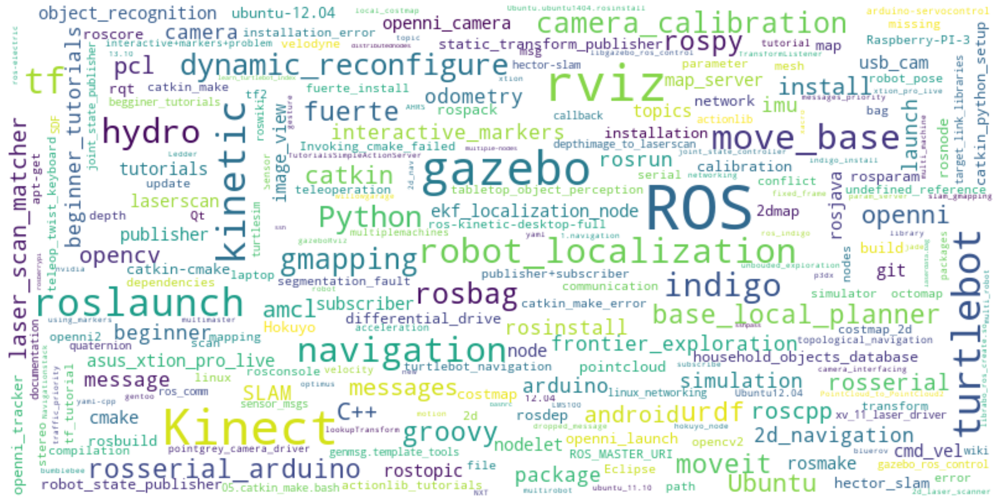

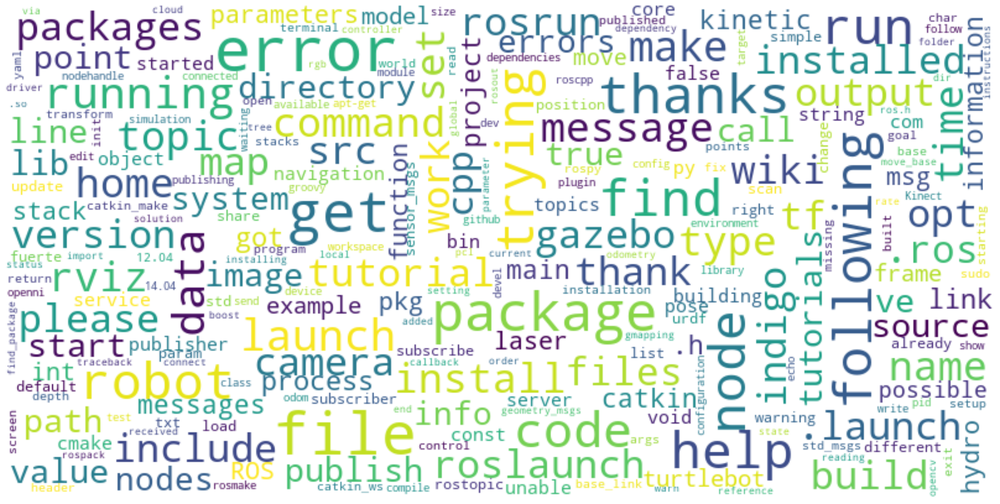

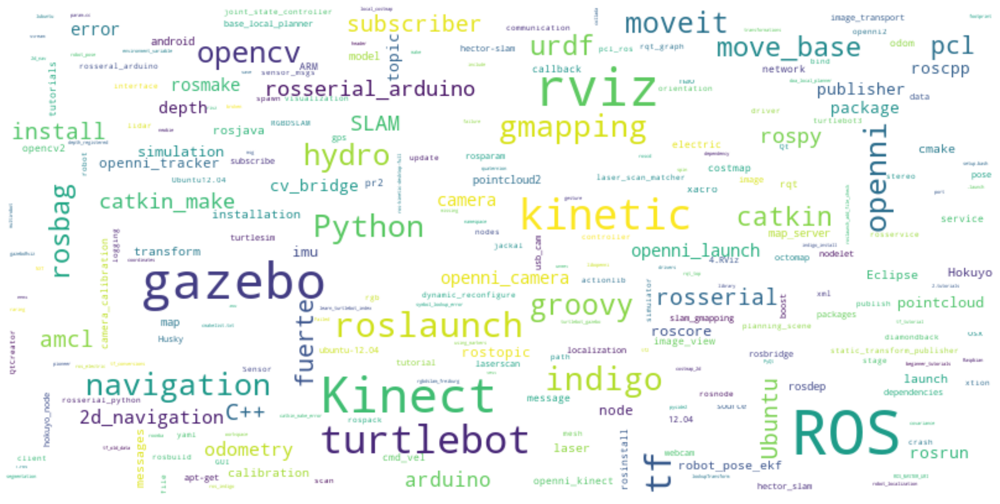

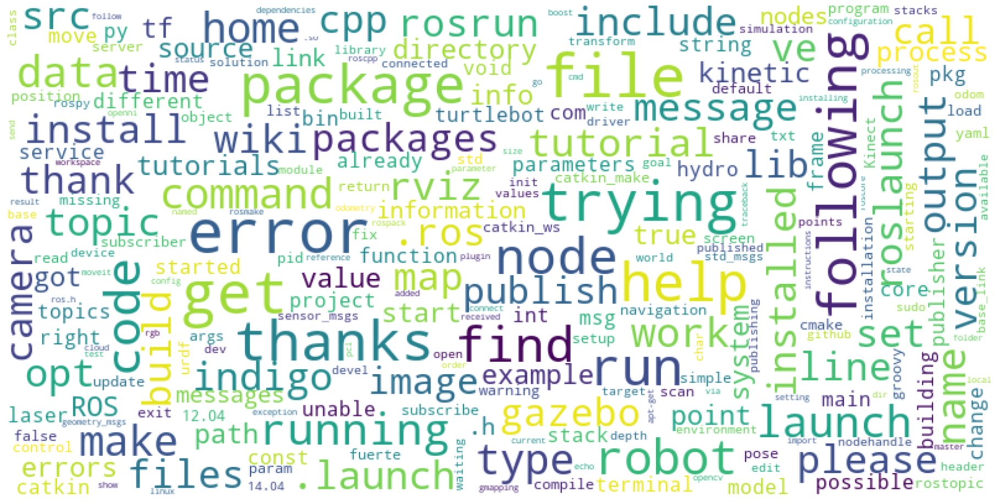

In [58]:
for scenario, tags in bad_tags_cnt.items():
    wordcloud_for_tags(tags).savefig('tags_bad_peformance_'+scenario+'.png', facecolor='k', bbox_inches='tight')

In [47]:
freq_tags_barchart(bad_tags_cnt,'A',100,'Poor')

In [48]:
freq_tags_barchart(bad_tags_cnt,'B',100,'Poor')

In [49]:
freq_tags_barchart(bad_tags_cnt,'C',100,'Poor')

In [50]:
freq_tags_barchart(bad_tags_cnt,'D',100,'Poor')

In [5]:
from src.algorithms.scenarios import *
sA = ScenarioA()
tagsA = set(sA.question_tag_container().tag_names_for(10712))
sB = ScenarioB()
tagsB = set(sB.question_tag_container().tag_names_for(10712))
tagsA.issubset(tagsB)


['object_manipulation',
 'pr2_tabletop_manipulation_apps',
 'pr2_object_manipulation',
 'object_manipulator']

In [78]:
a = [1]
a.extend([1,2,3])
a

[1, 1, 2, 3]